#Football Moneyball - Projeto TERA

## Importando bibliotecas

In [1]:
import pandas as pd
import numpy as np
from numpy import unique
from numpy import where
import seaborn as sns
import matplotlib.pyplot as plt
from statsmodels.stats.multicomp import pairwise_tukeyhsd
import statsmodels.formula.api as smf
import statsmodels.stats.api as sms
# Stats libs
import statsmodels.api as sm
from statsmodels.stats.outliers_influence import variance_inflation_factor
from statsmodels.compat import lzip
from statsmodels.stats.diagnostic import het_white
from statsmodels.graphics.regressionplots import *
# Scipy libs
from scipy import stats
from scipy.stats import shapiro
from scipy.stats import norm
from scipy import spatial
# Sklearn libs
from sklearn.linear_model import LinearRegression
from sklearn.linear_model import Ridge
from sklearn.linear_model import LogisticRegression
from sklearn.datasets import load_iris
from sklearn.model_selection import train_test_split
from sklearn.linear_model import LogisticRegression
from sklearn.metrics import (
    precision_score,
    recall_score,
    f1_score,
    accuracy_score,
    confusion_matrix,
    ConfusionMatrixDisplay,
    classification_report,
)
from sklearn.metrics import (
    mean_squared_error,
    r2_score,
    mean_absolute_percentage_error,
    mean_absolute_error,
)
from sklearn import preprocessing
from sklearn.preprocessing import (
    OneHotEncoder,
    StandardScaler,
    MinMaxScaler,
    RobustScaler,
    OrdinalEncoder,
)
from sklearn.decomposition import PCA
from sklearn.cluster import KMeans
from sklearn.multiclass import OneVsRestClassifier
from sklearn.tree import DecisionTreeClassifier
from sklearn.preprocessing import StandardScaler
from sklearn.inspection import permutation_importance
from sklearn.neighbors import KNeighborsClassifier
# Categorical encoders
!pip install category-encoders
import category_encoders as ce
from category_encoders.target_encoder import TargetEncoder
# Plotly for graphs
import plotly.express as px
import plotly.graph_objects as go

import operator

Looking in indexes: https://pypi.org/simple, https://us-python.pkg.dev/colab-wheels/public/simple/
     |████████████████████████████████| 72 kB 788 kB/s 


## Importar arquivo csv do Drive

In [2]:
# https://towardsdatascience.com/3-ways-to-load-csv-files-into-colab-7c14fcbdcb92
# Code to read csv file into Colaboratory:
!pip install -U -q PyDrive
from pydrive.auth import GoogleAuth
from pydrive.drive import GoogleDrive
from google.colab import auth
from oauth2client.client import GoogleCredentials

# Authenticate and create the PyDrive client.
auth.authenticate_user()
gauth = GoogleAuth()
gauth.credentials = GoogleCredentials.get_application_default()
drive = GoogleDrive(gauth)

In [3]:
#Link for the csv files
df_link = 'https://drive.google.com/file/d/1Avf3qq1BcWLhJWwYUFYjMYvK_rqhGlvX' # The shareable link

#Creating a list with the links from the players statistics csv files.
link_plist = [
    df_link
]

In [4]:
#Function to split the IDs from the links
def link_id(linkList):
  list = []
  for link in linkList:
    fluff, id = link.split('d/')
    list.append(id)
  return list

id_list = link_id(link_plist)
id_list

['1Avf3qq1BcWLhJWwYUFYjMYvK_rqhGlvX']

In [5]:
#Function to transform csv file in dataframe - list, id index position and year as variables
def csv_to_df(id_list, ind):
  downloaded = drive.CreateFile({'id':id_list[ind]}) 
  downloaded.GetContentFile('Camp_BR_2015_2022.csv') 
  df = pd.read_csv('Camp_BR_2015_2022.csv')
  return df

In [6]:
pd.set_option("display.max_columns", None) #display all the columns

In [7]:
df = csv_to_df(id_list, 0)
df

,player_id,player_name,player_firstname,player_lastname,player_age,player_birth_date,player_birth_place,player_birth_country,player_nationality,player_height,player_weight,player_injured,player_photo,Paging,statistics_team_id,statistics_team_name,statistics_team_logo,statistics_league_id,statistics_league_name,statistics_league_country,statistics_league_logo,statistics_league_flag,statistics_league_season,statistics_games_appearences,statistics_games_lineups,statistics_games_minutes,statistics_games_number,statistics_games_position,statistics_games_rating,statistics_games_captain,statistics_substitutes_in,statistics_substitutes_out,statistics_substitutes_bench,statistics_shots_total,statistics_shots_on,statistics_goals_total,statistics_goals_conceded,statistics_goals_assists,statistics_goals_saves,statistics_passes_total,statistics_passes_key,statistics_passes_accuracy,statistics_tackles_total,statistics_tackles_blocks,statistics_tackles_interceptions,statistics_duels_total,statistics_duels_won,statistics_dribbles_attempts,statistics_dribbles_success,statistics_dribbles_past,statistics_fouls_drawn,statistics_fouls_committed,statistics_cards_yellow,statistics_cards_yellowred,statistics_cards_red,statistics_penalty_won,statistics_penalty_commited,statistics_penalty_scored,statistics_penalty_missed,statistics_penalty_saved,nr_season,full_player_name,club_names_stats,club_names_tm,tm_player_value,name_match_score,name_match_name
0,9609,Danilo Gabriel de Andrade,Danilo Gabriel,de Andrade,40.0,1979-06-11,São Gotardo,Brazil,Brazil,186 cm,80 kg,False,https://media.api-sports.io/football/players/9...,1,131.0,Corinthians,https://media.api-sports.io/football/teams/131...,71,Serie A,Brazil,https://media.api-sports.io/football/leagues/7...,https://media.api-sports.io/flags/br.svg,2015,29.0,3.0,588.0,NaN,Midfielder,6.558333,False,26.0,2.0,35.0,4.0,1.0,0.0,NaN,2.0,NaN,161.0,5.0,82.0,NaN,NaN,4.0,63.0,27.0,4.0,0.0,NaN,7.0,11.0,2.0,0.0,0.0,NaN,NaN,0.0,0.0,NaN,2015,Danilo Gabriel de Andrade,Corinthians,Sport Club Corinthians Paulista,NaN,NaN,NaN
1,9728,Thalles Lima de Conceição Penha,Thalles,Lima de Conceição Penha,24.0,1995-05-18,Rio de Janeiro,Brazil,Brazil,185 cm,93 kg,False,https://media.api-sports.io/football/players/9...,1,133.0,Vasco DA Gama,https://media.api-sports.io/football/teams/133...,71,Serie A,Brazil,https://media.api-sports.io/football/leagues/7...,https://media.api-sports.io/flags/br.svg,2015,13.0,1.0,349.0,NaN,Attacker,6.400000,False,12.0,0.0,24.0,0.0,0.0,0.0,NaN,NaN,NaN,11.0,0.0,70.0,NaN,NaN,0.0,5.0,2.0,1.0,0.0,NaN,0.0,0.0,1.0,0.0,0.0,NaN,NaN,0.0,0.0,NaN,2015,Thalles Lima de Conceicao Penha,Vasco DA Gama,Club de Regatas Vasco da Gama,NaN,NaN,NaN
2,75777,Mariano Sebastián Trípodi,Mariano Sebastián,Trípodi,32.0,1987-07-03,Buenos Aires,Argentina,Argentina,181 cm,79 kg,False,https://media.api-sports.io/football/players/7...,1,795.0,Joinville,https://media.api-sports.io/football/teams/795...,71,Serie A,Brazil,https://media.api-sports.io/football/leagues/7...,https://media.api-sports.io/flags/br.svg,2015,3.0,1.0,120.0,NaN,Attacker,6.600000,False,2.0,0.0,11.0,3.0,0.0,1.0,NaN,NaN,NaN,17.0,1.0,65.0,NaN,NaN,0.0,17.0,7.0,0.0,0.0,NaN,1.0,3.0,0.0,0.0,0.0,NaN,NaN,0.0,0.0,NaN,2015,Mariano Sebastian Tripodi,Joinville,Joinville Esporte Clube (SC),NaN,NaN,NaN
3,77652,Marquinhos,Marcos Vicente,dos Santos,38.0,1981-09-29,Biguaçu,Brazil,Brazil,183 cm,85 kg,False,https://media.api-sports.io/football/players/7...,1,145.0,Avai,https://media.api-sports.io/football/teams/145...,71,Serie A,Brazil,https://media.api-sports.io/football/leagues/7...,https://media.api-sports.io/flags/br.svg,2015,14.0,13.0,1059.0,NaN,Midfielder,6.783333,False,1.0,7.0,1.0,6.0,2.0,2.0,NaN,NaN,NaN,139.0,9.0,64.0,NaN,NaN,3.0,31.0,14.0,3.0,1.0,NaN,7.0,5.0,5.0,0.0,0.0,NaN,1.0,0.0,0.0,NaN,2015,Marcos Vicente dos Santos,Avai,Avai Futebol Clube (SC),NaN,NaN,NaN
4,77661,Luiz Carlos dos Santos Junior,Luiz Carlos,dos Santos Junior,24.0,1995-03-16,Maceió,Brazil,Brazil,175 cm,66 kg,False,h

In [8]:
# from google.colab import files
# df_2022 = df[(df['statistics_league_season'] == 2022)]
# df_2022 = df_2022.drop(["player_age", "player_birth_place", "player_birth_country", "player_nationality", "player_photo", "Paging", "statistics_team_id", 
#      "statistics_team_name", "statistics_team_logo", "statistics_league_id", "statistics_league_name", "statistics_league_country", 
#      "statistics_league_logo", "statistics_league_flag", "statistics_games_number", "statistics_dribbles_past", "nr_season", "club_names_stats",
#      "name_match_score", "name_match_name"],
#     axis=1,)
# df_2022.to_csv('df_2022.csv')
# files.download('df_2022.csv')

## EDA

### Informações Gerais e Distribuições

#### EDA automática para primeira análise

In [9]:
# Library Pandas_Profiling for automatic EDA
!pip install sweetviz
import sweetviz as sv

my_report = sv.analyze(df)
my_report.show_html() # Default arguments will generate to "SWEETVIZ_REPORT.html"

Looking in indexes: https://pypi.org/simple, https://us-python.pkg.dev/colab-wheels/public/simple/
     |████████████████████████████████| 15.1 MB 23.0 MB/s 


                                             |          | [  0%]   00:00 -> (? left)

Report SWEETVIZ_REPORT.html was generated! NOTEBOOK/COLAB USERS: the web browser MAY not pop up, regardless, the report IS saved in your notebook/colab files.


#### Valores nulos

In [10]:
# Procurando por valores nulos e verificando os tipos de variáveis

df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 7811 entries, 0 to 7810
Data columns (total 67 columns):
 #   Column                            Non-Null Count  Dtype  
---  ------                            --------------  -----  
 0   player_id                         7811 non-null   int64  
 1   player_name                       7811 non-null   object 
 2   player_firstname                  7811 non-null   object 
 3   player_lastname                   7811 non-null   object 
 4   player_age                        7804 non-null   float64
 5   player_birth_date                 7804 non-null   object 
 6   player_birth_place                6756 non-null   object 
 7   player_birth_country              7811 non-null   object 
 8   player_nationality                7811 non-null   object 
 9   player_height                     6863 non-null   object 
 10  player_weight                     6562 non-null   object 
 11  player_injured                    7811 non-null   bool   
 12  player

In [11]:
# Verificando percentual de valores nulos

null_percentage = dict(df.isnull().mean().round(4) * 100)
null_percentage

{'player_id': 0.0,
 'player_name': 0.0,
 'player_firstname': 0.0,
 'player_lastname': 0.0,
 'player_age': 0.09,
 'player_birth_date': 0.09,
 'player_birth_place': 13.51,
 'player_birth_country': 0.0,
 'player_nationality': 0.0,
 'player_height': 12.139999999999999,
 'player_weight': 15.989999999999998,
 'player_injured': 0.0,
 'player_photo': 0.0,
 'Paging': 0.0,
 'statistics_team_id': 0.01,
 'statistics_team_name': 0.01,
 'statistics_team_logo': 0.01,
 'statistics_league_id': 0.0,
 'statistics_league_name': 0.0,
 'statistics_league_country': 0.0,
 'statistics_league_logo': 0.0,
 'statistics_league_flag': 0.0,
 'statistics_league_season': 0.0,
 'statistics_games_appearences': 4.47,
 'statistics_games_lineups': 4.47,
 'statistics_games_minutes': 4.47,
 'statistics_games_number': 100.0,
 'statistics_games_position': 0.0,
 'statistics_games_rating': 28.92,
 'statistics_games_captain': 0.0,
 'statistics_substitutes_in': 4.47,
 'statistics_substitutes_out': 4.47,
 'statistics_substitutes_be

In [12]:
# Verificando se as colunas de ano da temporada do API batem com o ano de temporada do webscrap

contador = 0
for ano in df["statistics_league_season"].tolist():
  if ano != df["nr_season"][contador]:
    print("Player_id:", df["player_id"][contador])
    print("nr_season:", df["nr_season"][contador])
  contador += 1

In [13]:
# Verificando se a variável player_age muda conforme a temporada

df_aux = df[df["player_id"]==9609]
df_aux

,player_id,player_name,player_firstname,player_lastname,player_age,player_birth_date,player_birth_place,player_birth_country,player_nationality,player_height,player_weight,player_injured,player_photo,Paging,statistics_team_id,statistics_team_name,statistics_team_logo,statistics_league_id,statistics_league_name,statistics_league_country,statistics_league_logo,statistics_league_flag,statistics_league_season,statistics_games_appearences,statistics_games_lineups,statistics_games_minutes,statistics_games_number,statistics_games_position,statistics_games_rating,statistics_games_captain,statistics_substitutes_in,statistics_substitutes_out,statistics_substitutes_bench,statistics_shots_total,statistics_shots_on,statistics_goals_total,statistics_goals_conceded,statistics_goals_assists,statistics_goals_saves,statistics_passes_total,statistics_passes_key,statistics_passes_accuracy,statistics_tackles_total,statistics_tackles_blocks,statistics_tackles_interceptions,statistics_duels_total,statistics_duels_won,statistics_dribbles_attempts,statistics_dribbles_success,statistics_dribbles_past,statistics_fouls_drawn,statistics_fouls_committed,statistics_cards_yellow,statistics_cards_yellowred,statistics_cards_red,statistics_penalty_won,statistics_penalty_commited,statistics_penalty_scored,statistics_penalty_missed,statistics_penalty_saved,nr_season,full_player_name,club_names_stats,club_names_tm,tm_player_value,name_match_score,name_match_name
0,9609,Danilo Gabriel de Andrade,Danilo Gabriel,de Andrade,40.0,1979-06-11,São Gotardo,Brazil,Brazil,186 cm,80 kg,False,https://media.api-sports.io/football/players/9...,1,131.0,Corinthians,https://media.api-sports.io/football/teams/131...,71,Serie A,Brazil,https://media.api-sports.io/football/leagues/7...,https://media.api-sports.io/flags/br.svg,2015,29.0,3.0,588.0,NaN,Midfielder,6.558333,False,26.0,2.0,35.0,4.0,1.0,0.0,NaN,2.0,NaN,161.0,5.0,82.0,NaN,NaN,4.0,63.0,27.0,4.0,0.0,NaN,7.0,11.0,2.0,0.0,0.0,NaN,NaN,0.0,0.0,NaN,2015,Danilo Gabriel de Andrade,Corinthians,Sport Club Corinthians Paulista,NaN,NaN,NaN
876,9609,Danilo Gabriel de Andrade,Danilo Gabriel,de Andrade,40.0,1979-06-11,São Gotardo,Brazil,Brazil,186 cm,80 kg,False,https://media.api-sports.io/football/players/9...,1,131.0,Corinthians,https://media.api-sports.io/football/teams/131...,71,Serie A,Brazil,https://media.api-sports.io/football/leagues/7...,https://media.api-sports.io/flags/br.svg,2016,6.0,1.0,228.0,NaN,Midfielder,6.533333,False,5.0,0.0,11.0,2.0,2.0,1.0,NaN,NaN,NaN,80.0,3.0,77.0,NaN,NaN,2.0,51.0,16.0,6.0,2.0,NaN,6.0,4.0,0.0,0.0,0.0,NaN,NaN,0.0,0.0,NaN,2016,Danilo Gabriel de Andrade,Corinthians,Sport Club Corinthians Paulista,€500Th.,93.0,Danilo Gabriel de Andrade
1918,9609,Danilo Gabriel de Andrade,Danilo Gabriel,de Andrade,40.0,1979-06-11,São Gotardo,Brazil,Brazil,186 cm,80 kg,False,https://media.api-sports.io/football/players/9...,1,131.0,Corinthians,https://media.api-sports.io/football/teams/131...,71,Serie A,Brazil,https://media.api-sports.io/football/leagues/7...,https://media.api-sports.io/flags/br.svg,2017,2.0,0.0,32.0,NaN,Midfielder,6.800000,False,2.0,0.0,13.0,0.0,0.0,0.0,NaN,NaN,NaN,7.0,1.0,43.0,NaN,NaN,1.0,5.0,2.0,1.0,0.0,NaN,2.0,0.0,0.0,0.0,0.0,NaN,NaN,0.0,0.0,NaN,2017,Danilo Gabriel de Andrade,Corinthians,Sport Club Corinthians Paulista,€500Th.,93.0,Danilo Gabriel de Andrade
2924,9609,Danilo Gabriel de Andrade,Danilo Gabriel,de Andrade,40.0,1979-06-11,São Gotardo,Brazil,Brazil,186 cm,80 kg,False,https://media.api-sports.io/football/players/9...,1,131.0,Corinthians,https://media.api-sports.io/football/teams/131...,71,Serie A,Brazil,https://media.api-sports.io/football/leagues/7...,https://media.api-sports.io/flags/br.svg,2018,13.0,6.0,488.0,NaN,Midfielder,6.738461,False,7.0,5.0,24.0,7.0,5.0,2.0,NaN,NaN,NaN,157.0,9.0,86.0,1.0,0.0,0.0,104.0,42.0,6.0,3.0,NaN,12.0,10.0,0.0,0.0,0.0,NaN,1.0,0.0,0.0,NaN,2018,Danilo Gabriel de Andrade,Corinthians,Sport Club Corinthians Paulista,€250Th.,93.0,Danilo Gabriel de Andrade


In [14]:
# Removendo variáveis do DataFrame
# Variáveis inconsistentes: player_age, player_injured
# Variáveis que não possuem influência no valor ou performance: "name_match_score", "player_birth_place", "player_birth_country", "player_nationality", "player_photo", "Paging", "statistics_team_id", "statistics_team_logo", "statistics_league_id", "statistics_league_name", "statistics_league_country", "statistics_league_logo", "statistics_league_flag"
# Variáveis duplicadas: "statistics_team_name", "nr_season", "club_names_stats", "name_match_name"
# Variáveis com poucos dados: "statistics_games_number", "statistics_dribbles_past"

df.drop(
    ["player_age", "player_birth_place", "player_birth_country", "player_nationality", "player_photo", "Paging", "statistics_team_id", 
     "statistics_team_name", "statistics_team_logo", "statistics_league_id", "statistics_league_name", "statistics_league_country", 
     "statistics_league_logo", "statistics_league_flag", "statistics_games_number", "statistics_dribbles_past", "nr_season", "club_names_stats",
     "name_match_score", "name_match_name"],
    axis=1,
    inplace=True,
)
df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 7811 entries, 0 to 7810
Data columns (total 47 columns):
 #   Column                            Non-Null Count  Dtype  
---  ------                            --------------  -----  
 0   player_id                         7811 non-null   int64  
 1   player_name                       7811 non-null   object 
 2   player_firstname                  7811 non-null   object 
 3   player_lastname                   7811 non-null   object 
 4   player_birth_date                 7804 non-null   object 
 5   player_height                     6863 non-null   object 
 6   player_weight                     6562 non-null   object 
 7   player_injured                    7811 non-null   bool   
 8   statistics_league_season          7811 non-null   int64  
 9   statistics_games_appearences      7462 non-null   float64
 10  statistics_games_lineups          7462 non-null   float64
 11  statistics_games_minutes          7462 non-null   float64
 12  statis

In [15]:
# Removendo linhas com valores NaN de variáveis que não podem ter valores assumidos em seu lugar

df.player_birth_date.dropna(axis=0, inplace=True)

# Removendo os jogadores que não jogaram nem ao menos 1 minuto no campeonato

df.statistics_games_minutes.dropna(axis=0, inplace=True)

In [16]:
# Verificando se a variável player_injured possui jogadores lesionados

df["player_injured"].unique()

array([False])

In [17]:
# Como a variável player_injured não possui jogadores lesionados, não faz sentido permanecer com a variável na análise

df.drop(["player_injured"], axis=1, inplace=True)

In [18]:
# Importante também removermos as linhas onde a variável target é nula
df.dropna(axis="index", subset=["tm_player_value"], inplace=True)
df.reset_index(inplace=True)

In [19]:
df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 4947 entries, 0 to 4946
Data columns (total 47 columns):
 #   Column                            Non-Null Count  Dtype  
---  ------                            --------------  -----  
 0   index                             4947 non-null   int64  
 1   player_id                         4947 non-null   int64  
 2   player_name                       4947 non-null   object 
 3   player_firstname                  4947 non-null   object 
 4   player_lastname                   4947 non-null   object 
 5   player_birth_date                 4947 non-null   object 
 6   player_height                     4645 non-null   object 
 7   player_weight                     4464 non-null   object 
 8   statistics_league_season          4947 non-null   int64  
 9   statistics_games_appearences      4918 non-null   float64
 10  statistics_games_lineups          4918 non-null   float64
 11  statistics_games_minutes          4918 non-null   float64
 12  statis

#### Separando variável target

In [20]:
# Separando variável target do df

X_df = df.copy()
y_df = df["tm_player_value"].copy()
X_df.drop(
    ["tm_player_value"],
    axis=1,
    inplace=True,
)
X_df.head()

,index,player_id,player_name,player_firstname,player_lastname,player_birth_date,player_height,player_weight,statistics_league_season,statistics_games_appearences,statistics_games_lineups,statistics_games_minutes,statistics_games_position,statistics_games_rating,statistics_games_captain,statistics_substitutes_in,statistics_substitutes_out,statistics_substitutes_bench,statistics_shots_total,statistics_shots_on,statistics_goals_total,statistics_goals_conceded,statistics_goals_assists,statistics_goals_saves,statistics_passes_total,statistics_passes_key,statistics_passes_accuracy,statistics_tackles_total,statistics_tackles_blocks,statistics_tackles_interceptions,statistics_duels_total,statistics_duels_won,statistics_dribbles_attempts,statistics_dribbles_success,statistics_fouls_drawn,statistics_fouls_committed,statistics_cards_yellow,statistics_cards_yellowred,statistics_cards_red,statistics_penalty_won,statistics_penalty_commited,statistics_penalty_scored,statistics_penalty_missed,statistics_penalty_saved,full_player_name,club_names_tm
0,876,9609,Danilo Gabriel de Andrade,Danilo Gabriel,de Andrade,1979-06-11,186 cm,80 kg,2016,6.0,1.0,228.0,Midfielder,6.533333,False,5.0,0.0,11.0,2.0,2.0,1.0,NaN,NaN,NaN,80.0,3.0,77.0,NaN,NaN,2.0,51.0,16.0,6.0,2.0,6.0,4.0,0.0,0.0,0.0,NaN,NaN,0.0,0.0,NaN,Danilo Gabriel de Andrade,Sport Club Corinthians Paulista
1,881,80586,Bruno Rangel Domingues,Bruno,Rangel Domingues,1981-12-11,NaN,NaN,2016,31.0,19.0,1878.0,Attacker,NaN,False,12.0,6.0,18.0,NaN,NaN,10.0,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,3.0,0.0,0.0,NaN,NaN,NaN,NaN,NaN,Bruno Rangel Domingues,Associacao Chapecoense de Futebol
2,882,80589,Matheus Bitencourt da Silva,Matheus,Bitencourt da Silva,1995-06-28,NaN,NaN,2016,13.0,10.0,967.0,Midfielder,NaN,False,3.0,1.0,11.0,NaN,NaN,0.0,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,1.0,0.0,0.0,NaN,NaN,NaN,NaN,NaN,Matheus Bitencourt da Silva,Associacao Chapecoense de Futebol
3,884,80602,Jose Nivaldo Martins Constante,Jose Nivaldo,Martins Constante,1974-03-19,186 cm,77 kg,2016,0.0,0.0,0.0,Goalkeeper,NaN,False,0.0,0.0,18.0,NaN,NaN,0.0,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,0.0,0.0,0.0,NaN,NaN,NaN,NaN,NaN,Jose Nivaldo Martins Constante,Associacao Chapecoense de Futebol
4,885,80605,Luciano Javier Cabral,Luciano Javier,Cabral,1995-04-26,170 cm,66 kg,2016,6.0,2.0,251.0,Midfielder,NaN,False,4.0,2.0,9.0,NaN,NaN,0.0,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,0.0,0.0,0.0,NaN,NaN,NaN,NaN,NaN,Luciano Javier Cabral,Club Athletico Paranaense


#### Verificações e curiosidades

In [21]:
# Quais posições concederam gols
X_df.groupby("statistics_games_position").statistics_goals_conceded.sum()

statistics_games_position
Attacker         0.0
Defender         0.0
Goalkeeper    5348.0
Midfielder      12.0
Name: statistics_goals_conceded, dtype: float64

In [22]:
# Jogadores que entregaram a rapadura
aux = X_df[(X_df["statistics_games_position"]=="Midfielder") & (X_df["statistics_goals_conceded"]>0)]
aux

,index,player_id,player_name,player_firstname,player_lastname,player_birth_date,player_height,player_weight,statistics_league_season,statistics_games_appearences,statistics_games_lineups,statistics_games_minutes,statistics_games_position,statistics_games_rating,statistics_games_captain,statistics_substitutes_in,statistics_substitutes_out,statistics_substitutes_bench,statistics_shots_total,statistics_shots_on,statistics_goals_total,statistics_goals_conceded,statistics_goals_assists,statistics_goals_saves,statistics_passes_total,statistics_passes_key,statistics_passes_accuracy,statistics_tackles_total,statistics_tackles_blocks,statistics_tackles_interceptions,statistics_duels_total,statistics_duels_won,statistics_dribbles_attempts,statistics_dribbles_success,statistics_fouls_drawn,statistics_fouls_committed,statistics_cards_yellow,statistics_cards_yellowred,statistics_cards_red,statistics_penalty_won,statistics_penalty_commited,statistics_penalty_scored,statistics_penalty_missed,statistics_penalty_saved,full_player_name,club_names_tm
1300,2707,50633,Marcão,Marcos Antônio,Almeida Silva,1991-01-14,185 cm,78 kg,2017,22.0,17.0,1591.0,Midfielder,6.816666,False,5.0,1.0,17.0,4.0,0.0,0.0,12.0,1.0,30.0,588.0,9.0,69.0,NaN,NaN,31.0,204.0,111.0,10.0,6.0,19.0,34.0,6.0,0.0,0.0,NaN,NaN,0.0,0.0,1.0,Marcos Antonio Almeida Silva,Atletico Clube Goianiense


In [23]:
# Jogador player_id 50633: rever dados de statistics_goals_conceded e statistics_penalty_saved
df[(df["player_id"]==50633)]

,index,player_id,player_name,player_firstname,player_lastname,player_birth_date,player_height,player_weight,statistics_league_season,statistics_games_appearences,statistics_games_lineups,statistics_games_minutes,statistics_games_position,statistics_games_rating,statistics_games_captain,statistics_substitutes_in,statistics_substitutes_out,statistics_substitutes_bench,statistics_shots_total,statistics_shots_on,statistics_goals_total,statistics_goals_conceded,statistics_goals_assists,statistics_goals_saves,statistics_passes_total,statistics_passes_key,statistics_passes_accuracy,statistics_tackles_total,statistics_tackles_blocks,statistics_tackles_interceptions,statistics_duels_total,statistics_duels_won,statistics_dribbles_attempts,statistics_dribbles_success,statistics_fouls_drawn,statistics_fouls_committed,statistics_cards_yellow,statistics_cards_yellowred,statistics_cards_red,statistics_penalty_won,statistics_penalty_commited,statistics_penalty_scored,statistics_penalty_missed,statistics_penalty_saved,full_player_name,club_names_tm,tm_player_value
1300,2707,50633,Marcão,Marcos Antônio,Almeida Silva,1991-01-14,185 cm,78 kg,2017,22.0,17.0,1591.0,Midfielder,6.816666,False,5.0,1.0,17.0,4.0,0.0,0.0,12.0,1.0,30.0,588.0,9.0,69.0,NaN,NaN,31.0,204.0,111.0,10.0,6.0,19.0,34.0,6.0,0.0,0.0,NaN,NaN,0.0,0.0,1.0,Marcos Antonio Almeida Silva,Atletico Clube Goianiense,€150Th.
1997,3679,50633,Marcão,Marcos Antônio,Almeida Silva,1991-01-14,185 cm,78 kg,2018,15.0,15.0,1248.0,Midfielder,6.666666,False,0.0,5.0,0.0,3.0,0.0,0.0,NaN,NaN,NaN,391.0,8.0,78.0,18.0,3.0,13.0,160.0,87.0,13.0,9.0,15.0,29.0,2.0,0.0,0.0,NaN,NaN,0.0,0.0,NaN,Marcos Antonio Almeida Silva,Sport Club do Recife,€400Th.
3367,5457,50633,Marcão,Marcos Antônio,Almeida Silva,1991-01-14,185 cm,78 kg,2020,26.0,22.0,1928.0,Midfielder,6.760000,False,4.0,10.0,10.0,13.0,3.0,2.0,0.0,NaN,NaN,696.0,7.0,28.0,36.0,7.0,30.0,228.0,105.0,24.0,17.0,17.0,48.0,8.0,0.0,0.0,NaN,NaN,0.0,0.0,NaN,Marcos Antonio Almeida Silva,Sport Club do Recife,€550Th.
4077,6413,50633,Marcão,Marcos Antônio,Almeida Silva,1991-01-14,185 cm,78 kg,2021,34.0,34.0,3036.0,Midfielder,6.626470,False,0.0,2.0,1.0,11.0,6.0,1.0,0.0,1.0,NaN,1229.0,13.0,31.0,54.0,15.0,39.0,366.0,150.0,34.0,18.0,26.0,68.0,9.0,0.0,0.0,NaN,NaN,0.0,0.0,NaN,Marcos Antonio Almeida Silva,Sport Club do Recife,€400Th.
4776,7562,50633,Marcão,Marcos Antônio,Almeida Silva,1991-01-14,185 cm,78 kg,2022,14.0,3.0,461.0,Midfielder,6.491666,False,11.0,1.0,18.0,6.0,3.0,0.0,0.0,NaN,NaN,93.0,NaN,7.0,5.0,1.0,5.0,52.0,23.0,8.0,5.0,1.0,9.0,0.0,0.0,0.0,NaN,NaN,0.0,0.0,NaN,Marcos Antonio Almeida Silva,Cuiaba Esporte Clube (MT),€300Th.


In [24]:
# Verificamos que o jogador Marcão não tomou 12 gols na temporada 2017

X_df["statistics_goals_conceded"][1300] = 0

/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:3: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  This is separate from the ipykernel package so we can avoid doing imports until


In [25]:
# Apenas goleiros defenderam pênaltis?
X_df.groupby("statistics_games_position").statistics_penalty_saved.sum()

statistics_games_position
Attacker        0.0
Defender        0.0
Goalkeeper    163.0
Midfielder      1.0
Name: statistics_penalty_saved, dtype: float64

In [26]:
# Jogador que defendeu pênalti
aux = X_df[(X_df["statistics_games_position"]=="Midfielder") & (X_df["statistics_penalty_saved"]>0)]
aux

,index,player_id,player_name,player_firstname,player_lastname,player_birth_date,player_height,player_weight,statistics_league_season,statistics_games_appearences,statistics_games_lineups,statistics_games_minutes,statistics_games_position,statistics_games_rating,statistics_games_captain,statistics_substitutes_in,statistics_substitutes_out,statistics_substitutes_bench,statistics_shots_total,statistics_shots_on,statistics_goals_total,statistics_goals_conceded,statistics_goals_assists,statistics_goals_saves,statistics_passes_total,statistics_passes_key,statistics_passes_accuracy,statistics_tackles_total,statistics_tackles_blocks,statistics_tackles_interceptions,statistics_duels_total,statistics_duels_won,statistics_dribbles_attempts,statistics_dribbles_success,statistics_fouls_drawn,statistics_fouls_committed,statistics_cards_yellow,statistics_cards_yellowred,statistics_cards_red,statistics_penalty_won,statistics_penalty_commited,statistics_penalty_scored,statistics_penalty_missed,statistics_penalty_saved,full_player_name,club_names_tm
1300,2707,50633,Marcão,Marcos Antônio,Almeida Silva,1991-01-14,185 cm,78 kg,2017,22.0,17.0,1591.0,Midfielder,6.816666,False,5.0,1.0,17.0,4.0,0.0,0.0,0.0,1.0,30.0,588.0,9.0,69.0,NaN,NaN,31.0,204.0,111.0,10.0,6.0,19.0,34.0,6.0,0.0,0.0,NaN,NaN,0.0,0.0,1.0,Marcos Antonio Almeida Silva,Atletico Clube Goianiense


In [27]:
# Verificamos que o jogador Marcão não defendeu pênalti na temporada 2017

X_df["statistics_penalty_saved"][1300] = 0

/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:3: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  This is separate from the ipykernel package so we can avoid doing imports until


In [28]:
# Jogadores acima de 100kg
aux = X_df[(X_df["statistics_penalty_saved"]>=100)]
aux

,index,player_id,player_name,player_firstname,player_lastname,player_birth_date,player_height,player_weight,statistics_league_season,statistics_games_appearences,statistics_games_lineups,statistics_games_minutes,statistics_games_position,statistics_games_rating,statistics_games_captain,statistics_substitutes_in,statistics_substitutes_out,statistics_substitutes_bench,statistics_shots_total,statistics_shots_on,statistics_goals_total,statistics_goals_conceded,statistics_goals_assists,statistics_goals_saves,statistics_passes_total,statistics_passes_key,statistics_passes_accuracy,statistics_tackles_total,statistics_tackles_blocks,statistics_tackles_interceptions,statistics_duels_total,statistics_duels_won,statistics_dribbles_attempts,statistics_dribbles_success,statistics_fouls_drawn,statistics_fouls_committed,statistics_cards_yellow,statistics_cards_yellowred,statistics_cards_red,statistics_penalty_won,statistics_penalty_commited,statistics_penalty_scored,statistics_penalty_missed,statistics_penalty_saved,full_player_name,club_names_tm


In [29]:
# Informações estatísticas sobre o dataset
X_df.describe()

# 

,index,player_id,statistics_league_season,statistics_games_appearences,statistics_games_lineups,statistics_games_minutes,statistics_games_rating,statistics_substitutes_in,statistics_substitutes_out,statistics_substitutes_bench,statistics_shots_total,statistics_shots_on,statistics_goals_total,statistics_goals_conceded,statistics_goals_assists,statistics_goals_saves,statistics_passes_total,statistics_passes_key,statistics_passes_accuracy,statistics_tackles_total,statistics_tackles_blocks,statistics_tackles_interceptions,statistics_duels_total,statistics_duels_won,statistics_dribbles_attempts,statistics_dribbles_success,statistics_fouls_drawn,statistics_fouls_committed,statistics_cards_yellow,statistics_cards_yellowred,statistics_cards_red,statistics_penalty_won,statistics_penalty_commited,statistics_penalty_scored,statistics_penalty_missed,statistics_penalty_saved
count,4947.000000,4947.000000,4947.000000,4918.000000,4918.000000,4918.000000,4316.000000,4918.000000,4918.000000,4918.000000,4048.000000,3873.000000,4918.000000,2113.000000,1704.000000,318.000000,4321.000000,4061.000000,4317.000000,2739.000000,2535.000000,4077.000000,4183.000000,4175.000000,4098.000000,4042.000000,4168.000000,4160.000000,4918.000000,4918.000000,4918.000000,249.000000,305.000000,4477.000000,4477.000000,373.000000
mean,4294.802709,36422.909642,2018.935921,13.703131,10.508337,941.016063,6.795200,3.194795,3.371492,9.744408,12.992095,4.912987,1.087841,2.530999,2.099765,43.509434,389.203888,10.741689,54.219597,15.568456,3.778698,13.557273,104.343294,52.344671,17.028795,9.913657,15.264635,16.250721,2.192355,0.050224,0.068524,1.248996,1.216393,0.120170,0.040205,0.436997
std,1949.404116,59509.998750,1.966598,10.798830,10.300658,893.416684,0.254198,3.918101,4.376809,8.474318,15.900448,6.628569,2.228189,8.269726,1.646905,38.730708,386.031956,13.179735,28.757865,15.120793,5.488916,16.523379,101.547596,52.084528,22.512604,13.052697,16.976184,15.255455,2.469831,0.231975,0.269041,0.569954,0.457820,0.555127,0.211786,0.761594
min,876.000000,34.000000,2016.000000,0.000000,0.000000,0.000000,5.200000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,1.000000,0.000000,0.000000,0.000000,0.000000,1.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,1.000000,1.000000,0.000000,0.000000,0.000000
25%,2624.500000,9939.000000,2017.000000,4.000000,1.000000,152.250000,6.641995,0.000000,0.000000,3.000000,2.000000,1.000000,0.000000,0.000000,1.000000,9.000000,88.000000,2.000000,25.000000,4.000000,0.000000,2.000000,24.000000,12.000000,2.000000,1.000000,3.000000,4.000000,0.000000,0.000000,0.000000,1.000000,1.000000,0.000000,0.000000,0.000000
50%,4278.000000,10276.000000,2019.000000,12.000000,7.000000,664.000000,6.797009,2.000000,2.000000,8.000000,8.000000,3.000000,0.000000,0.000000,1.000000,33.500000,256.000000,6.000000,66.000000,11.000000,2.000000,7.000000,71.000000,34.000000,9.000000,5.000000,10.000000,12.000000,1.000000,0.000000,0.000000,1.000000,1.000000,0.000000,0.000000,0.000000
75%,5968.500000,41227.000000,2021.000000,22.000000,18.000000,1544.000000,6.951851,5.000000,5.000000,15.000000,17.000000,6.000000,1.000000,0.000000,3.000000,73.000000,577.000000,15.000000,80.000000,22.000000,5.000000,19.000000,161.500000,78.000000,23.000000,13.000000,21.000000,24.000000,3.000000,0.000000,0.000000,1.000000,1.000000,0.000000,0.000000,1.000000
max,7801.000000,377122.000000,2022.000000,38.000000,38.000000,3420.000000,7.933333,24.000000,31.000000,38.000000,122.000000,57.000000,25.000000,57.000000,14.000000,143.000000,2767.000000,112.000000,100.000000,112.000000,38.000000,115.000000,647.000000,310.000000,197.000000,114.000000,142.000000,121.000000,15.000000,3.000000,3.000000,4.000000,3.000000,7.000000,2.000000,4.000000


In [30]:
# Informações estatísticas sobre os goleiros

X_df[(X_df["statistics_games_position"]=="Goalkeeper")].describe(percentiles=[.25, .5, .75, .99])

# altura média 1.81m
# peso médio 85kg
# média de 11 gols tomados
# média de 28 defesas e 25% dos goleiros fazem mais de 51 defesas
# 1% dos goleiros pegam mais de 3 pênaltis por temporada
# idade média 28 anos

,index,player_id,statistics_league_season,statistics_games_appearences,statistics_games_lineups,statistics_games_minutes,statistics_games_rating,statistics_substitutes_in,statistics_substitutes_out,statistics_substitutes_bench,statistics_shots_total,statistics_shots_on,statistics_goals_total,statistics_goals_conceded,statistics_goals_assists,statistics_goals_saves,statistics_passes_total,statistics_passes_key,statistics_passes_accuracy,statistics_tackles_total,statistics_tackles_blocks,statistics_tackles_interceptions,statistics_duels_total,statistics_duels_won,statistics_dribbles_attempts,statistics_dribbles_success,statistics_fouls_drawn,statistics_fouls_committed,statistics_cards_yellow,statistics_cards_yellowred,statistics_cards_red,statistics_penalty_won,statistics_penalty_commited,statistics_penalty_scored,statistics_penalty_missed,statistics_penalty_saved
count,484.000000,484.000000,484.000000,478.000000,478.000000,478.000000,317.000000,478.000000,478.000000,478.000000,216.000000,214.000000,478.000000,372.000000,13.000000,314.000000,317.000000,237.000000,317.000000,60.000000,125.000000,233.000000,282.000000,282.000000,233.000000,233.000000,279.000000,230.000000,478.000000,478.000000,478.000000,0.0,0.0,374.000000,374.0,372.000000
mean,4264.613636,33841.167355,2018.915289,10.064854,9.935146,894.510460,6.891953,0.129707,0.102510,11.439331,0.199074,0.079439,0.018828,14.376344,1.076923,43.958599,263.968454,0.599156,41.340694,1.316667,0.008000,1.386266,10.375887,8.258865,0.918455,0.678112,2.971326,0.743478,0.728033,0.008368,0.029289,NaN,NaN,0.018717,0.0,0.438172
std,1962.447986,55909.137815,1.978940,12.524106,12.539831,1124.374373,0.345492,0.377452,0.354595,10.803926,0.970351,0.501872,0.254233,14.783916,0.277350,38.744451,270.028056,1.779021,21.913178,0.567231,0.089443,6.020524,25.305405,14.154222,5.300232,2.886397,4.466410,4.341264,1.149828,0.091190,0.168791,NaN,NaN,0.236535,0.0,0.762281
min,884.000000,280.000000,2016.000000,0.000000,0.000000,0.000000,5.200000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,1.000000,0.000000,2.000000,0.000000,2.000000,1.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,NaN,NaN,0.000000,0.0,0.000000
25%,2574.000000,9941.000000,2017.000000,0.000000,0.000000,0.000000,6.711111,0.000000,0.000000,1.000000,0.000000,0.000000,0.000000,1.000000,1.000000,9.000000,47.000000,0.000000,18.000000,1.000000,0.000000,0.000000,2.000000,2.000000,0.000000,0.000000,1.000000,0.000000,0.000000,0.000000,0.000000,NaN,NaN,0.000000,0.0,0.000000
50%,4210.000000,10228.000000,2019.000000,3.000000,3.000000,270.000000,6.933333,0.000000,0.000000,8.000000,0.000000,0.000000,0.000000,9.000000,1.000000,35.000000,180.000000,0.000000,47.000000,1.000000,0.000000,0.000000,6.000000,5.000000,0.000000,0.000000,2.000000,0.000000,0.000000,0.000000,0.000000,NaN,NaN,0.000000,0.0,0.000000
75%,5911.250000,10548.250000,2021.000000,19.000000,19.000000,1710.000000,7.072222,0.000000,0.000000,19.000000,0.000000,0.000000,0.000000,25.250000,1.000000,73.750000,407.000000,1.000000,59.000000,2.000000,0.000000,1.000000,13.000000,11.000000,1.000000,1.000000,4.000000,1.000000,1.000000,0.000000,0.000000,NaN,NaN,0.000000,0.0,1.000000
99%,7686.680000,298010.860000,2022.000000,38.000000,38.000000,3420.000000,7.700000,1.230000,1.000000,37.000000,5.000000,2.000000,0.000000,51.870000,1.880000,129.740000,1099.800000,5.640000,79.680000,3.000000,0.000000,6.000000,31.330000,29.330000,4.680000,4.680000,11.220000,3.000000,5.000000,0.000000,1.000000,NaN,NaN,0.000000,0.0,4.000000
max,7778.000000,321454.000000,2022.000000,38.000000,38.000000,3420.000000,7.900000,3.000000,3.000000,38.000000,8.000000,6.000000,5.000000,57.000000,2.000000,143.000000,1247.000000,18.000000,100.000000,3.000000,1.000000,75.000000,340.000000,176.000000,65.000000,31.000000,51.000000,53.000000,6.000000,1.000000,1.000000,NaN,NaN,4.000000,0.0,4.000000


In [31]:
# Informações estatísticas sobre os defensores

X_df[(X_df["statistics_games_position"]=="Defender")].describe(percentiles=[.25, .5, .75, .99])

# Altura média 1.76m
# Peso médio 77kg
# Mais de 50% dos defensores jogam mais da metade do número de partidas no campeonato (19)
# Número médio de embates 11
# Número médio de bloqueios 4
# Número médio de interceptações 19
# Média de duelos 92
# Média de duelos ganhos 52
# Número médio de faltas cometidas 15
# Número médio de cartões amarelos 2.6
# número médio de cartões vermelhos 0.08
# Número médio de pênaltis cometidos 0.18
# Idade média 26.6

,index,player_id,statistics_league_season,statistics_games_appearences,statistics_games_lineups,statistics_games_minutes,statistics_games_rating,statistics_substitutes_in,statistics_substitutes_out,statistics_substitutes_bench,statistics_shots_total,statistics_shots_on,statistics_goals_total,statistics_goals_conceded,statistics_goals_assists,statistics_goals_saves,statistics_passes_total,statistics_passes_key,statistics_passes_accuracy,statistics_tackles_total,statistics_tackles_blocks,statistics_tackles_interceptions,statistics_duels_total,statistics_duels_won,statistics_dribbles_attempts,statistics_dribbles_success,statistics_fouls_drawn,statistics_fouls_committed,statistics_cards_yellow,statistics_cards_yellowred,statistics_cards_red,statistics_penalty_won,statistics_penalty_commited,statistics_penalty_scored,statistics_penalty_missed,statistics_penalty_saved
count,1565.000000,1565.000000,1565.000000,1557.000000,1557.000000,1557.000000,1374.000000,1557.000000,1557.000000,1557.000000,1306.000000,1223.000000,1557.000000,620.0,480.000000,1.0,1377.000000,1288.000000,1376.000000,949.000000,928.000000,1353.000000,1341.000000,1339.000000,1299.000000,1276.000000,1333.000000,1345.000000,1557.000000,1557.000000,1557.000000,44.000000,215.000000,1424.000000,1424.000000,0.0
mean,4336.358466,33186.049201,2018.977636,13.857418,12.296724,1097.953757,6.847604,1.560694,1.647399,8.704560,7.665391,2.490597,0.474631,0.0,1.818750,1.0,515.145243,8.513199,58.762355,18.200211,6.981681,22.308943,107.436987,60.322629,12.748268,7.716301,12.329332,16.910037,2.572897,0.075787,0.078998,1.090909,1.279070,0.038624,0.009831,NaN
std,1957.336374,56788.042400,1.974618,10.600976,10.464928,925.027831,0.232705,2.354167,2.231381,8.089478,7.801404,2.813290,0.928085,0.0,1.262293,NaN,419.464227,10.530814,25.782013,15.461261,7.243841,19.416504,89.520805,51.382346,16.081186,9.365824,12.192415,13.357997,2.571719,0.287996,0.290469,0.290803,0.508139,0.332029,0.098700,NaN
min,897.000000,34.000000,2016.000000,0.000000,0.000000,0.000000,6.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.0,1.000000,1.0,0.000000,0.000000,0.000000,1.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,1.000000,1.000000,0.000000,0.000000,NaN
25%,2666.000000,9908.000000,2017.000000,5.000000,3.000000,281.000000,6.714285,0.000000,0.000000,2.000000,2.000000,1.000000,0.000000,0.0,1.000000,1.0,174.000000,2.000000,34.000000,6.000000,2.000000,7.000000,34.000000,19.000000,2.000000,1.000000,3.000000,6.000000,0.000000,0.000000,0.000000,1.000000,1.000000,0.000000,0.000000,NaN
50%,4314.000000,10230.000000,2019.000000,13.000000,10.000000,930.000000,6.850000,1.000000,1.000000,6.000000,5.000000,2.000000,0.000000,0.0,1.000000,1.0,419.000000,4.000000,72.000000,14.000000,4.000000,17.000000,81.000000,45.000000,7.000000,4.000000,9.000000,13.000000,2.000000,0.000000,0.000000,1.000000,1.000000,0.000000,0.000000,NaN
75%,6028.000000,30398.000000,2021.000000,22.000000,20.000000,1753.000000,7.000000,2.000000,2.000000,14.000000,11.000000,4.000000,1.000000,0.0,2.000000,1.0,766.000000,11.000000,81.000000,26.000000,9.000000,33.000000,168.000000,96.000000,17.500000,10.000000,17.000000,25.000000,4.000000,0.000000,0.000000,1.000000,1.500000,0.000000,0.000000,NaN
99%,7728.360000,305866.720000,2022.000000,36.000000,35.000000,3168.480000,7.363314,11.000000,10.440000,31.440000,35.000000,13.000000,4.000000,0.0,6.210000,1.0,1713.400000,46.130000,92.000000,64.040000,32.730000,85.480000,366.600000,206.480000,71.000000,40.250000,55.360000,54.000000,10.000000,1.000000,1.000000,2.000000,3.000000,1.000000,0.000000,NaN
max,7777.000000,359372.000000,2022.000000,37.000000,37.000000,3330.000000,7.700000,17.000000,17.000000,35.000000,69.000000,25.000000,7.000000,0.0,8.000000,1.0,2767.000000,74.000000,100.000000,112.000000,38.000000,115.000000,454.000000,254.000000,129.000000,73.000000,83.000000,76.000000,13.000000,3.000000,2.000000,2.000000,3.000000,5.000000,1.000000,NaN


In [32]:
# Informações estatísticas sobre os meio-campos

X_df[(X_df["statistics_games_position"]=="Midfielder")].describe(percentiles=[.25, .5, .75, .99])

# Altura média 1.71m
# Peso médio 72.7kg
# Número médio de jogos 14.6
# Número médio de chutes 12.7
# Número médio de chutes ao gol 4.3
# Número médio de gols 1
# Número médio de assistências 0.9
# Número médio de interceptações 12
# Meio-campos vencem menos de 50% dos duelos em média
# Número médio de tentativas de dribles 16.5, onde 61% saem vitoriosos
# Idade média 26

,index,player_id,statistics_league_season,statistics_games_appearences,statistics_games_lineups,statistics_games_minutes,statistics_games_rating,statistics_substitutes_in,statistics_substitutes_out,statistics_substitutes_bench,statistics_shots_total,statistics_shots_on,statistics_goals_total,statistics_goals_conceded,statistics_goals_assists,statistics_goals_saves,statistics_passes_total,statistics_passes_key,statistics_passes_accuracy,statistics_tackles_total,statistics_tackles_blocks,statistics_tackles_interceptions,statistics_duels_total,statistics_duels_won,statistics_dribbles_attempts,statistics_dribbles_success,statistics_fouls_drawn,statistics_fouls_committed,statistics_cards_yellow,statistics_cards_yellowred,statistics_cards_red,statistics_penalty_won,statistics_penalty_commited,statistics_penalty_scored,statistics_penalty_missed,statistics_penalty_saved
count,1641.000000,1641.000000,1641.000000,1637.000000,1637.000000,1637.000000,1481.000000,1637.000000,1637.000000,1637.000000,1420.000000,1351.000000,1637.000000,628.0,669.000000,3.000000,1484.000000,1428.000000,1484.000000,994.000000,865.000000,1437.000000,1448.000000,1446.000000,1446.000000,1430.000000,1438.000000,1463.000000,1637.000000,1637.000000,1637.000000,71.000000,63.000000,1511.000000,1511.000000,1.0
mean,4217.673370,37746.932358,2018.869592,14.620037,10.573610,934.985950,6.787724,4.046426,4.825901,10.099572,14.652817,5.202813,1.069029,0.0,2.189836,10.666667,445.566712,13.811625,57.347035,18.640845,2.952601,13.796103,113.957873,56.098893,18.764869,11.538462,18.214186,18.601504,2.551619,0.055589,0.077581,1.225352,1.079365,0.125745,0.043018,0.0
std,1961.694088,61254.923568,1.974547,10.544053,9.992185,849.679995,0.243786,3.857365,4.742990,8.284178,16.176568,6.146389,1.869391,0.0,1.735889,16.743158,416.302592,15.431752,29.150160,16.948556,3.372179,15.445142,106.521453,54.565214,21.946491,13.462993,18.540520,16.718820,2.668398,0.239628,0.291639,0.539767,0.272479,0.528717,0.215621,NaN
min,876.000000,150.000000,2016.000000,0.000000,0.000000,0.000000,5.200000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.0,1.000000,1.000000,0.000000,0.000000,0.000000,1.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,1.000000,1.000000,0.000000,0.000000,0.0
25%,2533.000000,9932.000000,2017.000000,5.000000,2.000000,180.000000,6.650000,1.000000,1.000000,3.000000,3.000000,1.000000,0.000000,0.0,1.000000,1.000000,111.000000,3.000000,27.000000,6.000000,1.000000,3.000000,29.750000,13.000000,4.000000,2.000000,5.000000,5.000000,0.000000,0.000000,0.000000,1.000000,1.000000,0.000000,0.000000,0.0
50%,4198.000000,10258.000000,2019.000000,14.000000,8.000000,698.000000,6.783333,3.000000,4.000000,9.000000,9.000000,3.000000,0.000000,0.0,2.000000,1.000000,316.000000,9.000000,73.000000,14.000000,2.000000,8.000000,77.000000,38.000000,11.000000,7.000000,12.000000,14.000000,2.000000,0.000000,0.000000,1.000000,1.000000,0.000000,0.000000,0.0
75%,5907.000000,42230.000000,2021.000000,23.000000,18.000000,1510.000000,6.926666,6.000000,8.000000,15.000000,21.000000,7.000000,1.000000,0.0,3.000000,15.500000,666.250000,19.000000,82.000000,27.000000,4.000000,19.000000,172.000000,86.000000,25.750000,16.000000,26.000000,28.000000,4.000000,0.000000,0.000000,1.000000,1.000000,0.000000,0.000000,0.0
99%,7730.600000,305459.000000,2022.000000,36.000000,35.000000,3013.640000,7.390000,16.000000,19.000000,32.000000,74.620000,27.500000,9.000000,0.0,9.000000,29.420000,1710.890000,69.000000,95.000000,76.070000,15.360000,67.640000,426.590000,229.650000,101.550000,63.420000,77.630000,68.000000,10.640000,1.000000,1.000000,3.000000,2.000000,3.000000,1.000000,0.0
max,7801.000000,377122.000000,2022.000000,38.000000,38.000000,3368.000000,7.708695,20.000000,24.000000,37.000000,122.000000,53.000000,18.000000,0.0,14.000000,30.000000,2273.000000,112.000000,100.000000,100.000000,21.000000,100.000000,647.000000,310.000000,195.000000,114.000000,138.000000,121.000000,15.000000,2.0

In [33]:
# Informações estatísticas sobre os atacantes

X_df[(X_df["statistics_games_position"]=="Attacker")].describe()

# Altura média 1.72m
# Peso médio 73.8kg
# Em média, participam de 14 jogos no campeonato, ou 764 min
# Número médio de chutes 17.3
# Número médio de chutes ao gol 7.4
# Número médio de gols 2.3
# Número médio de assistências 1.0
# Ganham menos da metade do número de duelos
# Acertam cerca de 50% dos dribles
# Idade média 25.8

,index,player_id,statistics_league_season,statistics_games_appearences,statistics_games_lineups,statistics_games_minutes,statistics_games_rating,statistics_substitutes_in,statistics_substitutes_out,statistics_substitutes_bench,statistics_shots_total,statistics_shots_on,statistics_goals_total,statistics_goals_conceded,statistics_goals_assists,statistics_goals_saves,statistics_passes_total,statistics_passes_key,statistics_passes_accuracy,statistics_tackles_total,statistics_tackles_blocks,statistics_tackles_interceptions,statistics_duels_total,statistics_duels_won,statistics_dribbles_attempts,statistics_dribbles_success,statistics_fouls_drawn,statistics_fouls_committed,statistics_cards_yellow,statistics_cards_yellowred,statistics_cards_red,statistics_penalty_won,statistics_penalty_commited,statistics_penalty_scored,statistics_penalty_missed,statistics_penalty_saved
count,1257.000000,1257.000000,1257.000000,1246.000000,1246.000000,1246.000000,1144.000000,1246.000000,1246.000000,1246.000000,1106.000000,1085.000000,1246.000000,493.0,542.000000,0.0,1143.000000,1108.000000,1140.000000,736.000000,617.000000,1054.000000,1112.000000,1108.000000,1120.000000,1103.000000,1118.000000,1122.000000,1246.000000,1246.000000,1246.000000,134.000000,27.000000,1168.000000,1168.000000,0.0
mean,4355.380270,39718.477327,2018.978520,13.701445,8.407705,770.670144,6.715130,5.293740,4.869181,9.926966,19.648282,8.235945,2.288925,0.0,2.261993,NaN,199.034121,11.545126,48.246491,9.187500,0.883306,4.687856,111.922662,49.024368,23.103571,12.300091,18.038462,15.573975,1.806581,0.027287,0.058587,1.313433,1.037037,0.244863,0.086473,NaN
std,1916.854615,61643.925943,1.941095,10.377801,9.065265,767.583549,0.237798,4.667627,5.194040,8.017469,20.110603,8.861980,3.400211,0.0,1.809197,NaN,206.594321,12.644709,31.180487,8.730284,1.150662,5.427788,108.530464,49.988403,28.490438,15.928654,19.588546,14.952687,2.153989,0.167841,0.238339,0.642105,0.192450,0.800583,0.310162,NaN
min,881.000000,54.000000,2016.000000,0.000000,0.000000,0.000000,5.250000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.0,1.000000,NaN,0.000000,0.000000,0.000000,1.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,1.000000,1.000000,0.000000,0.000000,NaN
25%,2734.000000,9999.000000,2017.000000,4.000000,1.000000,126.000000,6.575000,2.000000,1.000000,3.000000,5.000000,2.000000,0.000000,0.0,1.000000,NaN,45.000000,2.000000,13.000000,3.000000,0.000000,1.000000,29.000000,12.000000,5.000000,2.000000,4.000000,4.000000,0.000000,0.000000,0.000000,1.000000,1.000000,0.000000,0.000000,NaN
50%,4383.000000,10401.000000,2019.000000,12.000000,5.000000,505.500000,6.700000,4.000000,3.000000,8.000000,12.000000,5.000000,1.000000,0.0,2.000000,NaN,128.000000,7.000000,64.000000,7.000000,1.000000,3.000000,75.000000,32.000000,12.500000,6.000000,11.000000,11.000000,1.000000,0.000000,0.000000,1.000000,1.000000,0.000000,0.000000,NaN
75%,5977.000000,44736.000000,2021.000000,21.000000,14.000000,1226.500000,6.862176,8.000000,8.000000,15.000000,29.000000,12.000000,3.000000,0.0,3.000000,NaN,280.500000,16.000000,75.000000,12.000000,1.000000,7.000000,164.000000,70.000000,31.000000,15.000000,26.000000,23.000000,3.000000,0.000000,0.000000,1.000000,1.000000,0.000000,0.000000,NaN
max,7800.000000,368914.000000,2022.000000,37.000000,35.000000,3130.000000,7.933333,24.000000,31.000000,35.000000,111.000000,57.000000,25.000000,0.0,14.000000,NaN,1174.000000,95.000000,100.000000,54.000000,6.000000,31.000000,592.000000,277.000000,197.000000,114.000000,142.000000,88.000000,12.000000,2.000000,2.000000,4.000000,2.000000,7.000000,2.000000,NaN


#### Transformando tipos de variáveis

In [34]:
# Transformando os tipos de variáveis

# Variáveis categóricas
X_df["statistics_games_captain"]= X_df.statistics_games_captain.replace({True: 1, False: 0}) #mudando boleano para categórico
X_df.statistics_games_captain = X_df.statistics_games_captain.astype("category")
X_df.statistics_games_position = X_df.statistics_games_position.astype("category")


### Tratamento e Limpeza de Dados

#### Corrigindo variáveis strings para numéricas

In [35]:
# Corrigindo strings da variável target para valores numéricos
new_list = []
counter = 0

for i in y_df:
  val = i.replace("€","")
  if val[-1] == "m":
    val1 = val.replace("m","")
    new_list.append(float(val1))
  else:
    val1 = val.replace("Th.", "")
    new_list.append(float(val1)/1000)
  counter += 1
y_df = pd.DataFrame(new_list)
y_df

,0
0,0.50
1,1.00
2,1.50
3,0.25
4,2.00
...,...
4942,0.50
4943,1.00
4944,0.20
4945,0.55


In [36]:
# Convertendo string da variável peso dos jogadores para numérica
new_list = []
X_df["player_weight"] = X_df["player_weight"].fillna("1 kg") #preenchendo valores NaN com string qualquer
X_df["player_weight"].unique()

for i in X_df["player_weight"].tolist():
  val = i.replace(" kg","") #remove parte da string
  new_list.append(float(val)) #transforma dado em float
X_df["player_weight"] = new_list
X_df["player_weight"]

#achando a mediana do peso dos jogadores para cada posição em campo sem considerar o valor 1 inserido anteriormente
df_median_GK = X_df[(X_df["statistics_games_position"]=="Goalkeeper") & (X_df["player_weight"]>1)].player_weight.median()
df_median_DF = X_df[(X_df["statistics_games_position"]=="Defender") & (X_df["player_weight"]>1)].player_weight.median()
df_median_MF = X_df[(X_df["statistics_games_position"]=="Midfielder") & (X_df["player_weight"]>1)].player_weight.median()
df_median_AT = X_df[(X_df["statistics_games_position"]=="Attacker") & (X_df["player_weight"]>1)].player_weight.median()

# substituindo os valores 1 pela mediana de acordo com a posição do jogador
counter = 0
for j in X_df["player_weight"].tolist():
  if j == 1.0:
    if X_df["statistics_games_position"][counter]=="Goalkeeper":
      new_list[counter] = df_median_GK
    elif X_df["statistics_games_position"][counter]=="Defender":
      new_list[counter] = df_median_DF
    elif X_df["statistics_games_position"][counter]=="Midfielder":
      new_list[counter] = df_median_MF
    elif X_df["statistics_games_position"][counter]=="Attacker":
      new_list[counter] = df_median_AT
  counter += 1
X_df["player_weight"] = new_list
X_df["player_weight"]

0       80.0
1       74.0
2       73.0
3       77.0
4       66.0
        ... 
4942    74.0
4943    74.0
4944    73.0
4945    74.0
4946    73.0
Name: player_weight, Length: 4947, dtype: float64

In [37]:
# Convertendo string da variável altura dos jogadores para numérica
new_list = []
X_df["player_height"] = X_df["player_height"].fillna("1 cm") #preenchendo valores NaN com string qualquer
X_df["player_height"].unique()

for i in X_df["player_height"].tolist():
  val = i.replace(" cm","") #remove parte da string
  new_list.append(float(val)) #transforma dado em float com unidade
X_df["player_height"] = new_list
X_df["player_height"]

#achando a mediana da altura dos jogadores para cada posição em campo sem considerar o valor 1 inserido anteriormente
df_median_GK = X_df[(X_df["statistics_games_position"]=="Goalkeeper") & (X_df["player_height"]>1)].player_height.median()
df_median_DF = X_df[(X_df["statistics_games_position"]=="Defender") & (X_df["player_height"]>1)].player_height.median()
df_median_MF = X_df[(X_df["statistics_games_position"]=="Midfielder") & (X_df["player_height"]>1)].player_height.median()
df_median_AT = X_df[(X_df["statistics_games_position"]=="Attacker") & (X_df["player_height"]>1)].player_height.median()

# substituindo os valores 1 pela mediana de acordo com a posição do jogador
counter = 0
for j in X_df["player_height"].tolist():
  if j == 1.0:
    if X_df["statistics_games_position"][counter]=="Goalkeeper":
      new_list[counter] = df_median_GK
    elif X_df["statistics_games_position"][counter]=="Defender":
      new_list[counter] = df_median_DF
    elif X_df["statistics_games_position"][counter]=="Midfielder":
      new_list[counter] = df_median_MF
    elif X_df["statistics_games_position"][counter]=="Attacker":
      new_list[counter] = df_median_AT
  counter += 1
X_df["player_height"] = new_list
X_df["player_height"]

0       186.0
1       178.0
2       177.0
3       186.0
4       170.0
        ...  
4942    178.0
4943    183.0
4944    177.0
4945    178.0
4946    177.0
Name: player_height, Length: 4947, dtype: float64

#### Preenchendo valores nulos

In [38]:
X_df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 4947 entries, 0 to 4946
Data columns (total 46 columns):
 #   Column                            Non-Null Count  Dtype   
---  ------                            --------------  -----   
 0   index                             4947 non-null   int64   
 1   player_id                         4947 non-null   int64   
 2   player_name                       4947 non-null   object  
 3   player_firstname                  4947 non-null   object  
 4   player_lastname                   4947 non-null   object  
 5   player_birth_date                 4947 non-null   object  
 6   player_height                     4947 non-null   float64 
 7   player_weight                     4947 non-null   float64 
 8   statistics_league_season          4947 non-null   int64   
 9   statistics_games_appearences      4918 non-null   float64 
 10  statistics_games_lineups          4918 non-null   float64 
 11  statistics_games_minutes          4918 non-null   float6

In [39]:
# Preenchendo valores NaN por zero
X_df['statistics_games_appearences'] = X_df['statistics_games_appearences'].fillna(0)
X_df['statistics_games_lineups'] = X_df['statistics_games_lineups'].fillna(0)
X_df['statistics_games_minutes'] = X_df['statistics_games_minutes'].fillna(0)
X_df['statistics_substitutes_in'] = X_df['statistics_substitutes_in'].fillna(0)
X_df['statistics_substitutes_out'] = X_df['statistics_substitutes_out'].fillna(0)
X_df['statistics_substitutes_bench'] = X_df['statistics_substitutes_bench'].fillna(0)
X_df['statistics_shots_total'] = X_df['statistics_shots_total'].fillna(0)
X_df['statistics_shots_on'] = X_df['statistics_shots_on'].fillna(0)
X_df['statistics_goals_total'] = X_df['statistics_goals_total'].fillna(0)
X_df['statistics_goals_conceded'] = X_df['statistics_goals_conceded'].fillna(0)
X_df['statistics_goals_assists'] = X_df['statistics_goals_assists'].fillna(0)
X_df['statistics_goals_saves'] = X_df['statistics_goals_saves'].fillna(0)
X_df['statistics_passes_total'] = X_df['statistics_passes_total'].fillna(0)
X_df['statistics_passes_key'] = X_df['statistics_passes_key'].fillna(0)
X_df['statistics_tackles_total'] = X_df['statistics_tackles_total'].fillna(0)
X_df['statistics_tackles_blocks'] = X_df['statistics_tackles_blocks'].fillna(0)
X_df['statistics_tackles_interceptions'] = X_df['statistics_tackles_interceptions'].fillna(0)
X_df['statistics_duels_total'] = X_df['statistics_duels_total'].fillna(0)
X_df['statistics_duels_won'] = X_df['statistics_duels_won'].fillna(0)
X_df['statistics_dribbles_attempts'] = X_df['statistics_dribbles_attempts'].fillna(0)
X_df['statistics_dribbles_success'] = X_df['statistics_dribbles_success'].fillna(0)
X_df['statistics_fouls_drawn'] = X_df['statistics_fouls_drawn'].fillna(0)
X_df['statistics_fouls_committed'] = X_df['statistics_fouls_committed'].fillna(0)
X_df['statistics_cards_yellow'] = X_df['statistics_cards_yellow'].fillna(0)
X_df['statistics_cards_yellowred'] = X_df['statistics_cards_yellowred'].fillna(0)
X_df['statistics_cards_red'] = X_df['statistics_cards_red'].fillna(0)
X_df['statistics_penalty_won'] = X_df['statistics_penalty_won'].fillna(0)
X_df['statistics_penalty_commited'] = X_df['statistics_penalty_commited'].fillna(0)
X_df['statistics_penalty_scored'] = X_df['statistics_penalty_scored'].fillna(0)
X_df['statistics_penalty_missed'] = X_df['statistics_penalty_missed'].fillna(0)
X_df['statistics_penalty_saved'] = X_df['statistics_penalty_saved'].fillna(0)


# Preenchendo valores NaN pela mediana para variáveis que não podem ser substituídas por zero
rating_median = X_df['statistics_games_rating'].median()
X_df["statistics_games_rating"].fillna(rating_median, inplace=True)
passes_total_median = X_df['statistics_passes_total'].median()
X_df["statistics_passes_total"].fillna(passes_total_median, inplace=True)
passes_key_median = X_df['statistics_passes_key'].median()
X_df["statistics_passes_key"].fillna(passes_key_median, inplace=True)
accuracy_median = X_df['statistics_passes_accuracy'].median()
X_df["statistics_passes_accuracy"].fillna(accuracy_median, inplace=True)

## Feature Engineering

### Criando variáveis

In [40]:
X_df.head()

,index,player_id,player_name,player_firstname,player_lastname,player_birth_date,player_height,player_weight,statistics_league_season,statistics_games_appearences,statistics_games_lineups,statistics_games_minutes,statistics_games_position,statistics_games_rating,statistics_games_captain,statistics_substitutes_in,statistics_substitutes_out,statistics_substitutes_bench,statistics_shots_total,statistics_shots_on,statistics_goals_total,statistics_goals_conceded,statistics_goals_assists,statistics_goals_saves,statistics_passes_total,statistics_passes_key,statistics_passes_accuracy,statistics_tackles_total,statistics_tackles_blocks,statistics_tackles_interceptions,statistics_duels_total,statistics_duels_won,statistics_dribbles_attempts,statistics_dribbles_success,statistics_fouls_drawn,statistics_fouls_committed,statistics_cards_yellow,statistics_cards_yellowred,statistics_cards_red,statistics_penalty_won,statistics_penalty_commited,statistics_penalty_scored,statistics_penalty_missed,statistics_penalty_saved,full_player_name,club_names_tm
0,876,9609,Danilo Gabriel de Andrade,Danilo Gabriel,de Andrade,1979-06-11,186.0,80.0,2016,6.0,1.0,228.0,Midfielder,6.533333,0,5.0,0.0,11.0,2.0,2.0,1.0,0.0,0.0,0.0,80.0,3.0,77.0,0.0,0.0,2.0,51.0,16.0,6.0,2.0,6.0,4.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,Danilo Gabriel de Andrade,Sport Club Corinthians Paulista
1,881,80586,Bruno Rangel Domingues,Bruno,Rangel Domingues,1981-12-11,178.0,74.0,2016,31.0,19.0,1878.0,Attacker,6.797009,0,12.0,6.0,18.0,0.0,0.0,10.0,0.0,0.0,0.0,0.0,0.0,66.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,3.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,Bruno Rangel Domingues,Associacao Chapecoense de Futebol
2,882,80589,Matheus Bitencourt da Silva,Matheus,Bitencourt da Silva,1995-06-28,177.0,73.0,2016,13.0,10.0,967.0,Midfielder,6.797009,0,3.0,1.0,11.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,66.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,1.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,Matheus Bitencourt da Silva,Associacao Chapecoense de Futebol
3,884,80602,Jose Nivaldo Martins Constante,Jose Nivaldo,Martins Constante,1974-03-19,186.0,77.0,2016,0.0,0.0,0.0,Goalkeeper,6.797009,0,0.0,0.0,18.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,66.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,Jose Nivaldo Martins Constante,Associacao Chapecoense de Futebol
4,885,80605,Luciano Javier Cabral,Luciano Javier,Cabral,1995-04-26,170.0,66.0,2016,6.0,2.0,251.0,Midfielder,6.797009,0,4.0,2.0,9.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,66.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,Luciano Javier Cabral,Club Athletico Paranaense


In [41]:
# Criando a variável player_age para a idade dos jogadores em cada temporada

new_list = []
counter = 0
for i in X_df["player_birth_date"].tolist():
  val = i.split("-")
  val1 = (int(val[0]))
  age = X_df["statistics_league_season"][counter] - val1
  new_list.append(age)
  counter += 1
X_df["player_age"] = new_list

In [42]:
# Variável sobre acurácia de finalização ao gol

X_df["statistics_shots_accuracy"] = (X_df["statistics_goals_total"] / X_df["statistics_shots_total"])
X_df['statistics_shots_accuracy'] = X_df['statistics_shots_accuracy'].fillna(0)
X_df['statistics_shots_accuracy'].unique()

array([ 0.5       ,         inf,  0.        ,  0.04      ,  0.16666667,
        0.2       ,  0.25      ,  0.23076923,  0.1       ,  0.11111111,
        0.09090909,  0.125     ,  0.08695652,  0.15384615,  0.10344828,
        0.10810811,  1.        ,  0.3       ,  0.14285714,  0.15151515,
        0.203125  ,  0.14516129,  0.24489796,  0.07692308,  0.11538462,
        0.1025641 ,  0.17021277,  0.18      ,  0.22222222,  0.11764706,
        0.05263158,  0.33333333,  0.20754717,  0.20689655,  0.10666667,
        0.10714286,  0.07894737,  0.24      ,  0.075     ,  0.06666667,
        0.07142857,  0.02564103,  0.0952381 ,  0.14754098,  0.13636364,
        0.13432836,  0.16216216,  0.0625    ,  0.03125   ,  0.08      ,
        0.03174603,  0.03030303,  0.13043478,  0.28571429,  0.66666667,
        0.07272727,  0.27027027,  0.05      ,  0.09302326,  1.6       ,
        0.29268293,  0.08333333,  0.08823529,  0.06382979,  0.07407407,
        0.1627907 ,  0.09615385,  0.06896552,  0.18181818,  0.06

In [43]:
# Verificando quais jogadores teriam uma acurácia "maior que 100%"

X_df[(X_df["statistics_goals_total"])>(X_df["statistics_shots_total"])]

,index,player_id,player_name,player_firstname,player_lastname,player_birth_date,player_height,player_weight,statistics_league_season,statistics_games_appearences,statistics_games_lineups,statistics_games_minutes,statistics_games_position,statistics_games_rating,statistics_games_captain,statistics_substitutes_in,statistics_substitutes_out,statistics_substitutes_bench,statistics_shots_total,statistics_shots_on,statistics_goals_total,statistics_goals_conceded,statistics_goals_assists,statistics_goals_saves,statistics_passes_total,statistics_passes_key,statistics_passes_accuracy,statistics_tackles_total,statistics_tackles_blocks,statistics_tackles_interceptions,statistics_duels_total,statistics_duels_won,statistics_dribbles_attempts,statistics_dribbles_success,statistics_fouls_drawn,statistics_fouls_committed,statistics_cards_yellow,statistics_cards_yellowred,statistics_cards_red,statistics_penalty_won,statistics_penalty_commited,statistics_penalty_scored,statistics_penalty_missed,statistics_penalty_saved,full_player_name,club_names_tm,player_age,statistics_shots_accuracy
1,881,80586,Bruno Rangel Domingues,Bruno,Rangel Domingues,1981-12-11,178.0,74.0,2016,31.0,19.0,1878.0,Attacker,6.797009,0,12.0,6.0,18.0,0.0,0.0,10.0,0.0,0.0,0.0,0.0,0.0,66.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,3.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,Bruno Rangel Domingues,Associacao Chapecoense de Futebol,35,inf
5,886,80617,Humberlito Borges Teixeira,Humberlito,Borges Teixeira,1980-10-05,175.0,73.0,2016,10.0,7.0,673.0,Attacker,6.797009,0,3.0,4.0,3.0,0.0,0.0,1.0,0.0,0.0,0.0,0.0,0.0,66.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,1.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,Humberlito Borges Teixeira,America Futebol Clube (MG),36,inf
12,901,80383,Cleiton Ribeiro Xavier,Cleiton,Ribeiro Xavier,1983-03-23,175.0,71.0,2016,30.0,15.0,1326.0,Midfielder,6.797009,0,15.0,14.0,20.0,0.0,0.0,4.0,0.0,0.0,0.0,0.0,0.0,66.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,3.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,Cleiton Ribeiro Xavier,Sociedade Esportiva Palmeiras,33,inf
14,903,80590,Sergio Manoel Barbosa Santos,Sergio Manoel,Barbosa Santos,1989-09-08,177.0,73.0,2016,18.0,13.0,1228.0,Midfielder,6.797009,0,5.0,2.0,15.0,0.0,0.0,2.0,0.0,0.0,0.0,0.0,0.0,66.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,5.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,Sergio Manoel Barbosa Santos,Associacao Chapecoense de Futebol,27,inf
17,906,80593,Dener Assunção Braz,Dener,Assunção Braz,1991-06-28,183.0,78.0,2016,29.0,29.0,2497.0,Defender,6.797009,0,0.0,3.0,1.0,0.0,0.0,3.0,0.0,0.0,0.0,0.0,0.0,66.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,2.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,Dener Assuncao Braz,Associacao Chapecoense de Futebol,25,inf
26,923,80353,Vilson,Vilson Xavier,de Menezes Junior,1988-04-03,189.0,79.0,2016,14.0,14.0,1260.0,Defender,6.797009,0,0.0,0.0,8.0,0.0,0.0,1.0,0.0,0.0,0.0,0.0,0.0,66.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,5.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,Vilson Xavier de Menezes Junior,Sport Club Corinthians Paulista,28,inf
27,924,80356,Bruno Rodrigo Fenelon Palomo,Bruno Rodrigo,Fenelon Palomo,1985-04-12,186.0,80.0,2016,30.0,29.0,2637.0,Defender,6.797009,0,1.0,1.0,7.0,0.0,0.0,1.0,0.0,0.0,0.0,0.0,0.0,66.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,5.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,Bruno Rodrigo Fenelon Palomo,Cruzeiro Esporte Clube,31,inf
32,929,80594,Ananias Eloi Castro Monteiro,Ananias Eloi,Castro Monteiro,1989-01-20,178.0,74.0,2016,17.0,12.0,1024.0,Attacker,6.797009,0,5.0,7.0,8.0,0.0,0.0,2.0,0.0,0.0,0.0,0.0,0.0,66.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,3.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,Ananias Eloi Castro Monteiro,Associacao Chapecoense de Futebol,27,inf
35,934,114404,Edmilson dos Santos Silva,Edmilson,dos Santos Silva,1982-09-15,183.0,87.0,2016,22.0,16.0,1344.0,Attacker,6.797009,0,6.0,15.0,19.0,0.0,0.0,5.0,0.0,0.0,0.0,0.0,0.0,66.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,2.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,Edmilson dos Santos Silva,Sport Club do Recife,34,inf
47,951,80601,William Thiego de Jesus,William,Thiego de Jesus,1986-07-22,188.0,75.0,2016,33.0,33.0,2960.0,Defender,6.797009,0,0.0,0.0,0.0,0

In [44]:
# "Corrigindo" o valor de chutes a gol e chutes a gol no alvo para jogadores com acurácia acima de 100%

shots_on_median = (
                      X_df[(X_df["statistics_shots_accuracy"] <= 1.0) & (X_df["statistics_goals_total"] <= X_df["statistics_shots_on"]) &
                      (X_df["statistics_goals_total"] > 0)].statistics_goals_total.median() / 
                      X_df[(X_df["statistics_shots_accuracy"] <= 1.0) & (X_df["statistics_goals_total"] <= X_df["statistics_shots_on"]) &
                      (X_df["statistics_goals_total"] > 0)].statistics_shots_on.median()
                      )

total_shots_median = (
                        X_df[(X_df["statistics_shots_accuracy"] <= 1.0) & (X_df["statistics_goals_total"] <= X_df["statistics_shots_total"]) &
                        (X_df["statistics_goals_total"] > 0)].statistics_shots_on.median() / 
                        X_df[(X_df["statistics_shots_accuracy"] <= 1.0) & (X_df["statistics_goals_total"] <= X_df["statistics_shots_total"]) &
                        (X_df["statistics_goals_total"] > 0)].statistics_shots_total.median()
                        )

counter = 0
list_shots_on = []
list_total_shots = []
for j in X_df["statistics_shots_accuracy"]:
  if j > 1:
    val1 = X_df["statistics_goals_total"][counter] / shots_on_median
    list_shots_on.append(val1)
    val2 = X_df["statistics_shots_on"][counter] / total_shots_median
    list_total_shots.append(val2)
  else:
    list_shots_on.append(X_df["statistics_shots_on"][counter])
    list_total_shots.append(X_df["statistics_shots_total"][counter])
  counter += 1

X_df["statistics_shots_on"] = list_shots_on
X_df["statistics_shots_total"] = list_total_shots

In [45]:
# Corrigindo os valores de acurácia

def remove_infinite(data, column1, column2, val=0):
  new_list = []
  counter = 0
  for j in data[column1].tolist():
    if j == 0:
      data[column2][counter] = val
    new_list.append(data[column2][counter])
    counter += 1
  return new_list

X_df["statistics_shots_accuracy"] = (X_df["statistics_goals_total"] / X_df["statistics_shots_total"])
X_df['statistics_shots_accuracy'] = X_df['statistics_shots_accuracy'].fillna(0)
X_df['statistics_shots_accuracy'] = remove_infinite(X_df, "statistics_shots_total", "statistics_shots_accuracy")
X_df['statistics_shots_accuracy'].unique()

/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:8: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  


array([0.5       , 0.        , 0.04      , 0.16666667, 0.2       ,
       0.25      , 0.23076923, 0.1       , 0.11111111, 0.09090909,
       0.125     , 0.08695652, 0.15384615, 0.10344828, 0.10810811,
       1.        , 0.3       , 0.14285714, 0.15151515, 0.203125  ,
       0.14516129, 0.24489796, 0.07692308, 0.11538462, 0.1025641 ,
       0.17021277, 0.18      , 0.22222222, 0.11764706, 0.05263158,
       0.33333333, 0.20754717, 0.20689655, 0.10666667, 0.10714286,
       0.07894737, 0.24      , 0.075     , 0.06666667, 0.07142857,
       0.02564103, 0.0952381 , 0.14754098, 0.13636364, 0.13432836,
       0.16216216, 0.0625    , 0.03125   , 0.08      , 0.03174603,
       0.03030303, 0.13043478, 0.28571429, 0.66666667, 0.07272727,
       0.27027027, 0.05      , 0.09302326, 2.82352941, 0.29268293,
       0.08333333, 0.08823529, 0.06382979, 0.07407407, 0.1627907 ,
       0.09615385, 0.06896552, 0.18181818, 0.06521739, 0.06557377,
       0.12244898, 0.12      , 0.1369863 , 0.19047619, 0.23809

In [46]:
X_df[(X_df['statistics_shots_total']==0)]

,index,player_id,player_name,player_firstname,player_lastname,player_birth_date,player_height,player_weight,statistics_league_season,statistics_games_appearences,statistics_games_lineups,statistics_games_minutes,statistics_games_position,statistics_games_rating,statistics_games_captain,statistics_substitutes_in,statistics_substitutes_out,statistics_substitutes_bench,statistics_shots_total,statistics_shots_on,statistics_goals_total,statistics_goals_conceded,statistics_goals_assists,statistics_goals_saves,statistics_passes_total,statistics_passes_key,statistics_passes_accuracy,statistics_tackles_total,statistics_tackles_blocks,statistics_tackles_interceptions,statistics_duels_total,statistics_duels_won,statistics_dribbles_attempts,statistics_dribbles_success,statistics_fouls_drawn,statistics_fouls_committed,statistics_cards_yellow,statistics_cards_yellowred,statistics_cards_red,statistics_penalty_won,statistics_penalty_commited,statistics_penalty_scored,statistics_penalty_missed,statistics_penalty_saved,full_player_name,club_names_tm,player_age,statistics_shots_accuracy
1,881,80586,Bruno Rangel Domingues,Bruno,Rangel Domingues,1981-12-11,178.0,74.0,2016,31.0,19.0,1878.0,Attacker,6.797009,0,12.0,6.0,18.0,0.0,30.0,10.0,0.0,0.0,0.0,0.0,0.0,66.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,3.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,Bruno Rangel Domingues,Associacao Chapecoense de Futebol,35,0.0
2,882,80589,Matheus Bitencourt da Silva,Matheus,Bitencourt da Silva,1995-06-28,177.0,73.0,2016,13.0,10.0,967.0,Midfielder,6.797009,0,3.0,1.0,11.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,66.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,1.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,Matheus Bitencourt da Silva,Associacao Chapecoense de Futebol,21,0.0
3,884,80602,Jose Nivaldo Martins Constante,Jose Nivaldo,Martins Constante,1974-03-19,186.0,77.0,2016,0.0,0.0,0.0,Goalkeeper,6.797009,0,0.0,0.0,18.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,66.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,Jose Nivaldo Martins Constante,Associacao Chapecoense de Futebol,42,0.0
4,885,80605,Luciano Javier Cabral,Luciano Javier,Cabral,1995-04-26,170.0,66.0,2016,6.0,2.0,251.0,Midfielder,6.797009,0,4.0,2.0,9.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,66.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,Luciano Javier Cabral,Club Athletico Paranaense,21,0.0
5,886,80617,Humberlito Borges Teixeira,Humberlito,Borges Teixeira,1980-10-05,175.0,73.0,2016,10.0,7.0,673.0,Attacker,6.797009,0,3.0,4.0,3.0,0.0,3.0,1.0,0.0,0.0,0.0,0.0,0.0,66.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,1.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,Humberlito Borges Teixeira,America Futebol Clube (MG),36,0.0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
4928,7774,64368,Ygor Nogueira,Ygor,Nogueira de Paula,1995-03-27,187.0,82.0,2022,0.0,0.0,0.0,Defender,6.797009,0,0.0,0.0,2.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,66.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,Ygor Nogueira de Paula,Esporte Clube Juventude,27,0.0
4931,7778,135134,Pegorari,José Guilherme,Guidolin Pegorari,1991-07-12,191.0,88.0,2022,1.0,1.0,90.0,Goalkeeper,6.900000,0,0.0,0.0,0.0,0.0,0.0,0.0,1.0,0.0,3.0,19.0,0.0,16.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,Jose Guilherme Guidolin Pegorari,Esporte Clube Juventude,31,0.0
4932,7783,9286,Anderson Leite,Anderson,Leite Morais,1993-05-04,183.0,79.0,2022,1.0,0.0,44.0,Midfielder,6.900000,0,1.0,0.0,1.0,0.0,0.0,0.0,0.0,0.0,0.0,21.0,1.0,17.0,1.0,1.0,4.0,7.0,2.0,0.0,0.0,0.0,3.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,Anderson Leite Morais,Esporte Clube Juventude,29,0.0
4934,7785,9940,Felipe Pires,Felipe Augusto,Rodrigues Pires,1995-04-18,178.0,72.0,2022,1.0,0.0,16.0,Attacker,6.900000,0,1.0,0.0,1.0,0.0,0.0,0.0,0.0,0.0,0.0,8.0,0.0,6.0,1.0,0.0,0.0,7.0,4.0,3.0,2.0,1.0,1.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,Felipe Augusto Rodrigues Pires,Esporte Clube Juventude,27,0.0


In [47]:
# Variável de minutos para se fazer um gol

new_list = []
counter = 0
for j in X_df["statistics_goals_total"]:
  if j == 0:
    new_list.append(0)
  else:
    val = (X_df["statistics_games_minutes"][counter] / X_df["statistics_goals_total"][counter])
    new_list.append(val)
  counter += 1

X_df["statistics_min_per_goal"] = new_list

In [48]:
X_df["statistics_min_per_goal"].describe(percentiles=[.25, .5, .625, .6285, .654, .7, .8, .9, .99])

# 0.3% dos jogadores precisam de menos de 90min para marcar um gol
# 

count    4947.000000
mean      296.229823
std       566.578722
min         0.000000
25%         0.000000
50%         0.000000
62.5%       0.000000
62.8%      92.683000
65.4%     182.291200
70%       264.000000
80%       506.600000
90%       978.800000
99%      2657.940000
max      3330.000000
Name: statistics_min_per_goal, dtype: float64

In [49]:
# Variável para saber quantos minutos leva para o goleiro tomar um gol

new_list = []
counter = 0
for j in X_df["statistics_games_position"]:
  if j == "Goalkeeper":
    if X_df["statistics_goals_conceded"][counter] == 0:
      new_list.append(0)
    else:
      new_list.append(X_df["statistics_games_minutes"][counter] / X_df["statistics_goals_conceded"][counter])
  else:
    new_list.append(0)
  counter += 1

X_df["minutes_toconceed_goal"] = new_list

In [50]:
X_df

,index,player_id,player_name,player_firstname,player_lastname,player_birth_date,player_height,player_weight,statistics_league_season,statistics_games_appearences,statistics_games_lineups,statistics_games_minutes,statistics_games_position,statistics_games_rating,statistics_games_captain,statistics_substitutes_in,statistics_substitutes_out,statistics_substitutes_bench,statistics_shots_total,statistics_shots_on,statistics_goals_total,statistics_goals_conceded,statistics_goals_assists,statistics_goals_saves,statistics_passes_total,statistics_passes_key,statistics_passes_accuracy,statistics_tackles_total,statistics_tackles_blocks,statistics_tackles_interceptions,statistics_duels_total,statistics_duels_won,statistics_dribbles_attempts,statistics_dribbles_success,statistics_fouls_drawn,statistics_fouls_committed,statistics_cards_yellow,statistics_cards_yellowred,statistics_cards_red,statistics_penalty_won,statistics_penalty_commited,statistics_penalty_scored,statistics_penalty_missed,statistics_penalty_saved,full_player_name,club_names_tm,player_age,statistics_shots_accuracy,statistics_min_per_goal,minutes_toconceed_goal
0,876,9609,Danilo Gabriel de Andrade,Danilo Gabriel,de Andrade,1979-06-11,186.0,80.0,2016,6.0,1.0,228.0,Midfielder,6.533333,0,5.0,0.0,11.0,2.0,2.0,1.0,0.0,0.0,0.0,80.0,3.0,77.0,0.0,0.0,2.0,51.0,16.0,6.0,2.0,6.0,4.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,Danilo Gabriel de Andrade,Sport Club Corinthians Paulista,37,0.500000,228.000000,0.0
1,881,80586,Bruno Rangel Domingues,Bruno,Rangel Domingues,1981-12-11,178.0,74.0,2016,31.0,19.0,1878.0,Attacker,6.797009,0,12.0,6.0,18.0,0.0,30.0,10.0,0.0,0.0,0.0,0.0,0.0,66.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,3.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,Bruno Rangel Domingues,Associacao Chapecoense de Futebol,35,0.000000,187.800000,0.0
2,882,80589,Matheus Bitencourt da Silva,Matheus,Bitencourt da Silva,1995-06-28,177.0,73.0,2016,13.0,10.0,967.0,Midfielder,6.797009,0,3.0,1.0,11.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,66.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,1.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,Matheus Bitencourt da Silva,Associacao Chapecoense de Futebol,21,0.000000,0.000000,0.0
3,884,80602,Jose Nivaldo Martins Constante,Jose Nivaldo,Martins Constante,1974-03-19,186.0,77.0,2016,0.0,0.0,0.0,Goalkeeper,6.797009,0,0.0,0.0,18.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,66.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,Jose Nivaldo Martins Constante,Associacao Chapecoense de Futebol,42,0.000000,0.000000,0.0
4,885,80605,Luciano Javier Cabral,Luciano Javier,Cabral,1995-04-26,170.0,66.0,2016,6.0,2.0,251.0,Midfielder,6.797009,0,4.0,2.0,9.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,66.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,Luciano Javier Cabral,Club Athletico Paranaense,21,0.000000,0.000000,0.0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
4942,7795,70565,Ó. Ruíz,Óscar Ramón,Ruiz Roa,1991-05-14,178.0,74.0,2022,14.0,8.0,613.0,Attacker,6.818181,0,6.0,8.0,12.0,9.0,4.0,3.0,0.0,0.0,0.0,130.0,6.0,8.0,4.0,0.0,2.0,66.0,33.0,21.0,9.0,11.0,3.0,1.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,Oscar Ramon Ruiz Roa,Esporte Clube Juventude,31,0.333333,204.333333,0.0
4943,7796,70670,I. Pitta,Isidro Miguel,Pitta Saldívar,1999-08-14,183.0,74.0,2022,18.0,13.0,1215.0,Attacker,6.818750,0,5.0,8.0,6.0,25.0,12.0,2.0,0.0,0.0,0.0,216.0,6.0,9.0,6.0,2.0,2.0,110.0,56.0,22.0,13.0,22.0,10.0,2.0,0.0,0.0,0.0,0.0,0.0,1.0,0.0,Isidro Miguel Pitta Saldivar,Esporte Clube Juventude,23,0.080000,607.500000,0.0
4944,7799,133196,Rômulo,Rômulo,Zanre Zwarg,2000-03-01,177.0,73.0,2022,4.0,1.0,169.0,Midfielder,6.875000,0,3.0,1.0,10.0,1.0,1.0,1.0,0.0,0.0,0.0,67.0,2.0,10.0,3.0,3.0,3.0,16.0,9.0,3.0,1.0,2.0,1.0,1.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,Romulo Zanre Zwarg,Esporte Clube Juventude,22,1.000000,169.000000,0.0
4945,7800,208790,Vitor Leque,Vitor Benedito,Leque da Silva,2001-01-19,178.0,74.0,2022,1.0,0.

In [51]:
# Variável para mensaurar a precisão do chute

X_df["statistics_shots_precision"] = (X_df["statistics_shots_on"] / X_df["statistics_shots_total"])
X_df['statistics_shots_precision'] = X_df['statistics_shots_precision'].fillna(0)
X_df['statistics_shots_precision'] = remove_infinite(X_df, "statistics_shots_total", "statistics_shots_precision")
X_df['statistics_shots_precision'].unique()

/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:8: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  


array([1.        , 0.        , 0.28125   , 0.2       , 0.5       ,
       0.11111111, 0.3       , 0.25      , 0.46153846, 0.17647059,
       0.33333333, 0.44444444, 0.27272727, 0.15384615, 0.34782609,
       0.625     , 0.38461538, 0.31034483, 0.6       , 0.37837838,
       0.7       , 0.28571429, 0.48484848, 0.53125   , 0.21276596,
       0.22222222, 0.14285714, 0.43548387, 0.44897959, 0.16666667,
       0.34615385, 0.36170213, 0.46      , 0.55555556, 0.3125    ,
       0.35294118, 0.30769231, 0.375     , 0.34210526, 0.42857143,
       0.09090909, 0.47169811, 0.4137931 , 0.125     , 0.4       ,
       0.31818182, 0.66666667, 0.39285714, 0.18421053, 0.57142857,
       0.45      , 0.48275862, 0.37777778, 0.41666667, 0.1       ,
       0.21428571, 0.25641026, 0.18181818, 0.06666667, 0.44262295,
       0.26923077, 0.54285714, 0.49253731, 0.35135135, 0.1875    ,
       0.23529412, 0.24      , 0.54545455, 0.35714286, 0.28      ,
       0.25396825, 0.39393939, 0.30434783, 0.29090909, 0.45945

In [52]:
# Verificando número de passes-chave por posição
X_df.groupby('statistics_games_position').statistics_passes_key.sum()

statistics_games_position
Attacker      12792.0
Defender      10965.0
Goalkeeper      142.0
Midfielder    19723.0
Name: statistics_passes_key, dtype: float64

In [53]:
# Verificando número de tackles por posição
X_df.groupby('statistics_games_position').statistics_tackles_total.sum()

statistics_games_position
Attacker       6762.0
Defender      17272.0
Goalkeeper       79.0
Midfielder    18529.0
Name: statistics_tackles_total, dtype: float64

In [54]:
# Verificando número de interceptações por posição
X_df.groupby('statistics_games_position').statistics_tackles_interceptions.sum()

statistics_games_position
Attacker       4941.0
Defender      30184.0
Goalkeeper      323.0
Midfielder    19825.0
Name: statistics_tackles_interceptions, dtype: float64

In [55]:
# Verificando número de bloqueios por posição
X_df.groupby('statistics_games_position').statistics_tackles_blocks.sum()

statistics_games_position
Attacker       545.0
Defender      6479.0
Goalkeeper       1.0
Midfielder    2554.0
Name: statistics_tackles_blocks, dtype: float64

In [56]:
# Verificando número de duelos totais por posição
X_df.groupby('statistics_games_position').statistics_duels_total.sum()

statistics_games_position
Attacker      124458.0
Defender      144073.0
Goalkeeper      2926.0
Midfielder    165011.0
Name: statistics_duels_total, dtype: float64

In [57]:
# Verificando número de duelos ganhos por posição
X_df.groupby('statistics_games_position').statistics_duels_won.sum()

statistics_games_position
Attacker      54319.0
Defender      80772.0
Goalkeeper     2329.0
Midfielder    81119.0
Name: statistics_duels_won, dtype: float64

In [58]:
# Variável para saber quantos minutos leva para o jogador fazer uma falta
X_df['Minutes_per_foul_committed'] = X_df['statistics_games_minutes'] / X_df['statistics_fouls_committed']
X_df['Minutes_per_foul_committed'] = X_df['Minutes_per_foul_committed'].fillna(0)
X_df['Minutes_per_foul_committed'] = remove_infinite(X_df, "statistics_fouls_committed", "Minutes_per_foul_committed")
X_df['Minutes_per_foul_committed'].describe(percentiles=[.25, .5, .75, .99])

/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:8: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  


count    4947.000000
mean       81.776640
std       243.201012
min         0.000000
25%        12.928571
50%        49.375000
75%        79.029412
99%       869.800000
max      3420.000000
Name: Minutes_per_foul_committed, dtype: float64

In [59]:
# Variável para mensurar a taxa de conversão em gols de cada jogador

X_df['statistics_goals_ratio'] = X_df.statistics_goals_total/X_df.statistics_shots_on 
X_df['statistics_goals_ratio'] = X_df['statistics_goals_ratio'].fillna(0)
X_df['statistics_goals_ratio'] = remove_infinite(X_df, "statistics_shots_on", "statistics_goals_ratio")
X_df['statistics_goals_ratio'].describe(percentiles=[.25, .5, .75, .99])

/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:8: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  


count    4947.000000
mean        0.146212
std         0.238173
min         0.000000
25%         0.000000
50%         0.000000
75%         0.250000
99%         1.000000
max         2.000000
Name: statistics_goals_ratio, dtype: float64

In [60]:
# Corrigindo valores de gols maior que chutes no gol

counter = 0
new_list = []
for j in X_df['statistics_shots_on'].tolist():
  if j < X_df['statistics_goals_total'][counter]:
    new_list.append(X_df['statistics_goals_total'][counter] / shots_on_median)
  else:
    new_list.append(X_df['statistics_shots_on'][counter])
  counter += 1

X_df['statistics_shots_on'] = new_list

In [61]:
# Calculando novamente a variável para mensurar a taxa de conversão em gols de cada jogador

X_df['statistics_goals_ratio'] = X_df.statistics_goals_total/X_df.statistics_shots_on 
X_df['statistics_goals_ratio'] = X_df['statistics_goals_ratio'].fillna(0)
X_df['statistics_goals_ratio'] = remove_infinite(X_df, "statistics_shots_on", "statistics_goals_ratio")
X_df['statistics_goals_ratio'].describe(percentiles=[.25, .5, .75, .99])

/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:8: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  


count    4947.000000
mean        0.146187
std         0.234870
min         0.000000
25%         0.000000
50%         0.000000
75%         0.253205
99%         1.000000
max         1.000000
Name: statistics_goals_ratio, dtype: float64

In [62]:
# Variável para mensurar a taxa de oportunidade de finalização de cada jogador

X_df['statistics_finishing_ratio'] = X_df.statistics_shots_on/X_df.statistics_shots_total
X_df['statistics_finishing_ratio'] = X_df['statistics_finishing_ratio'].fillna(0)
X_df['statistics_finishing_ratio'] = remove_infinite(X_df, "statistics_shots_total", "statistics_finishing_ratio")
X_df['statistics_finishing_ratio'].describe(percentiles=[.25, .5, .75, .99])

/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:8: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  


count    4947.000000
mean        0.256719
std         0.336531
min         0.000000
25%         0.000000
50%         0.250000
75%         0.413793
99%         1.000000
max         8.470588
Name: statistics_finishing_ratio, dtype: float64

In [63]:
# Corrigindo valores de finalizações no gol maior que número de chutes

counter = 0
new_list = []
for j in X_df['statistics_shots_total'].tolist():
  if j < X_df['statistics_shots_on'][counter]:
    new_list.append(X_df['statistics_shots_on'][counter] / total_shots_median)
  else:
    new_list.append(X_df['statistics_shots_total'][counter])
  counter += 1

X_df['statistics_shots_total'] = new_list

In [64]:
# Calculando novamente a taxa de oportunidade de finalização de cada jogador

X_df['statistics_finishing_ratio'] = X_df.statistics_shots_on/X_df.statistics_shots_total
X_df['statistics_finishing_ratio'] = X_df['statistics_finishing_ratio'].fillna(0)
X_df['statistics_finishing_ratio'] = remove_infinite(X_df, "statistics_shots_total", "statistics_finishing_ratio")
X_df['statistics_finishing_ratio'].describe(percentiles=[.25, .5, .75, .99])

/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:8: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  


count    4947.000000
mean        0.249519
std         0.246928
min         0.000000
25%         0.000000
50%         0.250000
75%         0.409091
99%         1.000000
max         1.000000
Name: statistics_finishing_ratio, dtype: float64

In [65]:
# Variável para mensurar a taxa de conversão de passes-chave em assistências para gol de cada jogador

X_df['statistics_keypasses_assist'] = X_df.statistics_goals_assists/X_df.statistics_passes_key
X_df['statistics_keypasses_assist'] = X_df['statistics_keypasses_assist'].fillna(0)
X_df['statistics_keypasses_assist'] = remove_infinite(X_df, "statistics_passes_key", "statistics_keypasses_assist")
X_df['statistics_keypasses_assist'].describe(percentiles=[.25, .5, .75, .99])

/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:8: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  


count    4947.000000
mean        0.057385
std         0.125951
min         0.000000
25%         0.000000
50%         0.000000
75%         0.076923
99%         0.500000
max         1.000000
Name: statistics_keypasses_assist, dtype: float64

In [66]:
# Variável para mensurar a taxa de conversão de passes em passes-chave de cada jogador

X_df['statistics_keypasses_ratio'] = X_df.statistics_passes_key/X_df.statistics_passes_total
X_df['statistics_keypasses_ratio'] = X_df['statistics_keypasses_ratio'].fillna(0)
X_df['statistics_keypasses_ratio'] = remove_infinite(X_df, "statistics_passes_total", "statistics_keypasses_ratio")
X_df['statistics_keypasses_ratio'].describe(percentiles=[.25, .5, .75, .99])

/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:8: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  


count    4947.000000
mean        0.028270
std         0.041954
min         0.000000
25%         0.000000
50%         0.017115
75%         0.043272
99%         0.142857
max         1.000000
Name: statistics_keypasses_ratio, dtype: float64

In [67]:
# Variável para mensurar a taxa de sucesso em tentativas de dribles de cada jogador

X_df['statistics_dribbles_ratio'] = X_df.statistics_passes_key/X_df.statistics_passes_total
X_df['statistics_dribbles_ratio'] = X_df['statistics_dribbles_ratio'].fillna(0)
X_df['statistics_dribbles_ratio'] = remove_infinite(X_df, "statistics_passes_total", "statistics_dribbles_ratio")
X_df['statistics_dribbles_ratio'].describe(percentiles=[.25, .5, .75, .99])

/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:8: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  


count    4947.000000
mean        0.028270
std         0.041954
min         0.000000
25%         0.000000
50%         0.017115
75%         0.043272
99%         0.142857
max         1.000000
Name: statistics_dribbles_ratio, dtype: float64

In [68]:
# Verificamos que o total de tackles nem sempre representa a soma de interceptações e bloqueios para todos os jogadores
print("Número de jogadores que o total de tackles é menor que a soma de interceptações e bloqueios:",
      (X_df['statistics_tackles_total'] < X_df['statistics_tackles_blocks'] + X_df['statistics_tackles_interceptions']).sum())

print("Número de jogadores que o total de tackles é igual à soma de interceptações e bloqueios:",
      (X_df['statistics_tackles_total'] == X_df['statistics_tackles_blocks'] + X_df['statistics_tackles_interceptions']).sum())

print("Número de jogadores que o total de tackles é maior do que a soma de interceptações e bloqueios:",
      (X_df['statistics_tackles_total'] > X_df['statistics_tackles_blocks'] + X_df['statistics_tackles_interceptions']).sum())

Número de jogadores que o total de tackles é menor que a soma de interceptações e bloqueios: 2210
Número de jogadores que o total de tackles é igual à soma de interceptações e bloqueios: 1245
Número de jogadores que o total de tackles é maior do que a soma de interceptações e bloqueios: 1492


In [69]:
# Recompondo as estatísticas de tackles para os jogadores

new_list_total = []
new_list_blocks = []
new_list_intercep = []
counter = 0
for j in X_df["statistics_tackles_total"].tolist():
  # quando o total é igual à soma de interceptações e bloqueios substituimos pela soma das duas variáveis
  if j == X_df['statistics_tackles_blocks'][counter] + X_df['statistics_tackles_interceptions'][counter]:
    new_list_total.append(X_df['statistics_tackles_total'][counter])
    new_list_blocks.append(X_df['statistics_tackles_blocks'][counter])
    new_list_intercep.append(X_df['statistics_tackles_interceptions'][counter])
  # quando o total é menor que a soma de interceptações e bloqueios substituimos pela soma das duas variáveis
  if j < X_df['statistics_tackles_blocks'][counter] + X_df['statistics_tackles_interceptions'][counter]:
    new_list_total.append(X_df['statistics_tackles_blocks'][counter] + X_df['statistics_tackles_interceptions'][counter])
    new_list_blocks.append(X_df['statistics_tackles_blocks'][counter])
    new_list_intercep.append(X_df['statistics_tackles_interceptions'][counter])
  # quando o total é maior que a soma de interceptações e bloqueios devemos analisar cada caso
  if j > X_df['statistics_tackles_blocks'][counter] + X_df['statistics_tackles_interceptions'][counter]:
    # se o número de bloqueios é zero e o número de inetrceptações é diferente de zero substituimos o número de bloqueios pela subtração do total pelo número de interceptações
    if X_df['statistics_tackles_blocks'][counter] == 0 and X_df['statistics_tackles_interceptions'][counter] != 0:
      new_list_total.append(X_df['statistics_tackles_total'][counter])
      new_list_blocks.append(j - X_df['statistics_tackles_interceptions'][counter])
      new_list_intercep.append(X_df['statistics_tackles_interceptions'][counter])
    # se o número de bloqueios for diferente de zero e o de interceptações for zero substituimos o número de interceptações pela subtração do total pelo número de bloqueios
    elif X_df['statistics_tackles_blocks'][counter] != 0 and X_df['statistics_tackles_interceptions'][counter] == 0:
      new_list_total.append(X_df['statistics_tackles_total'][counter])
      new_list_blocks.append(X_df['statistics_tackles_blocks'][counter])
      new_list_intercep.append(j - X_df['statistics_tackles_blocks'][counter])
    # se o número de bloqueios e o número de interceptações forem diferentes de zero, podemos atribuir o restante para completar o total de forma igualitária entre as variáveis
    elif X_df['statistics_tackles_blocks'][counter] != 0 and X_df['statistics_tackles_interceptions'][counter] != 0:
      new_list_total.append(X_df['statistics_tackles_total'][counter])
      new_list_blocks.append(X_df['statistics_tackles_blocks'][counter] + (
          j - (X_df['statistics_tackles_blocks'][counter] + X_df['statistics_tackles_interceptions'][counter]))/2)
      new_list_intercep.append(X_df['statistics_tackles_interceptions'][counter] + (
          j - (X_df['statistics_tackles_blocks'][counter] + X_df['statistics_tackles_interceptions'][counter]))/2)
    # se o número de bloqueio e o de interceptações forem iguais a zero, podemos atribuir metade do valor total a cada uma das variáveis
    else:
      new_list_total.append(X_df['statistics_tackles_total'][counter])
      new_list_blocks.append(X_df['statistics_tackles_total'][counter] / 2)
      new_list_intercep.append(X_df['statistics_tackles_total'][counter] / 2)
  counter += 1

X_df["statistics_tackles_total"] = new_list_total
X_df["statistics_tackles_blocks"] = new_list_blocks
X_df["statistics_tackles_interceptions"] = new_list_intercep

In [70]:
X_df[(X_df['statistics_games_position'] == 'Defender')].describe()

,index,player_id,player_height,player_weight,statistics_league_season,statistics_games_appearences,statistics_games_lineups,statistics_games_minutes,statistics_games_rating,statistics_substitutes_in,statistics_substitutes_out,statistics_substitutes_bench,statistics_shots_total,statistics_shots_on,statistics_goals_total,statistics_goals_conceded,statistics_goals_assists,statistics_goals_saves,statistics_passes_total,statistics_passes_key,statistics_passes_accuracy,statistics_tackles_total,statistics_tackles_blocks,statistics_tackles_interceptions,statistics_duels_total,statistics_duels_won,statistics_dribbles_attempts,statistics_dribbles_success,statistics_fouls_drawn,statistics_fouls_committed,statistics_cards_yellow,statistics_cards_yellowred,statistics_cards_red,statistics_penalty_won,statistics_penalty_commited,statistics_penalty_scored,statistics_penalty_missed,statistics_penalty_saved,player_age,statistics_shots_accuracy,statistics_min_per_goal,minutes_toconceed_goal,statistics_shots_precision,Minutes_per_foul_committed,statistics_goals_ratio,statistics_finishing_ratio,statistics_keypasses_assist,statistics_keypasses_ratio,statistics_dribbles_ratio
count,1565.000000,1565.000000,1565.000000,1565.000000,1565.000000,1565.000000,1565.000000,1565.000000,1565.000000,1565.000000,1565.000000,1565.000000,1565.000000,1565.000000,1565.000000,1565.0,1565.000000,1565.000000,1565.000000,1565.000000,1565.000000,1565.000000,1565.000000,1565.000000,1565.000000,1565.000000,1565.000000,1565.000000,1565.000000,1565.000000,1565.000000,1565.000000,1565.000000,1565.000000,1565.000000,1565.000000,1565.000000,1565.0,1565.000000,1565.000000,1565.000000,1565.0,1565.000000,1565.000000,1565.000000,1565.000000,1565.000000,1565.000000,1565.000000
mean,4336.358466,33186.049201,181.974441,77.367412,2018.977636,13.786581,12.233866,1092.341214,6.841429,1.552716,1.638978,8.660064,6.630032,2.033866,0.472204,0.0,0.557827,0.000639,453.261981,7.006390,59.636422,24.598083,4.783706,19.814377,92.059425,51.611502,10.581470,6.291374,10.501597,14.532907,2.559744,0.075399,0.078594,0.030671,0.175719,0.035144,0.008946,0.0,26.656230,0.058301,391.674684,0.0,0.239317,77.378827,0.139579,0.237441,0.061349,0.014282,0.014282
std,1957.336374,56788.042400,6.369835,6.588554,1.974618,10.619937,10.474925,925.977515,0.218662,2.350777,2.228768,8.092621,7.911648,2.789871,0.926327,0.0,1.091708,0.025278,427.630066,10.090636,24.288917,23.098590,6.799350,19.765745,91.009602,52.043471,15.413127,8.971079,12.075192,13.707848,2.571691,0.287309,0.289780,0.186720,0.478888,0.316901,0.094188,0.0,4.631225,0.149738,741.937677,0.0,0.305645,76.053269,0.264091,0.249762,0.145466,0.017307,0.017307
min,897.000000,34.000000,160.000000,60.000000,2016.000000,0.000000,0.000000,0.000000,6.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.0,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.0,17.000000,0.000000,0.000000,0.0,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000
25%,2666.000000,9908.000000,178.000000,73.000000,2017.000000,4.000000,3.000000,272.000000,6.750000,0.000000,0.000000,2.000000,1.000000,0.000000,0.000000,0.0,0.000000,0.000000,98.000000,0.000000,37.000000,5.000000,0.000000,4.000000,16.000000,8.000000,1.000000,0.000000,1.000000,3.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.0,23.000000,0.000000,0.000000,0.0,0.000000,42.130435,0.000000,0.000000,0.000000,0.000000,0.000000
50%,4314.000000,10230.000000,183.000000,78.000000,2019.000000,13.000000,10.000000,913.000000,6.814705,1.000000,1.000000,6.000000,4.000000,1.000000,0.000000,0.0,0.000000,0.000000,353.000000,3.000000,66.000000,19.000000,2.000000,14.000000,64.000000,35.000000,4.000000,3.000000,7.000000,11.000000,2.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.0,26.000000,0.000000,0.000000,0.0,0.200000,66.035714,0.000000,0.214286,0.000000,0.0

In [71]:
# Criando variável de minutos jogados por jogo

X_df["Minutes_per_game"] = X_df.statistics_games_minutes / X_df.statistics_games_appearences
X_df['Minutes_per_game'] = X_df['Minutes_per_game'].fillna(0)
X_df['Minutes_per_game'] = remove_infinite(X_df, "statistics_games_appearences", "Minutes_per_game")
X_df['Minutes_per_game'].describe(percentiles=[.25, .5, .75, .99])

/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:8: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  


count    4947.000000
mean       54.214924
std        29.984635
min         0.000000
25%        32.218750
50%        61.000000
75%        81.000000
99%        90.000000
max        92.800000
Name: Minutes_per_game, dtype: float64

In [72]:
# Verificado que os dois jogadores que possuem mais de 90 min por jogo
# Esses jogadores realmente tiveram o número de partidas fornecido pelo API porém número de minutos deveria ser um pouco abaixo
# fontes:
# https://www.transfermarkt.com/giuliano/detaillierteleistungsdaten/spieler/54375
# https://www.transfermarkt.com/werley/detaillierteleistungsdaten/spieler/75437
X_df[(X_df['Minutes_per_game'] > 90)]

,index,player_id,player_name,player_firstname,player_lastname,player_birth_date,player_height,player_weight,statistics_league_season,statistics_games_appearences,statistics_games_lineups,statistics_games_minutes,statistics_games_position,statistics_games_rating,statistics_games_captain,statistics_substitutes_in,statistics_substitutes_out,statistics_substitutes_bench,statistics_shots_total,statistics_shots_on,statistics_goals_total,statistics_goals_conceded,statistics_goals_assists,statistics_goals_saves,statistics_passes_total,statistics_passes_key,statistics_passes_accuracy,statistics_tackles_total,statistics_tackles_blocks,statistics_tackles_interceptions,statistics_duels_total,statistics_duels_won,statistics_dribbles_attempts,statistics_dribbles_success,statistics_fouls_drawn,statistics_fouls_committed,statistics_cards_yellow,statistics_cards_yellowred,statistics_cards_red,statistics_penalty_won,statistics_penalty_commited,statistics_penalty_scored,statistics_penalty_missed,statistics_penalty_saved,full_player_name,club_names_tm,player_age,statistics_shots_accuracy,statistics_min_per_goal,minutes_toconceed_goal,statistics_shots_precision,Minutes_per_foul_committed,statistics_goals_ratio,statistics_finishing_ratio,statistics_keypasses_assist,statistics_keypasses_ratio,statistics_dribbles_ratio,Minutes_per_game
468,1542,44317,Giuliano,Giuliano Victor,de Paula,1990-05-31,172.0,68.0,2016,15.0,15.0,1383.0,Midfielder,6.960,0,0.0,5.0,0.0,28.0,14.0,4.0,0.0,2.0,0.0,613.0,26.0,84.0,17.0,0.0,17.0,167.0,60.0,33.0,13.0,14.0,16.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,Giuliano Victor de Paula,Gremio Foot-Ball Porto Alegrense,26,0.142857,345.75,0.0,0.5,86.4375,0.285714,0.5,0.076923,0.042414,0.042414,92.2
1054,2390,10550,Werley Ananias da Silva,Werley Ananias,da Silva,1988-09-05,184.0,81.0,2017,25.0,25.0,2320.0,Defender,7.028,0,0.0,1.0,0.0,15.0,6.0,4.0,0.0,0.0,0.0,801.0,6.0,80.0,51.0,0.0,51.0,150.0,92.0,2.0,2.0,11.0,16.0,3.0,0.0,1.0,0.0,1.0,0.0,0.0,0.0,Werley Ananias da Silva,Coritiba Foot Ball Club,29,0.266667,580.00,0.0,0.4,145.0000,0.666667,0.4,0.000000,0.007491,0.007491,92.8


In [73]:
# Corrigindo valor de minutos para os jogadores acima de 90 min por jogo
X_df['statistics_games_minutes'].iloc[[468]] = 1310
X_df['statistics_games_minutes'].iloc[[1054]] = 2230

/usr/local/lib/python3.7/dist-packages/pandas/core/indexing.py:1732: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  self._setitem_single_block(indexer, value, name)


In [74]:
# Atribuindo a correção à variável de minutos por jogo
X_df["Minutes_per_game"] = X_df.statistics_games_minutes / X_df.statistics_games_appearences
X_df['Minutes_per_game'] = X_df['Minutes_per_game'].fillna(0)
X_df['Minutes_per_game'] = remove_infinite(X_df, "statistics_games_appearences", "Minutes_per_game")
X_df['Minutes_per_game'].describe(percentiles=[.25, .5, .75, .99])

/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:8: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  


count    4947.000000
mean       54.213213
std        29.982576
min         0.000000
25%        32.218750
50%        61.000000
75%        81.000000
99%        90.000000
max        90.000000
Name: Minutes_per_game, dtype: float64

In [75]:
# Variável para mensurar a taxa de gols por finalização de cada jogador

X_df['statistics_goalsper_finishig'] = X_df.statistics_goals_total/X_df.statistics_shots_total
X_df['statistics_goalsper_finishig'] = X_df['statistics_goalsper_finishig'].fillna(0)
X_df['statistics_goalsper_finishig'] = remove_infinite(X_df, "statistics_passes_total", "statistics_goalsper_finishig")
X_df['statistics_goalsper_finishig'].describe(percentiles=[.25, .5, .75, .99])

/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:8: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  


count    4947.000000
mean        0.058722
std         0.112091
min         0.000000
25%         0.000000
50%         0.000000
75%         0.090909
99%         0.500000
max         1.000000
Name: statistics_goalsper_finishig, dtype: float64

In [76]:
# Variável para mensurar a ofensividade do jogador

X_df['Offensive_capacity'] = (X_df.statistics_goals_total * 2 + 
                              X_df.statistics_goals_assists * 2+ 
                              X_df.statistics_passes_key +
                              X_df.statistics_dribbles_success) / 10
X_df['Offensive_capacity'].describe(percentiles=[.25, .5, .75, .99])

count    4947.000000
mean        2.052739
std         2.799195
min         0.000000
25%         0.100000
50%         0.900000
75%         2.900000
99%        12.654000
max        20.900000
Name: Offensive_capacity, dtype: float64

In [77]:
# Em primeira análise dos valores de capacidade ofensiva para todo o df parece que é um bom 
# parâmetro para medir a eficiência do jogador com relação à capacidade de atque na temporada
X_df.sort_values('Offensive_capacity')

,index,player_id,player_name,player_firstname,player_lastname,player_birth_date,player_height,player_weight,statistics_league_season,statistics_games_appearences,statistics_games_lineups,statistics_games_minutes,statistics_games_position,statistics_games_rating,statistics_games_captain,statistics_substitutes_in,statistics_substitutes_out,statistics_substitutes_bench,statistics_shots_total,statistics_shots_on,statistics_goals_total,statistics_goals_conceded,statistics_goals_assists,statistics_goals_saves,statistics_passes_total,statistics_passes_key,statistics_passes_accuracy,statistics_tackles_total,statistics_tackles_blocks,statistics_tackles_interceptions,statistics_duels_total,statistics_duels_won,statistics_dribbles_attempts,statistics_dribbles_success,statistics_fouls_drawn,statistics_fouls_committed,statistics_cards_yellow,statistics_cards_yellowred,statistics_cards_red,statistics_penalty_won,statistics_penalty_commited,statistics_penalty_scored,statistics_penalty_missed,statistics_penalty_saved,full_player_name,club_names_tm,player_age,statistics_shots_accuracy,statistics_min_per_goal,minutes_toconceed_goal,statistics_shots_precision,Minutes_per_foul_committed,statistics_goals_ratio,statistics_finishing_ratio,statistics_keypasses_assist,statistics_keypasses_ratio,statistics_dribbles_ratio,Minutes_per_game,statistics_goalsper_finishig,Offensive_capacity
4946,7801,279012,Gabriel Tota,Gabriel,Ferreira Neris,2001-10-29,177.0,73.0,2022,1.0,0.0,12.0,Midfielder,6.700000,0,1.0,0.0,9.0,0.0,0.0,0.0,0.0,0.0,0.0,8.0,0.0,4.0,1.0,0.5,0.5,2.0,2.0,0.0,0.0,0.0,0.0,1.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,Gabriel Ferreira Neris,Esporte Clube Juventude,21,0.000000,0.000000,0.0,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,12.000000,0.000000,0.0
776,1997,114411,Renato Dirnei Florencio,Renato,Dirnei Florencio,1979-05-15,177.0,77.0,2017,23.0,22.0,1887.0,Midfielder,6.797009,0,1.0,7.0,3.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,66.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,Renato Dirnei Florencio,Santos FC,38,0.000000,0.000000,0.0,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,82.043478,0.000000,0.0
777,1999,114560,Fábio Braga,Fábio,Farroco Braga,1992-09-06,184.0,84.0,2017,2.0,1.0,64.0,Midfielder,6.797009,0,1.0,1.0,6.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,66.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,1.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,Fabio Farroco Braga,Associacao Atletica Ponte Preta,25,0.000000,0.000000,0.0,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,32.000000,0.000000,0.0
778,2000,160380,Matheus Phillipe Coutinho Gomes,Matheus Phillipe,Coutinho Gomes,1995-10-02,189.0,71.0,2017,0.0,0.0,0.0,Goalkeeper,6.797009,0,0.0,0.0,5.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,66.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,Matheus Phillipe Coutinho Gomes,Fluminense Football Club,22,0.000000,0.000000,0.0,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.0
3064,5053,9941,Dênis de Oliveira Aguiar Júnior,Dênis,de Oliveira Aguiar Júnior,1998-08-10,190.0,85.0,2020,0.0,0.0,0.0,Goalkeeper,6.797009,0,0.0,0.0,34.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,66.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,1.0,Denis de Oliveira Aguiar Junior,Sao Paulo Futebol Clube,22,0.000000,0.000000,0.0,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
3982,6291,12705,Hulk,Givanildo,Vieira de Souza,1986-07-25,179.0,95.0,2021,35.0,33.0,2931.0,Attacker,7.242857,0,2.0,12.0,2.0,78.0,46.0,19.0,0.0,7.0,0.0,829.0,57.0,17.0,12.0,4.5,7.5,466.0,201.0,145.0,78.0,83.0,54.0,3.0,0.0,0.0,0.0,0.0,6.0,0.0,0.0,Givanildo Vieira de Souza,Clube Atletico Mineiro,35,0.243590,154.263158,0.0,0.589744,54.277778,0.413043,0.589

In [78]:
aux = X_df[(X_df['statistics_games_position'] == 'Attacker') ].sort_values('Offensive_capacity')
aux

,index,player_id,player_name,player_firstname,player_lastname,player_birth_date,player_height,player_weight,statistics_league_season,statistics_games_appearences,statistics_games_lineups,statistics_games_minutes,statistics_games_position,statistics_games_rating,statistics_games_captain,statistics_substitutes_in,statistics_substitutes_out,statistics_substitutes_bench,statistics_shots_total,statistics_shots_on,statistics_goals_total,statistics_goals_conceded,statistics_goals_assists,statistics_goals_saves,statistics_passes_total,statistics_passes_key,statistics_passes_accuracy,statistics_tackles_total,statistics_tackles_blocks,statistics_tackles_interceptions,statistics_duels_total,statistics_duels_won,statistics_dribbles_attempts,statistics_dribbles_success,statistics_fouls_drawn,statistics_fouls_committed,statistics_cards_yellow,statistics_cards_yellowred,statistics_cards_red,statistics_penalty_won,statistics_penalty_commited,statistics_penalty_scored,statistics_penalty_missed,statistics_penalty_saved,full_player_name,club_names_tm,player_age,statistics_shots_accuracy,statistics_min_per_goal,minutes_toconceed_goal,statistics_shots_precision,Minutes_per_foul_committed,statistics_goals_ratio,statistics_finishing_ratio,statistics_keypasses_assist,statistics_keypasses_ratio,statistics_dribbles_ratio,Minutes_per_game,statistics_goalsper_finishig,Offensive_capacity
4258,6637,9317,Matheus Cotulio Bossa,Matheus,Cotulio Bossa,1993-02-21,171.0,67.0,2021,1.0,0.0,21.0,Attacker,6.200000,0,1.0,0.0,22.0,0.0,0.0,0.0,0.0,0.0,0.0,15.0,0.0,13.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,Matheus Cotulio Bossa,Esporte Clube Juventude,28,0.000000,0.000000,0.0,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,21.000000,0.000000,0.0
2968,4919,106418,Madson de Souza Silva,Madson,de Souza Silva,1999-08-26,164.0,67.0,2020,0.0,0.0,0.0,Attacker,6.797009,0,0.0,0.0,1.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,66.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,Madson de Souza Silva,Fortaleza Esporte Clube,21,0.000000,0.000000,0.0,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.0
501,1580,10321,Pedro,Pedro Guilherme,Abreu dos Santos,1997-06-20,185.0,78.0,2016,3.0,0.0,61.0,Attacker,6.433333,0,3.0,0.0,6.0,2.0,0.0,0.0,0.0,0.0,0.0,10.0,0.0,91.0,1.0,0.0,1.0,14.0,4.0,1.0,0.0,2.0,4.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,Pedro Guilherme Abreu dos Santos,Fluminense Football Club,19,0.000000,0.000000,0.0,0.000000,15.250000,0.000000,0.000000,0.000000,0.000000,0.000000,20.333333,0.000000,0.0
2400,4182,10327,Kelvin Mateus de Oliveira,Kelvin Mateus,de Oliveira,1993-06-01,173.0,67.0,2019,1.0,0.0,1.0,Attacker,6.200000,0,1.0,0.0,11.0,0.0,0.0,0.0,0.0,0.0,0.0,2.0,0.0,66.0,0.0,0.0,0.0,3.0,1.0,2.0,0.0,1.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,Kelvin Mateus de Oliveira,Fluminense Football Club,26,0.000000,0.000000,0.0,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,1.000000,0.000000,0.0
2408,4193,9884,Daniel Penha,Daniel,dos Santos Penha,1998-10-17,170.0,68.0,2019,0.0,0.0,0.0,Attacker,6.797009,0,0.0,0.0,3.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,66.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,Daniel dos Santos Penha,Clube Atletico Mineiro,21,0.000000,0.000000,0.0,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
2669,4518,10364,Michael Richard Delgado de Oliveira,Michael Richard,Delgado de Oliveira,1996-03-12,166.0,57.0,2019,35.0,35.0,3033.0,Attacker,6.700000,0,0.0,10.0,0.0,72.0,30.0,9.0,0.0,4.0,0.0,338.0,35.0,69.0,25.0,3.0,22.0,116.0,47.0,194.0,114.0,45.0,37.0,6.0,0.0,1.0,0.0,0.0,0.0,0.0,0.0,Michael Richard Delgado de Oliveira,Goias Esporte Clube,23,0.125000,337.000000,0.0,0.416667,81.972973,0.30

In [79]:
# Verificando as estatísticas da variável de capacidade ofensiva para a posição atacantes

X_df[(X_df['statistics_games_position'] == 'Attacker') ].Offensive_capacity.describe(percentiles=[.25, .5, .75, .9, .95, .99])

count    1257.000000
mean        2.745823
std         3.300545
min         0.000000
25%         0.400000
50%         1.600000
75%         4.100000
90%         7.140000
95%         9.800000
99%        14.588000
max        20.400000
Name: Offensive_capacity, dtype: float64

In [80]:
# Variável para mensurar a capacidade defensiva do jogador

new_list = []
counter = 0
for j in X_df['statistics_games_appearences'].tolist():
  if j == 0:
    new_list.append(0)
  else:
    new_list.append((X_df['statistics_tackles_total'][counter] *2 + 
                              X_df['statistics_duels_won'][counter]) / 10)
  counter += 1
X_df['Defensive_capacity'] = new_list

In [81]:
X_df['Defensive_capacity'].describe(percentiles=[.25, .5, .75, .99])

count    4947.000000
mean        7.350637
std         8.428200
min         0.000000
25%         0.700000
50%         4.200000
75%        11.200000
99%        34.800000
max        46.700000
Name: Defensive_capacity, dtype: float64

In [82]:
X_df.sort_values('Defensive_capacity')

,index,player_id,player_name,player_firstname,player_lastname,player_birth_date,player_height,player_weight,statistics_league_season,statistics_games_appearences,statistics_games_lineups,statistics_games_minutes,statistics_games_position,statistics_games_rating,statistics_games_captain,statistics_substitutes_in,statistics_substitutes_out,statistics_substitutes_bench,statistics_shots_total,statistics_shots_on,statistics_goals_total,statistics_goals_conceded,statistics_goals_assists,statistics_goals_saves,statistics_passes_total,statistics_passes_key,statistics_passes_accuracy,statistics_tackles_total,statistics_tackles_blocks,statistics_tackles_interceptions,statistics_duels_total,statistics_duels_won,statistics_dribbles_attempts,statistics_dribbles_success,statistics_fouls_drawn,statistics_fouls_committed,statistics_cards_yellow,statistics_cards_yellowred,statistics_cards_red,statistics_penalty_won,statistics_penalty_commited,statistics_penalty_scored,statistics_penalty_missed,statistics_penalty_saved,full_player_name,club_names_tm,player_age,statistics_shots_accuracy,statistics_min_per_goal,minutes_toconceed_goal,statistics_shots_precision,Minutes_per_foul_committed,statistics_goals_ratio,statistics_finishing_ratio,statistics_keypasses_assist,statistics_keypasses_ratio,statistics_dribbles_ratio,Minutes_per_game,statistics_goalsper_finishig,Offensive_capacity,Defensive_capacity
3333,5413,80528,Andrew,Andrew,da Silva Ventura,2001-07-01,190.0,85.0,2020,0.0,0.0,0.0,Goalkeeper,6.797009,0,0.0,0.0,3.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,66.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,1.0,Andrew da Silva Ventura,Botafogo de Futebol e Regatas,19,0.000000,0.000000,0.0,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.0,0.0
654,1798,54690,Luiz Carlos Oliveira de Bitencourt,Luiz Carlos,Oliveira de Bitencourt,1988-05-24,191.0,86.0,2016,0.0,0.0,0.0,Goalkeeper,6.797009,0,0.0,0.0,7.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,66.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,Luiz Carlos Oliveira de Bitencourt,Sport Club do Recife,28,0.000000,0.000000,0.0,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.0,0.0
3795,6076,10142,Marcelo Cirino,Marcelo,Cirino da Silva,1992-01-22,182.0,74.0,2021,0.0,0.0,0.0,Attacker,6.797009,0,0.0,0.0,2.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,66.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,Marcelo Cirino da Silva,Esporte Clube Bahia,29,0.000000,0.000000,0.0,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.0,0.0
2496,4305,10155,Kléber Augusto Caetano Leite Filho,Kléber Augusto,Caetano Leite Filho,1998-08-02,164.0,61.0,2019,0.0,0.0,0.0,Defender,6.797009,0,0.0,0.0,4.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,66.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,Kleber Augusto Caetano Leite Filho,Clube de Regatas do Flamengo,21,0.000000,0.000000,0.0,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.0,0.0
3787,6058,80173,Anderson,Anderson,Silva da Paixão,1998-03-05,192.0,99.0,2021,0.0,0.0,0.0,Goalkeeper,6.797009,0,0.0,0.0,15.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,66.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,Anderson Silva da Paixao,Club Athletico Paranaense,23,0.000000,0.000000,0.0,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.0,0.0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
133,1070,10099,Henrique Pacheco de Lima,Henrique,Pacheco de Lima,1985-05-16,179.0,72.0,2016,31.0,31.0,2668.0,Midfielder,7.277419,0,0.0,3.0,0.0,26.0,8.0,4.0,0.0,0.0,0.0,1312.0,16.0,82.0,100.0,0.0,100.0,370.0,224.0,23.0,16.0,63.0,43.0,6.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,Henrique Pacheco de Lima,Cruzeiro Esp

In [83]:
# verificamos que o jogador de player_id 10386 esteve em dois times na temporada 2018 e não fez nenhum jogo por uma das equipes
X_df[(X_df['player_id'] == 10386)]

,index,player_id,player_name,player_firstname,player_lastname,player_birth_date,player_height,player_weight,statistics_league_season,statistics_games_appearences,statistics_games_lineups,statistics_games_minutes,statistics_games_position,statistics_games_rating,statistics_games_captain,statistics_substitutes_in,statistics_substitutes_out,statistics_substitutes_bench,statistics_shots_total,statistics_shots_on,statistics_goals_total,statistics_goals_conceded,statistics_goals_assists,statistics_goals_saves,statistics_passes_total,statistics_passes_key,statistics_passes_accuracy,statistics_tackles_total,statistics_tackles_blocks,statistics_tackles_interceptions,statistics_duels_total,statistics_duels_won,statistics_dribbles_attempts,statistics_dribbles_success,statistics_fouls_drawn,statistics_fouls_committed,statistics_cards_yellow,statistics_cards_yellowred,statistics_cards_red,statistics_penalty_won,statistics_penalty_commited,statistics_penalty_scored,statistics_penalty_missed,statistics_penalty_saved,full_player_name,club_names_tm,player_age,statistics_shots_accuracy,statistics_min_per_goal,minutes_toconceed_goal,statistics_shots_precision,Minutes_per_foul_committed,statistics_goals_ratio,statistics_finishing_ratio,statistics_keypasses_assist,statistics_keypasses_ratio,statistics_dribbles_ratio,Minutes_per_game,statistics_goalsper_finishig,Offensive_capacity,Defensive_capacity
69,983,10386,Bruno,Bruno,Vieira do Nascimento,1985-08-30,178.0,69.0,2016,16.0,15.0,1285.0,Defender,6.856250,0,1.0,3.0,12.0,1.0,0.0,0.0,0.0,2.0,0.0,418.0,12.0,72.0,31.0,0.0,31.0,158.0,85.0,30.0,16.0,15.0,29.0,4.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,Bruno Vieira do Nascimento,Sao Paulo Futebol Clube,31,0.0,0.0,0.0,0.0,44.310345,0.0,0.0,0.166667,0.028708,0.028708,80.312500,0.0,3.2,14.7
765,1985,10386,Bruno,Bruno,Vieira do Nascimento,1985-08-30,178.0,69.0,2017,9.0,6.0,579.0,Defender,6.522222,0,3.0,2.0,10.0,1.0,0.0,0.0,0.0,0.0,0.0,179.0,8.0,75.0,10.0,0.0,10.0,75.0,34.0,22.0,5.0,10.0,18.0,2.0,0.0,0.0,0.0,1.0,0.0,0.0,0.0,Bruno Vieira do Nascimento,Sao Paulo Futebol Clube,32,0.0,0.0,0.0,0.0,32.166667,0.0,0.0,0.000000,0.044693,0.044693,64.333333,0.0,1.3,5.4
1446,2974,10386,Bruno,Bruno,Vieira do Nascimento,1985-08-30,178.0,69.0,2018,16.0,15.0,1266.0,Defender,6.875000,0,1.0,8.0,5.0,2.0,1.0,0.0,0.0,1.0,0.0,462.0,22.0,76.0,28.0,2.0,26.0,177.0,79.0,37.0,17.0,17.0,30.0,1.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,Bruno Vieira do Nascimento,Esporte Clube Bahia,33,0.0,0.0,0.0,0.5,42.200000,0.0,0.5,0.045455,0.047619,0.047619,79.125000,0.0,4.1,13.5
1447,2975,10386,Bruno,Bruno,Vieira do Nascimento,1985-08-30,178.0,69.0,2018,0.0,0.0,0.0,Defender,6.875000,0,0.0,0.0,4.0,2.0,1.0,0.0,0.0,1.0,0.0,462.0,22.0,76.0,28.0,2.0,26.0,177.0,79.0,37.0,17.0,17.0,30.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,Bruno Vieira do Nascimento,Sao Paulo Futebol Clube,33,0.0,0.0,0.0,0.5,0.000000,0.0,0.5,0.045455,0.047619,0.047619,0.000000,0.0,4.1,0.0
2195,3931,10386,Bruno,Bruno,Vieira do Nascimento,1985-08-30,178.0,69.0,2019,8.0,6.0,465.0,Defender,6.028571,0,2.0,1.0,25.0,0.0,0.0,0.0,0.0,0.0,0.0,157.0,0.0,68.0,9.0,1.0,8.0,23.0,12.0,12.0,3.0,4.0,7.0,1.0,0.0,1.0,0.0,1.0,0.0,0.0,0.0,Bruno Vieira do Nascimento,Sport Club Internacional,34,0.0,0.0,0.0,0.0,66.428571,0.0,0.0,0.000000,0.000000,0.000000,58.125000,0.0,0.3,3.0


In [84]:
# Dropando a temporada onde o jogador Bruno não fez nenhuma partida
X_df.drop(index = 1447, inplace=True)

In [85]:
X_df[(X_df['player_id'] == 10386)]

,index,player_id,player_name,player_firstname,player_lastname,player_birth_date,player_height,player_weight,statistics_league_season,statistics_games_appearences,statistics_games_lineups,statistics_games_minutes,statistics_games_position,statistics_games_rating,statistics_games_captain,statistics_substitutes_in,statistics_substitutes_out,statistics_substitutes_bench,statistics_shots_total,statistics_shots_on,statistics_goals_total,statistics_goals_conceded,statistics_goals_assists,statistics_goals_saves,statistics_passes_total,statistics_passes_key,statistics_passes_accuracy,statistics_tackles_total,statistics_tackles_blocks,statistics_tackles_interceptions,statistics_duels_total,statistics_duels_won,statistics_dribbles_attempts,statistics_dribbles_success,statistics_fouls_drawn,statistics_fouls_committed,statistics_cards_yellow,statistics_cards_yellowred,statistics_cards_red,statistics_penalty_won,statistics_penalty_commited,statistics_penalty_scored,statistics_penalty_missed,statistics_penalty_saved,full_player_name,club_names_tm,player_age,statistics_shots_accuracy,statistics_min_per_goal,minutes_toconceed_goal,statistics_shots_precision,Minutes_per_foul_committed,statistics_goals_ratio,statistics_finishing_ratio,statistics_keypasses_assist,statistics_keypasses_ratio,statistics_dribbles_ratio,Minutes_per_game,statistics_goalsper_finishig,Offensive_capacity,Defensive_capacity
69,983,10386,Bruno,Bruno,Vieira do Nascimento,1985-08-30,178.0,69.0,2016,16.0,15.0,1285.0,Defender,6.856250,0,1.0,3.0,12.0,1.0,0.0,0.0,0.0,2.0,0.0,418.0,12.0,72.0,31.0,0.0,31.0,158.0,85.0,30.0,16.0,15.0,29.0,4.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,Bruno Vieira do Nascimento,Sao Paulo Futebol Clube,31,0.0,0.0,0.0,0.0,44.310345,0.0,0.0,0.166667,0.028708,0.028708,80.312500,0.0,3.2,14.7
765,1985,10386,Bruno,Bruno,Vieira do Nascimento,1985-08-30,178.0,69.0,2017,9.0,6.0,579.0,Defender,6.522222,0,3.0,2.0,10.0,1.0,0.0,0.0,0.0,0.0,0.0,179.0,8.0,75.0,10.0,0.0,10.0,75.0,34.0,22.0,5.0,10.0,18.0,2.0,0.0,0.0,0.0,1.0,0.0,0.0,0.0,Bruno Vieira do Nascimento,Sao Paulo Futebol Clube,32,0.0,0.0,0.0,0.0,32.166667,0.0,0.0,0.000000,0.044693,0.044693,64.333333,0.0,1.3,5.4
1446,2974,10386,Bruno,Bruno,Vieira do Nascimento,1985-08-30,178.0,69.0,2018,16.0,15.0,1266.0,Defender,6.875000,0,1.0,8.0,5.0,2.0,1.0,0.0,0.0,1.0,0.0,462.0,22.0,76.0,28.0,2.0,26.0,177.0,79.0,37.0,17.0,17.0,30.0,1.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,Bruno Vieira do Nascimento,Esporte Clube Bahia,33,0.0,0.0,0.0,0.5,42.200000,0.0,0.5,0.045455,0.047619,0.047619,79.125000,0.0,4.1,13.5
2195,3931,10386,Bruno,Bruno,Vieira do Nascimento,1985-08-30,178.0,69.0,2019,8.0,6.0,465.0,Defender,6.028571,0,2.0,1.0,25.0,0.0,0.0,0.0,0.0,0.0,0.0,157.0,0.0,68.0,9.0,1.0,8.0,23.0,12.0,12.0,3.0,4.0,7.0,1.0,0.0,1.0,0.0,1.0,0.0,0.0,0.0,Bruno Vieira do Nascimento,Sport Club Internacional,34,0.0,0.0,0.0,0.0,66.428571,0.0,0.0,0.000000,0.000000,0.000000,58.125000,0.0,0.3,3.0


In [86]:
X_df[(X_df['statistics_games_appearences'] == 0)].describe(percentiles=[.25, .5, .75, .99])

,index,player_id,player_height,player_weight,statistics_league_season,statistics_games_appearences,statistics_games_lineups,statistics_games_minutes,statistics_games_rating,statistics_substitutes_in,statistics_substitutes_out,statistics_substitutes_bench,statistics_shots_total,statistics_shots_on,statistics_goals_total,statistics_goals_conceded,statistics_goals_assists,statistics_goals_saves,statistics_passes_total,statistics_passes_key,statistics_passes_accuracy,statistics_tackles_total,statistics_tackles_blocks,statistics_tackles_interceptions,statistics_duels_total,statistics_duels_won,statistics_dribbles_attempts,statistics_dribbles_success,statistics_fouls_drawn,statistics_fouls_committed,statistics_cards_yellow,statistics_cards_yellowred,statistics_cards_red,statistics_penalty_won,statistics_penalty_commited,statistics_penalty_scored,statistics_penalty_missed,statistics_penalty_saved,player_age,statistics_shots_accuracy,statistics_min_per_goal,minutes_toconceed_goal,statistics_shots_precision,Minutes_per_foul_committed,statistics_goals_ratio,statistics_finishing_ratio,statistics_keypasses_assist,statistics_keypasses_ratio,statistics_dribbles_ratio,Minutes_per_game,statistics_goalsper_finishig,Offensive_capacity,Defensive_capacity
count,590.000000,590.000000,590.000000,590.000000,590.000000,590.0,590.0,590.0,590.000000,590.0,590.0,590.000000,590.000000,590.000000,590.0,590.000000,590.000000,590.000000,590.000000,590.000000,590.000000,590.000000,590.000000,590.000000,590.000000,590.00000,590.000000,590.000000,590.000000,590.000000,590.000000,590.000000,590.000000,590.000000,590.000000,590.000000,590.000000,590.000000,590.000000,590.0,590.0,590.0,590.000000,590.0,590.0,590.000000,590.000000,590.000000,590.000000,590.0,590.0,590.000000,590.0
mean,4398.522034,57263.894915,182.457627,77.469492,2019.076271,0.0,0.0,0.0,6.787217,0.0,0.0,4.676271,1.428814,0.516949,0.0,0.147458,0.100000,0.301695,48.357627,1.296610,64.113559,2.193220,0.403390,1.789831,12.196610,6.00000,2.337288,1.349153,1.769492,2.130508,0.027119,0.001695,0.001695,0.013559,0.010169,0.013559,0.005085,0.033898,24.444068,0.0,0.0,0.0,0.039419,0.0,0.0,0.039419,0.008095,0.004852,0.004852,0.0,0.0,0.284576,0.0
std,1950.873349,76446.186085,7.281677,7.467070,1.954303,0.0,0.0,0.0,0.094530,0.0,0.0,6.784228,5.271332,2.079625,0.0,1.815876,0.575534,3.787724,174.122683,5.221916,12.785111,8.736083,1.836248,7.881652,43.303313,22.23665,9.841518,5.810545,6.538985,7.157333,0.172695,0.041169,0.041169,0.164257,0.116098,0.153574,0.071186,0.237853,4.570083,0.0,0.0,0.0,0.132669,0.0,0.0,0.132669,0.054967,0.016996,0.016996,0.0,0.0,1.120370,0.0
min,884.000000,96.000000,161.000000,57.000000,2016.000000,0.0,0.0,0.0,6.100000,0.0,0.0,0.000000,0.000000,0.000000,0.0,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.00000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,16.000000,0.0,0.0,0.0,0.000000,0.0,0.0,0.000000,0.000000,0.000000,0.000000,0.0,0.0,0.000000,0.0
25%,2885.250000,9993.750000,177.000000,73.000000,2017.250000,0.0,0.0,0.0,6.797009,0.0,0.0,0.000000,0.000000,0.000000,0.0,0.000000,0.000000,0.000000,0.000000,0.000000,66.000000,0.000000,0.000000,0.000000,0.000000,0.00000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,21.000000,0.0,0.0,0.0,0.000000,0.0,0.0,0.000000,0.000000,0.000000,0.000000,0.0,0.0,0.000000,0.0
50%,4331.000000,10430.500000,183.000000,78.000000,2019.000000,0.0,0.0,0.0,6.797009,0.0,0.0,2.000000,0.000000,0.000000,0.0,0.000000,0.000000,0.000000,0.000000,0.000000,66.000000,0.000000,0.000000,0.000000,0.000000,0.00000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,23.000000,0.0,0.0,0.0,0.000000,0.0,0.0,0.000000,0.000000,0.000000,0.000000,0.0,0.0,0.000000,0.0
75%,6098.000000,80296.000000,189.000000,83.000000,2021.000000,0.0,0.0,0.0,6.797009,0.0,0.0,6.000000,0.00000

In [87]:
X_df[(X_df['statistics_penalty_saved'] == 4)]

,index,player_id,player_name,player_firstname,player_lastname,player_birth_date,player_height,player_weight,statistics_league_season,statistics_games_appearences,statistics_games_lineups,statistics_games_minutes,statistics_games_position,statistics_games_rating,statistics_games_captain,statistics_substitutes_in,statistics_substitutes_out,statistics_substitutes_bench,statistics_shots_total,statistics_shots_on,statistics_goals_total,statistics_goals_conceded,statistics_goals_assists,statistics_goals_saves,statistics_passes_total,statistics_passes_key,statistics_passes_accuracy,statistics_tackles_total,statistics_tackles_blocks,statistics_tackles_interceptions,statistics_duels_total,statistics_duels_won,statistics_dribbles_attempts,statistics_dribbles_success,statistics_fouls_drawn,statistics_fouls_committed,statistics_cards_yellow,statistics_cards_yellowred,statistics_cards_red,statistics_penalty_won,statistics_penalty_commited,statistics_penalty_scored,statistics_penalty_missed,statistics_penalty_saved,full_player_name,club_names_tm,player_age,statistics_shots_accuracy,statistics_min_per_goal,minutes_toconceed_goal,statistics_shots_precision,Minutes_per_foul_committed,statistics_goals_ratio,statistics_finishing_ratio,statistics_keypasses_assist,statistics_keypasses_ratio,statistics_dribbles_ratio,Minutes_per_game,statistics_goalsper_finishig,Offensive_capacity,Defensive_capacity
754,1963,9859,Victor,Victor Leandro,Bagy,1983-01-21,193.0,84.0,2017,36.0,36.0,3240.0,Goalkeeper,6.877777,0,0.0,0.0,0.0,0.0,0.0,0.0,47.0,0.0,98.0,372.0,0.0,54.0,4.0,0.0,4.0,22.0,18.0,0.0,0.0,6.0,2.0,5.0,0.0,0.0,0.0,0.0,0.0,0.0,4.0,Victor Leandro Bagy,Clube Atletico Mineiro,34,0.0,0.0,68.936170,0.0,1620.0,0.0,0.0,0.0,0.000000,0.000000,90.0,0.0,0.0,2.6
1206,2587,2497,R. Fernández,Roberto Júnior,Fernández Torres,1988-03-29,191.0,86.0,2017,31.0,31.0,2790.0,Goalkeeper,6.858064,0,0.0,0.0,1.0,0.0,0.0,0.0,36.0,0.0,88.0,304.0,0.0,47.0,2.0,0.0,2.0,14.0,13.0,0.0,0.0,6.0,0.0,2.0,0.0,0.0,0.0,0.0,0.0,0.0,4.0,Roberto Junior Fernandez Torres,Botafogo de Futebol e Regatas,29,0.0,0.0,77.500000,0.0,0.0,0.0,0.0,0.0,0.000000,0.000000,90.0,0.0,0.0,1.7
2329,4094,10187,Giovanni Silva Tiepo,Giovanni,Silva Tiepo,1998-02-08,183.0,69.0,2019,25.0,25.0,2250.0,Goalkeeper,6.852380,0,0.0,0.0,13.0,0.0,0.0,0.0,33.0,0.0,63.0,272.0,1.0,55.0,3.0,0.0,3.0,6.0,5.0,0.0,0.0,3.0,0.0,2.0,0.0,0.0,0.0,0.0,0.0,0.0,4.0,Giovanni Silva Tiepo,Associacao Chapecoense de Futebol,21,0.0,0.0,68.181818,0.0,0.0,0.0,0.0,0.0,0.003676,0.003676,90.0,0.0,0.1,1.1
3363,5453,10408,Felipe Alves,Felipe,Alves Raymundo,1988-05-21,187.0,79.0,2020,37.0,37.0,3330.0,Goalkeeper,7.018918,0,0.0,0.0,1.0,0.0,0.0,0.0,44.0,0.0,104.0,1247.0,0.0,32.0,2.0,1.0,1.0,16.0,14.0,3.0,3.0,4.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,4.0,Felipe Alves Raymundo,Fortaleza Esporte Clube,32,0.0,0.0,75.681818,0.0,0.0,0.0,0.0,0.0,0.000000,0.000000,90.0,0.0,0.3,1.8
3527,5660,10410,Marcelo Boeck,Marcelo,Boeck,1984-11-28,190.0,89.0,2020,0.0,0.0,0.0,Goalkeeper,6.797009,0,0.0,0.0,19.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,66.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,4.0,Marcelo Boeck,Fortaleza Esporte Clube,36,0.0,0.0,0.000000,0.0,0.0,0.0,0.0,0.0,0.000000,0.000000,0.0,0.0,0.0,0.0


## EDA - parte II

### Análise de distribuições

#### Distribuições das variáveis

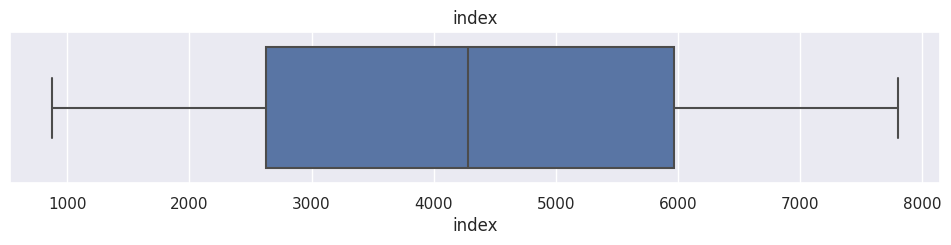

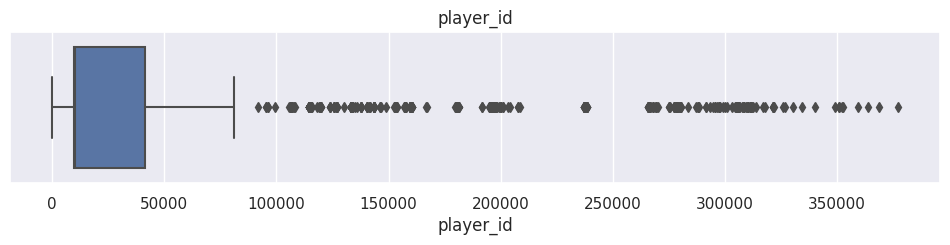

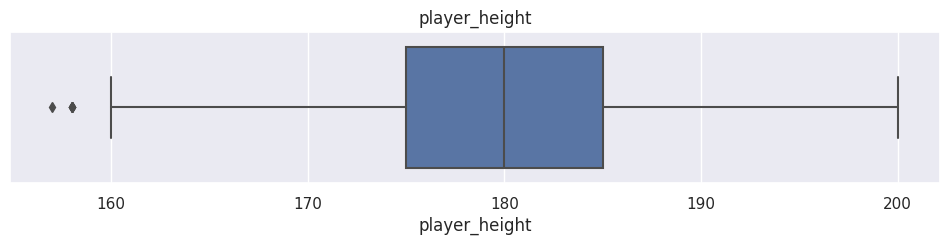

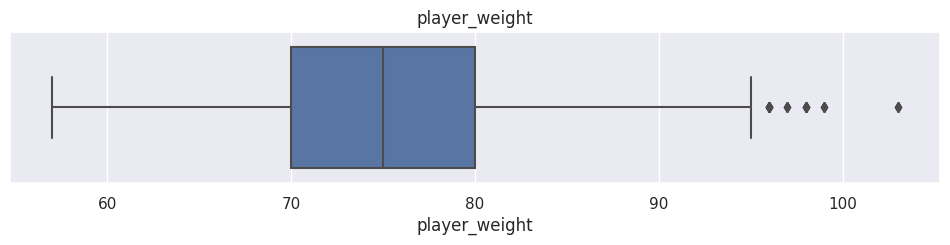

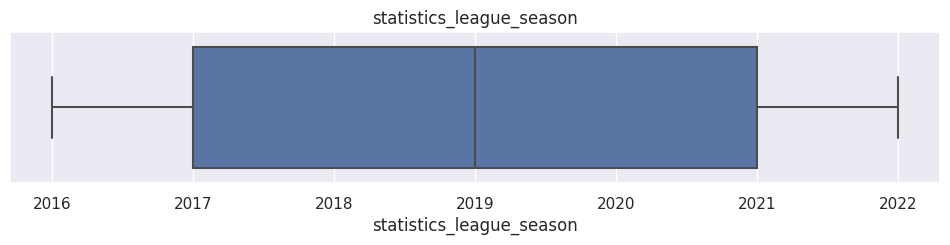

...

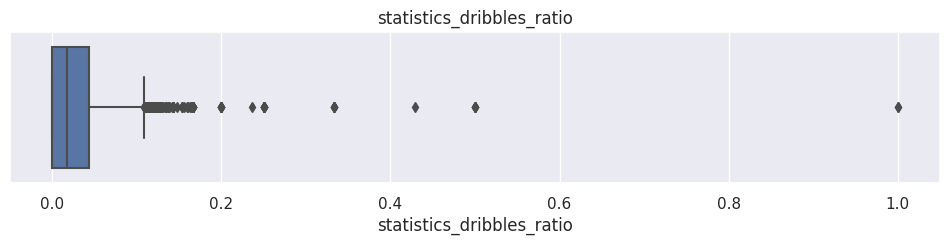

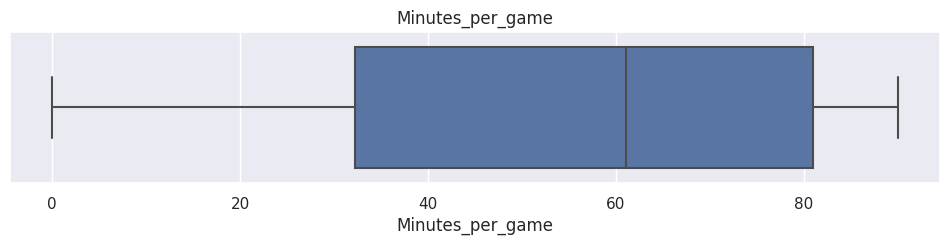

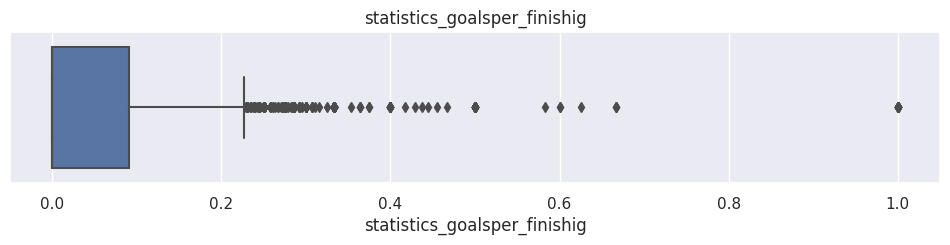

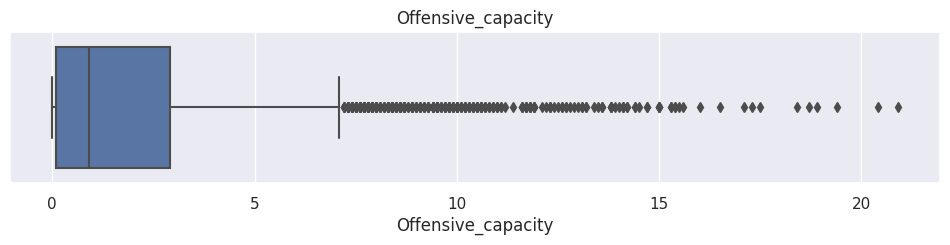

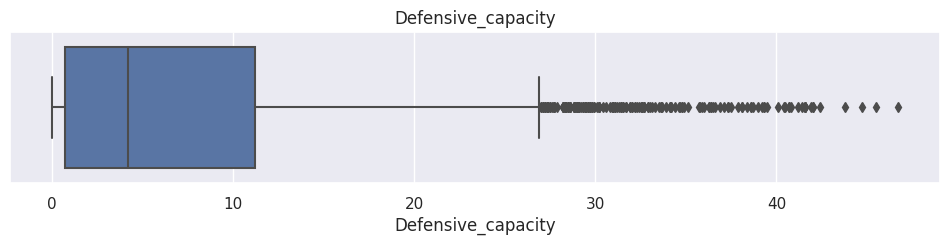

In [88]:
# Plotando as distribuições de cada variável no df
X_df_num = X_df.select_dtypes(include='number')

for var in X_df_num.columns:
  sns.set(rc={"figure.figsize": (12, 2)})
  sns.boxplot(x=var, data=X_df_num).set_title(var)
  plt.show()

#### Distribuições das variáveis para a posição goleiro

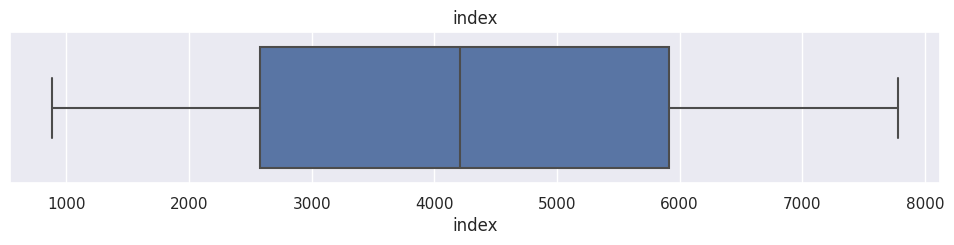

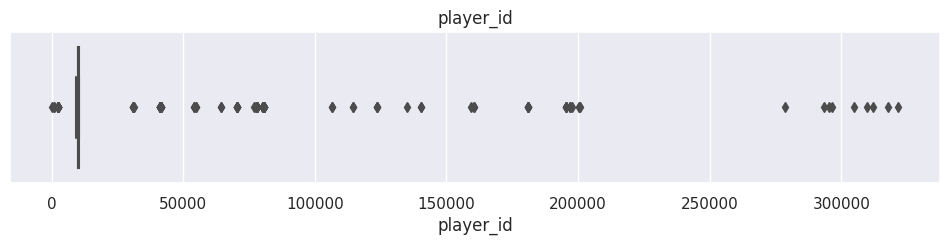

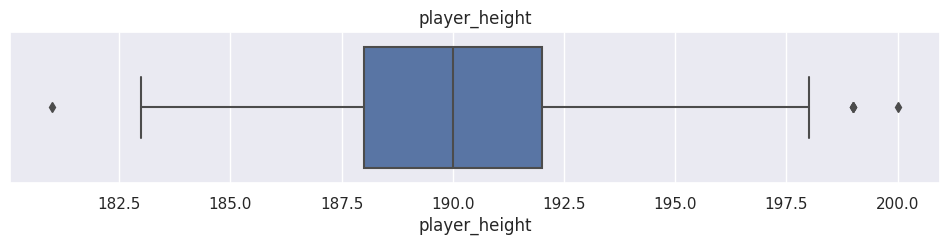

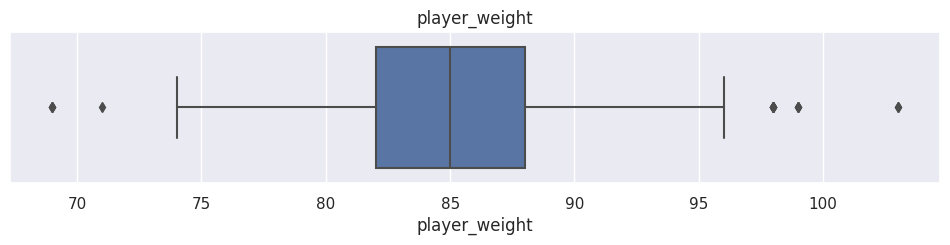

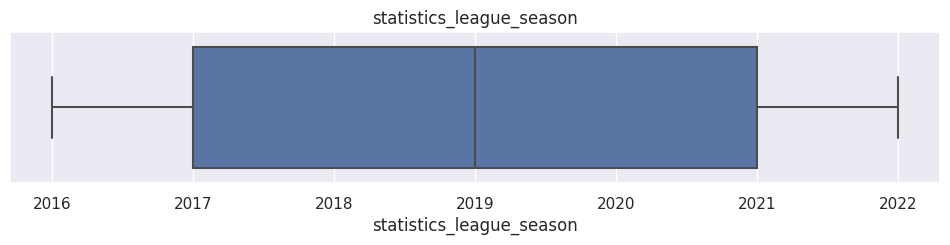

...

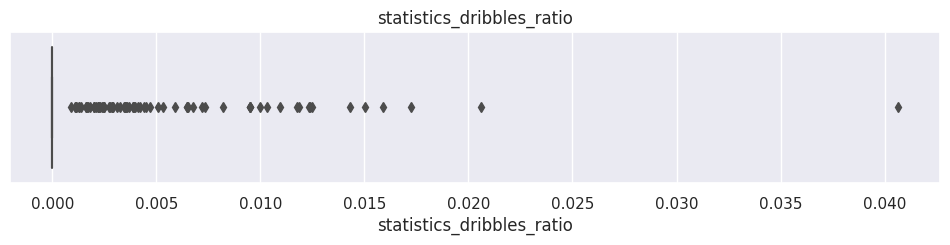

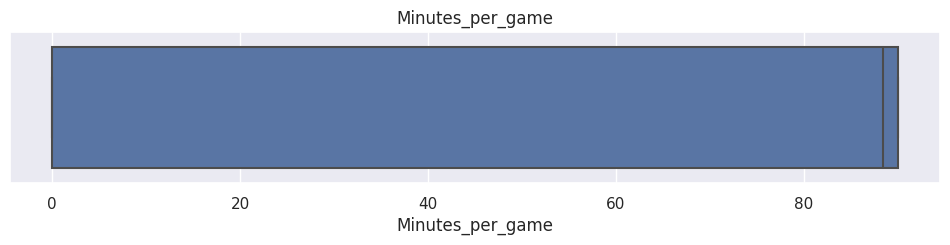

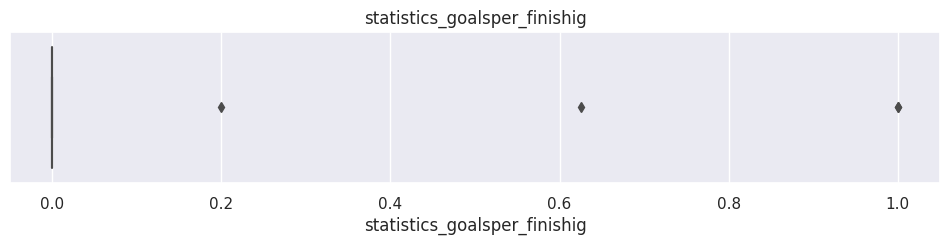

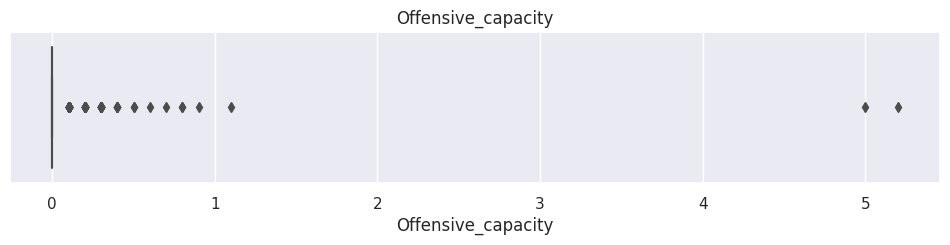

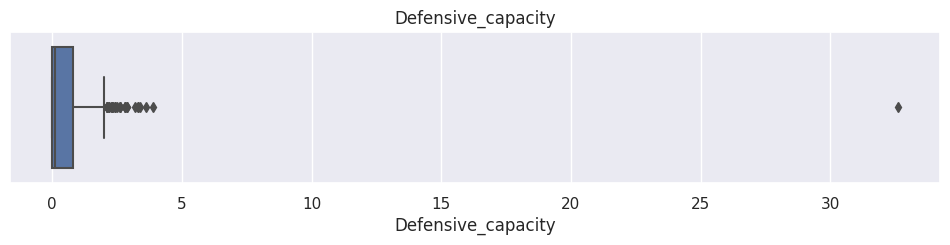

In [89]:
# Plotando boxplots para verificar as distribuições das variáveis numéricas para a posição goleiro
def position_boxplot(data, position):
  data_num = data.select_dtypes(include='number')

  for var in data_num.columns:
    sns.set(rc={"figure.figsize": (12, 2)})
    sns.boxplot(x=var, data=data[(data['statistics_games_position'] == position)]).set_title(var)
    plt.show()

position_boxplot(X_df, "Goalkeeper")

#### Distribuições das variáveis para a posição defensor

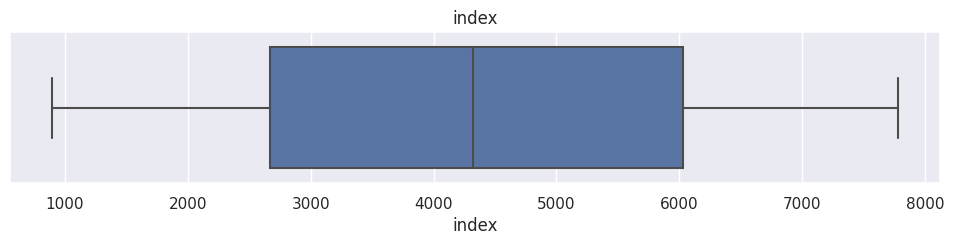

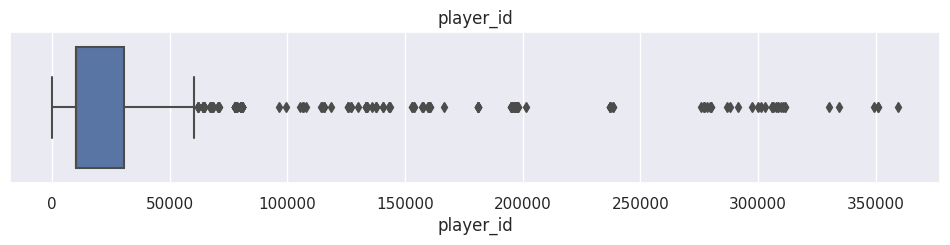

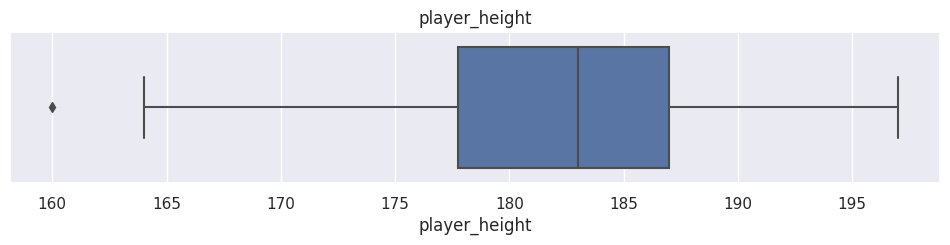

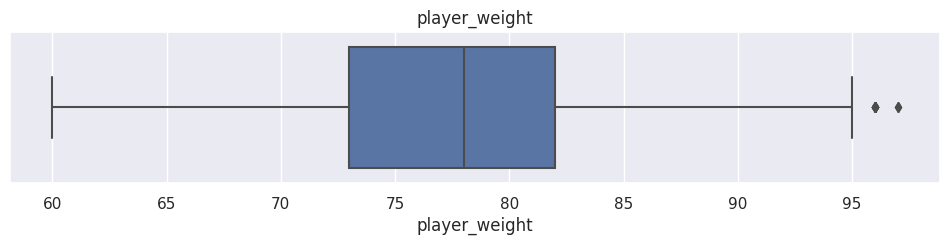

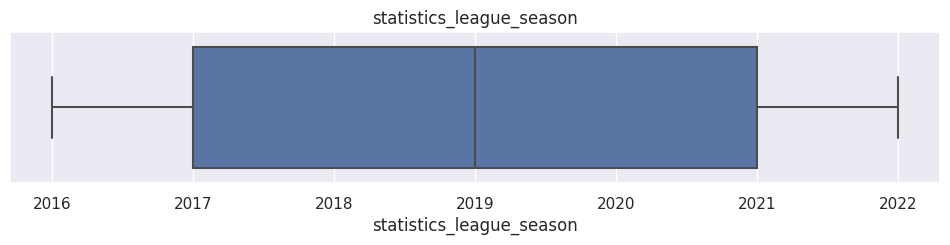

...

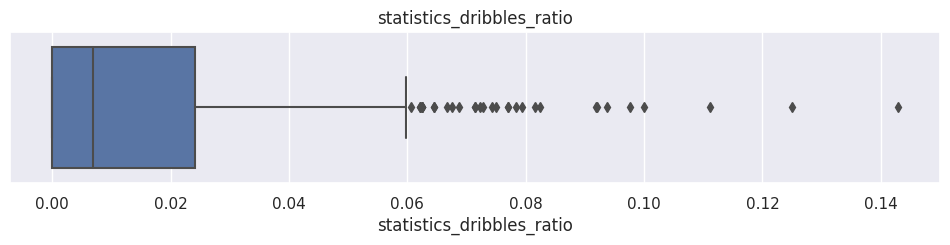

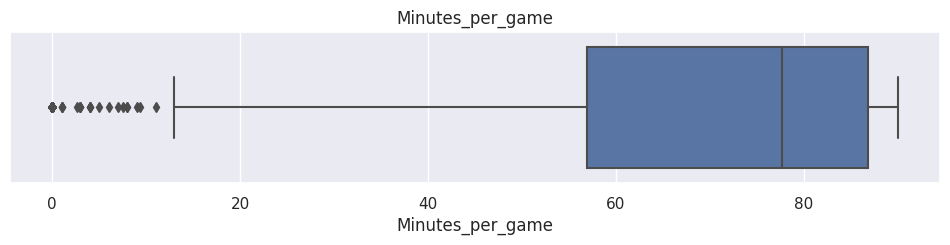

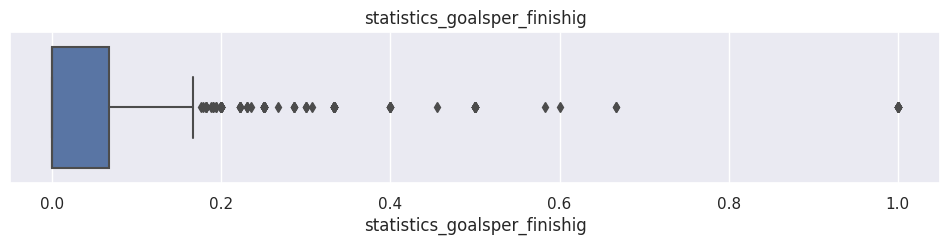

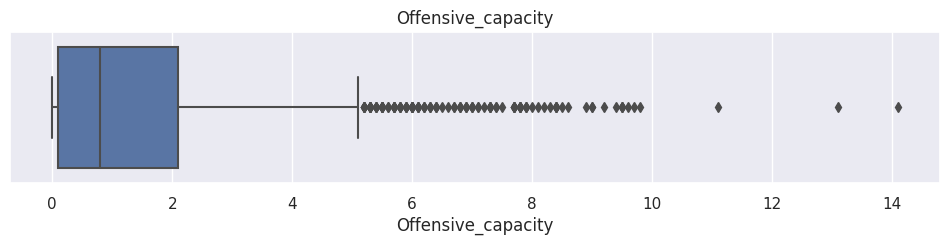

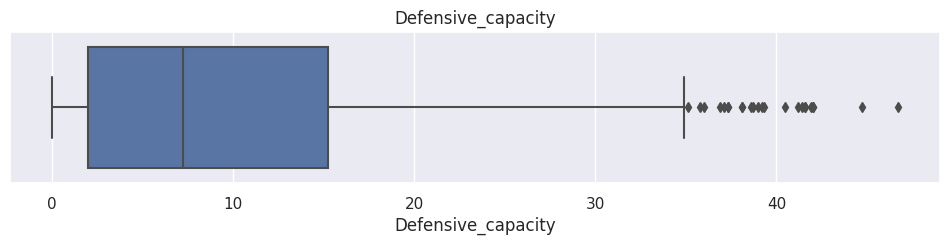

In [90]:
# Plotando boxplots para verificar as distribuições das variáveis numéricas para a posição defensor

position_boxplot(X_df, "Defender")

#### Distribuições das variáveis para a posição meio-campo

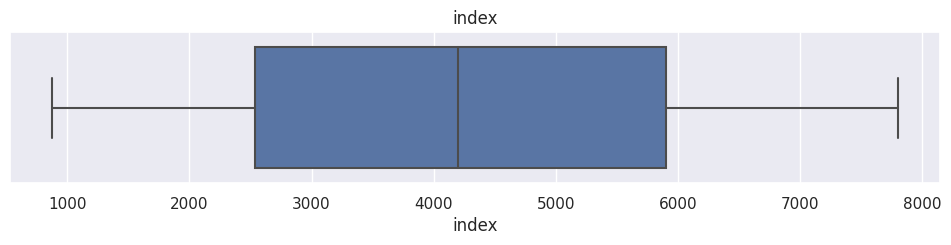

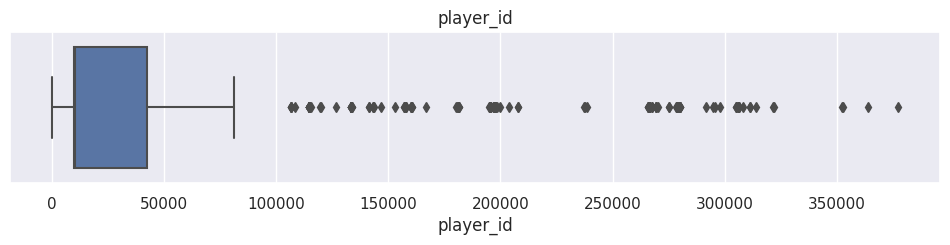

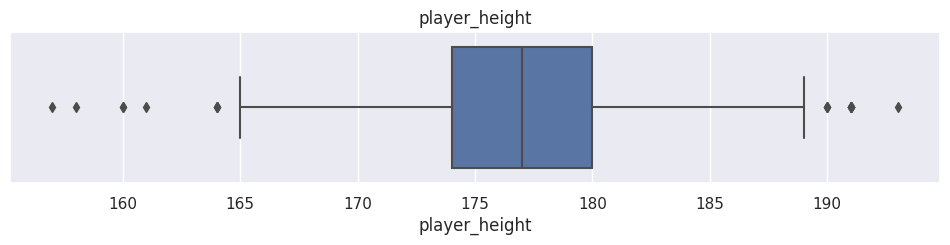

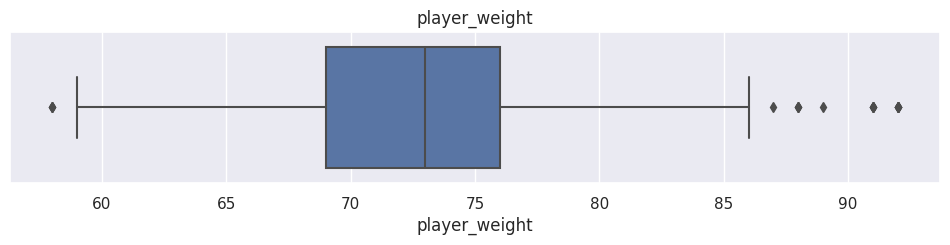

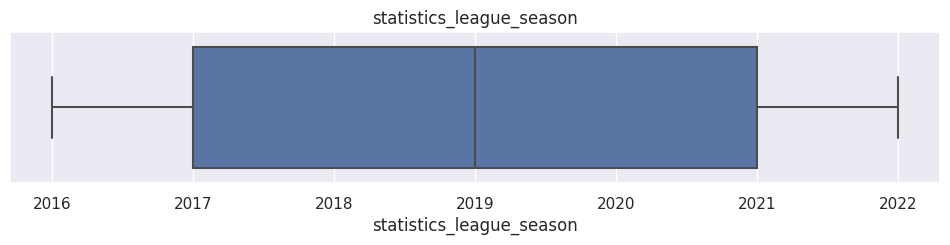

...

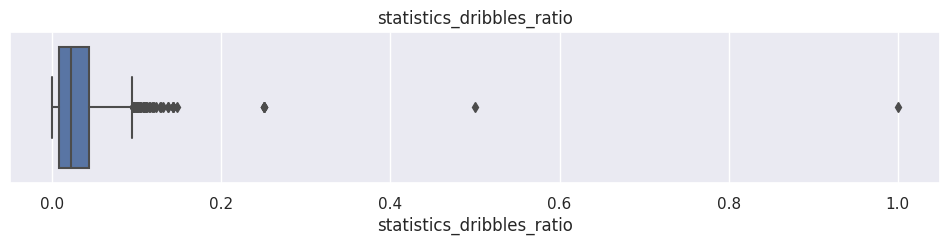

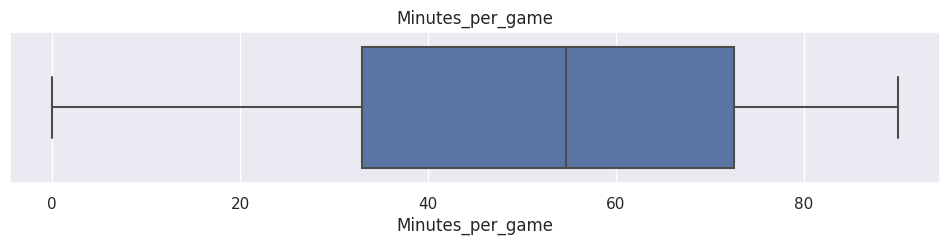

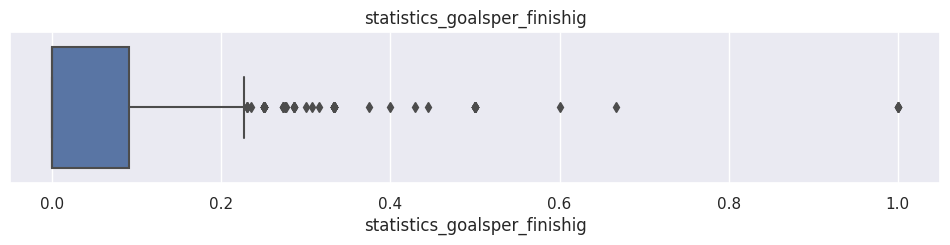

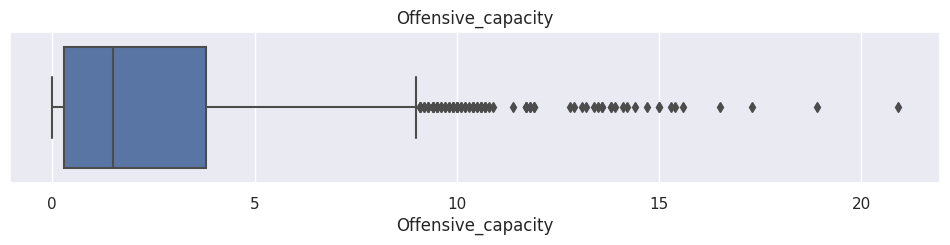

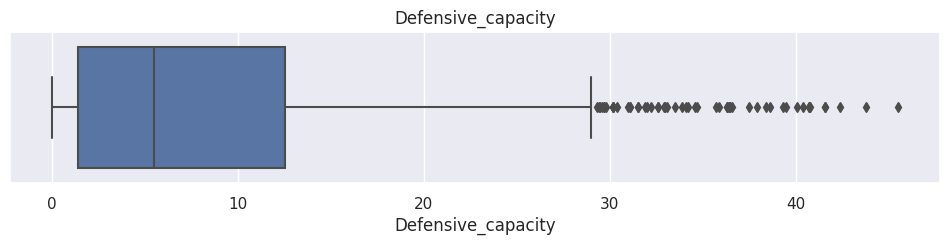

In [91]:
# Plotando boxplots para verificar as distribuições das variáveis numéricas para a posição meio-campo

position_boxplot(X_df, "Midfielder")

#### Distribuições das variáveis para a posição atacante

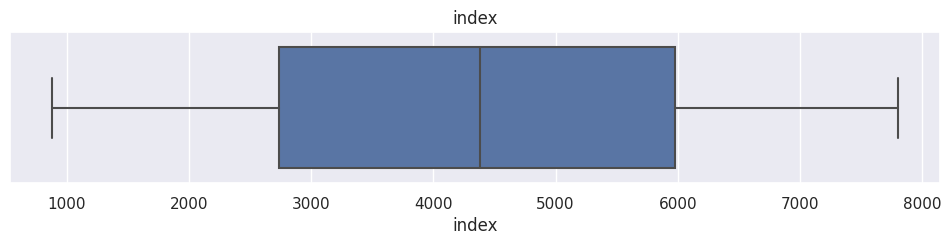

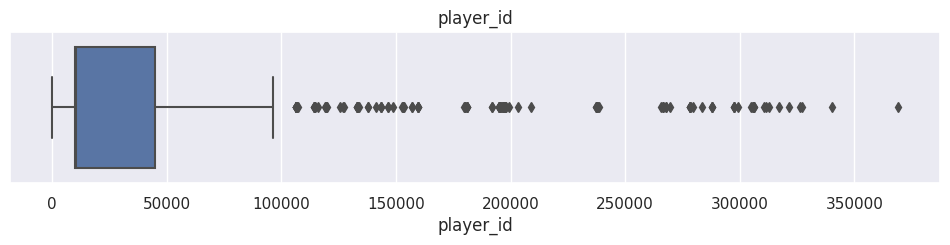

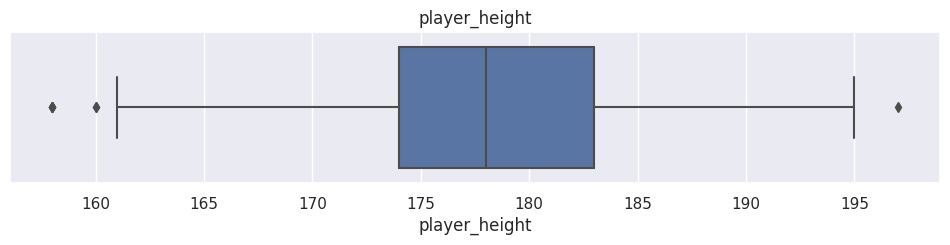

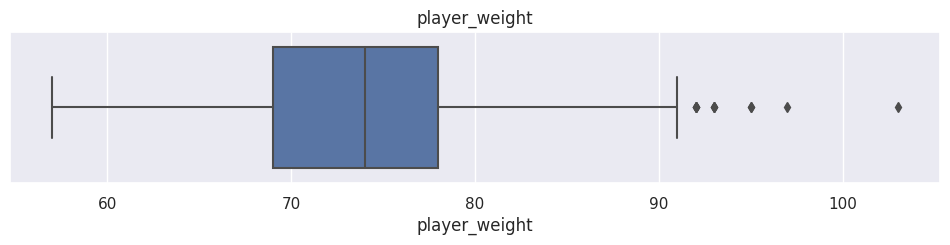

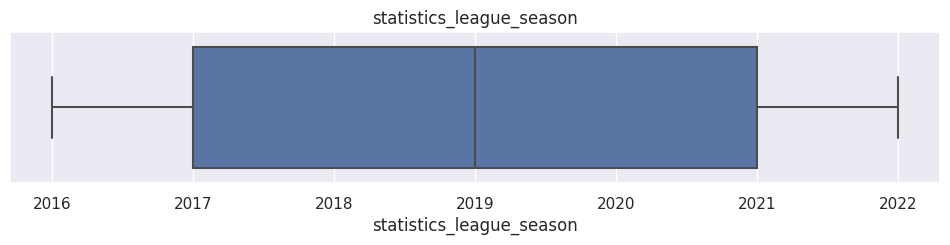

...

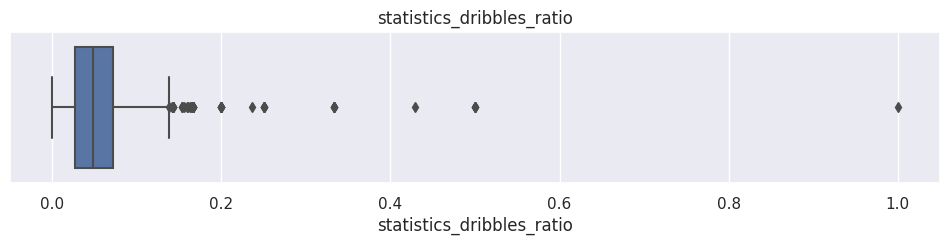

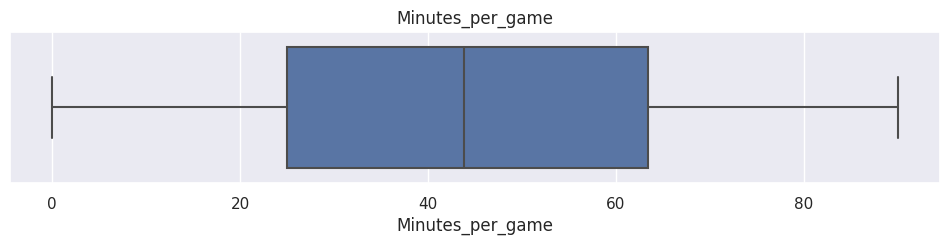

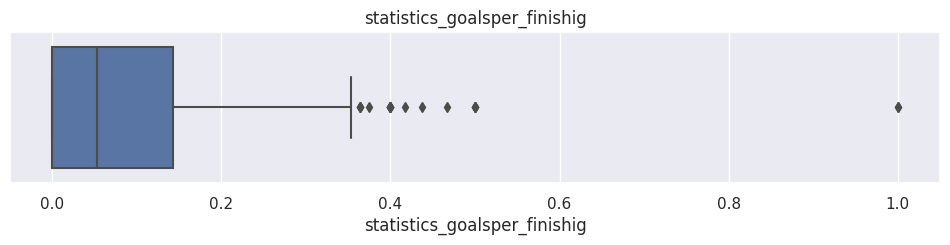

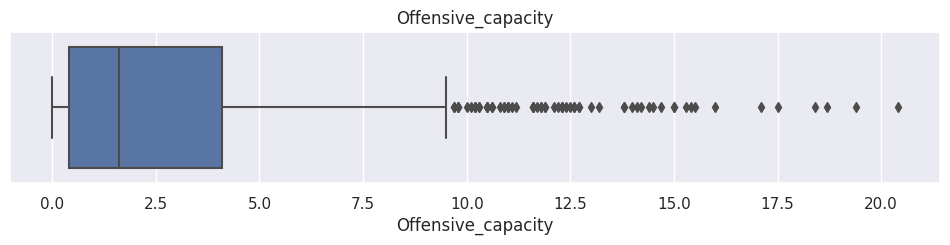

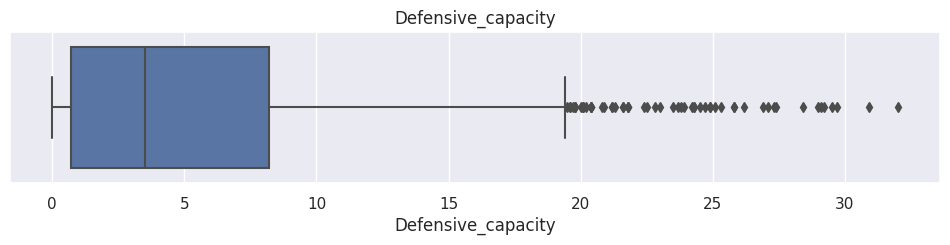

In [92]:
# Plotando boxplots para verificar as distribuições das variáveis numéricas para a posição atacante

position_boxplot(X_df, "Attacker")

#### Distribuição da variável target

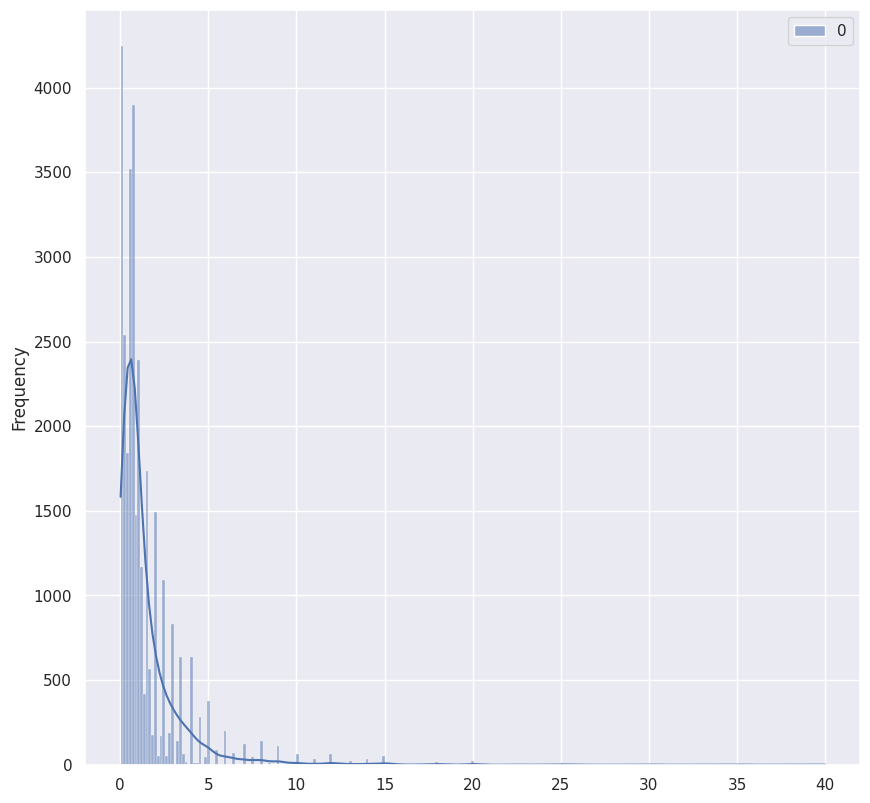

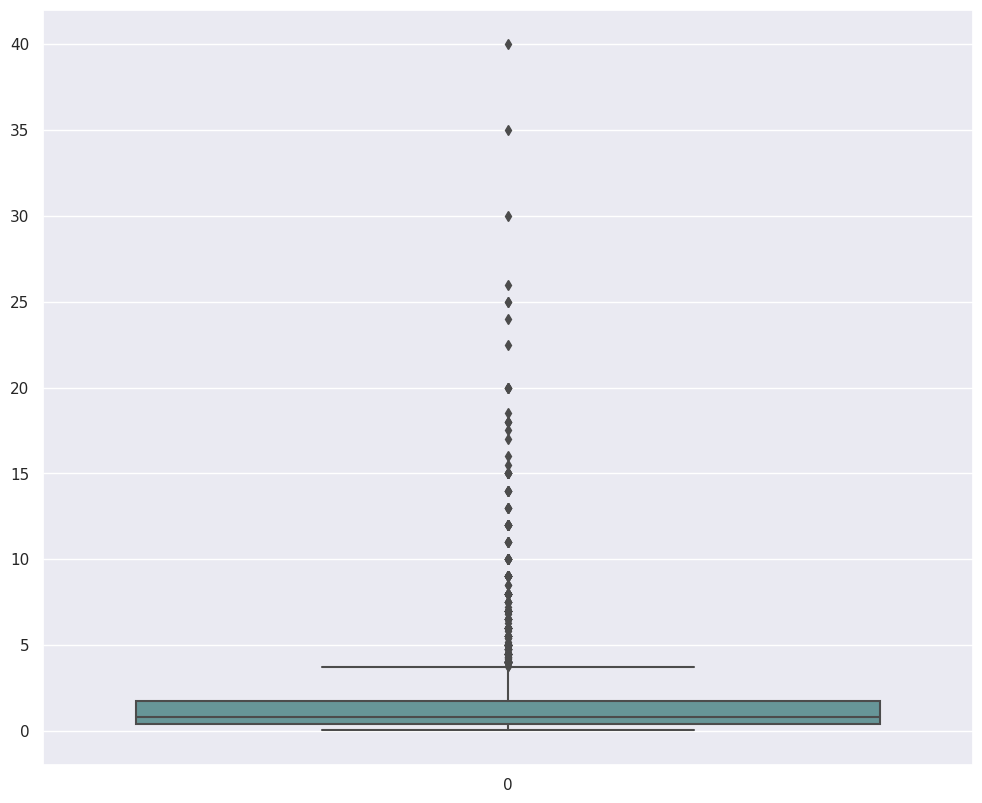

In [93]:
sns.set(rc={"figure.figsize": (10, 10)})
sns.histplot(
    y_df,
    label="Market Value [€ million]",
    stat="frequency",
    color="cadetblue",
    kde=True,
)
plt.show()

sns.set(rc={"figure.figsize": (12, 10)})
target = pd.DataFrame(y_df)
sns.boxplot(data=y_df, color="cadetblue")
plt.show()

Vemos que a distribuição tem uma longa cauda à direita, vamos passar log na variável para tentar transformar sua distribuição mais próxima de uma distribuição normal.

/usr/local/lib/python3.7/dist-packages/seaborn/distributions.py:2619: FutureWarning: `distplot` is a deprecated function and will be removed in a future version. Please adapt your code to use either `displot` (a figure-level function with similar flexibility) or `histplot` (an axes-level function for histograms).
  warnings.warn(msg, FutureWarning)


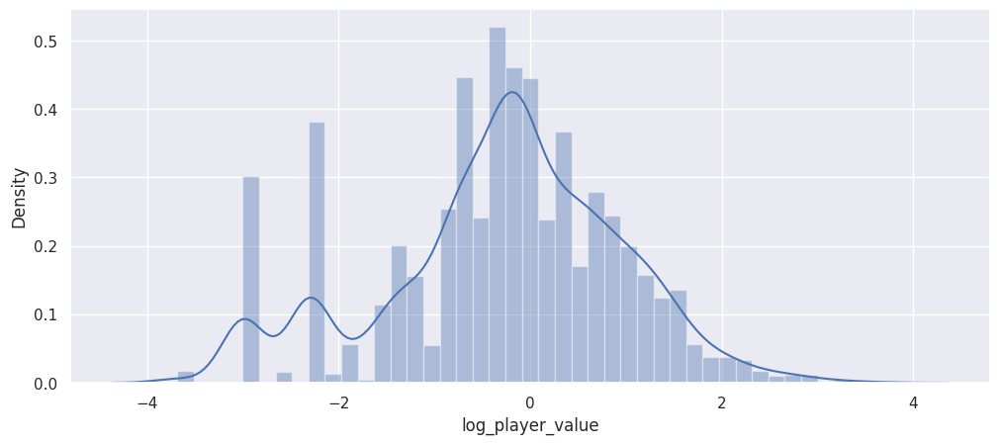

In [94]:
y_df['tm_player_value'] = pd.DataFrame(y_df)
y_df['log_player_value'] = np.log(y_df["tm_player_value"])

sns.set(rc={"figure.figsize": (12, 5)})
sns.distplot(y_df['log_player_value'])

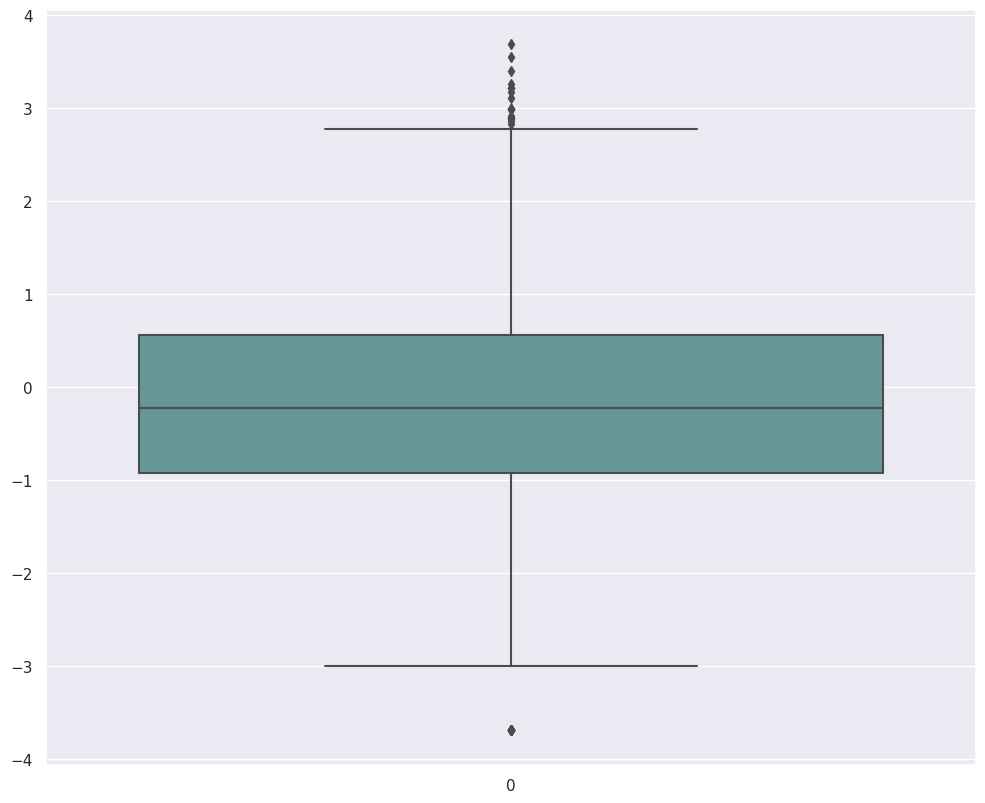

In [95]:
sns.set(rc={"figure.figsize": (12, 10)})
target = pd.DataFrame(y_df['log_player_value'])
sns.boxplot(data=y_df['log_player_value'], color="cadetblue")
plt.show()

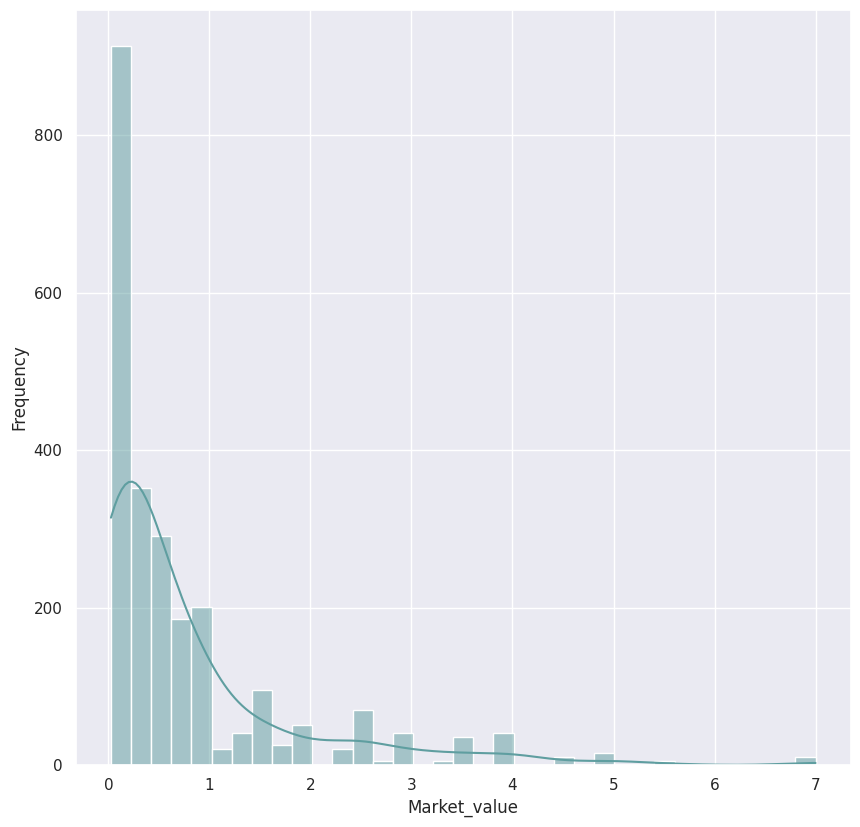

In [96]:
# Distribuição da variável target (não log) para a posição de goleiro

df_aux = X_df.copy()
df_aux["Market_value"] = y_df['tm_player_value']

sns.set(rc={"figure.figsize": (10, 10)})
sns.histplot(
    df_aux[(df_aux['statistics_games_position'] == 'Goalkeeper')]['Market_value'],
    label="Market Value [€ million]",
    stat="frequency",
    color="cadetblue",
    kde=True,
)
plt.show()

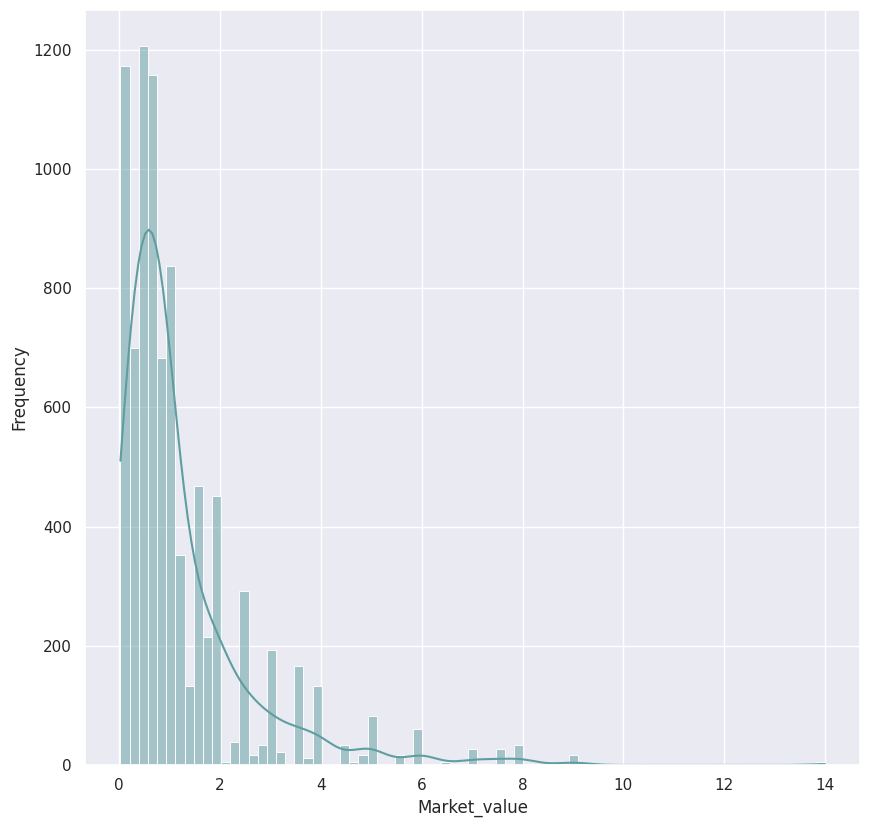

In [97]:
# Distribuição da variável target (não log) para a posição de defensor

df_aux = X_df.copy()
df_aux["Market_value"] = y_df['tm_player_value']

sns.set(rc={"figure.figsize": (10, 10)})
sns.histplot(
    df_aux[(df_aux['statistics_games_position'] == 'Defender')]['Market_value'],
    label="Market Value [€ million]",
    stat="frequency",
    color="cadetblue",
    kde=True,
)
plt.show()

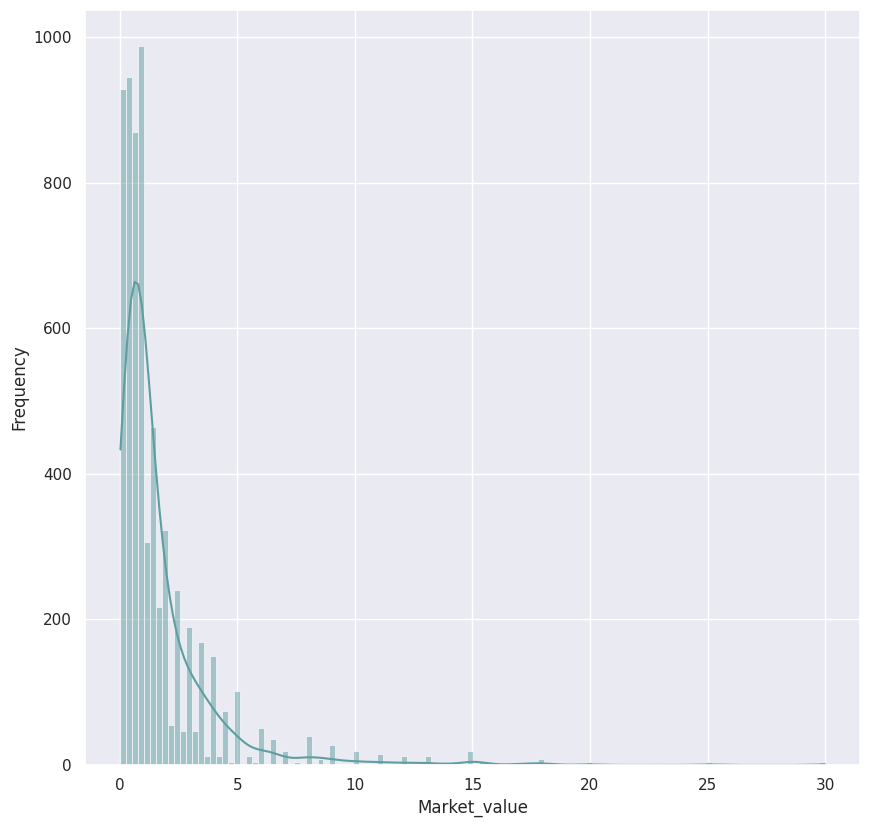

In [98]:
# Distribuição da variável target (não log) para a posição de meio-campo

df_aux = X_df.copy()
df_aux["Market_value"] = y_df['tm_player_value']

sns.set(rc={"figure.figsize": (10, 10)})
sns.histplot(
    df_aux[(df_aux['statistics_games_position'] == 'Midfielder')]['Market_value'],
    label="Market Value [€ million]",
    stat="frequency",
    color="cadetblue",
    kde=True,
)
plt.show()

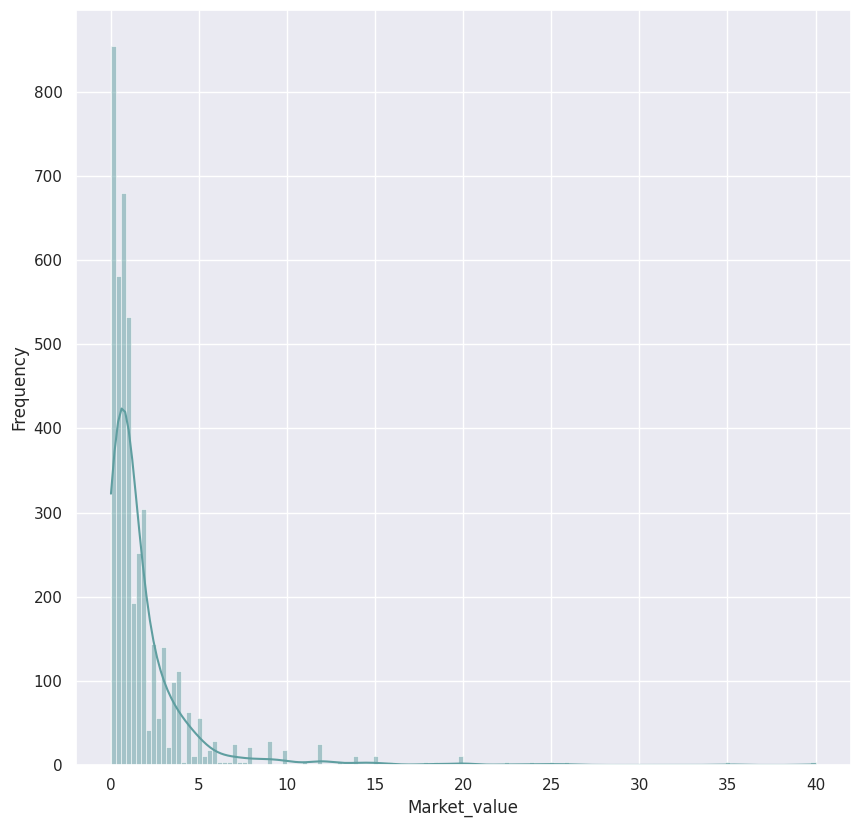

In [99]:
# Distribuição da variável target (não log) para a posição de atacante

df_aux = X_df.copy()
df_aux["Market_value"] = y_df['tm_player_value']

sns.set(rc={"figure.figsize": (10, 10)})
sns.histplot(
    df_aux[(df_aux['statistics_games_position'] == 'Attacker')]['Market_value'],
    label="Market Value [€ million]",
    stat="frequency",
    color="cadetblue",
    kde=True,
)
plt.show()

### Heatmap

In [100]:
X_df.info()

<class 'pandas.core.frame.DataFrame'>
Int64Index: 4946 entries, 0 to 4946
Data columns (total 61 columns):
 #   Column                            Non-Null Count  Dtype   
---  ------                            --------------  -----   
 0   index                             4946 non-null   int64   
 1   player_id                         4946 non-null   int64   
 2   player_name                       4946 non-null   object  
 3   player_firstname                  4946 non-null   object  
 4   player_lastname                   4946 non-null   object  
 5   player_birth_date                 4946 non-null   object  
 6   player_height                     4946 non-null   float64 
 7   player_weight                     4946 non-null   float64 
 8   statistics_league_season          4946 non-null   int64   
 9   statistics_games_appearences      4946 non-null   float64 
 10  statistics_games_lineups          4946 non-null   float64 
 11  statistics_games_minutes          4946 non-null   float6

In [101]:
X_df.head()

,index,player_id,player_name,player_firstname,player_lastname,player_birth_date,player_height,player_weight,statistics_league_season,statistics_games_appearences,statistics_games_lineups,statistics_games_minutes,statistics_games_position,statistics_games_rating,statistics_games_captain,statistics_substitutes_in,statistics_substitutes_out,statistics_substitutes_bench,statistics_shots_total,statistics_shots_on,statistics_goals_total,statistics_goals_conceded,statistics_goals_assists,statistics_goals_saves,statistics_passes_total,statistics_passes_key,statistics_passes_accuracy,statistics_tackles_total,statistics_tackles_blocks,statistics_tackles_interceptions,statistics_duels_total,statistics_duels_won,statistics_dribbles_attempts,statistics_dribbles_success,statistics_fouls_drawn,statistics_fouls_committed,statistics_cards_yellow,statistics_cards_yellowred,statistics_cards_red,statistics_penalty_won,statistics_penalty_commited,statistics_penalty_scored,statistics_penalty_missed,statistics_penalty_saved,full_player_name,club_names_tm,player_age,statistics_shots_accuracy,statistics_min_per_goal,minutes_toconceed_goal,statistics_shots_precision,Minutes_per_foul_committed,statistics_goals_ratio,statistics_finishing_ratio,statistics_keypasses_assist,statistics_keypasses_ratio,statistics_dribbles_ratio,Minutes_per_game,statistics_goalsper_finishig,Offensive_capacity,Defensive_capacity
0,876,9609,Danilo Gabriel de Andrade,Danilo Gabriel,de Andrade,1979-06-11,186.0,80.0,2016,6.0,1.0,228.0,Midfielder,6.533333,0,5.0,0.0,11.0,2.0,2.0,1.0,0.0,0.0,0.0,80.0,3.0,77.0,2.0,0.0,2.0,51.0,16.0,6.0,2.0,6.0,4.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,Danilo Gabriel de Andrade,Sport Club Corinthians Paulista,37,0.5,228.0,0.0,1.0,57.0,0.500000,1.000000,0.0,0.0375,0.0375,38.000000,0.5,0.7,2.0
1,881,80586,Bruno Rangel Domingues,Bruno,Rangel Domingues,1981-12-11,178.0,74.0,2016,31.0,19.0,1878.0,Attacker,6.797009,0,12.0,6.0,18.0,85.0,30.0,10.0,0.0,0.0,0.0,0.0,0.0,66.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,3.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,Bruno Rangel Domingues,Associacao Chapecoense de Futebol,35,0.0,187.8,0.0,0.0,0.0,0.333333,0.352941,0.0,0.0000,0.0000,60.580645,0.0,2.0,0.0
2,882,80589,Matheus Bitencourt da Silva,Matheus,Bitencourt da Silva,1995-06-28,177.0,73.0,2016,13.0,10.0,967.0,Midfielder,6.797009,0,3.0,1.0,11.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,66.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,1.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,Matheus Bitencourt da Silva,Associacao Chapecoense de Futebol,21,0.0,0.0,0.0,0.0,0.0,0.000000,0.000000,0.0,0.0000,0.0000,74.384615,0.0,0.0,0.0
3,884,80602,Jose Nivaldo Martins Constante,Jose Nivaldo,Martins Constante,1974-03-19,186.0,77.0,2016,0.0,0.0,0.0,Goalkeeper,6.797009,0,0.0,0.0,18.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,66.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,Jose Nivaldo Martins Constante,Associacao Chapecoense de Futebol,42,0.0,0.0,0.0,0.0,0.0,0.000000,0.000000,0.0,0.0000,0.0000,0.000000,0.0,0.0,0.0
4,885,80605,Luciano Javier Cabral,Luciano Javier,Cabral,1995-04-26,170.0,66.0,2016,6.0,2.0,251.0,Midfielder,6.797009,0,4.0,2.0,9.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,66.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,Luciano Javier Cabral,Club Athletico Paranaense,21,0.0,0.0,0.0,0.0,0.0,0.000000,0.000000,0.0,0.0000,0.0000,41.833333,0.0,0.0,0.0


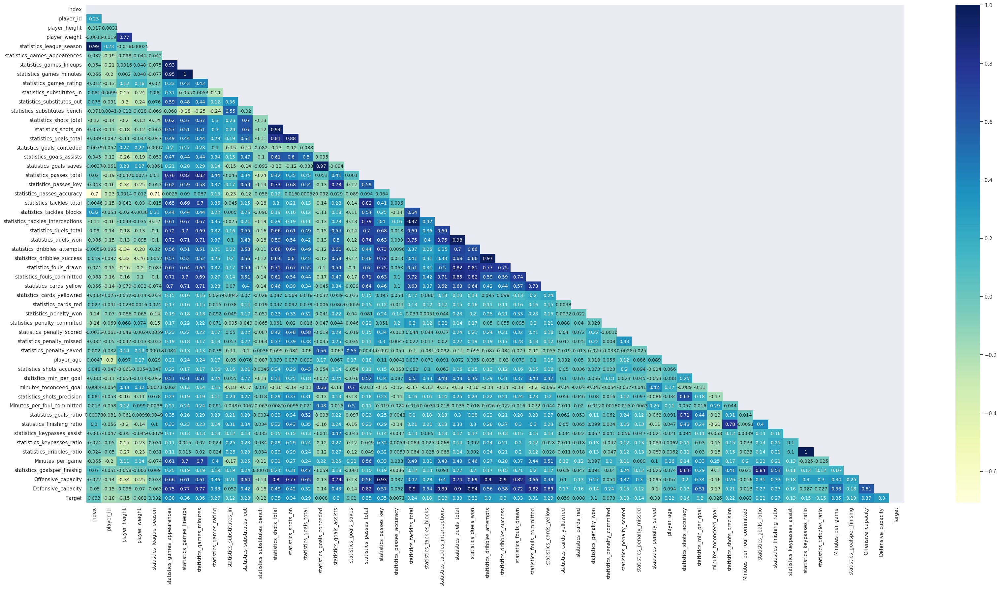

In [102]:
# Vamos agora verificar a correlação entre as variáveis

df_heatmap = X_df.copy()
df_heatmap["Target"] = y_df['log_player_value']

sns.set(rc={"figure.figsize": (40, 20)})

# creating mask
mask = np.triu(np.ones_like(df_heatmap.corr()))

# plotting a triangle correlation heatmap
dataplot = sns.heatmap(df_heatmap.corr(), cmap="YlGnBu", annot=True,annot_kws={'size': 10}, mask=mask)

# displaying heatmap
plt.show()

#### Heatmap e variáveis significativas para Goleiros

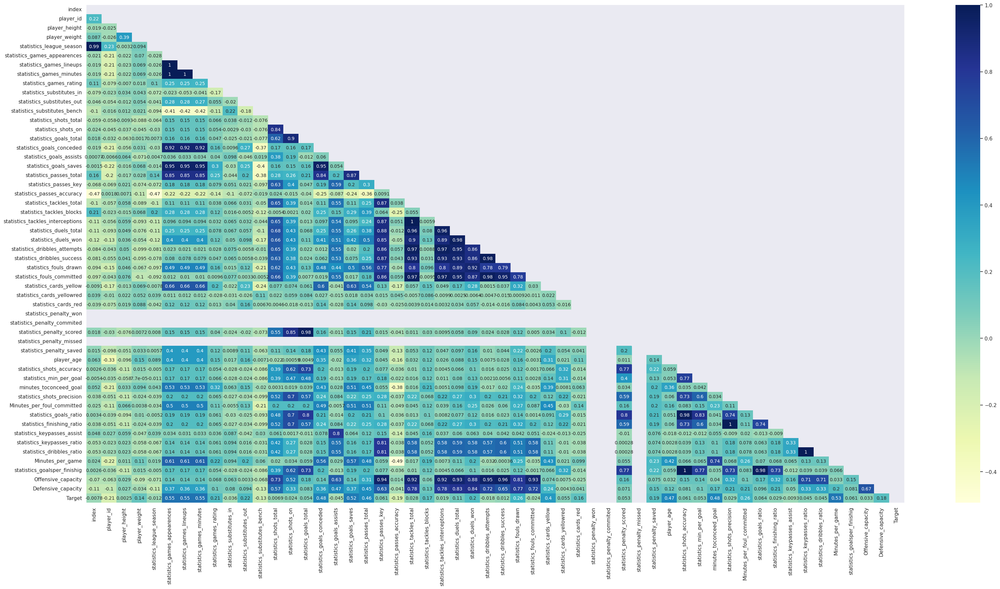

In [103]:
# Rodar Heatmap para posição de goleiro

df_heatmap = X_df.copy()
df_heatmap["Target"] = y_df['log_player_value']

sns.set(rc={"figure.figsize": (40, 20)})

# creating mask
mask = np.triu(np.ones_like(df_heatmap[(df_heatmap['statistics_games_position'] == 'Goalkeeper')].corr()))

# plotting a triangle correlation heatmap
dataplot = sns.heatmap(df_heatmap[(df_heatmap['statistics_games_position'] == 'Goalkeeper')].corr(), cmap="YlGnBu", annot=True,annot_kws={'size': 10}, mask=mask)

# displaying heatmap
plt.show()

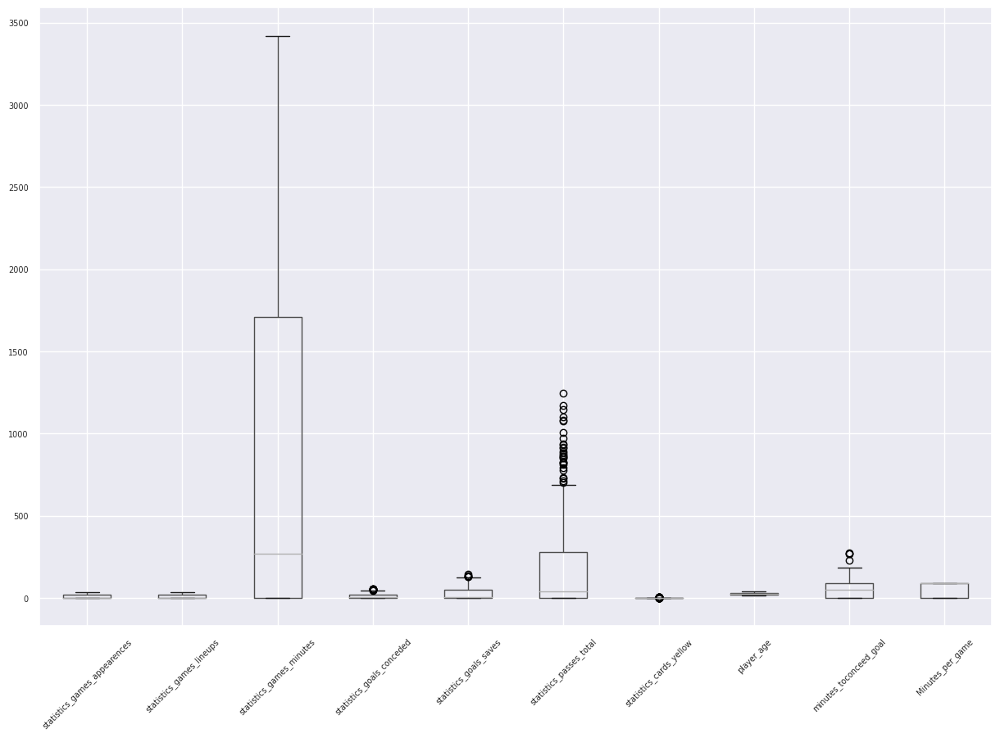

In [104]:
# Distribuição e presença de outliers de variáveis importantes (correlação de pearson mais significativa) para a posição goleiro

Mask = data=df_heatmap[(df_heatmap['statistics_games_position'] == 'Goalkeeper')]
plt.rcParams["figure.figsize"] = (15,10)
plt.xticks(fontsize= 5)
Mask.boxplot(column=[
        "statistics_games_appearences",
        "statistics_games_lineups",
        "statistics_games_minutes",
        "statistics_goals_conceded",
        "statistics_goals_saves",
        "statistics_passes_total",
        "statistics_cards_yellow",
        "player_age",
        "minutes_toconceed_goal",
        "Minutes_per_game",
    ], rot=45, fontsize=7)

In [105]:
# Dados estatísticos das variáveis significativas para a posição de Goleiro
gk_describe = df_heatmap[(df_heatmap['statistics_games_position'] == 'Goalkeeper')][
        ["statistics_games_appearences",
        "statistics_games_lineups",
        "statistics_games_minutes",
        "statistics_goals_conceded",
        "statistics_goals_saves",
        "statistics_passes_total",
        "statistics_cards_yellow",
        "player_age",
        "minutes_toconceed_goal",
        "Minutes_per_game",
]]
gk_describe.describe(percentiles=[.25, .5, .75, .99])

,statistics_games_appearences,statistics_games_lineups,statistics_games_minutes,statistics_goals_conceded,statistics_goals_saves,statistics_passes_total,statistics_cards_yellow,player_age,minutes_toconceed_goal,Minutes_per_game
count,484.000000,484.000000,484.000000,484.000000,484.000000,484.000000,484.000000,484.000000,484.000000,484.000000
mean,9.940083,9.811983,883.421488,11.049587,28.518595,172.888430,0.719008,27.969008,49.509271,56.761663
std,12.495901,12.510194,1121.752950,14.307971,37.603490,251.959534,1.145506,5.523249,49.644780,41.882581
min,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,18.000000,0.000000,0.000000
25%,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,23.000000,0.000000,0.000000
50%,3.000000,3.000000,270.000000,4.000000,7.000000,40.500000,0.000000,28.000000,50.697115,88.472410
75%,19.000000,19.000000,1710.000000,19.000000,51.000000,278.250000,1.000000,32.000000,88.522523,90.000000
99%,38.000000,38.000000,3420.000000,51.000000,125.510000,1077.190000,5.000000,40.170000,180.680000,90.000000
max,38.000000,38.000000,3420.000000,57.000000,143.000000,1247.000000,6.000000,42.000000,276.000000,90.000000


#### Heatmap e variáveis significativas para Defensores

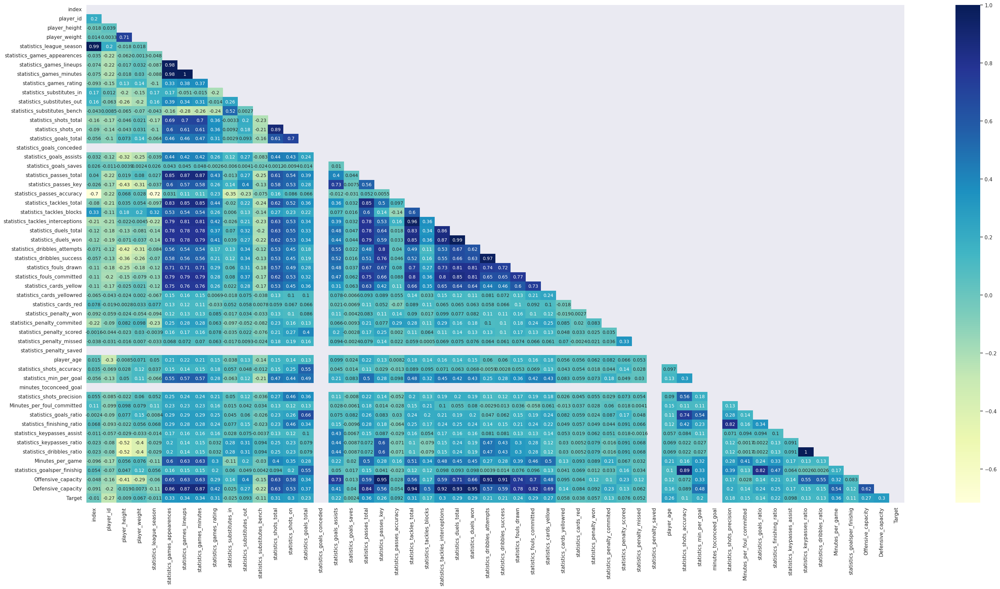

In [106]:
# Rodar Heatmap para posição de defensores

df_heatmap = X_df.copy()
df_heatmap["Target"] = y_df['log_player_value']

sns.set(rc={"figure.figsize": (40, 20)})

# creating mask
mask = np.triu(np.ones_like(df_heatmap[(df_heatmap['statistics_games_position'] == 'Defender')].corr()))

# plotting a triangle correlation heatmap
dataplot = sns.heatmap(df_heatmap[(df_heatmap['statistics_games_position'] == 'Defender')].corr(), cmap="YlGnBu", annot=True,annot_kws={'size': 10}, mask=mask)

# displaying heatmap
plt.show()

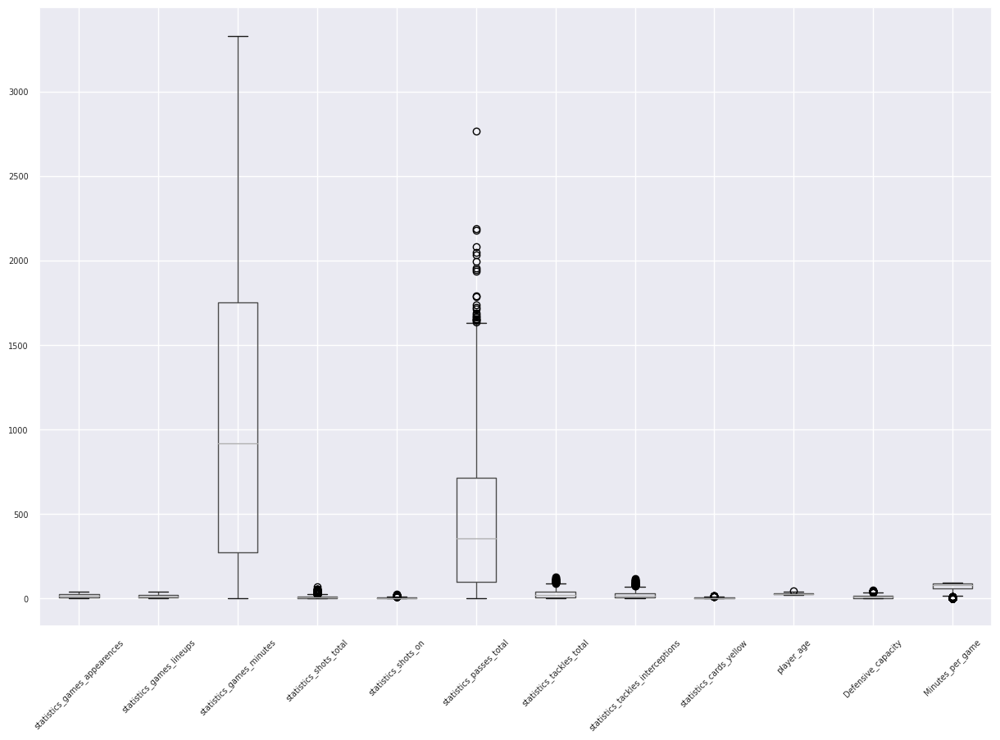

In [107]:
# Distribuição e presença de outliers de variáveis importantes (correlação de pearson mais significativa) para a posição defensor

Mask = data=df_heatmap[(df_heatmap['statistics_games_position'] == 'Defender')]
plt.rcParams["figure.figsize"] = (15,10)
plt.xticks(fontsize= 5)
Mask.boxplot(column=[
        "statistics_games_appearences",
        "statistics_games_lineups",
        "statistics_games_minutes",
        "statistics_shots_total",
        "statistics_shots_on",
        "statistics_passes_total",
        "statistics_tackles_total",
        "statistics_tackles_interceptions",
        "statistics_cards_yellow",
        "player_age",
        "Defensive_capacity",
        "Minutes_per_game",
    ], rot=45, fontsize=7)

In [108]:
# Dados estatísticos das variáveis significativas para a posição de Defensor
def_describe = df_heatmap[(df_heatmap['statistics_games_position'] == 'Defender')][
        ["statistics_games_appearences",
        "statistics_games_lineups",
        "statistics_games_minutes",
        "statistics_shots_total",
        "statistics_shots_on",
        "statistics_passes_total",
        "statistics_tackles_total",
        "statistics_tackles_interceptions",
        "statistics_cards_yellow",
        "player_age",
        "Defensive_capacity",
        "Minutes_per_game",
]]
def_describe.describe(percentiles=[.25, .5, .75, .99])

,statistics_games_appearences,statistics_games_lineups,statistics_games_minutes,statistics_shots_total,statistics_shots_on,statistics_passes_total,statistics_tackles_total,statistics_tackles_interceptions,statistics_cards_yellow,player_age,Defensive_capacity,Minutes_per_game
count,1564.000000,1564.000000,1564.000000,1564.000000,1564.000000,1564.000000,1564.000000,1564.000000,1564.000000,1564.000000,1564.000000,1564.000000
mean,13.795396,12.241688,1092.982097,6.632992,2.034527,453.256394,24.595908,19.810422,2.561381,26.652174,9.885614,65.836175
std,10.617605,10.473702,925.787730,7.913311,2.790641,427.766785,23.105818,19.771447,2.571698,4.629925,9.455228,29.006069
min,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,17.000000,0.000000,0.000000
25%,4.000000,3.000000,272.750000,1.000000,0.000000,97.750000,5.000000,4.000000,0.000000,23.000000,2.000000,56.880515
50%,13.000000,10.000000,914.500000,4.000000,1.000000,353.000000,19.000000,14.000000,2.000000,26.000000,7.200000,77.666008
75%,22.000000,20.000000,1749.250000,10.000000,3.000000,711.000000,38.000000,31.000000,4.000000,30.000000,15.225000,86.814732
99%,36.000000,35.000000,3165.540000,35.000000,13.000000,1681.180000,92.370000,83.740000,10.000000,37.000000,38.100000,90.000000
max,37.000000,37.000000,3330.000000,69.000000,25.000000,2767.000000,126.000000,115.000000,13.000000,41.000000,46.700000,90.000000


#### Heatmap e variáveis significativas para Meio_campo

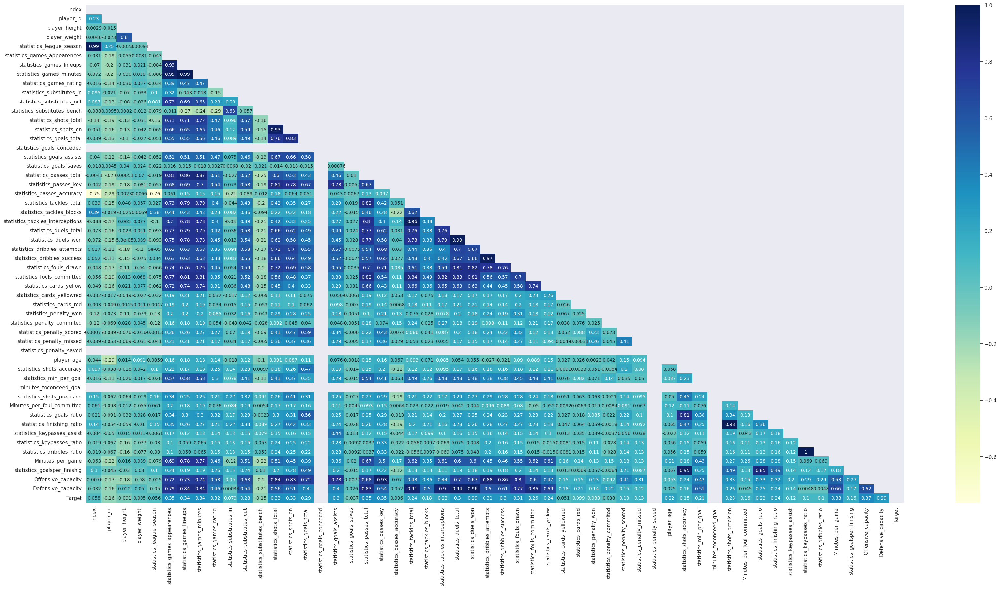

In [109]:
# Rodar Heatmap para posição de meio-campo

df_heatmap = X_df.copy()
df_heatmap["Target"] = y_df['log_player_value']

sns.set(rc={"figure.figsize": (40, 20)})

# creating mask
mask = np.triu(np.ones_like(df_heatmap[(df_heatmap['statistics_games_position'] == 'Midfielder')].corr()))

# plotting a triangle correlation heatmap
dataplot = sns.heatmap(df_heatmap[(df_heatmap['statistics_games_position'] == 'Midfielder')].corr(), cmap="YlGnBu", annot=True,annot_kws={'size': 10}, mask=mask)

# displaying heatmap
plt.show()

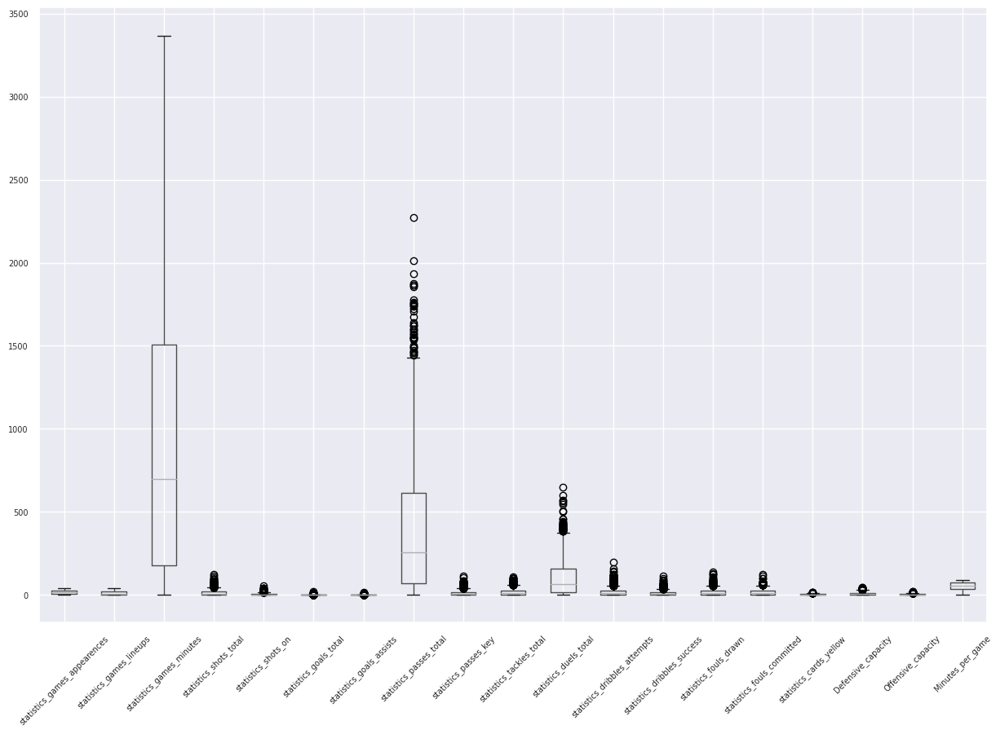

In [110]:
# Distribuição e presença de outliers de variáveis importantes (correlação de pearson mais significativa) para a posição meio-campo

Mask = data=df_heatmap[(df_heatmap['statistics_games_position'] == 'Midfielder')]
plt.rcParams["figure.figsize"] = (15,10)
plt.xticks(fontsize= 5)
Mask.boxplot(column=[
        "statistics_games_appearences",
        "statistics_games_lineups",
        "statistics_games_minutes",
        "statistics_shots_total",
        "statistics_shots_on",
        "statistics_goals_total",
        "statistics_goals_assists",
        "statistics_passes_total",
        "statistics_passes_key",
        "statistics_tackles_total",
        "statistics_duels_total",
        "statistics_dribbles_attempts",
        "statistics_dribbles_success",
        "statistics_fouls_drawn",
        "statistics_fouls_committed",
        "statistics_cards_yellow",
        "Defensive_capacity",
        "Offensive_capacity",
        "Minutes_per_game",
    ], rot=45, fontsize=7)

In [111]:
# Dados estatísticos das variáveis significativas para a posição de Meio-campo
mid_describe = df_heatmap[(df_heatmap['statistics_games_position'] == 'Midfielder')][
        ["statistics_games_appearences",
        "statistics_games_lineups",
        "statistics_games_minutes",
        "statistics_shots_total",
        "statistics_shots_on",
        "statistics_goals_total",
        "statistics_goals_assists",
        "statistics_passes_total",
        "statistics_passes_key",
        "statistics_tackles_total",
        "statistics_duels_total",
        "statistics_dribbles_attempts",
        "statistics_dribbles_success",
        "statistics_fouls_drawn",
        "statistics_fouls_committed",
        "statistics_cards_yellow",
        "Defensive_capacity",
        "Offensive_capacity",
        "Minutes_per_game",
]]
mid_describe.describe(percentiles=[.25, .5, .75, .99])

,statistics_games_appearences,statistics_games_lineups,statistics_games_minutes,statistics_shots_total,statistics_shots_on,statistics_goals_total,statistics_goals_assists,statistics_passes_total,statistics_passes_key,statistics_tackles_total,statistics_duels_total,statistics_dribbles_attempts,statistics_dribbles_success,statistics_fouls_drawn,statistics_fouls_committed,statistics_cards_yellow,Defensive_capacity,Offensive_capacity,Minutes_per_game
count,1641.000000,1641.000000,1641.000000,1641.000000,1641.000000,1641.000000,1641.000000,1641.000000,1641.000000,1641.000000,1641.000000,1641.000000,1641.000000,1641.000000,1641.000000,1641.000000,1641.000000,1641.000000,1641.000000
mean,14.584400,10.547837,932.662401,12.876904,4.361974,1.066423,0.892748,402.937843,12.018891,17.071907,100.555149,16.535040,10.054845,15.960999,16.583790,2.545399,8.268129,2.599208,50.904687
std,10.555849,9.993611,849.873743,15.880041,5.925605,1.867854,1.544685,417.018045,15.125137,18.656450,106.583430,21.477246,13.147592,18.362633,16.812574,2.668112,8.695545,3.059203,26.015303
min,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000
25%,5.000000,2.000000,178.000000,1.000000,0.000000,0.000000,0.000000,67.000000,1.000000,3.000000,16.000000,2.000000,1.000000,2.000000,3.000000,0.000000,1.400000,0.300000,33.000000
50%,14.000000,8.000000,696.000000,7.000000,2.000000,0.000000,0.000000,256.000000,7.000000,11.000000,65.000000,9.000000,5.000000,10.000000,12.000000,2.000000,5.500000,1.500000,54.666667
75%,23.000000,18.000000,1509.000000,18.000000,6.000000,1.000000,1.000000,614.000000,16.000000,25.000000,160.000000,23.000000,14.000000,23.000000,25.000000,4.000000,12.500000,3.800000,72.533333
99%,36.000000,35.000000,3013.600000,72.000000,26.000000,9.000000,6.000000,1661.000000,68.600000,78.600000,423.000000,100.600000,62.000000,76.000000,66.600000,10.600000,36.560000,13.600000,89.936842
max,38.000000,38.000000,3368.000000,122.000000,53.000000,18.000000,14.000000,2273.000000,112.000000,107.000000,647.000000,195.000000,114.000000,138.000000,121.000000,15.000000,45.500000,20.900000,90.000000


#### Heatmap e variáveis significativas para Atacantes

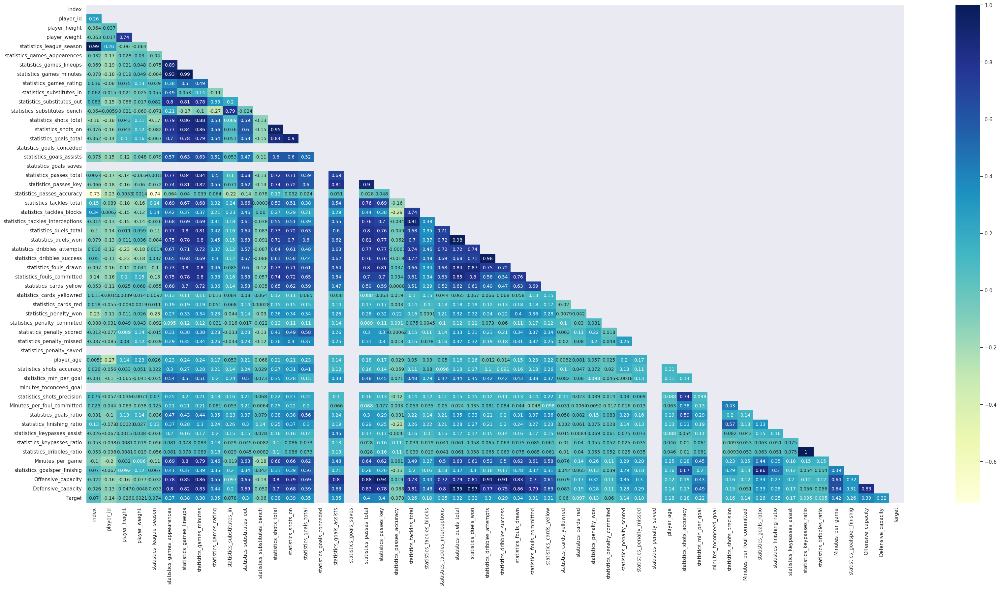

In [112]:
# Rodar Heatmap para posição de atacante

df_heatmap = X_df.copy()
df_heatmap["Target"] = y_df['log_player_value']

sns.set(rc={"figure.figsize": (40, 20)})

# creating mask
mask = np.triu(np.ones_like(df_heatmap[(df_heatmap['statistics_games_position'] == 'Attacker')].corr()))

# plotting a triangle correlation heatmap
dataplot = sns.heatmap(df_heatmap[(df_heatmap['statistics_games_position'] == 'Attacker')].corr(), cmap="YlGnBu", annot=True,annot_kws={'size': 10}, mask=mask)

# displaying heatmap
plt.show()

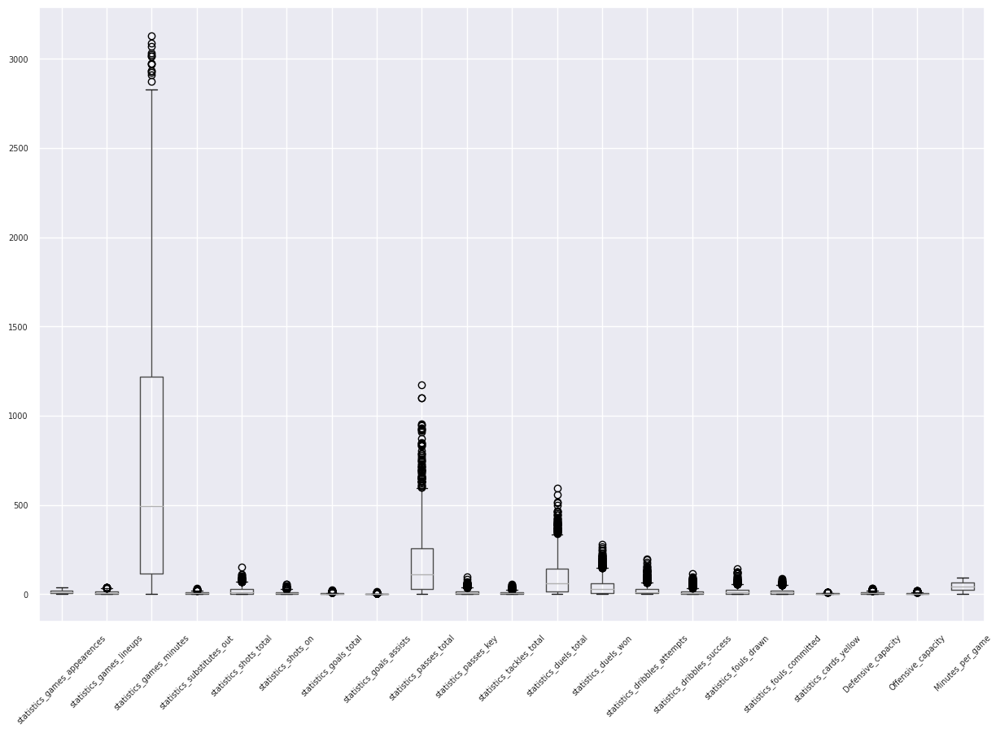

In [113]:
# Distribuição e presença de outliers de variáveis importantes (correlação de pearson mais significativa) para a posição atacante

Mask = data=df_heatmap[(df_heatmap['statistics_games_position'] == 'Attacker')]
plt.rcParams["figure.figsize"] = (15,10)
plt.xticks(fontsize= 5)
Mask.boxplot(column=[
        "statistics_games_appearences",
        "statistics_games_lineups",
        "statistics_games_minutes",
        "statistics_substitutes_out",
        "statistics_shots_total",
        "statistics_shots_on",
        "statistics_goals_total",
        "statistics_goals_assists",
        "statistics_passes_total",
        "statistics_passes_key",
        "statistics_tackles_total",
        "statistics_duels_total",
        "statistics_duels_won",
        "statistics_dribbles_attempts",
        "statistics_dribbles_success",
        "statistics_fouls_drawn",
        "statistics_fouls_committed",
        "statistics_cards_yellow",
        "Defensive_capacity",
        "Offensive_capacity",
        "Minutes_per_game",
    ], rot=45, fontsize=7)

In [114]:
# Dados estatísticos das variáveis significativas para a posição de atacante
attacker_describe = df_heatmap[(df_heatmap['statistics_games_position'] == 'Attacker')][
        ["statistics_games_appearences",
        "statistics_games_lineups",
        "statistics_games_minutes",
        "statistics_substitutes_out",
        "statistics_shots_total",
        "statistics_shots_on",
        "statistics_goals_total",
        "statistics_goals_assists",
        "statistics_passes_total",
        "statistics_passes_key",
        "statistics_tackles_total",
        "statistics_duels_total",
        "statistics_duels_won",
        "statistics_dribbles_attempts",
        "statistics_dribbles_success",
        "statistics_fouls_drawn",
        "statistics_fouls_committed",
        "statistics_cards_yellow",
        "Defensive_capacity",
        "Offensive_capacity",
        "Minutes_per_game",
]]
attacker_describe.describe(percentiles=[.25, .5, .75, .99])

,statistics_games_appearences,statistics_games_lineups,statistics_games_minutes,statistics_substitutes_out,statistics_shots_total,statistics_shots_on,statistics_goals_total,statistics_goals_assists,statistics_passes_total,statistics_passes_key,statistics_tackles_total,statistics_duels_total,statistics_duels_won,statistics_dribbles_attempts,statistics_dribbles_success,statistics_fouls_drawn,statistics_fouls_committed,statistics_cards_yellow,Defensive_capacity,Offensive_capacity,Minutes_per_game
count,1257.000000,1257.000000,1257.000000,1257.000000,1257.000000,1257.000000,1257.000000,1257.000000,1257.000000,1257.000000,1257.000000,1257.000000,1257.000000,1257.000000,1257.000000,1257.000000,1257.000000,1257.000000,1257.000000,1257.000000,1257.000000
mean,13.581543,8.334129,763.926014,4.826571,18.117343,7.410501,2.268894,0.975338,180.983294,10.176611,7.000796,99.011933,43.213206,20.585521,10.793158,16.043755,13.901352,1.790772,5.612411,2.745823,43.132657
std,10.410824,9.059414,767.580984,5.191108,20.606633,8.864882,3.392000,1.632726,205.126256,12.444232,8.189680,108.159026,49.535042,27.839609,15.456077,19.320309,14.927206,2.151132,6.233134,3.300545,24.989378
min,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000
25%,4.000000,1.000000,116.000000,0.000000,2.000000,1.000000,0.000000,0.000000,29.000000,1.000000,1.000000,14.000000,6.000000,3.000000,1.000000,2.000000,2.000000,0.000000,0.700000,0.400000,25.000000
50%,12.000000,5.000000,495.000000,3.000000,10.000000,4.000000,1.000000,0.000000,108.000000,5.000000,4.000000,62.000000,26.000000,10.000000,5.000000,9.000000,9.000000,1.000000,3.500000,1.600000,43.857143
75%,21.000000,14.000000,1217.000000,8.000000,28.000000,11.000000,3.000000,1.000000,255.000000,15.000000,10.000000,143.000000,62.000000,27.000000,14.000000,23.000000,21.000000,3.000000,8.200000,4.100000,63.375000
99%,35.000000,33.000000,2914.720000,21.000000,85.440000,37.440000,14.000000,7.000000,859.000000,57.000000,34.440000,435.840000,209.440000,131.440000,76.000000,85.200000,63.000000,9.000000,25.976000,14.588000,88.335435
max,37.000000,35.000000,3130.000000,31.000000,153.000000,57.000000,25.000000,14.000000,1174.000000,95.000000,54.000000,592.000000,277.000000,197.000000,114.000000,142.000000,88.000000,12.000000,32.000000,20.400000,90.000000


## Testes de Hipóteses

H0: O preço médio dos jogadores é o mesmo entre as posições dos jogadores.
Ha: O preço médio dos jogadores não é o mesmo entre as posições dos jogadores.

In [115]:
# Verificando se a posição do jogador tem influência no valor de mercado

tukey = pairwise_tukeyhsd(df_heatmap["Target"], df_heatmap["statistics_games_position"], alpha=0.05)

print(tukey)

    Multiple Comparison of Means - Tukey HSD, FWER=0.05     
  group1     group2   meandiff p-adj   lower   upper  reject
------------------------------------------------------------
  Attacker   Defender   -0.185  0.001 -0.3029  -0.067   True
  Attacker Goalkeeper  -0.9265  0.001 -1.0931 -0.7599   True
  Attacker Midfielder   0.0334 0.8723 -0.0833  0.1501  False
  Defender Goalkeeper  -0.7415  0.001 -0.9035 -0.5795   True
  Defender Midfielder   0.2184  0.001  0.1083  0.3284   True
Goalkeeper Midfielder   0.9599  0.001  0.7988   1.121   True
------------------------------------------------------------


Estatisticamente falando, a posição do jogador tem sua influência no preço final para um nível de significância de 5% (apenas as posições de meio-campo e atacante não possuem uma inferência representativa entre elas).

## Modelos de Regressão Linear para interpretabilidade

### Separando o dataframe em treino e teste

In [116]:
# Separaremos os dados de treino de 2015 a 2021 e usaremos os dados de 2022 para teste
# afim de já utilizarmos os jogadores com os dados mais atualizados possível para
# analisarmos os resultados

# df para teste
X_test = X_df[(X_df['statistics_league_season'] == 2022)].copy(deep=True)
y_test = df_heatmap[(df_heatmap['statistics_league_season'] == 2022)]['Target'].copy(deep=True)

# df para treino
X_train = X_df[X_df.statistics_league_season != 2022]
y_train = df_heatmap[df_heatmap.statistics_league_season != 2022]
y_train = y_train['Target'].copy(deep=True)

### Processando as variáveis numéricas (StandardScaler)

In [117]:
# A padronização normalmente significa redimensionar os dados para ter uma média de 0 e um desvio padrão de 1 (variância de unidade)

# Variáveis de treino (processando todas as variáveis de interesse de todas as posições)
X_train[
    ["statistics_games_appearences",
        "statistics_games_lineups",
        "statistics_games_minutes",
        "statistics_goals_conceded",
        "statistics_goals_saves",
        "statistics_passes_total",
        "statistics_cards_yellow",
        "player_age",
        "minutes_toconceed_goal",
        "Minutes_per_game",
        "statistics_shots_total",
        "statistics_shots_on",
        "statistics_tackles_total",
        "statistics_tackles_interceptions",
        "Defensive_capacity",
        "statistics_shots_on",
        "statistics_goals_total",
        "statistics_goals_assists",
        "statistics_passes_key",
        "statistics_duels_total",
        "statistics_dribbles_attempts",
        "statistics_dribbles_success",
        "statistics_fouls_drawn",
        "statistics_fouls_committed",
        "Offensive_capacity",
        "statistics_substitutes_out",
        "statistics_duels_won",
     ]
] = StandardScaler().fit_transform(
    X_train[["statistics_games_appearences",
        "statistics_games_lineups",
        "statistics_games_minutes",
        "statistics_goals_conceded",
        "statistics_goals_saves",
        "statistics_passes_total",
        "statistics_cards_yellow",
        "player_age",
        "minutes_toconceed_goal",
        "Minutes_per_game",
        "statistics_shots_total",
        "statistics_shots_on",
        "statistics_tackles_total",
        "statistics_tackles_interceptions",
        "Defensive_capacity",
        "statistics_shots_on",
        "statistics_goals_total",
        "statistics_goals_assists",
        "statistics_passes_key",
        "statistics_duels_total",
        "statistics_dribbles_attempts",
        "statistics_dribbles_success",
        "statistics_fouls_drawn",
        "statistics_fouls_committed",
        "Offensive_capacity",
        "statistics_substitutes_out",
        "statistics_duels_won",]]
)

df_model = X_train.copy(deep=True)
df_model["log_player_value"] = y_train.copy(deep=True)

/usr/local/lib/python3.7/dist-packages/pandas/core/frame.py:3678: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  self[col] = igetitem(value, i)


In [118]:
X_train

,index,player_id,player_name,player_firstname,player_lastname,player_birth_date,player_height,player_weight,statistics_league_season,statistics_games_appearences,statistics_games_lineups,statistics_games_minutes,statistics_games_position,statistics_games_rating,statistics_games_captain,statistics_substitutes_in,statistics_substitutes_out,statistics_substitutes_bench,statistics_shots_total,statistics_shots_on,statistics_goals_total,statistics_goals_conceded,statistics_goals_assists,statistics_goals_saves,statistics_passes_total,statistics_passes_key,statistics_passes_accuracy,statistics_tackles_total,statistics_tackles_blocks,statistics_tackles_interceptions,statistics_duels_total,statistics_duels_won,statistics_dribbles_attempts,statistics_dribbles_success,statistics_fouls_drawn,statistics_fouls_committed,statistics_cards_yellow,statistics_cards_yellowred,statistics_cards_red,statistics_penalty_won,statistics_penalty_commited,statistics_penalty_scored,statistics_penalty_missed,statistics_penalty_saved,full_player_name,club_names_tm,player_age,statistics_shots_accuracy,statistics_min_per_goal,minutes_toconceed_goal,statistics_shots_precision,Minutes_per_foul_committed,statistics_goals_ratio,statistics_finishing_ratio,statistics_keypasses_assist,statistics_keypasses_ratio,statistics_dribbles_ratio,Minutes_per_game,statistics_goalsper_finishig,Offensive_capacity,Defensive_capacity
0,876,9609,Danilo Gabriel de Andrade,Danilo Gabriel,de Andrade,1979-06-11,186.0,80.0,2016,-0.733460,-0.933173,-0.813444,Midfielder,6.533333,0,5.0,-0.762542,11.0,-0.601779,-0.336410,-0.059659,-0.197317,-0.530607,-0.19464,-0.695580,-0.480187,77.0,-0.701935,0.0,-0.637440,-0.399533,-0.568502,-0.395506,-0.507035,-0.449068,-0.670955,-0.892086,0.0,0.0,0.0,0.0,0.0,0.0,0.0,Danilo Gabriel de Andrade,Sport Club Corinthians Paulista,2.221655,0.50,228.0,-0.22753,1.000000,57.000000,0.500000,1.000000,0.000000,0.037500,0.037500,-0.547068,0.50,-0.503820,-0.652048
1,881,80586,Bruno Rangel Domingues,Bruno,Rangel Domingues,1981-12-11,178.0,74.0,2016,1.507932,0.756648,0.972066,Attacker,6.797009,0,12.0,0.575640,18.0,4.500650,3.926091,3.855605,-0.197317,-0.530607,-0.19464,-0.896457,-0.708471,66.0,-0.801887,0.0,-0.755403,-0.885377,-0.866559,-0.663096,-0.661476,-0.797173,-0.924513,0.287650,0.0,0.0,0.0,0.0,0.0,0.0,0.0,Bruno Rangel Domingues,Associacao Chapecoense de Futebol,1.805657,0.00,187.8,-0.22753,0.000000,0.000000,0.333333,0.352941,0.000000,0.000000,0.000000,0.202723,0.00,-0.057852,-0.880000
2,882,80589,Matheus Bitencourt da Silva,Matheus,Bitencourt da Silva,1995-06-28,177.0,73.0,2016,-0.105870,-0.088263,-0.013752,Midfielder,6.797009,0,3.0,-0.539511,11.0,-0.724729,-0.640874,-0.494688,-0.197317,-0.530607,-0.19464,-0.896457,-0.708471,66.0,-0.801887,0.0,-0.755403,-0.885377,-0.866559,-0.663096,-0.661476,-0.797173,-0.924513,-0.498841,0.0,0.0,0.0,0.0,0.0,0.0,0.0,Matheus Bitencourt da Silva,Associacao Chapecoense de Futebol,-1.106329,0.00,0.0,-0.22753,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.661085,0.00,-0.743957,-0.880000
3,884,80602,Jose Nivaldo Martins Constante,Jose Nivaldo,Martins Constante,1974-03-19,186.0,77.0,2016,-1.271395,-1.027052,-1.060169,Goalkeeper,6.797009,0,0.0,-0.762542,18.0,-0.724729,-0.640874,-0.494688,-0.197317,-0.530607,-0.19464,-0.896457,-0.708471,66.0,-0.801887,0.0,-0.755403,-0.885377,-0.866559,-0.663096,-0.661476,-0.797173,-0.924513,-0.892086,0.0,0.0,0.0,0.0,0.0,0.0,0.0,Jose Nivaldo Martins Constante,Associacao Chapecoense de Futebol,3.261650,0.00,0.0,-0.22753,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,-1.808859,0.00,-0.743957,-0.880000
4,885,80605,Luciano Javier Cabral,Luciano Javier,Cabral,1995-04-26,170.0,66.0,2016,-0.733460,-0.839294,-0.788555,Midfielder,6.797009,0,4.0,-0.316481,9.0,-0.724729,-0.640874,-0.494688,-0.197317,-0.530607,-0.19464,-0.896457,-0.708471,66.0,-0.801887,0.0,-0.755403,-0.885377,-0.866559,-0.663096,-0.661476,-0.797173,-0.924513,-0.892086,0.0,0.0,0.0,0.0,0.0,0.0,0.0,Luciano Javier Cabral,Cl

In [119]:
# Variáveis de treino (processando todas as variáveis de interesse de todas as posições)
X_test[
    ["statistics_games_appearences",
        "statistics_games_lineups",
        "statistics_games_minutes",
        "statistics_goals_conceded",
        "statistics_goals_saves",
        "statistics_passes_total",
        "statistics_cards_yellow",
        "player_age",
        "minutes_toconceed_goal",
        "Minutes_per_game",
        "statistics_shots_total",
        "statistics_shots_on",
        "statistics_tackles_total",
        "statistics_tackles_interceptions",
        "Defensive_capacity",
        "statistics_shots_on",
        "statistics_goals_total",
        "statistics_goals_assists",
        "statistics_passes_key",
        "statistics_duels_total",
        "statistics_dribbles_attempts",
        "statistics_dribbles_success",
        "statistics_fouls_drawn",
        "statistics_fouls_committed",
        "Offensive_capacity",
        "statistics_substitutes_out",
        "statistics_duels_won",
     ]
] = StandardScaler().fit_transform(
    X_test[["statistics_games_appearences",
        "statistics_games_lineups",
        "statistics_games_minutes",
        "statistics_goals_conceded",
        "statistics_goals_saves",
        "statistics_passes_total",
        "statistics_cards_yellow",
        "player_age",
        "minutes_toconceed_goal",
        "Minutes_per_game",
        "statistics_shots_total",
        "statistics_shots_on",
        "statistics_tackles_total",
        "statistics_tackles_interceptions",
        "Defensive_capacity",
        "statistics_shots_on",
        "statistics_goals_total",
        "statistics_goals_assists",
        "statistics_passes_key",
        "statistics_duels_total",
        "statistics_dribbles_attempts",
        "statistics_dribbles_success",
        "statistics_fouls_drawn",
        "statistics_fouls_committed",
        "Offensive_capacity",
        "statistics_substitutes_out",
        "statistics_duels_won",]]
)

df_model_test = X_test.copy(deep=True)
df_model_test["log_player_value"] = y_test.copy(deep=True)

### Goleiros

#### Primeiro Modelo de RL

In [120]:
# MODELO DE REGRESSÃO LINEAR MÚLTIPLA

df_model_GK = df_model[(df_model['statistics_games_position'] == 'Goalkeeper')].copy(deep=True)

model_GK = smf.ols(
    formula="log_player_value ~ statistics_games_appearences + statistics_games_lineups + statistics_games_minutes + statistics_goals_conceded + statistics_goals_saves + statistics_passes_total + statistics_cards_yellow + player_age + minutes_toconceed_goal + Minutes_per_game",
    data=df_model_GK,
)
model_GK_fit = model_GK.fit()
print(model_GK_fit.summary())

# PLOTANDO TABELA DE RESULTADOS PARA O MODELO AJUSTADO
p = model_GK_fit.params

                            OLS Regression Results                            
Dep. Variable:       log_player_value   R-squared:                       0.467
Model:                            OLS   Adj. R-squared:                  0.454
Method:                 Least Squares   F-statistic:                     36.05
Date:                Sat, 19 Nov 2022   Prob (F-statistic):           2.23e-50
Time:                        19:41:20   Log-Likelihood:                -595.98
No. Observations:                 423   AIC:                             1214.
Df Residuals:                     412   BIC:                             1258.
Df Model:                          10                                         
Covariance Type:            nonrobust                                         
                                   coef    std err          t      P>|t|      [0.025      0.975]
------------------------------------------------------------------------------------------------
Intercept       

O valor de r² ajustado de 0.45 foi um valor surpreendente, levando em consideração que sabemos que o preço de mercado não se explica apenas pela performance do jogador. Metade das variáveis tiveram um p-valor acima de 0.1, vamos fazer um teste removendo essas variáveis para ver como o modelo se comportaria.

#### Segundo Modelo de RL

In [121]:
# MODELO DE REGRESSÃO LINEAR MÚLTIPLA

df_model_GK = df_model[(df_model['statistics_games_position'] == 'Goalkeeper')].copy(deep=True)

model_GK = smf.ols(
    formula="log_player_value ~ statistics_games_lineups + statistics_goals_conceded + statistics_goals_saves + player_age + Minutes_per_game",
    data=df_model_GK,
)
model_GK_fit = model_GK.fit()
print(model_GK_fit.summary())

# PLOTANDO TABELA DE RESULTADOS PARA O MODELO AJUSTADO
p = model_GK_fit.params

                            OLS Regression Results                            
Dep. Variable:       log_player_value   R-squared:                       0.461
Model:                            OLS   Adj. R-squared:                  0.454
Method:                 Least Squares   F-statistic:                     71.21
Date:                Sat, 19 Nov 2022   Prob (F-statistic):           9.25e-54
Time:                        19:41:20   Log-Likelihood:                -598.37
No. Observations:                 423   AIC:                             1209.
Df Residuals:                     417   BIC:                             1233.
Df Model:                           5                                         
Covariance Type:            nonrobust                                         
                                coef    std err          t      P>|t|      [0.025      0.975]
---------------------------------------------------------------------------------------------
Intercept             

  Resultados:
*   R² adj: 0.45
*   F-test: 9.25e-54 (rejeita-se a hipótese nula - modelo é adequado)
*   Durbin-Watson: 1.85 (entre 0 e 4 - quanto mais perto de 2 melhor; indica independência dos resíduos)
*   Omnibus e JB apontam distribuição normal dos resíduos (não rejeita-se H0)






/usr/local/lib/python3.7/dist-packages/seaborn/_decorators.py:43: FutureWarning: Pass the following variables as keyword args: x, y. From version 0.12, the only valid positional argument will be `data`, and passing other arguments without an explicit keyword will result in an error or misinterpretation.
  FutureWarning


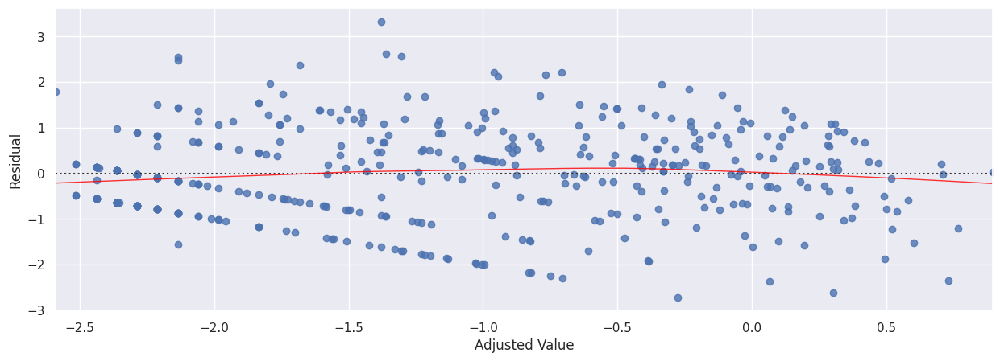

[('Breusch pagan statistic', 10.881000185238253), ('p-value', 0.053791121007989856)]

[('Goldfeld-Quandt - statistic', 1.3553045149391625), ('p-value', 0.014901151503204394)]

[('White’s statistic', 39.291090982162636), ('p-value', 0.00613299143345613)]



In [122]:
# Verificando a variância dos erros (homocedasticidade)

plt.rcParams["figure.figsize"] = (15, 5)

# PLOT DE LINEARIDADE E HOMOCEDASTICIDADE

model_residual = model_GK_fit.resid
model_y_adjusted = model_GK_fit.fittedvalues
X = model_GK_fit.model.exog

sns.residplot(
    model_y_adjusted,
    model_residual,
    lowess=True,
    line_kws={"color": "red", "lw": 1, "alpha": 0.8},
)
plt.ylabel("Residual")
plt.xlabel("Adjusted Value")
plt.show()

# TESTES DE HETEROCEDASTICIDADE

# Breush-Pagan test:

name = ["Breusch pagan statistic", "p-value"]
test = sms.het_breuschpagan(model_residual, X)
print(lzip(name, test))
print()

# Goldfeld-Quandt test

name = ["Goldfeld-Quandt - statistic", "p-value"]
test = sms.het_goldfeldquandt(model_residual, X)
print(lzip(name, test))
print()

# White’s Test
name = ["White’s statistic", "p-value"]
test = het_white(model_residual, X)
print(lzip(name, test))
print()

A não-linearidade dos resíduos deve ser corrigida mais adiante.

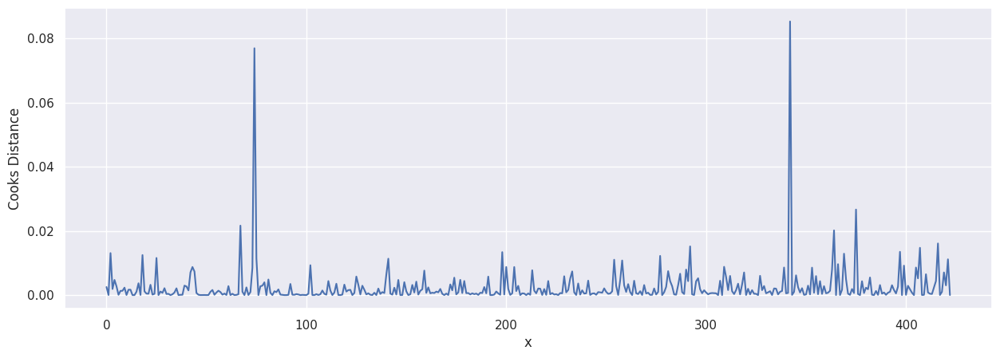

In [123]:
# ANÉLISE DE PONTOS INFLUENTES (resultados devem estar abaixo de 1)

influence = model_GK_fit.get_influence()

cooks = influence.cooks_distance
plt.plot(cooks[0])
plt.xlabel("x")
plt.ylabel("Cooks Distance")
plt.show()

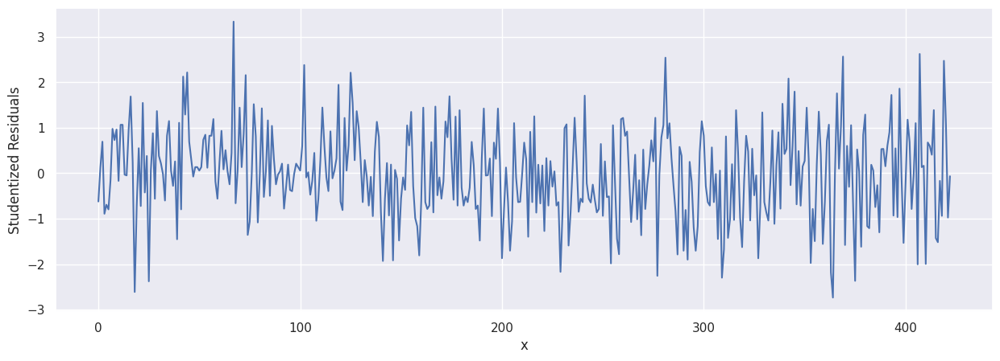

In [124]:
# Gráfico de resíduos estudentizados para verificar se o modelo está bem ajustado (valores devem estar entre -3 e 3 para resíduos estudentizados)

student_resid = influence.resid_studentized_internal
plt.plot(student_resid)
plt.xlabel("x")
plt.ylabel("Studentized Residuals")
plt.show()

Apenas um resíduo encontra-se fora do intervalo especificado (-3 a 3).

In [125]:
np.where(student_resid > 3)

(array([67]),)

#### Terceiro modelo de RL

In [126]:
#Removendo o outlier encontrado
df_model_GK = df_model_GK.reset_index()
df_model_GK = df_model_GK.drop(
    labels=[67], axis=0,)

In [127]:
# MODELO DE REGRESSÃO LINEAR MÚLTIPLA (após remover outlier)

model_GK = smf.ols(
    formula="log_player_value ~ statistics_games_lineups + statistics_goals_conceded + statistics_goals_saves + player_age + Minutes_per_game",
    data=df_model_GK,
)
model_GK_fit = model_GK.fit()
print(model_GK_fit.summary())

# PLOTANDO TABELA DE RESULTADOS PARA O MODELO AJUSTADO
p = model_GK_fit.params

                            OLS Regression Results                            
Dep. Variable:       log_player_value   R-squared:                       0.469
Model:                            OLS   Adj. R-squared:                  0.462
Method:                 Least Squares   F-statistic:                     73.37
Date:                Sat, 19 Nov 2022   Prob (F-statistic):           5.68e-55
Time:                        19:41:22   Log-Likelihood:                -591.75
No. Observations:                 422   AIC:                             1196.
Df Residuals:                     416   BIC:                             1220.
Df Model:                           5                                         
Covariance Type:            nonrobust                                         
                                coef    std err          t      P>|t|      [0.025      0.975]
---------------------------------------------------------------------------------------------
Intercept             

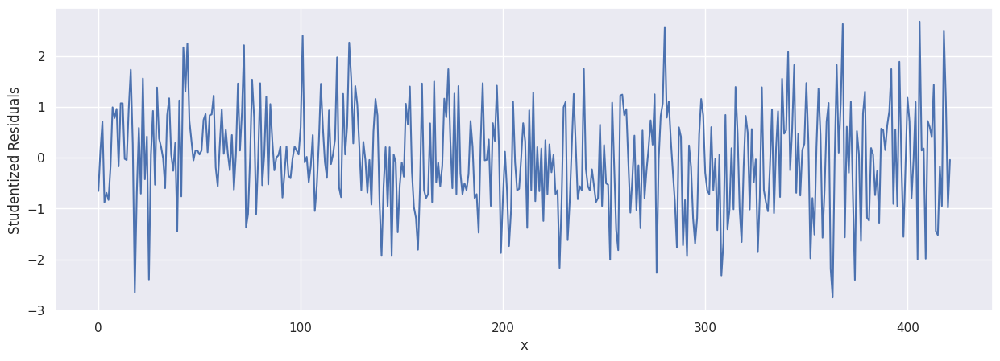

In [128]:
# Verificando mais uma vez o gráfico de resíduos estudentizados para verificar
# se o modelo está bem ajustado (valores devem estar entre -3 e 3 para resíduos estudentizados)

influence = model_GK_fit.get_influence()

student_resid = influence.resid_studentized_internal
plt.plot(student_resid)
plt.xlabel("x")
plt.ylabel("Studentized Residuals")
plt.show()

O modelo encontra-se bem ajustado.

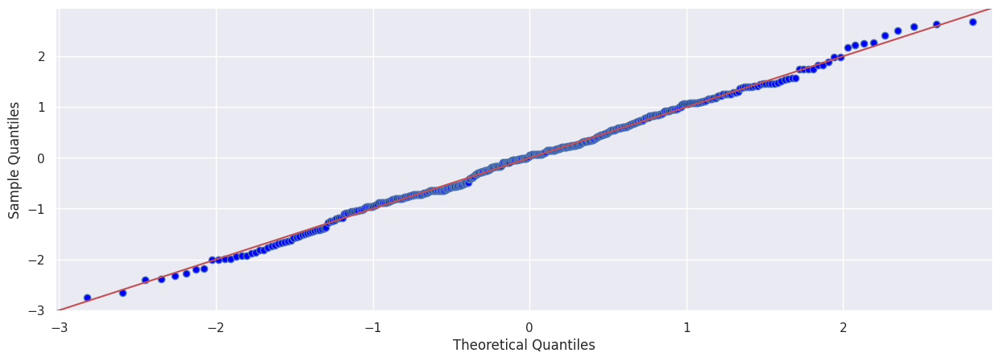

Statistics=0.996, p=0.473
Sample looks Gaussian (fail to reject H0)


In [129]:
# Gráfico para avaliar a normalidade dos resíduos

model_residual = model_GK_fit.resid
model_y_adjusted = model_GK_fit.fittedvalues

sm.qqplot(model_residual, line="45", fit=True, dist=stats.norm)
plt.show()

# Shapiro-Wilk test
stat, p = shapiro(model_residual)
print("Statistics=%.3f, p=%.3f" % (stat, p))
# interpret
alpha = 0.05
if p > alpha:
    print("Sample looks Gaussian (fail to reject H0)")
else:
    print("Sample does not look Gaussian (reject H0)")

**log_player_value = -1.2525 + 0.2818 * statistics_games_lineups + 0.1661 * statistics_goals_saves - 0.1491 * statistics_goals_conceded + 0.3701 * player_age + 0.2275 * Minuter_per_game**

In [130]:
# Analisando multicolinearidade 
# (1 a 5: sem correlação; 5 a 10: correlação moderada; acima de 10: forte correlação)

vif = pd.DataFrame()

vif["VIF Factor"] = [
    variance_inflation_factor(model_GK_fit.model.exog, i)
    for i in range(1, model_GK_fit.model.exog.shape[1])
]
vif["Variable"] = model_GK_fit.model.exog_names[1:]
print(vif)

   VIF Factor                   Variable
0   11.423195   statistics_games_lineups
1   11.723618  statistics_goals_conceded
2   18.087352     statistics_goals_saves
3    1.301705                 player_age
4    1.738592           Minutes_per_game


In [131]:
# MODELO DE REGRESSÃO LINEAR MÚLTIPLA (após remover outlier e variável statistics_goals_saves)
# Ao retirar a variável statistics_goals_saves a variável statistics_goals_conceded apresentou alto p_valor e por isso também foi removida

model_GK = smf.ols(
    formula="log_player_value ~ statistics_games_lineups + player_age + Minutes_per_game",
    data=df_model_GK,
)
model_GK_fit = model_GK.fit()
print(model_GK_fit.summary())

# PLOTANDO TABELA DE RESULTADOS PARA O MODELO AJUSTADO
p = model_GK_fit.params

                            OLS Regression Results                            
Dep. Variable:       log_player_value   R-squared:                       0.461
Model:                            OLS   Adj. R-squared:                  0.457
Method:                 Least Squares   F-statistic:                     119.2
Date:                Sat, 19 Nov 2022   Prob (F-statistic):           8.78e-56
Time:                        19:41:23   Log-Likelihood:                -594.74
No. Observations:                 422   AIC:                             1197.
Df Residuals:                     418   BIC:                             1214.
Df Model:                           3                                         
Covariance Type:            nonrobust                                         
                               coef    std err          t      P>|t|      [0.025      0.975]
--------------------------------------------------------------------------------------------
Intercept               

In [132]:
# Analisando multicolinearidade 
# (1 a 5: sem correlação; 5 a 10: correlação moderada; acima de 10: forte correlação)

vif = pd.DataFrame()

vif["VIF Factor"] = [
    variance_inflation_factor(model_GK_fit.model.exog, i)
    for i in range(1, model_GK_fit.model.exog.shape[1])
]
vif["Variable"] = model_GK_fit.model.exog_names[1:]
print(vif)

   VIF Factor                  Variable
0    1.690649  statistics_games_lineups
1    1.297001                player_age
2    1.727183          Minutes_per_game


**log_player_value = -1.2213 + 0.3355 * statistics_games_lineups + 0.3662 * player_age + 0.2185 * Minuter_per_game**

#### Validando o modelo

In [133]:
# Separando os dados de treino e teste conforme a posição de goleiro

# separando dados de treino em target e variáveis explicativas
y_train_GK = df_model_GK['log_player_value'].copy(deep=True)
X_train_GK = df_model_GK[(df_model_GK['statistics_games_position'] == 'Goalkeeper')].copy(deep=True)
X_train_GK.drop('log_player_value', axis=1, inplace=True)

# separando dados de teste em target e variáveis explicativas
y_test_GK = df_model_test[(df_model_test['statistics_games_position'] == 'Goalkeeper')]['log_player_value'].copy(deep=True)
X_test_GK = df_model_test[(df_model_test['statistics_games_position'] == 'Goalkeeper')].copy(deep=True)
X_test_GK.drop('log_player_value', axis=1, inplace=True)

In [134]:
# Função para "fittar"o modelo preditor e gerar o resultados de RMSE e r² para dados de treino e teste.
def linear_reg_print(model, X_train, X_test, y_train, y_test, name):
    train_pred = model.predict(X_train)
    rmse_train = mean_squared_error(y_train, train_pred) ** 0.5
    r2_train = r2_score(y_train, train_pred)

    test_pred = model.predict(X_test)
    rmse_test = mean_squared_error(y_test, test_pred) ** 0.5
    r2_test = r2_score(y_test, test_pred)

    print(
        f"""***{name}***
    train
    RMSE: {round(rmse_train, 2)}
    R2: {round(r2_train, 2)}\n
    test
    RMSE: {round(rmse_test, 2)}
    R2: {round(r2_test, 2)}"""
    )

In [135]:
rlm = LinearRegression()
rlm.fit(
    X_train_GK[
        [
        'statistics_games_lineups',
        'player_age', 
        'Minutes_per_game'
        ]
    ],
    y_train_GK,
)

linear_reg_print(
    rlm,
    X_train_GK[
        [
        'statistics_games_lineups',
        'player_age', 
        'Minutes_per_game'
        ]
    ],
    X_test_GK[
        [
        'statistics_games_lineups',
        'player_age', 
        'Minutes_per_game'
        ]
    ],
    y_train_GK,
    y_test_GK,
    "Multiple Linear Regression",
)

***Multiple Linear Regression***
    train
    RMSE: 0.99
    R2: 0.46

    test
    RMSE: 1.15
    R2: 0.13


### Defensores

#### Primeiro modelo de RL

In [136]:
# MODELO DE REGRESSÃO LINEAR MÚLTIPLA

df_model_DF = df_model[(df_model['statistics_games_position'] == 'Defender')].copy(deep=True)

model_DF = smf.ols(
    formula="log_player_value ~ statistics_games_appearences + statistics_games_lineups + statistics_games_minutes + statistics_shots_total + statistics_shots_on + statistics_passes_total + statistics_tackles_total + statistics_tackles_interceptions + statistics_cards_yellow + player_age + Defensive_capacity + Minutes_per_game",
    data=df_model_DF,
)
model_DF_fit = model_DF.fit()
print(model_DF_fit.summary())

# PLOTANDO TABELA DE RESULTADOS PARA O MODELO AJUSTADO
p = model_DF_fit.params

                            OLS Regression Results                            
Dep. Variable:       log_player_value   R-squared:                       0.264
Model:                            OLS   Adj. R-squared:                  0.258
Method:                 Least Squares   F-statistic:                     40.32
Date:                Sat, 19 Nov 2022   Prob (F-statistic):           2.62e-81
Time:                        19:41:23   Log-Likelihood:                -1883.9
No. Observations:                1361   AIC:                             3794.
Df Residuals:                    1348   BIC:                             3862.
Df Model:                          12                                         
Covariance Type:            nonrobust                                         
                                       coef    std err          t      P>|t|      [0.025      0.975]
----------------------------------------------------------------------------------------------------
Intercep

#### Segundo modelo de RL

In [137]:
# MODELO DE REGRESSÃO LINEAR MÚLTIPLA - eliminando variáveis com p-valor elevado

# variáveis removidas: statistics_games_appearences + statistics_games_lineups + statistics_shots_on + statistics_tackles_total e statistics_cards_yellow (alto p-valor)
# statistics_tackles_interceptions aumenta o VIF de Defensive_capacity para acima de 10 e por isso foi removida

df_model_DF = df_model[(df_model['statistics_games_position'] == 'Defender')].copy(deep=True)

model_DF = smf.ols(
    formula="log_player_value ~ statistics_games_minutes + statistics_shots_total + statistics_passes_total + player_age + Defensive_capacity + Minutes_per_game",
    data=df_model_DF,
)
model_DF_fit = model_DF.fit()
print(model_DF_fit.summary())

# PLOTANDO TABELA DE RESULTADOS PARA O MODELO AJUSTADO
p = model_DF_fit.params

                            OLS Regression Results                            
Dep. Variable:       log_player_value   R-squared:                       0.257
Model:                            OLS   Adj. R-squared:                  0.254
Method:                 Least Squares   F-statistic:                     77.98
Date:                Sat, 19 Nov 2022   Prob (F-statistic):           8.37e-84
Time:                        19:41:23   Log-Likelihood:                -1890.6
No. Observations:                1361   AIC:                             3795.
Df Residuals:                    1354   BIC:                             3832.
Df Model:                           6                                         
Covariance Type:            nonrobust                                         
                               coef    std err          t      P>|t|      [0.025      0.975]
--------------------------------------------------------------------------------------------
Intercept               

Resultados:
*   R² adj: 0.25
*   F-test: 8.37e-84 (rejeita-se a hipótese nula - modelo é adequado)
*   Durbin-Watson: 1.73 (entre 0 e 4 - quanto mais perto de 2 melhor; indica independência dos resíduos)
*   Omnibus e JB apontam distribuição normal dos resíduos (não rejeita-se H0)





In [138]:
# Analisando multicolinearidade 
# (1 a 5: sem correlação; 5 a 10: correlação moderada; acima de 10: forte correlação)
# Ao rodar pela primeira vez a variável Defensive_capacity estava acima de 10, por
# teste excluí a variável e ficou com r² = 0.22, depois removemos a variável
# statistics_tackles_interceptions e o r² ficou com 0.25, por isso essa foi removida

vif = pd.DataFrame()

vif["VIF Factor"] = [
    variance_inflation_factor(model_DF_fit.model.exog, i)
    for i in range(1, model_DF_fit.model.exog.shape[1])
]
vif["Variable"] = model_DF_fit.model.exog_names[1:]
print(vif)

   VIF Factor                  Variable
0    7.533041  statistics_games_minutes
1    1.953343    statistics_shots_total
2    4.458641   statistics_passes_total
3    1.085829                player_age
4    4.643768        Defensive_capacity
5    1.735284          Minutes_per_game


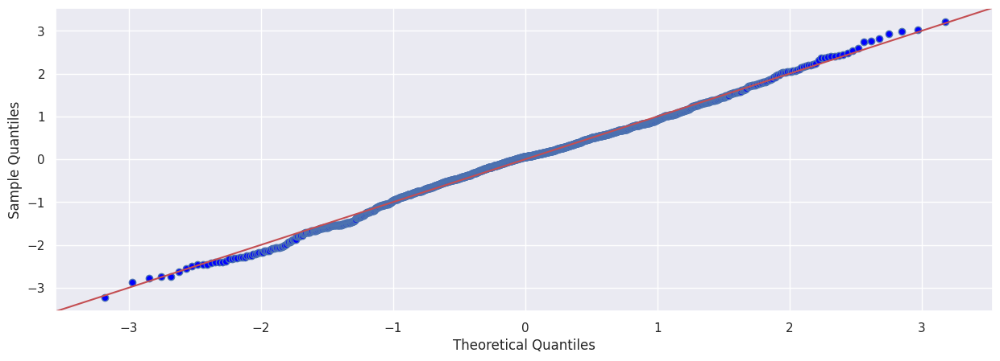

Statistics=0.996, p=0.001
Sample does not look Gaussian (reject H0)


In [139]:
# Gráfico para avaliar a normalidade dos resíduos

model_residual = model_DF_fit.resid
model_y_adjusted = model_DF_fit.fittedvalues

sm.qqplot(model_residual, line="45", fit=True, dist=stats.norm)
plt.show()

# Shapiro-Wilk test
stat, p = shapiro(model_residual)
print("Statistics=%.3f, p=%.3f" % (stat, p))
# interpret
alpha = 0.05
if p > alpha:
    print("Sample looks Gaussian (fail to reject H0)")
else:
    print("Sample does not look Gaussian (reject H0)")

A distribuição dos resíduos não segue normalidade, podemos mais adiante testar uma transformação de box-cox

/usr/local/lib/python3.7/dist-packages/seaborn/_decorators.py:43: FutureWarning: Pass the following variables as keyword args: x, y. From version 0.12, the only valid positional argument will be `data`, and passing other arguments without an explicit keyword will result in an error or misinterpretation.
  FutureWarning


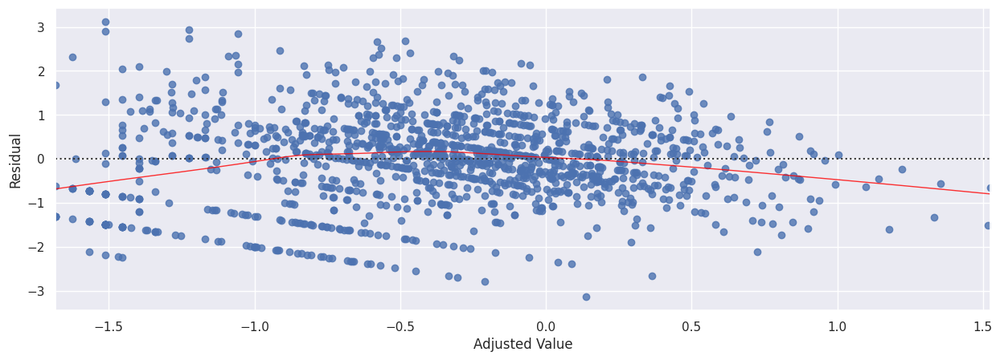

[('Breusch pagan statistic', 109.42671138732854), ('p-value', 2.6873242299350907e-21)]

[('Goldfeld-Quandt - statistic', 1.2588740156595704), ('p-value', 0.0014271959153172179)]

[('White’s statistic', 183.98781178077203), ('p-value', 2.6546032859281304e-25)]



In [140]:
# Verificando a variância dos erros (homocedasticidade)

plt.rcParams["figure.figsize"] = (15, 5)

# PLOT DE LINEARIDADE E HOMOCEDASTICIDADE

model_residual = model_DF_fit.resid
model_y_adjusted = model_DF_fit.fittedvalues
X = model_DF_fit.model.exog

sns.residplot(
    model_y_adjusted,
    model_residual,
    lowess=True,
    line_kws={"color": "red", "lw": 1, "alpha": 0.8},
)
plt.ylabel("Residual")
plt.xlabel("Adjusted Value")
plt.show()

# TESTES DE HETEROCEDASTICIDADE

# Breush-Pagan test:

name = ["Breusch pagan statistic", "p-value"]
test = sms.het_breuschpagan(model_residual, X)
print(lzip(name, test))
print()

# Goldfeld-Quandt test

name = ["Goldfeld-Quandt - statistic", "p-value"]
test = sms.het_goldfeldquandt(model_residual, X)
print(lzip(name, test))
print()

# White’s Test
name = ["White’s statistic", "p-value"]
test = het_white(model_residual, X)
print(lzip(name, test))
print()

Mais uma vez os resíduos não seguem o princípio de linearidade

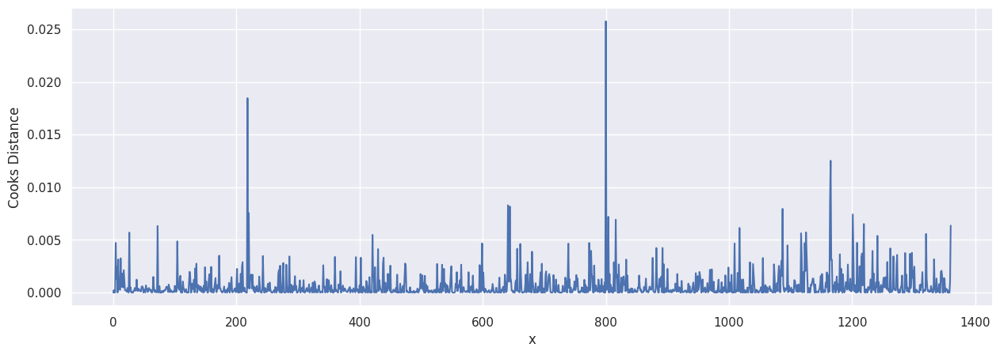

In [141]:
# ANÉLISE DE PONTOS INFLUENTES (resultados devem estar abaixo de 1)

influence = model_DF_fit.get_influence()

cooks = influence.cooks_distance
plt.plot(cooks[0])
plt.xlabel("x")
plt.ylabel("Cooks Distance")
plt.show()

Valores abaixo de 1 indicam que não há presença de pontos influentes

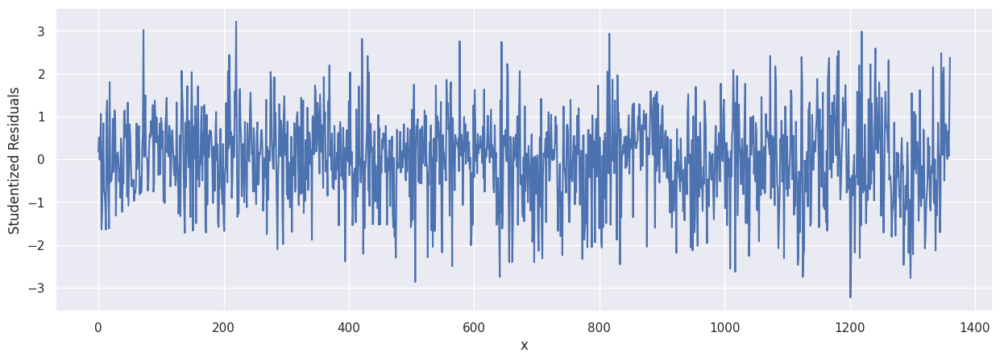

In [142]:
# Gráfico de resíduos estudentizados para verificar se o modelo está bem ajustado (valores devem estar entre -3 e 3 para resíduos estudentizados)

student_resid = influence.resid_studentized_internal
plt.plot(student_resid)
plt.xlabel("x")
plt.ylabel("Studentized Residuals")
plt.show()

In [143]:
np.where(student_resid > 3)

(array([ 72, 220]),)

In [144]:
#Removendo o outlier encontrado
df_model_DF = df_model_DF.reset_index()
df_model_DF = df_model_DF.drop(
    labels=[72, 220], axis=0,)

In [145]:
# MODELO DE REGRESSÃO LINEAR MÚLTIPLA (após remover outlier)

# Defensive_capacity foi removida por apresentar p-valor de 0.544 na primeira vez que este código foi rodado

model_DF = smf.ols(
    formula="log_player_value ~ statistics_games_minutes + statistics_shots_total + statistics_passes_total + player_age + Minutes_per_game",
    data=df_model_DF,
)
model_DF_fit = model_DF.fit()
print(model_DF_fit.summary())

# PLOTANDO TABELA DE RESULTADOS PARA O MODELO AJUSTADO
p = model_DF_fit.params

                            OLS Regression Results                            
Dep. Variable:       log_player_value   R-squared:                       0.264
Model:                            OLS   Adj. R-squared:                  0.261
Method:                 Least Squares   F-statistic:                     96.99
Date:                Sat, 19 Nov 2022   Prob (F-statistic):           1.81e-87
Time:                        19:41:25   Log-Likelihood:                -1879.1
No. Observations:                1359   AIC:                             3770.
Df Residuals:                    1353   BIC:                             3802.
Df Model:                           5                                         
Covariance Type:            nonrobust                                         
                               coef    std err          t      P>|t|      [0.025      0.975]
--------------------------------------------------------------------------------------------
Intercept               

**log_player_value = -0.4018 -0.2571 * statistics_games_minutes + 0.4219 * statistics_shots_total + 0.2964 * statistics_passes_total + 0.2753 * player_age + 0.2801 * Minutes_per_game**

In [146]:
X_val_train = X_train.select_dtypes(include=np.number).copy(deep=True)
X_val_train

,index,player_id,player_height,player_weight,statistics_league_season,statistics_games_appearences,statistics_games_lineups,statistics_games_minutes,statistics_games_rating,statistics_substitutes_in,statistics_substitutes_out,statistics_substitutes_bench,statistics_shots_total,statistics_shots_on,statistics_goals_total,statistics_goals_conceded,statistics_goals_assists,statistics_goals_saves,statistics_passes_total,statistics_passes_key,statistics_passes_accuracy,statistics_tackles_total,statistics_tackles_blocks,statistics_tackles_interceptions,statistics_duels_total,statistics_duels_won,statistics_dribbles_attempts,statistics_dribbles_success,statistics_fouls_drawn,statistics_fouls_committed,statistics_cards_yellow,statistics_cards_yellowred,statistics_cards_red,statistics_penalty_won,statistics_penalty_commited,statistics_penalty_scored,statistics_penalty_missed,statistics_penalty_saved,player_age,statistics_shots_accuracy,statistics_min_per_goal,minutes_toconceed_goal,statistics_shots_precision,Minutes_per_foul_committed,statistics_goals_ratio,statistics_finishing_ratio,statistics_keypasses_assist,statistics_keypasses_ratio,statistics_dribbles_ratio,Minutes_per_game,statistics_goalsper_finishig,Offensive_capacity,Defensive_capacity
0,876,9609,186.0,80.0,2016,-0.733460,-0.933173,-0.813444,6.533333,5.0,-0.762542,11.0,-0.601779,-0.336410,-0.059659,-0.197317,-0.530607,-0.19464,-0.695580,-0.480187,77.0,-0.701935,0.0,-0.637440,-0.399533,-0.568502,-0.395506,-0.507035,-0.449068,-0.670955,-0.892086,0.0,0.0,0.0,0.0,0.0,0.0,0.0,2.221655,0.50,228.0,-0.22753,1.000000,57.000000,0.500000,1.000000,0.000000,0.037500,0.037500,-0.547068,0.50,-0.503820,-0.652048
1,881,80586,178.0,74.0,2016,1.507932,0.756648,0.972066,6.797009,12.0,0.575640,18.0,4.500650,3.926091,3.855605,-0.197317,-0.530607,-0.19464,-0.896457,-0.708471,66.0,-0.801887,0.0,-0.755403,-0.885377,-0.866559,-0.663096,-0.661476,-0.797173,-0.924513,0.287650,0.0,0.0,0.0,0.0,0.0,0.0,0.0,1.805657,0.00,187.8,-0.22753,0.000000,0.000000,0.333333,0.352941,0.000000,0.000000,0.000000,0.202723,0.00,-0.057852,-0.880000
2,882,80589,177.0,73.0,2016,-0.105870,-0.088263,-0.013752,6.797009,3.0,-0.539511,11.0,-0.724729,-0.640874,-0.494688,-0.197317,-0.530607,-0.19464,-0.896457,-0.708471,66.0,-0.801887,0.0,-0.755403,-0.885377,-0.866559,-0.663096,-0.661476,-0.797173,-0.924513,-0.498841,0.0,0.0,0.0,0.0,0.0,0.0,0.0,-1.106329,0.00,0.0,-0.22753,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.661085,0.00,-0.743957,-0.880000
3,884,80602,186.0,77.0,2016,-1.271395,-1.027052,-1.060169,6.797009,0.0,-0.762542,18.0,-0.724729,-0.640874,-0.494688,-0.197317,-0.530607,-0.19464,-0.896457,-0.708471,66.0,-0.801887,0.0,-0.755403,-0.885377,-0.866559,-0.663096,-0.661476,-0.797173,-0.924513,-0.892086,0.0,0.0,0.0,0.0,0.0,0.0,0.0,3.261650,0.00,0.0,-0.22753,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,-1.808859,0.00,-0.743957,-0.880000
4,885,80605,170.0,66.0,2016,-0.733460,-0.839294,-0.788555,6.797009,4.0,-0.316481,9.0,-0.724729,-0.640874,-0.494688,-0.197317,-0.530607,-0.19464,-0.896457,-0.708471,66.0,-0.801887,0.0,-0.755403,-0.885377,-0.866559,-0.663096,-0.661476,-0.797173,-0.924513,-0.892086,0.0,0.0,0.0,0.0,0.0,0.0,0.0,-1.106329,0.00,0.0,-0.22753,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,-0.419782,0.00,-0.743957,-0.880000
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
4342,6736,265785,181.0,77.0,2021,1.687244,1.226043,0.981805,6.862500,9.0,4.590184,9.0,1.734272,1.947073,2.115488,-0.197317,0.851483,-0.19464,0.527262,1.193894,13.0,1.846821,19.5,1.220466,2.706060,2.561100,3.796747,4.357875,1.523526,0.913778,0.680895,0.0,0.0,0.0,0.0,0.0,0.0,0.0,-1.314328,0.15,314.5,-0.22753,0.425000,65.068966,0.352941,0.425000,0.080000,0.044092,0.044092,0.089865,0.15,2.892401,2.425297
4343,6737,266657,174.0,71.0,2021,-0.912772,

### Meio-Campo

#### Primeiro modelo de RL

In [147]:
# MODELO DE REGRESSÃO LINEAR MÚLTIPLA

df_model_MF = df_model[(df_model['statistics_games_position'] == 'Midfielder')].copy(deep=True)

model_MF = smf.ols(
    formula="log_player_value ~ statistics_games_appearences + statistics_games_lineups + statistics_games_minutes + statistics_shots_total + statistics_shots_on + statistics_goals_total + statistics_goals_assists + statistics_passes_total + statistics_passes_key + statistics_tackles_total + statistics_duels_total + statistics_dribbles_attempts + statistics_dribbles_success + statistics_fouls_drawn + statistics_fouls_committed + statistics_cards_yellow + Defensive_capacity + Offensive_capacity + Minutes_per_game",
    data=df_model_DF,
)
model_MF_fit = model_MF.fit()
print(model_MF_fit.summary())

# PLOTANDO TABELA DE RESULTADOS PARA O MODELO AJUSTADO
p = model_MF_fit.params

                            OLS Regression Results                            
Dep. Variable:       log_player_value   R-squared:                       0.229
Model:                            OLS   Adj. R-squared:                  0.218
Method:                 Least Squares   F-statistic:                     22.06
Date:                Sat, 19 Nov 2022   Prob (F-statistic):           2.51e-63
Time:                        19:41:25   Log-Likelihood:                -1910.9
No. Observations:                1359   AIC:                             3860.
Df Residuals:                    1340   BIC:                             3959.
Df Model:                          18                                         
Covariance Type:            nonrobust                                         
                                   coef    std err          t      P>|t|      [0.025      0.975]
------------------------------------------------------------------------------------------------
Intercept       

#### Segundo modelo de RL

In [148]:
# MODELO DE REGRESSÃO LINEAR MÚLTIPLA - eliminando variáveis com p-valor elevado

# variáveis removidas: statistics_games_appearences + statistics_games_lineups + statistics_shots_on + statistics_tackles_total e statistics_cards_yellow (alto p-valor)
# statistics_tackles_total e statistics_cards_yellow foram removidas após rodarmos este código uma primeira vez pois o p-valor ficou alto (0.88 e 0.14 respectivamente)

model_MF = smf.ols(
    formula="log_player_value ~ statistics_games_minutes + statistics_passes_total + statistics_dribbles_attempts + statistics_dribbles_success + Minutes_per_game",
    data=df_model_DF,
)
model_MF_fit = model_MF.fit()
print(model_MF_fit.summary())

# PLOTANDO TABELA DE RESULTADOS PARA O MODELO AJUSTADO
p = model_MF_fit.params

                            OLS Regression Results                            
Dep. Variable:       log_player_value   R-squared:                       0.201
Model:                            OLS   Adj. R-squared:                  0.198
Method:                 Least Squares   F-statistic:                     67.93
Date:                Sat, 19 Nov 2022   Prob (F-statistic):           1.88e-63
Time:                        19:41:25   Log-Likelihood:                -1935.1
No. Observations:                1359   AIC:                             3882.
Df Residuals:                    1353   BIC:                             3913.
Df Model:                           5                                         
Covariance Type:            nonrobust                                         
                                   coef    std err          t      P>|t|      [0.025      0.975]
------------------------------------------------------------------------------------------------
Intercept       

**log_player_value = -0.5358 - 0.1527 * statistics_games_minutes + 0.3476 * statistics_passes_total + 0.4438 * statistics_dribbles_attempts - 0.3477 * statistics_dribbles_success + 0.3161 * Minutes_per_game**

### Atacante

#### Primeiro modelo de RL

In [149]:
# MODELO DE REGRESSÃO LINEAR MÚLTIPLA

df_model_AT = df_model[(df_model['statistics_games_position'] == 'Attacker')].copy(deep=True)

model_AT = smf.ols(
    formula="log_player_value ~ statistics_games_appearences + statistics_games_lineups + statistics_games_minutes + statistics_substitutes_out + statistics_shots_total + statistics_shots_on + statistics_goals_total + statistics_goals_assists + statistics_passes_total + statistics_passes_key + statistics_tackles_total + statistics_duels_total + statistics_duels_won + statistics_dribbles_attempts + statistics_dribbles_success + statistics_fouls_drawn + statistics_fouls_committed + statistics_cards_yellow + Defensive_capacity + Offensive_capacity + Minutes_per_game",
    data=df_model_AT,
)
model_AT_fit = model_AT.fit()
print(model_AT_fit.summary())

# PLOTANDO TABELA DE RESULTADOS PARA O MODELO AJUSTADO
p = model_AT_fit.params

                            OLS Regression Results                            
Dep. Variable:       log_player_value   R-squared:                       0.287
Model:                            OLS   Adj. R-squared:                  0.274
Method:                 Least Squares   F-statistic:                     21.99
Date:                Sat, 19 Nov 2022   Prob (F-statistic):           1.01e-66
Time:                        19:41:25   Log-Likelihood:                -1651.3
No. Observations:                1113   AIC:                             3345.
Df Residuals:                    1092   BIC:                             3450.
Df Model:                          20                                         
Covariance Type:            nonrobust                                         
                                   coef    std err          t      P>|t|      [0.025      0.975]
------------------------------------------------------------------------------------------------
Intercept       

#### Segundo modelo de RL

In [150]:
# MODELO DE REGRESSÃO LINEAR MÚLTIPLA - eliminando variáveis com p-valor elevado

# variáveis removidas: statistics_games_minutes + statistics_substitutes_out + statistics_shots_total + statistics_shots_on + statistics_goals_total + statistics_goals_assists + 
# statistics_games_appearences + statistics_games_lineups + statistics_fouls_committed + statistics_cards_yellow + statistics_passes_key (alto p-valor)

model_MF = smf.ols(
    formula="log_player_value ~ statistics_passes_total + statistics_tackles_total + statistics_duels_total + statistics_duels_won + statistics_dribbles_attempts + statistics_dribbles_success + statistics_fouls_drawn + Defensive_capacity + Offensive_capacity + Minutes_per_game",
    data=df_model_DF,
)
model_MF_fit = model_MF.fit()
print(model_MF_fit.summary())

# PLOTANDO TABELA DE RESULTADOS PARA O MODELO AJUSTADO
p = model_MF_fit.params

                            OLS Regression Results                            
Dep. Variable:       log_player_value   R-squared:                       0.222
Model:                            OLS   Adj. R-squared:                  0.216
Method:                 Least Squares   F-statistic:                     38.40
Date:                Sat, 19 Nov 2022   Prob (F-statistic):           9.17e-67
Time:                        19:41:25   Log-Likelihood:                -1917.0
No. Observations:                1359   AIC:                             3856.
Df Residuals:                    1348   BIC:                             3913.
Df Model:                          10                                         
Covariance Type:            nonrobust                                         
                                   coef    std err          t      P>|t|      [0.025      0.975]
------------------------------------------------------------------------------------------------
Intercept       

**log_player_value = -0.5820 + 0.2384 * statistics_passes_total + 0.2255 * statistics_tackles_total - 0.7841 * statistics_duels_total + 0.9589 * statistics_duels_won + 0.5591 * statistics_dribbles_attempts - 0.6970 * statistics_dribbles_success - 0.2111 * statistics_fouls_drawn - 0.4950 * Defensive_capacity + 0.4569 * Offensive_capacity + 0.3274 * Minute_per_game**

## Random Forest

In [151]:
from sklearn.ensemble import RandomForestRegressor
import math

# Metrics function
def metrics_report(y, y_pred, dataset_name="valid"):
    mean_y = np.mean(y)
    mean_pred = np.mean(y_pred)

    rmse = round(math.sqrt(mean_squared_error(y, y_pred)), 2)
    mae = mean_absolute_error(y, y_pred)
    r2 = r2_score(y, y_pred)
    mape = mean_absolute_percentage_error(y, y_pred)

    report = pd.DataFrame(
        {
            "metric": ["RMSE", "MAE", "R^2", "MAPE", "Avg. target", "Avg. Prediction"],
            dataset_name: [rmse, mae, r2, mape, mean_y, mean_pred],
        }
    )

    report[dataset_name] = report[dataset_name]
    return report

#####################################################################################

# Preparando o dataset de treino e teste
X_val_train = df_model.drop(['index', 'player_id', 'player_name', 'player_firstname', 'player_lastname', 'player_birth_date', 'statistics_league_season', 
                             'full_player_name', 'club_names_tm', 'statistics_games_captain', 'log_player_value'],
                            axis=1).copy(deep=True)

X_val_test = df_model_test.drop(['index', 'player_id', 'player_name', 'player_firstname', 'player_lastname', 'player_birth_date', 'statistics_league_season', 
                             'full_player_name', 'club_names_tm',  'statistics_games_captain', 'log_player_value'],
                            axis=1).copy(deep=True)

#####################################################################################

# Categóricas pre-processing (categorical encoders)
encoder = ce.OneHotEncoder(use_cat_names=True)
df_train_encoded = encoder.fit_transform(X_val_train["statistics_games_position"])

X_val_train["goalkeeper"] = df_train_encoded["statistics_games_position_Goalkeeper"].copy(deep=True)
X_val_train["defender"] = df_train_encoded["statistics_games_position_Defender"].copy(deep=True)
X_val_train["midfielder"] = df_train_encoded["statistics_games_position_Midfielder"].copy(deep=True)
X_val_train["attacker"] = df_train_encoded["statistics_games_position_Attacker"].copy(deep=True)
X_val_train.drop(['statistics_games_position'], axis=1, inplace=True)

df_test_encoded = encoder.fit_transform(X_val_test["statistics_games_position"])

X_val_test["goalkeeper"] = df_test_encoded["statistics_games_position_Goalkeeper"].copy(deep=True)
X_val_test["defender"] = df_test_encoded["statistics_games_position_Defender"].copy(deep=True)
X_val_test["midfielder"] = df_test_encoded["statistics_games_position_Midfielder"].copy(deep=True)
X_val_test["attacker"] = df_test_encoded["statistics_games_position_Attacker"].copy(deep=True)
X_val_test.drop(['statistics_games_position'], axis=1, inplace=True)

X_vale_test_Goleiro = X_val_test[(X_val_test['goalkeeper'] == 1)].copy(deep=True)

#####################################################################################

rf_baseline = RandomForestRegressor(random_state=42)
# Training
rf_baseline.fit(X_val_train, y_train)

y_val_baseline_pred = rf_baseline.predict(X_val_test)
baseline_report = metrics_report(y_test, y_val_baseline_pred, "validation")
baseline_report

,metric,validation
0,RMSE,1.150000e+00
1,MAE,9.015493e-01
2,R^2,1.259650e-01
3,MAPE,1.614807e+14
4,Avg. target,-1.531202e-02
5,Avg. Prediction,-4.226767e-01


In [152]:
# https://scikit-learn.org/stable/modules/generated/sklearn.inspection.permutation_importance.html
print("Running permutation feature importance")
permutation_result = permutation_importance(
    rf_baseline, X_val_test, y_test, n_repeats=5,
)

Running permutation feature importance


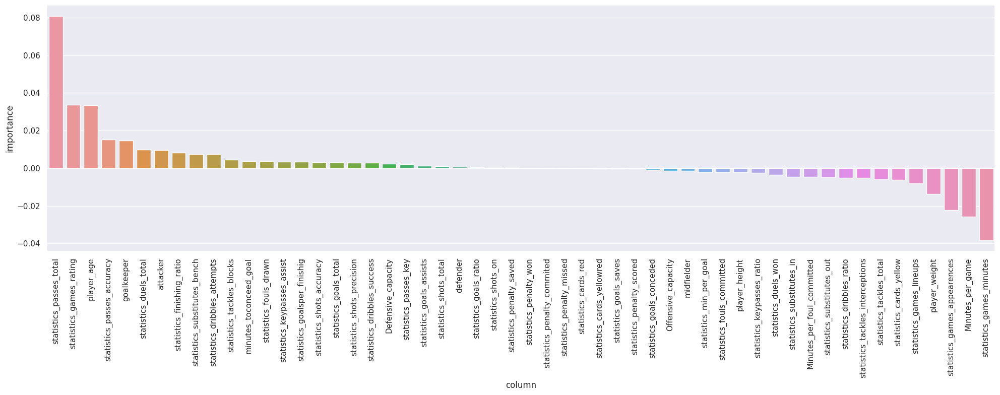

In [153]:
importances = pd.DataFrame(
    {"column": X_val_test.columns, "importance": permutation_result.importances_mean}
)
importances.sort_values(by="importance", ascending=False, inplace=True)

fig, axs = plt.subplots(figsize=(20, 8))
ax = sns.barplot(x="column", y="importance", data=importances)
plt.xticks(rotation=90)
plt.tight_layout()

### Otimizando os hiperparâmetros do modelo

In [154]:
# hiperparâmetros: n_estimators: [], max_features: [], min_samples_leaf: []
for n_estimators in [205, 210, 215, 220]:
    print(f"Random forest, with n_estimators {n_estimators}")
    rf_model = RandomForestRegressor(n_estimators=n_estimators, random_state=42)
    rf_model.fit(X_val_train, y_train)
    y_val_pred = rf_model.predict(X_val_test)
    rmse = math.sqrt(mean_squared_error(y_test, y_val_pred))
    print(f"rmse: {rmse}\n")

Random forest, with n_estimators 205
rmse: 1.1414697510815774

Random forest, with n_estimators 210
rmse: 1.1406849845190183

Random forest, with n_estimators 215
rmse: 1.1419183401719064

Random forest, with n_estimators 220
rmse: 1.1414587909371652



O melhor número de árvores de decisão para o modelo de RandomForest foi de 210.

In [155]:
# hiperparâmetros: n_estimators: [210], max_features: [], min_samples_leaf: []
for max_features in ["sqrt", 0.1, 0.2, 0.3, 0.4, 0.6]:
    print(f"Random forest, with max_features {max_features}")
    rf_model = RandomForestRegressor(
        n_estimators=210, max_features=max_features, random_state=42
    )
    rf_model.fit(X_val_train, y_train)
    y_val_pred = rf_model.predict(X_val_test)
    rmse = math.sqrt(mean_squared_error(y_test, y_val_pred))
    print(f"rmse: {rmse}\n")

Random forest, with max_features sqrt
rmse: 1.1315982514133727

Random forest, with max_features 0.1
rmse: 1.1295357512916218

Random forest, with max_features 0.2
rmse: 1.1339906849630788

Random forest, with max_features 0.3
rmse: 1.1365504830441586

Random forest, with max_features 0.4
rmse: 1.1404823733398894

Random forest, with max_features 0.6
rmse: 1.1353230674453827



A melhor taxa de divisão de variáveis para o modelo é de 0.1.

In [156]:
# hiperparâmetros: n_estimators: [210], max_features: [0.1], min_samples_leaf: []
for min_samples_leaf in list(range(4, 10)):
    print(f"Random forest, with min_samples_leaf {min_samples_leaf}")
    rf_model = RandomForestRegressor(
        n_estimators=210,
        max_features=0.1,
        min_samples_leaf=min_samples_leaf,
        random_state=42,
    )
    rf_model.fit(X_val_train, y_train)
    y_val_pred = rf_model.predict(X_val_test)
    rmse = math.sqrt(mean_squared_error(y_test, y_val_pred))
    print(f"rmse: {rmse}\n")

Random forest, with min_samples_leaf 4
rmse: 1.1167327066836308

Random forest, with min_samples_leaf 5
rmse: 1.1146074589742874

Random forest, with min_samples_leaf 6
rmse: 1.1173309397215425

Random forest, with min_samples_leaf 7
rmse: 1.1210808255679052

Random forest, with min_samples_leaf 8
rmse: 1.1189284182967467

Random forest, with min_samples_leaf 9
rmse: 1.1191093448293605



O melhor número de folhas para o modelo é de 5.

### Random Forest com os melhores hiperparâmetros

In [157]:
# hiperparams: n_estimators: [210], max_features: [0.1], min_samples_leaf: [5]
rf_model = RandomForestRegressor(
    n_estimators=210, max_features=0.1, min_samples_leaf=5, random_state=42
)
rf_model.fit(X_val_train, y_train)
y_val_pred = rf_model.predict(X_val_test)
metrics_report(y_test, y_val_pred, "validation")

,metric,validation
0,RMSE,1.110000e+00
1,MAE,8.948054e-01
2,R^2,1.728500e-01
3,MAPE,1.446268e+14
4,Avg. target,-1.531202e-02
5,Avg. Prediction,-3.627579e-01


### Importância das features

In [158]:
# https://scikit-learn.org/stable/modules/generated/sklearn.inspection.permutation_importance.html
print("Running permutation feature importance")
permutation_result = permutation_importance(
    rf_model, X_val_test, y_test, n_repeats=5, random_state=42
)

Running permutation feature importance


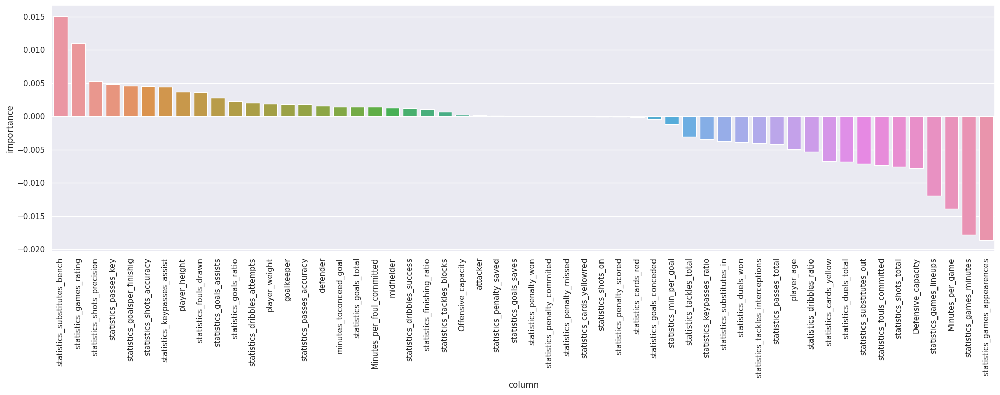

In [159]:
importances = pd.DataFrame(
    {"column": X_val_test.columns, "importance": permutation_result.importances_mean}
)
importances.sort_values(by="importance", ascending=False, inplace=True)

fig, axs = plt.subplots(figsize=(20, 8))
ax = sns.barplot(x="column", y="importance", data=importances)
plt.xticks(rotation=90)
plt.tight_layout()

In [160]:
# Usando as 25 melhores features
best_features = importances.head(25).column.tolist()
print(best_features)

['statistics_substitutes_bench', 'statistics_games_rating', 'statistics_shots_precision', 'statistics_passes_key', 'statistics_goalsper_finishig', 'statistics_shots_accuracy', 'statistics_keypasses_assist', 'player_height', 'statistics_fouls_drawn', 'statistics_goals_assists', 'statistics_goals_ratio', 'statistics_dribbles_attempts', 'player_weight', 'goalkeeper', 'statistics_passes_accuracy', 'defender', 'minutes_toconceed_goal', 'statistics_goals_total', 'Minutes_per_foul_committed', 'midfielder', 'statistics_dribbles_success', 'statistics_finishing_ratio', 'statistics_tackles_blocks', 'Offensive_capacity', 'attacker']


In [161]:
# Fitting o modelo final de RandomForest
rf_model = RandomForestRegressor(
    n_estimators=210, max_features=0.1, min_samples_leaf=5, random_state=42
)
rf_model.fit(X_val_train[best_features], y_train)

# Computing predictions
y_train_pred = rf_model.predict(X_val_train[best_features])
y_val_pred = rf_model.predict(X_val_test[best_features])

# Computing the train, validation and test model performance metrics
train_report = metrics_report(y_train, y_train_pred, "train")
val_report = metrics_report(y_test, y_val_pred, "validation")

final_report = pd.concat(
    [train_report, val_report[["validation"]]], axis=1
)

features = X_val_train.columns.tolist()

print(f"Baseline report (total features: {len(features)})")
print(baseline_report)
print("")
print(f"Final report (total features: {len(best_features)})")
print(final_report)

Baseline report (total features: 54)
            metric    validation
0             RMSE  1.150000e+00
1              MAE  9.015493e-01
2              R^2  1.259650e-01
3             MAPE  1.614807e+14
4      Avg. target -1.531202e-02
5  Avg. Prediction -4.226767e-01

Final report (total features: 25)
            metric         train    validation
0             RMSE  8.800000e-01  1.120000e+00
1              MAE  6.744238e-01  9.060295e-01
2              R^2  4.975294e-01  1.578939e-01
3             MAPE  1.131110e+14  1.344976e+14
4      Avg. target -3.212679e-01 -1.531202e-02
5  Avg. Prediction -3.203048e-01 -3.791361e-01


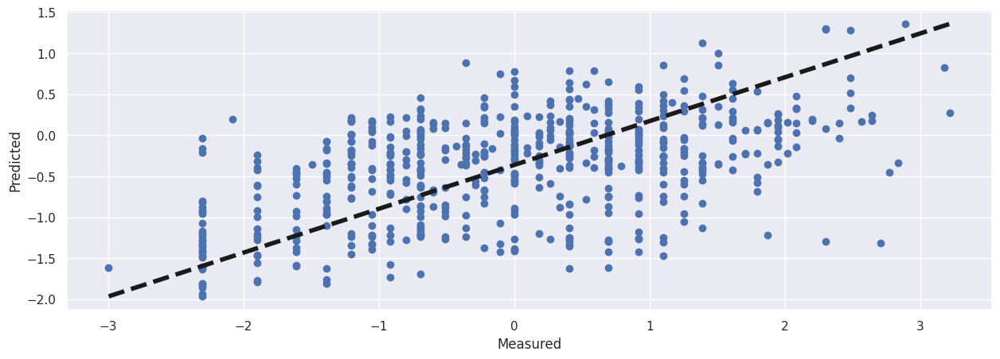

In [162]:
fig, ax = plt.subplots()
ax.scatter(y_test, y_val_pred)
ax.plot([y_test.min(), y_test.max()], [y_val_pred.min(), y_val_pred.max()], 'k--', lw=4)
ax.set_xlabel('Measured')
ax.set_ylabel('Predicted')
plt.show()

In [163]:
# Transformando os valores de mercado de log para milhões de euros
valor_performance = []
for val in y_val_pred.tolist():
  valor_performance.append(np.e**val)
valor_performance = pd.DataFrame(valor_performance)

valor_mercado = []
for val in y_test.tolist():
  valor_mercado.append(np.e**val)
valor_mercado = pd.DataFrame(valor_mercado)

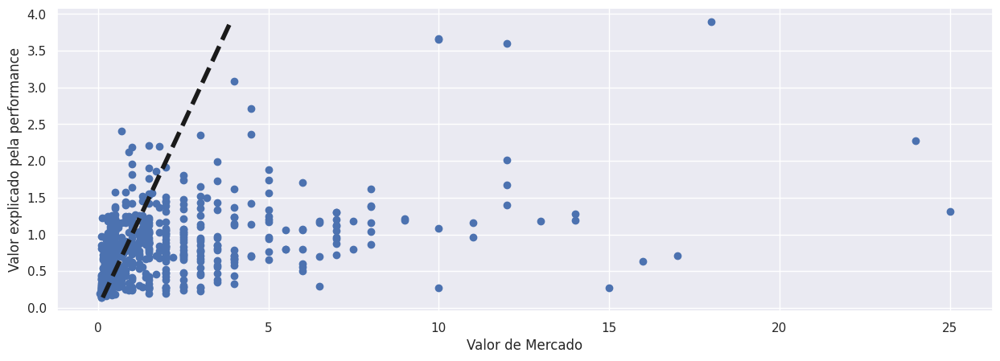

In [164]:
fig, ax = plt.subplots()
ax.scatter(valor_mercado, valor_performance)
ax.plot([valor_performance.min(), valor_performance.max()], [valor_performance.min(), valor_performance.max()], 'k--', lw=4)
ax.set_xlabel('Valor de Mercado')
ax.set_ylabel('Valor explicado pela performance')
plt.show()

#### Comparando alguns jogadores

In [165]:
#Definindo um nome para a coluna do df para explorar os dados
valor_performance.rename(columns = {0:'valor'}, inplace = True)
valor_performance

,valor
0,0.303046
1,1.613425
2,0.781572
3,0.176658
4,0.296832
...,...
595,1.217962
596,1.007569
597,0.586494
598,0.418213


In [166]:
# Comparando jogadores com valor de performance entre 2.0 e 2.5 milhões de euros
valor_performance[(valor_performance['valor']>2) & (valor_performance['valor']<2.5)]

,valor
73,2.410370
85,2.195412
116,2.358916
140,2.278022
156,2.356833
254,2.008500
397,2.204949
550,2.182636
555,2.121462


In [167]:
valor_mercado.loc[555]

0    0.9
Name: 555, dtype: float64

In [168]:
X_val_test.iloc[555]

player_height                       180.000000
player_weight                        64.000000
statistics_games_appearences          1.104604
statistics_games_lineups              1.632318
statistics_games_minutes              1.372074
statistics_games_rating               7.207142
statistics_substitutes_in             0.000000
statistics_substitutes_out            2.676844
statistics_substitutes_bench          0.000000
statistics_shots_total                1.426765
statistics_shots_on                   0.764015
statistics_goals_total                1.535022
statistics_goals_conceded            -0.195528
statistics_goals_assists             -0.508001
statistics_goals_saves               -0.200060
statistics_passes_total               1.564781
statistics_passes_key                 2.528010
statistics_passes_accuracy           32.000000
statistics_tackles_total              0.864010
statistics_tackles_blocks             8.000000
statistics_tackles_interceptions      0.718045
statistics_du

In [169]:
df[(df['tm_player_value']=='€900Th.') & (df['player_weight']=='64 kg')]

,index,player_id,player_name,player_firstname,player_lastname,player_birth_date,player_height,player_weight,statistics_league_season,statistics_games_appearences,statistics_games_lineups,statistics_games_minutes,statistics_games_position,statistics_games_rating,statistics_games_captain,statistics_substitutes_in,statistics_substitutes_out,statistics_substitutes_bench,statistics_shots_total,statistics_shots_on,statistics_goals_total,statistics_goals_conceded,statistics_goals_assists,statistics_goals_saves,statistics_passes_total,statistics_passes_key,statistics_passes_accuracy,statistics_tackles_total,statistics_tackles_blocks,statistics_tackles_interceptions,statistics_duels_total,statistics_duels_won,statistics_dribbles_attempts,statistics_dribbles_success,statistics_fouls_drawn,statistics_fouls_committed,statistics_cards_yellow,statistics_cards_yellowred,statistics_cards_red,statistics_penalty_won,statistics_penalty_commited,statistics_penalty_scored,statistics_penalty_missed,statistics_penalty_saved,full_player_name,club_names_tm,tm_player_value
1679,3291,10035,Marco Antonio Rosa Furtado Junior,Marco Antonio,Rosa Furtado Junior,1997-10-01,172 cm,64 kg,2018,10.0,5.0,432.0,Midfielder,6.670000,False,5.0,5.0,12.0,7.0,1.0,0.0,NaN,NaN,NaN,119.0,8.0,75.0,6.0,0.0,2.0,64.0,32.0,20.0,9.0,14.0,7.0,2.0,0.0,0.0,NaN,NaN,0.0,0.0,NaN,Marco Antonio Rosa Furtado Junior,Esporte Clube Bahia,€900Th.
1701,3322,33617,Gabriel Santana Pinto,Gabriel,Santana Pinto,1990-01-06,178 cm,64 kg,2018,33.0,31.0,2714.0,Attacker,6.918181,False,2.0,10.0,2.0,33.0,14.0,5.0,NaN,3.0,NaN,1174.0,45.0,84.0,26.0,0.0,25.0,282.0,142.0,33.0,21.0,58.0,25.0,4.0,0.0,0.0,1.0,NaN,0.0,1.0,NaN,Gabriel Santana Pinto,Sport Club do Recife,€900Th.
2413,4198,10035,Marco Antonio Rosa Furtado Junior,Marco Antonio,Rosa Furtado Junior,1997-10-01,172 cm,64 kg,2019,6.0,3.0,344.0,Midfielder,7.300000,False,3.0,2.0,23.0,6.0,3.0,1.0,NaN,1.0,NaN,93.0,9.0,80.0,10.0,0.0,1.0,NaN,NaN,16.0,10.0,11.0,3.0,0.0,0.0,0.0,1.0,NaN,0.0,0.0,NaN,Marco Antonio Rosa Furtado Junior,Esporte Clube Bahia,€900Th.
2519,4332,10425,Marcinho,Márcio Augusto,da Silva Barbosa,1995-05-16,173 cm,64 kg,2019,8.0,6.0,472.0,Attacker,6.871428,False,2.0,6.0,3.0,8.0,7.0,2.0,NaN,2.0,NaN,55.0,9.0,71.0,7.0,0.0,1.0,41.0,19.0,12.0,3.0,6.0,5.0,2.0,0.0,0.0,NaN,NaN,0.0,0.0,NaN,Marcio Augusto da Silva Barbosa,Fortaleza Esporte Clube,€900Th.
4902,7742,9325,Jorginho,Jorge,de Moura Xavier,1991-01-05,180 cm,64 kg,2022,17.0,17.0,1343.0,Midfielder,7.207142,False,0.0,12.0,0.0,15.0,5.0,3.0,0.0,NaN,NaN,547.0,23.0,32.0,19.0,1.0,4.0,143.0,86.0,42.0,28.0,19.0,8.0,6.0,0.0,0.0,NaN,NaN,0.0,0.0,NaN,Jorge de Moura Xavier,Atletico Clube Goianiense,€900Th.


In [170]:
df[(df['index']==6986) | (df['index']==7006) | (df['index']==7065) | (df['index']==7105) | (df['index']==7135) | (df['index']==7295) | (df['index']==7515) | (df['index']==7735) | (df['index']==7742)]

,index,player_id,player_name,player_firstname,player_lastname,player_birth_date,player_height,player_weight,statistics_league_season,statistics_games_appearences,statistics_games_lineups,statistics_games_minutes,statistics_games_position,statistics_games_rating,statistics_games_captain,statistics_substitutes_in,statistics_substitutes_out,statistics_substitutes_bench,statistics_shots_total,statistics_shots_on,statistics_goals_total,statistics_goals_conceded,statistics_goals_assists,statistics_goals_saves,statistics_passes_total,statistics_passes_key,statistics_passes_accuracy,statistics_tackles_total,statistics_tackles_blocks,statistics_tackles_interceptions,statistics_duels_total,statistics_duels_won,statistics_dribbles_attempts,statistics_dribbles_success,statistics_fouls_drawn,statistics_fouls_committed,statistics_cards_yellow,statistics_cards_yellowred,statistics_cards_red,statistics_penalty_won,statistics_penalty_commited,statistics_penalty_scored,statistics_penalty_missed,statistics_penalty_saved,full_player_name,club_names_tm,tm_player_value
4420,6986,10311,Ganso,Paulo Henrique,Chagas de Lima,1989-10-12,184 cm,79 kg,2022,18.0,18.0,1308.0,Midfielder,7.293333,False,0.0,16.0,0.0,8.0,4.0,3.0,0.0,2.0,NaN,799.0,33.0,47.0,19.0,1.0,3.0,112.0,62.0,24.0,16.0,23.0,8.0,3.0,0.0,0.0,NaN,NaN,1.0,0.0,NaN,Paulo Henrique Chagas de Lima,Fluminense Football Club,€700Th.
4432,7006,13523,G. Cano,Germán Ezequiel,Cano Recalde,1988-01-02,177 cm,81 kg,2022,21.0,20.0,1705.0,Attacker,7.241176,False,1.0,9.0,1.0,40.0,27.0,13.0,0.0,2.0,NaN,270.0,13.0,12.0,6.0,2.0,1.0,80.0,33.0,13.0,4.0,8.0,13.0,0.0,0.0,0.0,NaN,NaN,0.0,0.0,NaN,German Ezequiel Cano Recalde,Fluminense Football Club,€1.80m
4463,7065,9891,D. Terans,Miguel David,Terans Pérez,1994-08-11,172 cm,70 kg,2022,17.0,14.0,1091.0,Attacker,7.130769,False,3.0,13.0,3.0,30.0,13.0,7.0,0.0,2.0,NaN,281.0,20.0,18.0,7.0,NaN,4.0,85.0,29.0,25.0,11.0,8.0,11.0,3.0,0.0,0.0,NaN,NaN,4.0,1.0,NaN,Miguel David Terans Perez,Club Athletico Paranaense,€4.50m
4487,7105,10174,Gabriel Barbosa,Gabriel,Barbosa Almeida,1996-08-30,178 cm,74 kg,2022,19.0,15.0,1373.0,Attacker,7.123529,False,4.0,8.0,4.0,31.0,16.0,6.0,0.0,1.0,NaN,371.0,23.0,19.0,6.0,NaN,1.0,60.0,31.0,16.0,9.0,13.0,8.0,7.0,0.0,0.0,NaN,NaN,0.0,1.0,NaN,Gabriel Barbosa Almeida,Clube de Regatas do Flamengo,€24.00m
4503,7135,10387,Edenílson,Edenílson,Andrade dos Santos,1989-12-18,176 cm,71 kg,2022,18.0,17.0,1519.0,Midfielder,7.253333,False,1.0,7.0,1.0,17.0,6.0,4.0,0.0,3.0,NaN,573.0,29.0,33.0,24.0,4.0,7.0,114.0,56.0,23.0,12.0,11.0,8.0,3.0,0.0,0.0,NaN,NaN,1.0,0.0,NaN,Edenilson Andrade dos Santos,Sport Club Internacional,€3.00m
4601,7295,267771,Marcos Leonardo,Marcos Leonardo,Santos Almeida,2003-05-02,NaN,NaN,2022,19.0,18.0,1522.0,Attacker,7.053333,False,1.0,8.0,1.0,36.0,19.0,8.0,0.0,1.0,NaN,144.0,12.0,6.0,2.0,1.0,2.0,140.0,63.0,18.0,9.0,36.0,14.0,5.0,0.0,0.0,NaN,NaN,0.0,0.0,NaN,Marcos Leonardo Santos Almeida,Santos FC,€12.00m
4744,7515,9886,Vina,Vinícius,Goes Barbosa de Souza,1991-04-15,177 cm,73 kg,2022,17.0,16.0,1373.0,Midfielder,7.280000,False,1.0,5.0,1.0,23.0,12.0,2.0,0.0,1.0,NaN,529.0,44.0,28.0,5.0,NaN,9.0,88.0,45.0,18.0,10.0,24.0,6.0,3.0,1.0,0.0,NaN,NaN,0.0,0.0,NaN,Vinicius Goes Barbosa de Souza,Ceara Sporting Club,€1.50m
4897,7735,153454,Moises,Moises,Vieira da Veiga,1996-09-02,175 cm,80 kg,2022,21.0,18.0,1469.0,Attacker,6.794444,False,3.0,17.0,3.0,21.0,13.0,3.0,0.0,2.0,NaN,319.0,19.0,13.0,8.0,2.0,2.0,152.0,64.0,62.0,37.0,10.0,4.0,0.0,0.0,0.0,NaN,NaN,0.0,0.0,NaN,Moises Vieira da Veiga,Fortaleza Esporte Clube,€1.00m
4902,7742,9325,Jorginho,Jorge,de Moura Xavier,1991-01-05,180 cm,64 kg,2022,17.0,17.0,1343.0,Midfielder,7.207142,False,0.0,12.0,0.0,15.0,5.0,3.0,0.0,NaN,NaN,547.0,23.0,32.0,19.0,1.0,4.0,143.0,86.0,42.0,28.0,19.0,8.0,6.0,0.0,0.0,NaN,NaN,0.0,0.0,NaN,Jorge de Moura Xavier,Atletico Clube Goianiense,€900Th.


In [171]:
# Analisando jogadores com valor de performance em torno de 2 milhões de euros
valor_performance[(valor_performance['valor']>1.9) & (valor_performance['valor']<2.1)]

,valor
148,1.996203
165,1.900109
254,2.008500
336,1.919043
566,1.958279


In [172]:
#valor de mercado do jogador
valor_mercado.iloc[336]

0    2.0
Name: 336, dtype: float64

In [173]:
#características do jogador
X_val_test.iloc[566]

player_height                       172.000000
player_weight                        77.000000
statistics_games_appearences          1.552618
statistics_games_lineups              1.793774
statistics_games_minutes              1.785719
statistics_games_rating               6.964705
statistics_substitutes_in             2.000000
statistics_substitutes_out            1.797268
statistics_substitutes_bench          2.000000
statistics_shots_total                4.756325
statistics_shots_on                   3.869004
statistics_goals_total                2.858317
statistics_goals_conceded            -0.195528
statistics_goals_assists              0.762001
statistics_goals_saves               -0.200060
statistics_passes_total               1.153299
statistics_passes_key                 2.243511
statistics_passes_accuracy           21.000000
statistics_tackles_total              0.012924
statistics_tackles_blocks             3.500000
statistics_tackles_interceptions      0.075233
statistics_du

In [174]:
#filtrando jogadores com valor e característica semelhante
df[(df['tm_player_value']=='€2.00m') & (df['player_weight']=='86 kg')]

,index,player_id,player_name,player_firstname,player_lastname,player_birth_date,player_height,player_weight,statistics_league_season,statistics_games_appearences,statistics_games_lineups,statistics_games_minutes,statistics_games_position,statistics_games_rating,statistics_games_captain,statistics_substitutes_in,statistics_substitutes_out,statistics_substitutes_bench,statistics_shots_total,statistics_shots_on,statistics_goals_total,statistics_goals_conceded,statistics_goals_assists,statistics_goals_saves,statistics_passes_total,statistics_passes_key,statistics_passes_accuracy,statistics_tackles_total,statistics_tackles_blocks,statistics_tackles_interceptions,statistics_duels_total,statistics_duels_won,statistics_dribbles_attempts,statistics_dribbles_success,statistics_fouls_drawn,statistics_fouls_committed,statistics_cards_yellow,statistics_cards_yellowred,statistics_cards_red,statistics_penalty_won,statistics_penalty_commited,statistics_penalty_scored,statistics_penalty_missed,statistics_penalty_saved,full_player_name,club_names_tm,tm_player_value
1000,2312,80314,Denis César de Matos,Denis César,de Matos,1987-04-14,188 cm,86 kg,2017,0.0,0.0,0.0,Goalkeeper,NaN,False,0.0,0.0,18.0,NaN,NaN,0.0,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,0.0,0.0,0.0,NaN,NaN,NaN,NaN,NaN,Denis Cesar de Matos,Sao Paulo Futebol Clube,€2.00m
1253,2644,32906,Jô,João,Alves de Assis Silva,1987-03-20,189 cm,86 kg,2017,34.0,34.0,3025.0,Attacker,7.179411,False,0.0,7.0,0.0,80.0,40.0,18.0,NaN,3.0,NaN,620.0,24.0,71.0,NaN,NaN,4.0,394.0,210.0,18.0,8.0,41.0,53.0,5.0,0.0,0.0,2.0,NaN,1.0,1.0,NaN,Joao Alves de Assis Silva,Sport Club Corinthians Paulista,€2.00m
1588,3166,10195,Wellington Pereira Rodrigues,Wellington,Pereira Rodrigues,1986-01-04,189 cm,86 kg,2018,28.0,28.0,2374.0,Defender,6.825000,False,0.0,5.0,0.0,22.0,4.0,1.0,NaN,1.0,NaN,852.0,5.0,80.0,14.0,13.0,29.0,244.0,130.0,4.0,4.0,14.0,35.0,5.0,0.0,0.0,NaN,NaN,0.0,0.0,NaN,Wellington Pereira Rodrigues,Fluminense Football Club,€2.00m
1787,3436,9913,Luan,Luan,Garcia Teixeira,1993-05-10,189 cm,86 kg,2018,16.0,16.0,1376.0,Defender,7.056250,False,0.0,2.0,18.0,4.0,3.0,2.0,NaN,NaN,NaN,376.0,0.0,71.0,23.0,5.0,25.0,124.0,73.0,3.0,1.0,15.0,21.0,6.0,0.0,1.0,NaN,NaN,0.0,0.0,NaN,Luan Garcia Teixeira,Sociedade Esportiva Palmeiras,€2.00m
1839,3490,50081,David Braz,David,Braz de Oliveira Filho,1987-03-21,188 cm,86 kg,2018,13.0,13.0,1170.0,Defender,6.884615,False,0.0,0.0,0.0,12.0,0.0,0.0,NaN,NaN,NaN,626.0,5.0,87.0,11.0,9.0,27.0,105.0,51.0,7.0,6.0,6.0,10.0,3.0,0.0,0.0,NaN,NaN,0.0,0.0,NaN,David Braz de Oliveira Filho,Santos FC,€2.00m
2785,4664,9913,Luan,Luan,Garcia Teixeira,1993-05-10,189 cm,86 kg,2019,21.0,20.0,1805.0,Defender,7.025000,False,1.0,1.0,13.0,8.0,3.0,0.0,NaN,NaN,NaN,625.0,4.0,80.0,30.0,10.0,36.0,32.0,22.0,5.0,5.0,11.0,19.0,1.0,0.0,0.0,NaN,NaN,0.0,0.0,NaN,Luan Garcia Teixeira,Sociedade Esportiva Palmeiras,€2.00m
4683,7430,9329,Pedro Raul,Pedro Raul,Garay da Silva,1996-11-05,193 cm,86 kg,2022,19.0,18.0,1462.0,Attacker,7.141176,False,1.0,9.0,1.0,39.0,22.0,11.0,0.0,1.0,NaN,218.0,12.0,8.0,10.0,2.0,2.0,214.0,85.0,18.0,8.0,15.0,25.0,5.0,0.0,0.0,NaN,NaN,1.0,0.0,NaN,Pedro Raul Garay da Silva,Goias Esporte Clube,€2.00m


In [175]:
#dados dos jogadores com valor em torno de 2 milhões de euros
df[(df['index']==7125) | (df['index']==7149) | (df['index']==7295) | (df['index']==7430) | (df['index']==7756)]

,index,player_id,player_name,player_firstname,player_lastname,player_birth_date,player_height,player_weight,statistics_league_season,statistics_games_appearences,statistics_games_lineups,statistics_games_minutes,statistics_games_position,statistics_games_rating,statistics_games_captain,statistics_substitutes_in,statistics_substitutes_out,statistics_substitutes_bench,statistics_shots_total,statistics_shots_on,statistics_goals_total,statistics_goals_conceded,statistics_goals_assists,statistics_goals_saves,statistics_passes_total,statistics_passes_key,statistics_passes_accuracy,statistics_tackles_total,statistics_tackles_blocks,statistics_tackles_interceptions,statistics_duels_total,statistics_duels_won,statistics_dribbles_attempts,statistics_dribbles_success,statistics_fouls_drawn,statistics_fouls_committed,statistics_cards_yellow,statistics_cards_yellowred,statistics_cards_red,statistics_penalty_won,statistics_penalty_commited,statistics_penalty_scored,statistics_penalty_missed,statistics_penalty_saved,full_player_name,club_names_tm,tm_player_value
4495,7125,2173,C. de Pena,Carlos María,de Pena Bonino,1992-03-11,177 cm,74 kg,2022,19.0,16.0,1425.0,Midfielder,7.143750,False,3.0,7.0,3.0,20.0,9.0,2.0,0.0,4.0,NaN,634.0,25.0,30.0,13.0,1.0,26.0,90.0,42.0,11.0,5.0,11.0,8.0,5.0,0.0,0.0,NaN,NaN,2.0,0.0,NaN,Carlos Maria de Pena Bonino,Sport Club Internacional,€3.50m
4512,7149,91745,Alemão,Alexandre,Zurawski,1998-04-01,182 cm,78 kg,2022,18.0,6.0,764.0,Attacker,7.073333,False,12.0,5.0,12.0,13.0,8.0,4.0,0.0,3.0,NaN,153.0,10.0,7.0,9.0,2.0,1.0,170.0,77.0,38.0,26.0,24.0,23.0,1.0,0.0,0.0,NaN,NaN,0.0,0.0,NaN,Alexandre Zurawski,Sport Club Internacional,€1.50m
4601,7295,267771,Marcos Leonardo,Marcos Leonardo,Santos Almeida,2003-05-02,NaN,NaN,2022,19.0,18.0,1522.0,Attacker,7.053333,False,1.0,8.0,1.0,36.0,19.0,8.0,0.0,1.0,NaN,144.0,12.0,6.0,2.0,1.0,2.0,140.0,63.0,18.0,9.0,36.0,14.0,5.0,0.0,0.0,NaN,NaN,0.0,0.0,NaN,Marcos Leonardo Santos Almeida,Santos FC,€12.00m
4683,7430,9329,Pedro Raul,Pedro Raul,Garay da Silva,1996-11-05,193 cm,86 kg,2022,19.0,18.0,1462.0,Attacker,7.141176,False,1.0,9.0,1.0,39.0,22.0,11.0,0.0,1.0,NaN,218.0,12.0,8.0,10.0,2.0,2.0,214.0,85.0,18.0,8.0,15.0,25.0,5.0,0.0,0.0,NaN,NaN,1.0,0.0,NaN,Pedro Raul Garay da Silva,Goias Esporte Clube,€2.00m
4913,7756,157150,Wellington Rato,Wellington,Soares da Silva,1992-06-28,172 cm,77 kg,2022,20.0,18.0,1562.0,Midfielder,6.964705,False,2.0,9.0,2.0,38.0,16.0,5.0,0.0,1.0,NaN,460.0,21.0,21.0,10.0,1.0,4.0,122.0,63.0,25.0,19.0,24.0,13.0,1.0,0.0,0.0,NaN,NaN,0.0,0.0,NaN,Wellington Soares da Silva,Atletico Clube Goianiense,€1.00m


In [176]:
# Verificando o jogador "caro"
valor_mercado.rename(columns = {0:'valor'}, inplace = True)
valor_mercado[(valor_mercado['valor']>24) & (valor_mercado['valor']<26)]

,valor
28,25.0


In [177]:
#valor de performance do jogador
valor_performance.iloc[28]

valor    1.315583
Name: 28, dtype: float64

In [178]:
# Características do jogador "caro"
X_val_test.iloc[28]

player_height                        176.000000
player_weight                         69.000000
statistics_games_appearences           1.253942
statistics_games_lineups               1.632318
statistics_games_minutes               1.611950
statistics_games_rating                6.888235
statistics_substitutes_in              1.000000
statistics_substitutes_out             1.504075
statistics_substitutes_bench           1.000000
statistics_shots_total                 1.861055
statistics_shots_on                    1.328559
statistics_goals_total                 0.211727
statistics_goals_conceded             -0.195528
statistics_goals_assists               0.762001
statistics_goals_saves                -0.200060
statistics_passes_total                2.033019
statistics_passes_key                  1.247765
statistics_passes_accuracy            31.000000
statistics_tackles_total               2.755314
statistics_tackles_blocks             16.000000
statistics_tackles_interceptions       2

In [179]:
#filtrando jogadores com valor e característica semelhante
df[(df['tm_player_value']=='€25.00m') & (df['player_weight']=='69 kg')]

,index,player_id,player_name,player_firstname,player_lastname,player_birth_date,player_height,player_weight,statistics_league_season,statistics_games_appearences,statistics_games_lineups,statistics_games_minutes,statistics_games_position,statistics_games_rating,statistics_games_captain,statistics_substitutes_in,statistics_substitutes_out,statistics_substitutes_bench,statistics_shots_total,statistics_shots_on,statistics_goals_total,statistics_goals_conceded,statistics_goals_assists,statistics_goals_saves,statistics_passes_total,statistics_passes_key,statistics_passes_accuracy,statistics_tackles_total,statistics_tackles_blocks,statistics_tackles_interceptions,statistics_duels_total,statistics_duels_won,statistics_dribbles_attempts,statistics_dribbles_success,statistics_fouls_drawn,statistics_fouls_committed,statistics_cards_yellow,statistics_cards_yellowred,statistics_cards_red,statistics_penalty_won,statistics_penalty_commited,statistics_penalty_scored,statistics_penalty_missed,statistics_penalty_saved,full_player_name,club_names_tm,tm_player_value
4375,6911,275170,Danilo,Danilo,dos Santos de Oliveira,2001-04-29,176 cm,69 kg,2022,18.0,17.0,1470.0,Midfielder,6.888235,False,1.0,8.0,1.0,18.0,7.0,1.0,0.0,1.0,NaN,646.0,14.0,31.0,39.0,5.0,12.0,149.0,69.0,24.0,13.0,9.0,19.0,4.0,0.0,0.0,NaN,NaN,0.0,0.0,NaN,Danilo dos Santos de Oliveira,Sociedade Esportiva Palmeiras,€25.00m


In [180]:
# Verificando jogadores com o mesmo valor de mercado
valor_mercado.rename(columns = {0:'valor'}, inplace = True)
valor_mercado[(valor_mercado['valor']>9.8) & (valor_mercado['valor']<10.2)]

,valor
9,10.0
29,10.0
144,10.0
217,10.0


In [181]:
#valor de performance do jogador
print("Valor do jogador índice 9:",valor_performance.iloc[9])
print("Valor do jogador índice 29:",valor_performance.iloc[29])
print("Valor do jogador índice 144:",valor_performance.iloc[144])
print("Valor do jogador índice 217:",valor_performance.iloc[217])

Valor do jogador índice 9: valor    3.653663
Name: 9, dtype: float64
Valor do jogador índice 29: valor    0.274181
Name: 29, dtype: float64
Valor do jogador índice 144: valor    1.087623
Name: 144, dtype: float64
Valor do jogador índice 217: valor    3.665646
Name: 217, dtype: float64


In [182]:
# Características do jogador
X_val_test.iloc[217]

player_height                       168.000000
player_weight                        65.000000
statistics_games_appearences          1.104604
statistics_games_lineups              1.470863
statistics_games_minutes              1.481624
statistics_games_rating               7.242857
statistics_substitutes_in             1.000000
statistics_substitutes_out            0.917691
statistics_substitutes_bench          1.000000
statistics_shots_total                2.440109
statistics_shots_on                   2.739918
statistics_goals_total                1.535022
statistics_goals_conceded            -0.195528
statistics_goals_assists              4.572005
statistics_goals_saves               -0.200060
statistics_passes_total               0.756007
statistics_passes_key                 3.523757
statistics_passes_accuracy           20.000000
statistics_tackles_total              0.485750
statistics_tackles_blocks             5.500000
statistics_tackles_interceptions      0.503775
statistics_du

In [183]:
#filtrando jogadores com valor e característica semelhante
df[(df['tm_player_value']=='€10.00m') & (df['player_weight']=='65 kg')]

,index,player_id,player_name,player_firstname,player_lastname,player_birth_date,player_height,player_weight,statistics_league_season,statistics_games_appearences,statistics_games_lineups,statistics_games_minutes,statistics_games_position,statistics_games_rating,statistics_games_captain,statistics_substitutes_in,statistics_substitutes_out,statistics_substitutes_bench,statistics_shots_total,statistics_shots_on,statistics_goals_total,statistics_goals_conceded,statistics_goals_assists,statistics_goals_saves,statistics_passes_total,statistics_passes_key,statistics_passes_accuracy,statistics_tackles_total,statistics_tackles_blocks,statistics_tackles_interceptions,statistics_duels_total,statistics_duels_won,statistics_dribbles_attempts,statistics_dribbles_success,statistics_fouls_drawn,statistics_fouls_committed,statistics_cards_yellow,statistics_cards_yellowred,statistics_cards_red,statistics_penalty_won,statistics_penalty_commited,statistics_penalty_scored,statistics_penalty_missed,statistics_penalty_saved,full_player_name,club_names_tm,tm_player_value
4564,7232,10040,Artur,Artur Victor,Guimarães,1998-02-15,168 cm,65 kg,2022,17.0,16.0,1401.0,Attacker,7.242857,False,1.0,6.0,1.0,22.0,12.0,3.0,0.0,4.0,NaN,376.0,30.0,20.0,15.0,3.0,7.0,122.0,62.0,32.0,19.0,19.0,5.0,0.0,0.0,0.0,NaN,NaN,0.0,0.0,NaN,Artur Victor Guimaraes,Red Bull Bragantino,€10.00m


In [184]:
#dados dos jogadores com valor demercado de 10 milhões de euros
df[(df['index']==6885) | (df['index']==6912) | (df['index']==7110) | (df['index']==7232)]

,index,player_id,player_name,player_firstname,player_lastname,player_birth_date,player_height,player_weight,statistics_league_season,statistics_games_appearences,statistics_games_lineups,statistics_games_minutes,statistics_games_position,statistics_games_rating,statistics_games_captain,statistics_substitutes_in,statistics_substitutes_out,statistics_substitutes_bench,statistics_shots_total,statistics_shots_on,statistics_goals_total,statistics_goals_conceded,statistics_goals_assists,statistics_goals_saves,statistics_passes_total,statistics_passes_key,statistics_passes_accuracy,statistics_tackles_total,statistics_tackles_blocks,statistics_tackles_interceptions,statistics_duels_total,statistics_duels_won,statistics_dribbles_attempts,statistics_dribbles_success,statistics_fouls_drawn,statistics_fouls_committed,statistics_cards_yellow,statistics_cards_yellowred,statistics_cards_red,statistics_penalty_won,statistics_penalty_commited,statistics_penalty_scored,statistics_penalty_missed,statistics_penalty_saved,full_player_name,club_names_tm,tm_player_value
4356,6885,9926,Gustavo Scarpa,Gustavo Henrique,Furtado Scarpa,1994-01-05,176 cm,74 kg,2022,20.0,16.0,1467.0,Midfielder,7.533333,False,4.0,6.0,5.0,44.0,18.0,4.0,0.0,5.0,NaN,504.0,62.0,22.0,9.0,1.0,7.0,139.0,65.0,37.0,15.0,34.0,6.0,0.0,0.0,0.0,NaN,NaN,1.0,0.0,NaN,Gustavo Henrique Furtado Scarpa,Sociedade Esportiva Palmeiras,€10.00m
4376,6912,278336,Giovani,Giovani Henrique,Amorim da Silva,2004-01-01,182 cm,70 kg,2022,1.0,0.0,17.0,Attacker,NaN,False,1.0,0.0,5.0,NaN,NaN,0.0,0.0,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,0.0,0.0,0.0,NaN,NaN,0.0,0.0,NaN,Giovani Henrique Amorim da Silva,Sociedade Esportiva Palmeiras,€10.00m
4491,7110,195103,João Gomes,João Victor,Gomes da Silva,2001-02-12,173 cm,74 kg,2022,16.0,13.0,1082.0,Midfielder,6.914285,False,3.0,6.0,7.0,6.0,3.0,0.0,0.0,1.0,NaN,502.0,6.0,31.0,47.0,2.0,11.0,174.0,95.0,18.0,13.0,29.0,26.0,4.0,0.0,0.0,NaN,NaN,0.0,0.0,NaN,Joao Victor Gomes da Silva,Clube de Regatas do Flamengo,€10.00m
4564,7232,10040,Artur,Artur Victor,Guimarães,1998-02-15,168 cm,65 kg,2022,17.0,16.0,1401.0,Attacker,7.242857,False,1.0,6.0,1.0,22.0,12.0,3.0,0.0,4.0,NaN,376.0,30.0,20.0,15.0,3.0,7.0,122.0,62.0,32.0,19.0,19.0,5.0,0.0,0.0,0.0,NaN,NaN,0.0,0.0,NaN,Artur Victor Guimaraes,Red Bull Bragantino,€10.00m


In [185]:
# Verificando jogadores com o mesmo valor de mercado agora para 12 milhões de euros
valor_mercado.rename(columns = {0:'valor'}, inplace = True)
valor_mercado[(valor_mercado['valor']>11.8) & (valor_mercado['valor']<12.2)]

,valor
20,12.0
21,12.0
141,12.0
254,12.0


In [186]:
#valor de performance do jogador
print("Valor do jogador índice 20:",valor_performance.iloc[20])
print("Valor do jogador índice 21:",valor_performance.iloc[21])
print("Valor do jogador índice 141:",valor_performance.iloc[141])
print("Valor do jogador índice 254:",valor_performance.iloc[254])

Valor do jogador índice 20: valor    1.394549
Name: 20, dtype: float64
Valor do jogador índice 21: valor    3.598708
Name: 21, dtype: float64
Valor do jogador índice 141: valor    1.671914
Name: 141, dtype: float64
Valor do jogador índice 254: valor    2.0085
Name: 254, dtype: float64


In [187]:
# Características do jogador
X_val_test.iloc[254]

player_height                       178.000000
player_weight                        74.000000
statistics_games_appearences          1.403280
statistics_games_lineups              1.793774
statistics_games_minutes              1.710167
statistics_games_rating               7.053333
statistics_substitutes_in             1.000000
statistics_substitutes_out            1.504075
statistics_substitutes_bench          1.000000
statistics_shots_total                4.466798
statistics_shots_on                   4.715820
statistics_goals_total                4.843259
statistics_goals_conceded            -0.195528
statistics_goals_assists              0.762001
statistics_goals_saves               -0.200060
statistics_passes_total              -0.341277
statistics_passes_key                 0.963266
statistics_passes_accuracy            6.000000
statistics_tackles_total             -0.649032
statistics_tackles_blocks             1.000000
statistics_tackles_interceptions     -0.567580
statistics_du

In [188]:
#filtrando jogadores com valor e característica semelhante
df[(df['tm_player_value']=='€12.00m')]# & (df['player_weight']=='74 kg')]

,index,player_id,player_name,player_firstname,player_lastname,player_birth_date,player_height,player_weight,statistics_league_season,statistics_games_appearences,statistics_games_lineups,statistics_games_minutes,statistics_games_position,statistics_games_rating,statistics_games_captain,statistics_substitutes_in,statistics_substitutes_out,statistics_substitutes_bench,statistics_shots_total,statistics_shots_on,statistics_goals_total,statistics_goals_conceded,statistics_goals_assists,statistics_goals_saves,statistics_passes_total,statistics_passes_key,statistics_passes_accuracy,statistics_tackles_total,statistics_tackles_blocks,statistics_tackles_interceptions,statistics_duels_total,statistics_duels_won,statistics_dribbles_attempts,statistics_dribbles_success,statistics_fouls_drawn,statistics_fouls_committed,statistics_cards_yellow,statistics_cards_yellowred,statistics_cards_red,statistics_penalty_won,statistics_penalty_commited,statistics_penalty_scored,statistics_penalty_missed,statistics_penalty_saved,full_player_name,club_names_tm,tm_player_value
1184,2563,10168,Éverton Ribeiro,Éverton Augusto,de Barros Ribeiro,1989-04-10,171 cm,68 kg,2017,29.0,26.0,2327.0,Midfielder,7.050000,False,3.0,6.0,3.0,54.0,13.0,4.0,NaN,4.0,NaN,1124.0,55.0,80.0,NaN,NaN,30.0,324.0,138.0,73.0,33.0,62.0,39.0,2.0,0.0,0.0,NaN,NaN,1.0,1.0,NaN,Everton Augusto de Barros Ribeiro,Clube de Regatas do Flamengo,€12.00m
2534,4354,10502,Luan,Luan Guilherme,de Jesús Vieira,1993-03-27,180 cm,73 kg,2019,20.0,15.0,1318.0,Attacker,7.127777,False,5.0,11.0,5.0,35.0,11.0,4.0,NaN,6.0,NaN,563.0,28.0,83.0,10.0,0.0,5.0,48.0,26.0,29.0,24.0,29.0,8.0,0.0,0.0,0.0,NaN,NaN,0.0,0.0,NaN,Luan Guilherme de Jesus Vieira,Gremio Foot-Ball Porto Alegrense,€12.00m
3566,5706,10321,Pedro,Pedro Guilherme,Abreu dos Santos,1997-06-20,185 cm,78 kg,2020,34.0,15.0,1583.0,Attacker,6.838235,False,19.0,10.0,21.0,52.0,35.0,13.0,0.0,2.0,NaN,288.0,19.0,16.0,8.0,0.0,4.0,181.0,63.0,28.0,13.0,26.0,37.0,2.0,0.0,0.0,NaN,NaN,0.0,2.0,NaN,Pedro Guilherme Abreu dos Santos,Clube de Regatas do Flamengo,€12.00m
3989,6302,9939,Dudu,Eduardo,Pereira Rodrigues,1992-01-07,167 cm,66 kg,2021,21.0,17.0,1491.0,Attacker,7.080952,False,4.0,12.0,5.0,24.0,14.0,2.0,0.0,2.0,NaN,576.0,40.0,21.0,7.0,2.0,5.0,149.0,87.0,49.0,31.0,42.0,11.0,2.0,1.0,0.0,NaN,NaN,0.0,0.0,NaN,Eduardo Pereira Rodrigues,Sociedade Esportiva Palmeiras,€12.00m
4009,6333,195109,Patrick de Paula,Patrick,de Paula Carreiro,1999-09-08,178 cm,78 kg,2021,26.0,13.0,1116.0,Midfielder,6.752000,False,13.0,8.0,16.0,14.0,2.0,0.0,0.0,1.0,NaN,594.0,10.0,20.0,27.0,7.0,24.0,155.0,85.0,18.0,16.0,26.0,20.0,8.0,1.0,0.0,NaN,NaN,0.0,1.0,NaN,Patrick de Paula Carreiro,Sociedade Esportiva Palmeiras,€12.00m
4310,6700,10008,Kaio Jorge,Kaio Jorge,Pinto Ramos,2002-01-24,176 cm,64 kg,2021,10.0,10.0,886.0,Attacker,6.800000,False,0.0,3.0,0.0,20.0,7.0,1.0,0.0,2.0,NaN,186.0,9.0,14.0,1.0,1.0,NaN,78.0,30.0,10.0,7.0,14.0,11.0,1.0,0.0,0.0,NaN,NaN,0.0,0.0,NaN,Kaio Jorge Pinto Ramos,Santos FC,€12.00m
4367,6903,9920,Raphael Veiga,Raphael,Cavalcante Veiga,1995-06-19,178 cm,77 kg,2022,16.0,14.0,1060.0,Midfielder,6.914285,False,2.0,11.0,2.0,20.0,7.0,2.0,0.0,2.0,NaN,333.0,20.0,20.0,9.0,NaN,2.0,106.0,57.0,24.0,17.0,25.0,11.0,0.0,0.0,0.0,NaN,NaN,2.0,0.0,NaN,Raphael Cavalcante Veiga,Sociedade Esportiva Palmeiras,€12.00m
4368,6904,9939,Dudu,Eduardo,Pereira Rodrigues,1992-01-07,167 cm,66 kg,2022,21.0,20.0,1547.0,Attacker,7.115789,False,1.0,16.0,1.0,29.0,17.0,4.0,0.0,3.0,NaN,547.0,41.0,22.0,8.0,1.0,14.0,142.0,70.0,56.0,27.0,34.0,8.0,1.0,0.0,0.0,NaN,NaN,0.0,0.0,NaN,Eduardo Pereira Rodrigues,Sociedade Esportiva Palmeiras,€12.00m
4488,7107,10321,Pedro,Pedro Guilherme,Abreu dos Santos,1997-06-20,185 cm,78 kg,2022,16.0,8.0,756.0,Attacker,7.007692,False,8.0,4.0,12.0,23.0,12.0,6.0,0.0,1.0,NaN,107.0,9.0,6.0,5.0,NaN,2.0,89.0,48.0,15.0,9.0,12.0,11.0,1.0,0.0,0.0,NaN,NaN,0.0,1.0,NaN,Pedro Guilherme Abreu dos Santos,Clube de Regatas do Flamengo,€12.00m
4601,7295,267771,Marcos Leonardo,Marcos Leonardo,Santos Almeida,2003-05-02

In [189]:
#dados dos jogadores com valor demercado de 10 milhões de euros
df[(df['index']==6903) | (df['index']==6904) | (df['index']==7107) | (df['index']==7295)]

,index,player_id,player_name,player_firstname,player_lastname,player_birth_date,player_height,player_weight,statistics_league_season,statistics_games_appearences,statistics_games_lineups,statistics_games_minutes,statistics_games_position,statistics_games_rating,statistics_games_captain,statistics_substitutes_in,statistics_substitutes_out,statistics_substitutes_bench,statistics_shots_total,statistics_shots_on,statistics_goals_total,statistics_goals_conceded,statistics_goals_assists,statistics_goals_saves,statistics_passes_total,statistics_passes_key,statistics_passes_accuracy,statistics_tackles_total,statistics_tackles_blocks,statistics_tackles_interceptions,statistics_duels_total,statistics_duels_won,statistics_dribbles_attempts,statistics_dribbles_success,statistics_fouls_drawn,statistics_fouls_committed,statistics_cards_yellow,statistics_cards_yellowred,statistics_cards_red,statistics_penalty_won,statistics_penalty_commited,statistics_penalty_scored,statistics_penalty_missed,statistics_penalty_saved,full_player_name,club_names_tm,tm_player_value
4367,6903,9920,Raphael Veiga,Raphael,Cavalcante Veiga,1995-06-19,178 cm,77 kg,2022,16.0,14.0,1060.0,Midfielder,6.914285,False,2.0,11.0,2.0,20.0,7.0,2.0,0.0,2.0,NaN,333.0,20.0,20.0,9.0,NaN,2.0,106.0,57.0,24.0,17.0,25.0,11.0,0.0,0.0,0.0,NaN,NaN,2.0,0.0,NaN,Raphael Cavalcante Veiga,Sociedade Esportiva Palmeiras,€12.00m
4368,6904,9939,Dudu,Eduardo,Pereira Rodrigues,1992-01-07,167 cm,66 kg,2022,21.0,20.0,1547.0,Attacker,7.115789,False,1.0,16.0,1.0,29.0,17.0,4.0,0.0,3.0,NaN,547.0,41.0,22.0,8.0,1.0,14.0,142.0,70.0,56.0,27.0,34.0,8.0,1.0,0.0,0.0,NaN,NaN,0.0,0.0,NaN,Eduardo Pereira Rodrigues,Sociedade Esportiva Palmeiras,€12.00m
4488,7107,10321,Pedro,Pedro Guilherme,Abreu dos Santos,1997-06-20,185 cm,78 kg,2022,16.0,8.0,756.0,Attacker,7.007692,False,8.0,4.0,12.0,23.0,12.0,6.0,0.0,1.0,NaN,107.0,9.0,6.0,5.0,NaN,2.0,89.0,48.0,15.0,9.0,12.0,11.0,1.0,0.0,0.0,NaN,NaN,0.0,1.0,NaN,Pedro Guilherme Abreu dos Santos,Clube de Regatas do Flamengo,€12.00m
4601,7295,267771,Marcos Leonardo,Marcos Leonardo,Santos Almeida,2003-05-02,NaN,NaN,2022,19.0,18.0,1522.0,Attacker,7.053333,False,1.0,8.0,1.0,36.0,19.0,8.0,0.0,1.0,NaN,144.0,12.0,6.0,2.0,1.0,2.0,140.0,63.0,18.0,9.0,36.0,14.0,5.0,0.0,0.0,NaN,NaN,0.0,0.0,NaN,Marcos Leonardo Santos Almeida,Santos FC,€12.00m


## Regressão Linear método Ridge

### Treinamento

In [190]:
# Aplicando Ridge
ridge_reg = Ridge(alpha=10, max_iter=100, random_state=42)
ridge_reg.fit(X=X_val_train, y=y_train)

Ridge(alpha=10, max_iter=100, random_state=42)

### Predição e Avaliação do modelo

In [191]:
# avaliação do modelo sobre a massa de treino
mse_tr = mean_squared_error(y_true=y_train, y_pred=ridge_reg.predict(X_val_train))
r2_tr = r2_score(y_true=y_train, y_pred=ridge_reg.predict(X_val_train))

In [192]:
# avaliação do modelo sobre a massa de teste
mse_te = mean_squared_error(y_true=y_test, y_pred=ridge_reg.predict(X_val_test))
r2_te = r2_score(y_true=y_test, y_pred=ridge_reg.predict(X_val_test))

In [193]:
# Tabela com os resultados
pd.DataFrame(
    index=["train", "test"],
    columns=["MSE", "R^2"],
    data=[
        [mse_tr, r2_tr],
        [mse_te, r2_te]
    ]
)

,MSE,R^2
train,1.023937,0.334113
test,1.399817,0.068009


In [194]:
# printando os coeficientes
ridge_reg.coef_

array([-1.05667087e-02,  5.44319638e-03,  2.50509216e-01,  2.59201870e-01,
       -7.24225302e-01,  4.67634393e-01,  3.31029018e-02, -6.32427430e-02,
       -1.12426058e-02,  4.66619375e-03,  1.56355005e-01,  2.04249082e-02,
       -1.92823228e-02,  7.70892376e-02,  1.38014714e-01,  3.18601553e-01,
       -2.82754859e-03,  1.56594891e-03,  2.12078754e-02, -1.91883533e-03,
        2.51426875e-02, -1.12887772e-01,  1.72072746e-01,  2.81832470e-01,
       -1.32482032e-01, -4.16927993e-02, -3.56171813e-02,  2.77791132e-02,
        5.27374263e-02,  1.20922300e-01,  1.58383548e-02,  8.34844729e-02,
       -1.26933309e-01,  1.11254552e-01, -6.19161025e-03,  2.33424822e-01,
        4.10546221e-03, -2.53705475e-05,  2.16639973e-02, -1.89306500e-03,
        6.95643448e-05,  1.92522735e-01,  1.18603585e-01, -5.03539267e-02,
        6.90764566e-02,  6.90764566e-02,  3.35544503e-01, -1.56410645e-01,
       -4.92546173e-02, -1.96532869e-01, -5.83227713e-01,  2.96191225e-02,
        2.45928995e-01,  

### Otimização da Regularização L2

In [195]:
# Definição dos valores de alpha
alpha_list = np.linspace(0.001, 500, 100)

In [196]:
# initializing lists
mse_tr_list = []
mse_te_list = []
r2_tr_list = []
r2_te_list = []

In [197]:
for alpha in alpha_list:
    # create / train model
    model = Ridge(alpha=alpha, max_iter=1000, random_state=42)
    model.fit(X_val_train, y_train)
    
    # Train Evaluation Metrics
    y_true = y_train
    y_pred = ridge_reg.predict(X_val_train)
    mse_tr = mean_squared_error(y_true=y_true, y_pred=y_pred)
    r2_tr = r2_score(y_true=y_true, y_pred=y_pred)
    
    # Test Evaluation Metrics
    y_true = y_test
    y_pred = model.predict(X_val_test)
    mse_te = mean_squared_error(y_true=y_true, y_pred=y_pred)
    r2_te = r2_score(y_true=y_true, y_pred=y_pred)
    
    # append all eval metrics
    mse_tr_list.append(mse_tr)
    mse_te_list.append(mse_te)
    r2_tr_list.append(r2_tr)
    r2_te_list.append(r2_te)

In [198]:
# definindo a função plot para comparar métricas de treino e tesre
def plot_comparison(alpha_list, mse_tr_list, mse_te_list, r2_tr_list, r2_te_list):
    # plotting graphics
    fig, (ax_mse, ax_r2) = plt.subplots(2, sharex=True, figsize=(15, 8))

    # MSE
    mse_df = pd.DataFrame(
        index=alpha_list,
        columns=["train", "test"],
        data=list(zip(mse_tr_list, mse_te_list))
    )
    mse_df.plot(title="Comparação de MSE: Treino Vs Teste", ax=ax_mse)
    ax_mse.set(xlabel="alpha", ylabel="mean squared error")

    # R2
    r2_df = pd.DataFrame(
        index=alpha_list,
        columns=["train", "test"],
        data=list(zip(r2_tr_list, r2_te_list))
    )
    r2_df.plot(title="Comparação de R^2: Treino Vs Teste", ax=ax_r2)
    ax_r2.set(xlabel="alpha", ylabel="r squared")

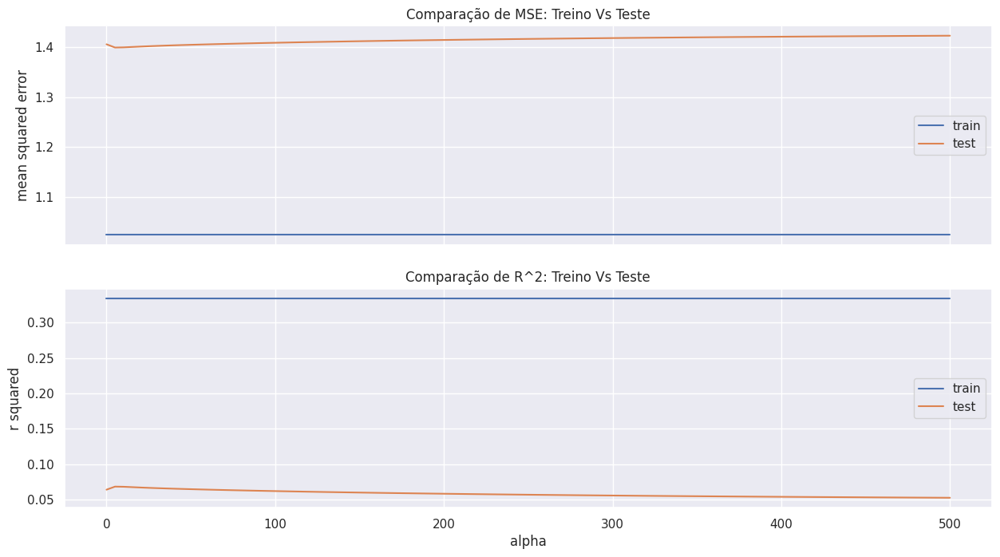

In [199]:
plot_comparison(alpha_list, mse_tr_list, mse_te_list, r2_tr_list, r2_te_list)

Alpha = 10.0 já é um ótimo parâmetro para este modelo. Porém o modelo de Random Forest se mostrou mais robusto para esta análise.

## Clusterização

In [200]:
# para o primeiro passo devemos aplicar PCA (redutor de dimensionalidade) para os jogadores da temporada 2022
pca = PCA(n_components=2)
principalComponents = pca.fit_transform(X_val_test)
df_PCA = pd.DataFrame(data = principalComponents
             , columns = ['principal component 1', 'principal component 2'])

In [201]:
df_PCA

,principal component 1,principal component 2
0,-180.371176,-71.947205
1,438.491360,-33.744975
2,-180.246728,-70.746832
3,-180.429782,-71.970705
4,-180.291488,-70.926182
...,...,...
595,34.278887,123.173036
596,432.730762,19.987577
597,-2.813587,89.623932
598,-180.180097,-70.647380


In [202]:
# Como segundo passo vamos criar a variável "target" como o custo benefício dado apenas pela performance
y_PCA = pd.DataFrame()
y_PCA['Taxa_Custo_Benefício_Performance'] = valor_performance / valor_mercado

list_PCA = []
for taxa in y_PCA['Taxa_Custo_Benefício_Performance'].tolist():
  if taxa > 1.0:
    list_PCA.append('Excelente custo por performance')
  elif taxa >= 0.75:
    list_PCA.append('Bom custo benefício pela performance')
  elif taxa >= 0.5:
    list_PCA.append('Custo benefício moderado pela performance')
  else:
    list_PCA.append('Baixo custo benefício pela performance')

y_PCA['Custo_Benefício'] = list_PCA
y_PCA

,Taxa_Custo_Benefício_Performance,Custo_Benefício
0,0.252539,Baixo custo benefício pela performance
1,0.403356,Baixo custo benefício pela performance
2,0.195393,Baixo custo benefício pela performance
3,0.441644,Baixo custo benefício pela performance
4,0.593664,Custo benefício moderado pela performance
...,...,...
595,2.435924,Excelente custo por performance
596,1.007569,Excelente custo por performance
597,2.932468,Excelente custo por performance
598,0.760387,Bom custo benefício pela performance


In [203]:
df_PCA = pd.concat([df_PCA, y_PCA[['Custo_Benefício']]], axis = 1)
df_PCA

,principal component 1,principal component 2,Custo_Benefício
0,-180.371176,-71.947205,Baixo custo benefício pela performance
1,438.491360,-33.744975,Baixo custo benefício pela performance
2,-180.246728,-70.746832,Baixo custo benefício pela performance
3,-180.429782,-71.970705,Baixo custo benefício pela performance
4,-180.291488,-70.926182,Custo benefício moderado pela performance
...,...,...,...
595,34.278887,123.173036,Excelente custo por performance
596,432.730762,19.987577,Excelente custo por performance
597,-2.813587,89.623932,Excelente custo por performance
598,-180.180097,-70.647380,Bom custo benefício pela performance


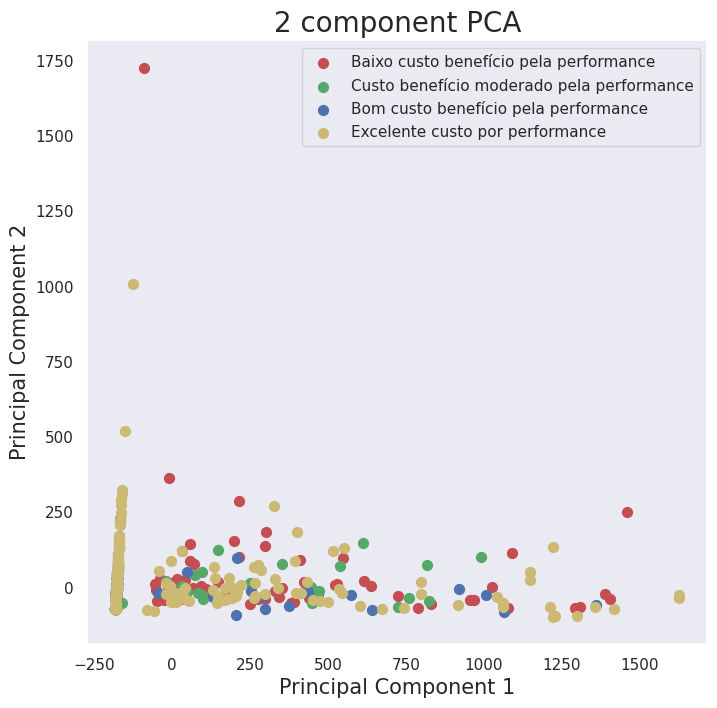

In [204]:
# Vamos gerar a visualização do resultado do PCA
fig = plt.figure(figsize = (8,8))
ax = fig.add_subplot(1,1,1) 
ax.set_xlabel('Principal Component 1', fontsize = 15)
ax.set_ylabel('Principal Component 2', fontsize = 15)
ax.set_title('2 component PCA', fontsize = 20)
targets = ['Baixo custo benefício pela performance',
           'Custo benefício moderado pela performance',
           'Bom custo benefício pela performance',
           'Excelente custo por performance']
colors = ['r', 'g', 'b', 'y']
for target, color in zip(targets,colors):
    indicesToKeep = df_PCA['Custo_Benefício'] == target
    ax.scatter(df_PCA.loc[indicesToKeep, 'principal component 1']
               , df_PCA.loc[indicesToKeep, 'principal component 2']
               , c = color
               , s = 50)
ax.legend(targets)
ax.grid()

In [205]:
X_val_train

,player_height,player_weight,statistics_games_appearences,statistics_games_lineups,statistics_games_minutes,statistics_games_rating,statistics_substitutes_in,statistics_substitutes_out,statistics_substitutes_bench,statistics_shots_total,statistics_shots_on,statistics_goals_total,statistics_goals_conceded,statistics_goals_assists,statistics_goals_saves,statistics_passes_total,statistics_passes_key,statistics_passes_accuracy,statistics_tackles_total,statistics_tackles_blocks,statistics_tackles_interceptions,statistics_duels_total,statistics_duels_won,statistics_dribbles_attempts,statistics_dribbles_success,statistics_fouls_drawn,statistics_fouls_committed,statistics_cards_yellow,statistics_cards_yellowred,statistics_cards_red,statistics_penalty_won,statistics_penalty_commited,statistics_penalty_scored,statistics_penalty_missed,statistics_penalty_saved,player_age,statistics_shots_accuracy,statistics_min_per_goal,minutes_toconceed_goal,statistics_shots_precision,Minutes_per_foul_committed,statistics_goals_ratio,statistics_finishing_ratio,statistics_keypasses_assist,statistics_keypasses_ratio,statistics_dribbles_ratio,Minutes_per_game,statistics_goalsper_finishig,Offensive_capacity,Defensive_capacity,goalkeeper,defender,midfielder,attacker
0,186.0,80.0,-0.733460,-0.933173,-0.813444,6.533333,5.0,-0.762542,11.0,-0.601779,-0.336410,-0.059659,-0.197317,-0.530607,-0.19464,-0.695580,-0.480187,77.0,-0.701935,0.0,-0.637440,-0.399533,-0.568502,-0.395506,-0.507035,-0.449068,-0.670955,-0.892086,0.0,0.0,0.0,0.0,0.0,0.0,0.0,2.221655,0.50,228.0,-0.22753,1.000000,57.000000,0.500000,1.000000,0.000000,0.037500,0.037500,-0.547068,0.50,-0.503820,-0.652048,0,0,1,0
1,178.0,74.0,1.507932,0.756648,0.972066,6.797009,12.0,0.575640,18.0,4.500650,3.926091,3.855605,-0.197317,-0.530607,-0.19464,-0.896457,-0.708471,66.0,-0.801887,0.0,-0.755403,-0.885377,-0.866559,-0.663096,-0.661476,-0.797173,-0.924513,0.287650,0.0,0.0,0.0,0.0,0.0,0.0,0.0,1.805657,0.00,187.8,-0.22753,0.000000,0.000000,0.333333,0.352941,0.000000,0.000000,0.000000,0.202723,0.00,-0.057852,-0.880000,0,0,0,1
2,177.0,73.0,-0.105870,-0.088263,-0.013752,6.797009,3.0,-0.539511,11.0,-0.724729,-0.640874,-0.494688,-0.197317,-0.530607,-0.19464,-0.896457,-0.708471,66.0,-0.801887,0.0,-0.755403,-0.885377,-0.866559,-0.663096,-0.661476,-0.797173,-0.924513,-0.498841,0.0,0.0,0.0,0.0,0.0,0.0,0.0,-1.106329,0.00,0.0,-0.22753,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.661085,0.00,-0.743957,-0.880000,0,0,1,0
3,186.0,77.0,-1.271395,-1.027052,-1.060169,6.797009,0.0,-0.762542,18.0,-0.724729,-0.640874,-0.494688,-0.197317,-0.530607,-0.19464,-0.896457,-0.708471,66.0,-0.801887,0.0,-0.755403,-0.885377,-0.866559,-0.663096,-0.661476,-0.797173,-0.924513,-0.892086,0.0,0.0,0.0,0.0,0.0,0.0,0.0,3.261650,0.00,0.0,-0.22753,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,-1.808859,0.00,-0.743957,-0.880000,1,0,0,0
4,170.0,66.0,-0.733460,-0.839294,-0.788555,6.797009,4.0,-0.316481,9.0,-0.724729,-0.640874,-0.494688,-0.197317,-0.530607,-0.19464,-0.896457,-0.708471,66.0,-0.801887,0.0,-0.755403,-0.885377,-0.866559,-0.663096,-0.661476,-0.797173,-0.924513,-0.892086,0.0,0.0,0.0,0.0,0.0,0.0,0.0,-1.106329,0.00,0.0,-0.22753,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,-0.419782,0.00,-0.743957,-0.880000,0,0,1,0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
4342,181.0,77.0,1.687244,1.226043,0.981805,6.862500,9.0,4.590184,9.0,1.734272,1.947073,2.115488,-0.197317,0.851483,-0.19464,0.527262,1.193894,13.0,1.846821,19.5,1.220466,2.706060,2.561100,3.796747,4.357875,1.523526,0.913778,0.680895,0.0,0.0,0.0,0.0,0.0,0.0,0.0,-1.314328,0.15,314.5,-0.22753,0.425000,65.068966,0.352941,0.425000,0.080000,0.044092,0.044092,0.089865,0.15,2.892401,2.425297,0,0,0,1
4343,174.0,71.0,-0.912772,-1.027052,-0.999569,6.600000,4.0,-0.762542,19.0,-0.663254

### Goleiros

In [206]:
# Criando um df para dividirmos nas posições dos jogadores
new_index = list(range(4347, 4947))
df_PCA_posições = pd.DataFrame()
df_PCA_posições['Index_original'] = new_index
df_PCA_posições = pd.concat([df_PCA_posições, y_PCA[['Taxa_Custo_Benefício_Performance']]], axis = 1)
df_PCA_posições.set_index('Index_original', drop=True, inplace=True)
df_PCA_posições = pd.concat([df_PCA_posições, X_val_test], axis = 1)
df_PCA_posições

,Taxa_Custo_Benefício_Performance,player_height,player_weight,statistics_games_appearences,statistics_games_lineups,statistics_games_minutes,statistics_games_rating,statistics_substitutes_in,statistics_substitutes_out,statistics_substitutes_bench,statistics_shots_total,statistics_shots_on,statistics_goals_total,statistics_goals_conceded,statistics_goals_assists,statistics_goals_saves,statistics_passes_total,statistics_passes_key,statistics_passes_accuracy,statistics_tackles_total,statistics_tackles_blocks,statistics_tackles_interceptions,statistics_duels_total,statistics_duels_won,statistics_dribbles_attempts,statistics_dribbles_success,statistics_fouls_drawn,statistics_fouls_committed,statistics_cards_yellow,statistics_cards_yellowred,statistics_cards_red,statistics_penalty_won,statistics_penalty_commited,statistics_penalty_scored,statistics_penalty_missed,statistics_penalty_saved,player_age,statistics_shots_accuracy,statistics_min_per_goal,minutes_toconceed_goal,statistics_shots_precision,Minutes_per_foul_committed,statistics_goals_ratio,statistics_finishing_ratio,statistics_keypasses_assist,statistics_keypasses_ratio,statistics_dribbles_ratio,Minutes_per_game,statistics_goalsper_finishig,Offensive_capacity,Defensive_capacity,goalkeeper,defender,midfielder,attacker
4347,0.252539,188.0,78.0,-1.434143,-1.112431,-1.164571,6.797009,0.0,-0.841461,0.0,-0.744688,-0.647343,-0.449920,-0.195528,-0.508001,-0.200060,-1.022350,-0.743728,66.0,-0.932728,0.0,-0.853274,-1.093905,-1.070797,-0.770894,-0.738443,-0.850084,-0.981287,-0.902532,0.0,0.0,0.0,0.0,0.0,0.0,0.0,-0.761704,0.000000,0.000000,-0.220842,0.000000,0.000000,0.000000,0.000000,0.0,0.000000,0.000000,-1.816521,0.000000,-0.810639,-1.052927,0,1,0,0
4348,0.403356,183.0,74.0,-0.239439,0.179216,-0.001077,6.985714,0.0,0.331307,0.0,1.137238,1.328559,0.211727,-0.195528,2.032002,-0.200060,-0.118983,0.678767,22.0,-0.270772,4.0,-0.424732,0.588766,0.624708,0.761877,0.359030,1.640524,0.283983,0.857552,0.0,0.0,0.0,0.0,0.0,0.0,0.0,1.017362,0.076923,616.000000,-0.220842,0.538462,68.444444,0.142857,0.538462,0.2,0.052356,0.052356,0.852585,0.076923,0.730458,0.229301,0,0,0,1
4349,0.195393,189.0,91.0,1.403280,1.955230,2.065260,7.055555,0.0,-0.841461,0.0,-0.744688,-0.647343,-0.449920,3.165114,-0.508001,5.569820,1.181677,-0.743728,18.0,-0.932728,0.0,-0.853274,-0.951993,-0.873645,-0.770894,-0.738443,-0.718999,-0.981287,-0.902532,0.0,0.0,0.0,0.0,0.0,0.0,0.0,1.610384,0.000000,0.000000,6.642286,0.000000,0.000000,0.000000,0.000000,0.0,0.000000,0.000000,1.303214,0.000000,-0.810639,-0.940451,1,0,0,0
4350,0.441644,194.0,92.0,-1.434143,-1.112431,-1.164571,6.797009,0.0,-0.841461,7.0,-0.744688,-0.647343,-0.449920,-0.195528,-0.508001,-0.200060,-1.022350,-0.743728,66.0,-0.932728,0.0,-0.853274,-1.093905,-1.070797,-0.770894,-0.738443,-0.850084,-0.981287,-0.902532,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.226666,0.000000,0.000000,-0.220842,0.000000,0.000000,0.000000,0.000000,0.0,0.000000,0.000000,-1.816521,0.000000,-0.810639,-1.052927,1,0,0,0
4351,0.593664,189.0,85.0,-1.135467,-0.789519,-0.824589,7.300000,0.0,-0.841461,19.0,-0.744688,-0.647343,-0.449920,-0.195528,-0.508001,0.139345,-0.885190,-0.743728,25.0,-0.932728,0.0,-0.853274,-1.093905,-1.070797,-0.770894,-0.738443,-0.850084,-0.981287,-0.902532,0.0,0.0,0.0,0.0,0.0,0.0,0.0,1.808058,0.000000,0.000000,-0.220842,0.000000,0.000000,0.000000,0.000000,0.0,0.000000,0.000000,1.303214,0.000000,-0.810639,-1.052927,1,0,0,0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
4942,2.435924,178.0,74.0,0.656590,0.179216,-0.006743,6.818181,6.0,1.504075,12.0,0.558184,0.481744,1.535022,-0.195528,-0.508001,-0.200060,-0.407493,0.109769,8.0,-0.554467,2.0,-0.567580,0.244122,0.230405,1.122529,0.672594,0.591847,-0.559531,-0.315837,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.819688,0.333333,204.333333,-0.220842,0.444444,204.333333,0.750000,0.444444,0

In [207]:
# Aqui as features selecionadas vieram das equações de interpretabilidade das regressões lineares por posição
# Fomos eliminando as variáveis da equação de acordo com a correlação entre elas
selected_columns = df_PCA_posições[(df_PCA_posições['goalkeeper'] == 1)][['Taxa_Custo_Benefício_Performance',
                                                                          'statistics_games_lineups',
                                                                          'statistics_goals_conceded',
                                                                          'statistics_goals_saves',
                                                                          #'player_age',
                                                                          #'Minutes_per_game'
                                                                          ]]

df_PCA_GK = selected_columns.copy(deep=True)
df_PCA_GK

,Taxa_Custo_Benefício_Performance,statistics_games_lineups,statistics_goals_conceded,statistics_goals_saves
4349,0.195393,1.955230,3.165114,5.569820
4350,0.441644,-1.112431,-0.195528,-0.200060
4351,0.593664,-0.789519,-0.195528,0.139345
4382,0.517949,1.793774,3.165114,4.664741
4385,0.795146,-0.950975,0.109985,0.365614
...,...,...,...,...
4870,3.997299,-1.112431,-0.195528,-0.200060
4885,1.444698,-0.950975,0.109985,0.365614
4886,0.933206,1.793774,7.442295,5.569820
4926,0.905834,1.955230,8.358834,6.474900


In [208]:
# para o primeiro passo devemos aplicar PCA (redutor de dimensionalidade) para os jogadores da temporada 2022
pca_GK = PCA(n_components=2)
principalComponents_GK = pca_GK.fit_transform(df_PCA_GK)
PCA_GK = pd.DataFrame(data = principalComponents_GK
             , columns = ['principal component 1', 'principal component 2'])

In [209]:
# Como segundo passo vamos criar a variável "target" como o custo benefício dado apenas pela performance

list_PCA = []
for taxa in df_PCA_posições[(df_PCA_posições['goalkeeper'] == 1)]['Taxa_Custo_Benefício_Performance'].tolist():
  if taxa > 1.0:
    list_PCA.append('Excelente custo por performance')
  elif taxa >= 0.75:
    list_PCA.append('Bom custo benefício pela performance')
  elif taxa >= 0.5:
    list_PCA.append('Custo benefício moderado pela performance')
  else:
    list_PCA.append('Baixo custo benefício pela performance')

PCA_GK['Custo_Benefício'] = list_PCA
PCA_GK

,principal component 1,principal component 2,Custo_Benefício
0,4.203080,-1.128883,Baixo custo benefício pela performance
1,-2.911220,-0.831102,Baixo custo benefício pela performance
2,-2.580970,-0.715558,Custo benefício moderado pela performance
3,3.538967,-0.748453,Custo benefício moderado pela performance
4,-2.288738,-0.483613,Bom custo benefício pela performance
...,...,...,...
56,-3.019478,2.685448,Excelente custo por performance
57,-2.308514,0.158796,Excelente custo por performance
58,6.976683,0.153777,Bom custo benefício pela performance
59,8.242771,0.182224,Bom custo benefício pela performance


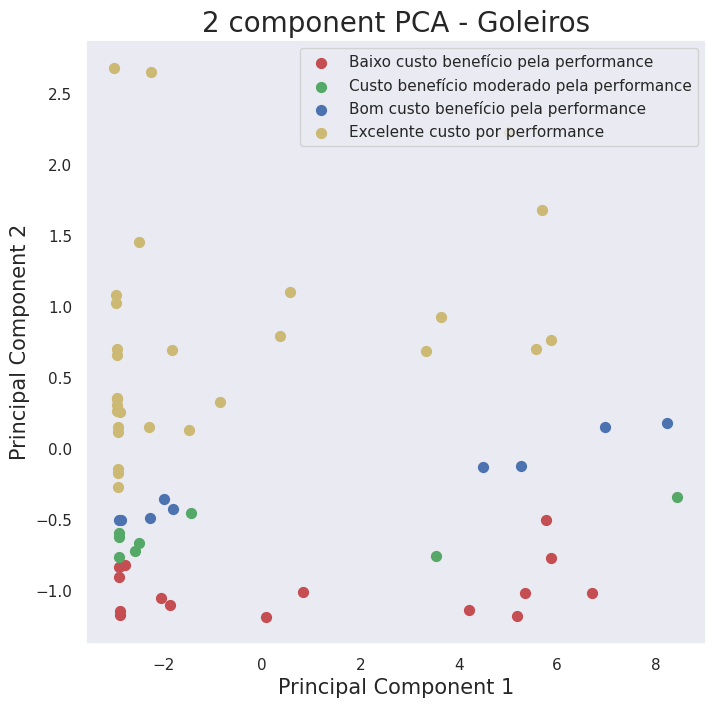

In [210]:
# Vamos gerar a visualização do resultado do PCA para goleiros
fig = plt.figure(figsize = (8,8))
ax = fig.add_subplot(1,1,1) 
ax.set_xlabel('Principal Component 1', fontsize = 15)
ax.set_ylabel('Principal Component 2', fontsize = 15)
ax.set_title('2 component PCA - Goleiros', fontsize = 20)
targets = ['Baixo custo benefício pela performance',
           'Custo benefício moderado pela performance',
           'Bom custo benefício pela performance',
           'Excelente custo por performance']
colors = ['r', 'g', 'b', 'y']
for target, color in zip(targets,colors):
    indicesToKeep = PCA_GK['Custo_Benefício'] == target
    ax.scatter(PCA_GK.loc[indicesToKeep, 'principal component 1']
               , PCA_GK.loc[indicesToKeep, 'principal component 2']
               , c = color
               , s = 50)
ax.legend(targets)
ax.grid()

In [211]:
pca_GK.explained_variance_ratio_

array([0.90837398, 0.05552619])

### Defensores

In [212]:
# Aqui as features selecionadas vieram das equações de interpretabilidade das regressões lineares por posição
# Fomos eliminando as variáveis da equação de acordo com a correlação entre elas
selected_columns = df_PCA_posições[(df_PCA_posições['defender'] == 1)][['Taxa_Custo_Benefício_Performance',
                                                                        'statistics_games_minutes',
                                                                        'statistics_shots_total',
                                                                        'statistics_passes_total',
                                                                        #'player_age',
                                                                        'Defensive_capacity',
                                                                        #'Minutes_per_game'
                                                                        ]]

df_PCA_DF = selected_columns.copy(deep=True)
df_PCA_DF

,Taxa_Custo_Benefício_Performance,statistics_games_minutes,statistics_shots_total,statistics_passes_total,Defensive_capacity
4347,0.252539,-1.164571,-0.744688,-1.022350,-1.052927
4352,0.132142,1.555286,0.992474,2.217476,1.826463
4353,0.237460,0.278464,-0.020870,0.855330,0.634216
4354,1.035398,0.924431,-0.599924,2.435041,2.186387
4355,1.043625,-0.078517,-0.165634,0.642495,0.521739
...,...,...,...,...,...
4925,0.863726,1.738499,-0.165634,1.980992,0.656711
4927,1.995392,-1.164571,-0.744688,-1.022350,-1.052927
4928,0.268575,-1.164571,-0.744688,-1.022350,-1.052927
4929,1.817333,0.180247,0.413420,0.311417,0.634216


In [213]:
# para o primeiro passo devemos aplicar PCA (redutor de dimensionalidade) para os defensores da temporada 2022
pca_DF = PCA(n_components=2)
principalComponents_DF = pca_DF.fit_transform(df_PCA_DF)
PCA_DF = pd.DataFrame(data = principalComponents_DF
             , columns = ['principal component 1', 'principal component 2'])

In [214]:
# Como segundo passo vamos criar a variável "target" como o custo benefício dado apenas pela performance

list_PCA = []
for taxa in df_PCA_posições[(df_PCA_posições['defender'] == 1)]['Taxa_Custo_Benefício_Performance'].tolist():
  if taxa > 1.0:
    list_PCA.append('Excelente custo por performance')
  elif taxa >= 0.75:
    list_PCA.append('Bom custo benefício pela performance')
  elif taxa >= 0.5:
    list_PCA.append('Custo benefício moderado pela performance')
  else:
    list_PCA.append('Baixo custo benefício pela performance')

PCA_DF['Custo_Benefício'] = list_PCA
PCA_DF

,principal component 1,principal component 2,Custo_Benefício
0,-2.359532,-1.009467,Baixo custo benefício pela performance
1,2.989210,-1.035278,Baixo custo benefício pela performance
2,0.625198,-0.978137,Baixo custo benefício pela performance
3,2.670047,-0.175317,Excelente custo por performance
4,0.201742,-0.179736,Excelente custo por performance
...,...,...,...
198,2.068246,-0.374209,Bom custo benefício pela performance
199,-2.386817,0.729987,Excelente custo por performance
200,-2.359783,-0.993463,Baixo custo benefício pela performance
201,0.301300,0.627167,Excelente custo por performance


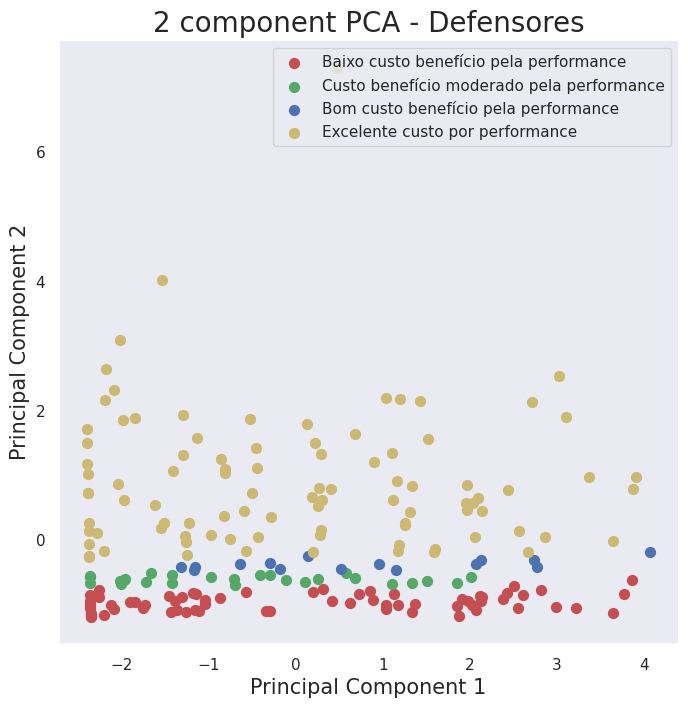

In [215]:
# Vamos gerar a visualização do resultado do PCA para defensores
fig = plt.figure(figsize = (8,8))
ax = fig.add_subplot(1,1,1) 
ax.set_xlabel('Principal Component 1', fontsize = 15)
ax.set_ylabel('Principal Component 2', fontsize = 15)
ax.set_title('2 component PCA - Defensores', fontsize = 20)
targets = ['Baixo custo benefício pela performance',
           'Custo benefício moderado pela performance',
           'Bom custo benefício pela performance',
           'Excelente custo por performance']
colors = ['r', 'g', 'b', 'y']
for target, color in zip(targets,colors):
    indicesToKeep = PCA_DF['Custo_Benefício'] == target
    ax.scatter(PCA_DF.loc[indicesToKeep, 'principal component 1']
               , PCA_DF.loc[indicesToKeep, 'principal component 2']
               , c = color
               , s = 50)
ax.legend(targets)
ax.grid()

In [216]:
pca_DF.explained_variance_ratio_

array([0.65765648, 0.26229423])

### Meio_campo

In [217]:
# Aqui as features selecionadas vieram das equações de interpretabilidade das regressões lineares por posição
# Fomos eliminando as variáveis da equação de acordo com a correlação entre elas
selected_columns = df_PCA_posições[(df_PCA_posições['midfielder'] == 1)][['Taxa_Custo_Benefício_Performance',
                                                                          'statistics_games_minutes',
                                                                          'statistics_passes_total',
                                                                          'statistics_dribbles_attempts',
                                                                          #'statistics_dribbles_success',
                                                                          #'Offensive_capacity',
                                                                          #'Defensive_capacity',
                                                                          #'Minutes_per_game'
                                                                          ]]

df_PCA_MF = selected_columns.copy(deep=True)
df_PCA_MF

,Taxa_Custo_Benefício_Performance,statistics_games_minutes,statistics_passes_total,statistics_dribbles_attempts
4356,0.365366,1.606284,1.361405,2.565137
4357,0.311739,1.785719,1.971533,2.114322
4364,0.108560,-0.754704,-0.856812,-0.320079
4365,0.137634,-1.130573,-0.970324,-0.770894
4367,0.116212,0.837546,0.552631,1.393018
...,...,...,...,...
4935,1.009586,-0.792480,-0.658166,-0.049590
4938,1.386258,0.962206,1.801265,0.040573
4940,2.360029,-0.460053,-0.544653,-0.590568
4944,2.932468,-0.845366,-0.705462,-0.500405


In [218]:
# para o primeiro passo devemos aplicar PCA (redutor de dimensionalidade) para os meio-campo da temporada 2022
pca_MF = PCA(n_components=2)
principalComponents_MF = pca_MF.fit_transform(df_PCA_MF)
PCA_MF = pd.DataFrame(data = principalComponents_MF
             , columns = ['principal component 1', 'principal component 2'])

In [219]:
# Como segundo passo vamos criar a variável "target" como o custo benefício dado apenas pela performance

list_PCA = []
for taxa in df_PCA_posições[(df_PCA_posições['midfielder'] == 1)]['Taxa_Custo_Benefício_Performance'].tolist():
  if taxa > 1.0:
    list_PCA.append('Excelente custo por performance')
  elif taxa >= 0.75:
    list_PCA.append('Bom custo benefício pela performance')
  elif taxa >= 0.5:
    list_PCA.append('Custo benefício moderado pela performance')
  else:
    list_PCA.append('Baixo custo benefício pela performance')

PCA_MF['Custo_Benefício'] = list_PCA
PCA_MF

,principal component 1,principal component 2,Custo_Benefício
0,2.975828,-0.645323,Baixo custo benefício pela performance
1,3.197866,-0.790887,Baixo custo benefício pela performance
2,-1.318432,-0.728899,Baixo custo benefício pela performance
3,-1.849472,-0.697217,Baixo custo benefício pela performance
4,1.389325,-0.839495,Baixo custo benefício pela performance
...,...,...,...
187,-1.022525,0.159774,Excelente custo por performance
188,1.546212,0.219588,Excelente custo por performance
189,-0.979796,1.449569,Excelente custo por performance
190,-1.218924,2.052903,Excelente custo por performance


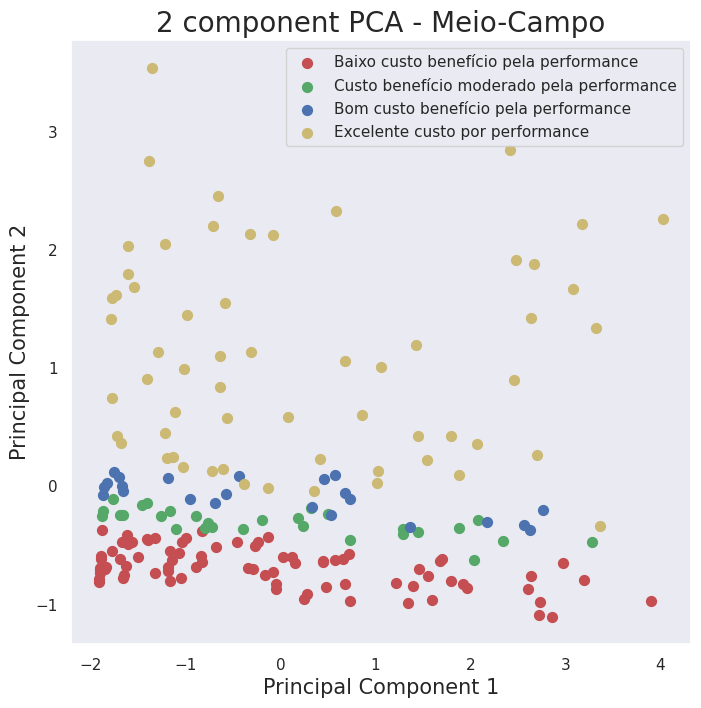

In [220]:
# Vamos gerar a visualização do resultado do PCA para meio-campo
fig = plt.figure(figsize = (8,8))
ax = fig.add_subplot(1,1,1) 
ax.set_xlabel('Principal Component 1', fontsize = 15)
ax.set_ylabel('Principal Component 2', fontsize = 15)
ax.set_title('2 component PCA - Meio-Campo', fontsize = 20)
targets = ['Baixo custo benefício pela performance',
           'Custo benefício moderado pela performance',
           'Bom custo benefício pela performance',
           'Excelente custo por performance']
colors = ['r', 'g', 'b', 'y']
for target, color in zip(targets,colors):
    indicesToKeep = PCA_MF['Custo_Benefício'] == target
    ax.scatter(PCA_MF.loc[indicesToKeep, 'principal component 1']
               , PCA_MF.loc[indicesToKeep, 'principal component 2']
               , c = color
               , s = 50)
ax.legend(targets)
ax.grid()

In [221]:
pca_MF.explained_variance_ratio_

array([0.65179149, 0.22346848])

### Atacantes

In [222]:
# Aqui as features selecionadas vieram das equações de interpretabilidade das regressões lineares por posição
# Fomos eliminando as variáveis da equação de acordo com a correlação entre elas
selected_columns = df_PCA_posições[(df_PCA_posições['attacker'] == 1)][['Taxa_Custo_Benefício_Performance',
                                                                          "statistics_passes_total",
                                                                          "statistics_tackles_total",
                                                                          "statistics_duels_total",
                                                                          "statistics_duels_won",
                                                                          "statistics_dribbles_attempts",
                                                                          "statistics_dribbles_success",
                                                                          "statistics_fouls_drawn",
                                                                          "Offensive_capacity",
                                                                          "Minutes_per_game",]]

df_PCA_AT = selected_columns.copy(deep=True)
df_PCA_AT

,Taxa_Custo_Benefício_Performance,statistics_passes_total,statistics_tackles_total,statistics_duels_total,statistics_duels_won,statistics_dribbles_attempts,statistics_dribbles_success,statistics_fouls_drawn,Offensive_capacity,Minutes_per_game
4348,0.403356,-0.118983,-0.270772,0.588766,0.624708,0.761877,0.359030,1.640524,0.730458,0.852585
4366,0.185892,-0.970324,-0.838163,-0.972266,-0.991936,-0.680731,-0.738443,-0.850084,-0.743635,-0.655287
4368,0.299892,1.564781,0.485750,1.784881,1.689328,4.278234,3.494668,3.606794,4.683707,0.737040
4369,0.135351,-0.293981,-0.270772,1.318599,0.624708,0.220899,-0.111315,1.116186,1.199487,0.681306
4371,0.345427,-0.610869,-0.365337,-0.445164,-0.242760,-0.500405,-0.424879,0.067509,-0.341610,-1.244570
...,...,...,...,...,...,...,...,...,...,...
4939,1.042573,-0.573031,-0.554467,-0.607349,-0.715924,-0.680731,-0.738443,-0.456830,-0.408614,-0.828605
4941,1.705815,-0.643977,-0.838163,-0.566803,-0.597633,-0.049590,0.045467,-0.194661,0.194424,-0.551295
4942,2.435924,-0.407493,-0.554467,0.244122,0.230405,1.122529,0.672594,0.591847,0.596449,-0.298745
4943,1.007569,-0.000741,-0.365337,1.136140,1.137303,1.212692,1.299722,2.033778,0.730458,0.523280


In [223]:
# para o primeiro passo devemos aplicar PCA (redutor de dimensionalidade) para os atacantes da temporada 2022
pca_AT = PCA(n_components=2)
principalComponents_AT = pca_AT.fit_transform(df_PCA_AT)
PCA_AT = pd.DataFrame(data = principalComponents_AT
             , columns = ['principal component 1', 'principal component 2'])

In [224]:
# Como segundo passo vamos criar a variável "target" como o custo benefício dado apenas pela performance

list_PCA = []
for taxa in df_PCA_posições[(df_PCA_posições['attacker'] == 1)]['Taxa_Custo_Benefício_Performance'].tolist():
  if taxa > 1.0:
    list_PCA.append('Excelente custo por performance')
  elif taxa >= 0.75:
    list_PCA.append('Bom custo benefício pela performance')
  elif taxa >= 0.5:
    list_PCA.append('Custo benefício moderado pela performance')
  else:
    list_PCA.append('Baixo custo benefício pela performance')

plot_PCA_AT = PCA_AT.copy(deep=True)
plot_PCA_AT['Custo_Benefício'] = list_PCA
plot_PCA_AT

,principal component 1,principal component 2,Custo_Benefício
0,1.529846,-0.905986,Baixo custo benefício pela performance
1,-2.711702,-1.110847,Baixo custo benefício pela performance
2,7.856802,-1.011729,Baixo custo benefício pela performance
3,1.290903,-1.172930,Baixo custo benefício pela performance
4,-1.603652,-0.925184,Baixo custo benefício pela performance
...,...,...,...
139,-2.155471,-0.251210,Excelente custo por performance
140,-1.134444,0.405141,Excelente custo por performance
141,0.783441,1.158094,Excelente custo por performance
142,2.549988,-0.267437,Excelente custo por performance


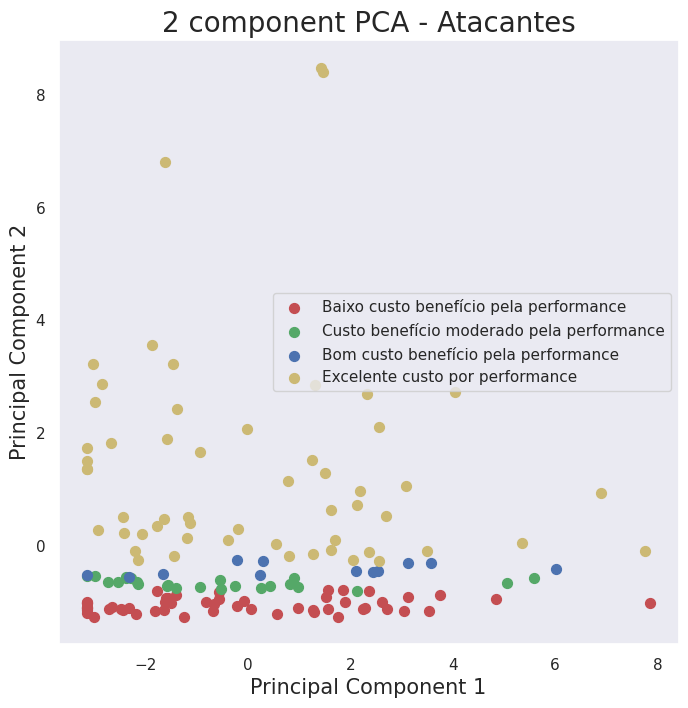

In [225]:
# Vamos gerar a visualização do resultado do PCA para atacantes
fig = plt.figure(figsize = (8,8))
ax = fig.add_subplot(1,1,1) 
ax.set_xlabel('Principal Component 1', fontsize = 15)
ax.set_ylabel('Principal Component 2', fontsize = 15)
ax.set_title('2 component PCA - Atacantes', fontsize = 20)
targets = ['Baixo custo benefício pela performance',
           'Custo benefício moderado pela performance',
           'Bom custo benefício pela performance',
           'Excelente custo por performance']
colors = ['r', 'g', 'b', 'y']
for target, color in zip(targets,colors):
    indicesToKeep = plot_PCA_AT['Custo_Benefício'] == target
    ax.scatter(plot_PCA_AT.loc[indicesToKeep, 'principal component 1']
               , plot_PCA_AT.loc[indicesToKeep, 'principal component 2']
               , c = color
               , s = 50)
ax.legend(targets)
ax.grid()

In [226]:
pca_AT.explained_variance_ratio_

array([0.60682911, 0.24538777])

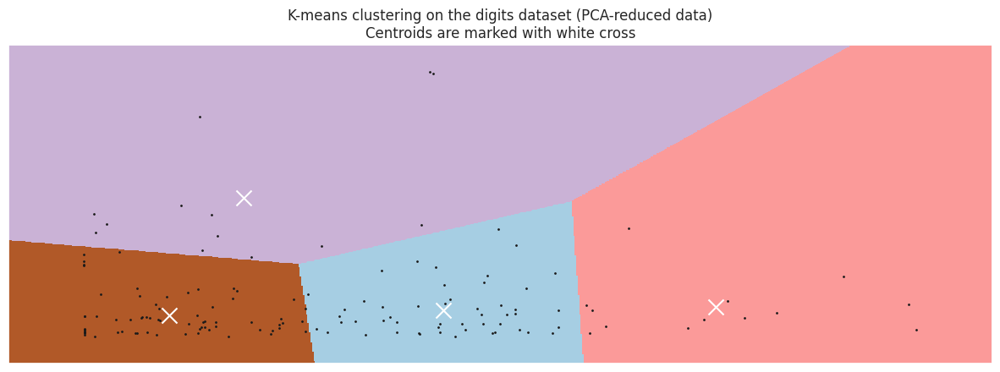

In [227]:
reduced_data = principalComponents_AT
kmeans_AT = KMeans(init="k-means++", n_clusters=4, n_init=10)
kmeans_AT.fit(reduced_data)

# Step size of the mesh. Decrease to increase the quality of the VQ.
h = 0.02  # point in the mesh [x_min, x_max]x[y_min, y_max].

# Plot the decision boundary. For that, we will assign a color to each
x_min, x_max = reduced_data[:, 0].min() - 1, reduced_data[:, 0].max() + 1
y_min, y_max = reduced_data[:, 1].min() - 1, reduced_data[:, 1].max() + 1
xx, yy = np.meshgrid(np.arange(x_min, x_max, h), np.arange(y_min, y_max, h))

# Obtain labels for each point in mesh. Use last trained model.
Z = kmeans_AT.predict(np.c_[xx.ravel(), yy.ravel()])

# Put the result into a color plot
Z = Z.reshape(xx.shape)
plt.figure(1)
plt.clf()
plt.imshow(
    Z,
    interpolation="nearest",
    extent=(xx.min(), xx.max(), yy.min(), yy.max()),
    cmap=plt.cm.Paired,
    aspect="auto",
    origin="lower",
)

plt.plot(reduced_data[:, 0], reduced_data[:, 1], "k.", markersize=2)
# Plot the centroids as a white X
centroids = kmeans_AT.cluster_centers_
plt.scatter(
    centroids[:, 0],
    centroids[:, 1],
    marker="x",
    s=169,
    linewidths=3,
    color="w",
    zorder=10,
)
plt.title(
    "K-means clustering on the digits dataset (PCA-reduced data)\n"
    "Centroids are marked with white cross"
)
plt.xlim(x_min, x_max)
plt.ylim(y_min, y_max)
plt.xticks(())
plt.yticks(())
plt.show()

## Recomendação de jogadores por KNN

In [228]:
# Preparando df para KNN
# Reconhecendo quais são os jogadores para os valores de mercado e performance

df_knn = X_test.copy(deep=True)
df_knn.reset_index(inplace=True)
df_knn['Valor_performance'] = valor_performance
df_knn['Valor_mercado'] = valor_mercado
df_knn.head()

,level_0,index,player_id,player_name,player_firstname,player_lastname,player_birth_date,player_height,player_weight,statistics_league_season,statistics_games_appearences,statistics_games_lineups,statistics_games_minutes,statistics_games_position,statistics_games_rating,statistics_games_captain,statistics_substitutes_in,statistics_substitutes_out,statistics_substitutes_bench,statistics_shots_total,statistics_shots_on,statistics_goals_total,statistics_goals_conceded,statistics_goals_assists,statistics_goals_saves,statistics_passes_total,statistics_passes_key,statistics_passes_accuracy,statistics_tackles_total,statistics_tackles_blocks,statistics_tackles_interceptions,statistics_duels_total,statistics_duels_won,statistics_dribbles_attempts,statistics_dribbles_success,statistics_fouls_drawn,statistics_fouls_committed,statistics_cards_yellow,statistics_cards_yellowred,statistics_cards_red,statistics_penalty_won,statistics_penalty_commited,statistics_penalty_scored,statistics_penalty_missed,statistics_penalty_saved,full_player_name,club_names_tm,player_age,statistics_shots_accuracy,statistics_min_per_goal,minutes_toconceed_goal,statistics_shots_precision,Minutes_per_foul_committed,statistics_goals_ratio,statistics_finishing_ratio,statistics_keypasses_assist,statistics_keypasses_ratio,statistics_dribbles_ratio,Minutes_per_game,statistics_goalsper_finishig,Offensive_capacity,Defensive_capacity,Valor_performance,Valor_mercado
0,4347,6781,9947,Walce,Walce,da Silva Costa Filho,1999-02-02,188.0,78.0,2022,-1.434143,-1.112431,-1.164571,Defender,6.797009,0,0.0,-0.841461,0.0,-0.744688,-0.647343,-0.449920,-0.195528,-0.508001,-0.200060,-1.022350,-0.743728,66.0,-0.932728,0.0,-0.853274,-1.093905,-1.070797,-0.770894,-0.738443,-0.850084,-0.981287,-0.902532,0.0,0.0,0.0,0.0,0.0,0.0,0.0,Walce da Silva Costa Filho,Sao Paulo Futebol Clube,-0.761704,0.000000,0.0,-0.220842,0.000000,0.000000,0.000000,0.000000,0.0,0.000000,0.000000,-1.816521,0.000000,-0.810639,-1.052927,0.303046,1.2
1,4348,6785,10180,Bruno Henrique,Bruno Henrique,Pinto,1990-12-30,183.0,74.0,2022,-0.239439,0.179216,-0.001077,Attacker,6.985714,0,0.0,0.331307,0.0,1.137238,1.328559,0.211727,-0.195528,2.032002,-0.200060,-0.118983,0.678767,22.0,-0.270772,4.0,-0.424732,0.588766,0.624708,0.761877,0.359030,1.640524,0.283983,0.857552,0.0,0.0,0.0,0.0,0.0,0.0,0.0,Bruno Henrique Pinto,Clube de Regatas do Flamengo,1.017362,0.076923,616.0,-0.220842,0.538462,68.444444,0.142857,0.538462,0.2,0.052356,0.052356,0.852585,0.076923,0.730458,0.229301,1.613425,4.0
2,4349,6863,2410,Weverton,Weverton,Pereira da Silva,1987-12-13,189.0,91.0,2022,1.403280,1.955230,2.065260,Goalkeeper,7.055555,0,0.0,-0.841461,0.0,-0.744688,-0.647343,-0.449920,3.165114,-0.508001,5.569820,1.181677,-0.743728,18.0,-0.932728,0.0,-0.853274,-0.951993,-0.873645,-0.770894,-0.738443,-0.718999,-0.981287,-0.902532,0.0,0.0,0.0,0.0,0.0,0.0,0.0,Weverton Pereira da Silva,Sociedade Esportiva Palmeiras,1.610384,0.000000,0.0,6.642286,0.000000,0.000000,0.000000,0.000000,0.0,0.000000,0.000000,1.303214,0.000000,-0.810639,-0.940451,0.781572,4.0
3,4350,6864,9764,Vinicius,Vinicius,Silvestre da Costa,1994-03-28,194.0,92.0,2022,-1.434143,-1.112431,-1.164571,Goalkeeper,6.797009,0,0.0,-0.841461,7.0,-0.744688,-0.647343,-0.449920,-0.195528,-0.508001,-0.200060,-1.022350,-0.743728,66.0,-0.932728,0.0,-0.853274,-1.093905,-1.070797,-0.770894,-0.738443,-0.850084,-0.981287,-0.902532,0.0,0.0,0.0,0.0,0.0,0.0,0.0,Vinicius Silvestre da Costa,Sociedade Esportiva Palmeiras,0.226666,0.000000,0.0,-0.220842,0.000000,0.000000,0.000000,0.000000,0.0,0.000000,0.000000,-1.816521,0.000000,-0.810639,-1.052927,0.176658,0.4
4,4351,6869,10372,Marcelo Lomba,Marcelo,Lomba do Nascimento,1986-12-18,189.0,85.0,2022,-1.135467,-0.789519,-0.824589,Goalkeeper,7.300000,0,0.0,-0.841461,19.0,-0.744688,-0.647343,-0.449920,-0.195528,-0.508001,0.139345,-0.885190,-0.743728,25.0,-0.932728,0.0,-0.853274,-1.093905,-1.070797,-0.770894,-0.738443,-0.850084,-0.981287,-0.902532,0.0,0.0,0.0,0.0,0.0,0.0,0.0,Marcelo Lom

In [229]:
# from google.colab import files
# df_knn.to_csv('df_knn.csv')
# files.download('df_knn.csv')

In [ ]:
# Criando um input para posição do jogador

posição = input('Posição do jogador: ')
df_knn_posição = df_knn[(df_knn['statistics_games_position'] == posição)]

In [ ]:
fig = go.Figure(px.scatter(df_knn_posição, x='Valor_mercado', y='Valor_performance', hover_data=['player_name', 'club_names_tm']))

fig.add_trace(
    go.Scatter(
        x=df_knn_posição['Valor_performance'],
        y=df_knn_posição['Valor_performance'],
        name="Custo/performance = 1"
    ))

fig.show()

In [ ]:
# Criando a calculadora de distância
from scipy.spatial import distance
def Similarity(player_id1, player_id2):
  a = df_knn_posição[(df_knn_posição['player_id'] == player_id1)]
  b = df_knn_posição[(df_knn_posição['player_id'] == player_id2)]

  Valor_performanceA = a['Valor_performance']
  Valor_performanceB = b['Valor_performance']

  Valor_mercadoA = a['Valor_mercado']
  Valor_mercadoB = b['Valor_mercado']

  #return Valor_performanceDistance + Valor_mercadoDistance
  return distance.euclidean([Valor_performanceA, Valor_mercadoA], [Valor_performanceB, Valor_mercadoB])

In [ ]:
#Similarity(9939, 10321)

In [ ]:
#df_knn_posição[(df_knn_posição['player_id'] == 10321) | (df_knn_posição['player_id'] == 9939)]

In [ ]:
# import operator
def replace_player():
  equipe = input('Time do jogador: ')
  name = input('Nome do jogador: ')
  #avaliação = input('Tipo de avaliação (Performance, )

  if name in df_knn_posição['player_name'].tolist() and equipe in df_knn_posição['club_names_tm'].tolist():
    new_player = df_knn_posição[(df_knn_posição['club_names_tm'] == equipe) & df_knn_posição['player_name'].str.contains(name)].iloc[0].to_frame().T
    print('Jogador escolhido: ', new_player.player_name.values[0])
    print('Valor de performance: ', new_player.Valor_performance.values[0])
    print('Valor de mercado: ', new_player.Valor_mercado.values[0])
  
    def getNeighbors(baseJogador, K):
      distances = []
      players_list = []

      for index, player in df_knn_posição.iterrows():
        if player['player_id'] != baseJogador['player_id'].values[0]:
          dist = Similarity(baseJogador['player_id'].values[0], player['player_id'])
          distances.append((player['player_id'], dist, player['player_name'], player['club_names_tm'],
                            player['Valor_performance'], player['Valor_mercado']))
      
      distances.sort(key=operator.itemgetter(1))
      neighbors = []

      for x in range(K):
        neighbors.append(distances[x])
      return neighbors

    K = 5

    neighbors = getNeighbors(new_player, K)
    print('\nJogadores Recomendados: \n')
    for neighbor in neighbors:
      print(f'Nome do jogador: ', neighbor[2])
      print(f'Equipe do jogador: ', neighbor[3])
      print(f'Valor pela performance do jogador: ', neighbor[4])
      print(f'Valor de mercado do jogador: ', neighbor[5])
      print('')
  
  else:
    print("Erro! Verifique o nome do jogador e do time")

In [ ]:
replace_player()

In [ ]:
df_knn[(df_knn['player_name'] == 'Pedro')]#&(df_knn['statistics_games_position'] == 'Attacker')]

In [ ]:
def Similarity_performance(player_id1, player_id2):
  a = df_knn_posição[(df_knn_posição['player_id'] == player_id1)]
  b = df_knn_posição[(df_knn_posição['player_id'] == player_id2)]

  Valor_performanceA = a['Valor_performance']
  Valor_performanceB = b['Valor_performance']

  #return Valor_performanceDistance + Valor_mercadoDistance
  return distance.euclidean([Valor_performanceA], [Valor_performanceB])

In [ ]:
def performance_substitute():
  equipe = input('Time do jogador: ')
  name = input('Nome do jogador: ')
  #avaliação = input('Tipo de avaliação (Performance, )

  if name in df_knn_posição['player_name'].tolist() and equipe in df_knn_posição['club_names_tm'].tolist():
    new_player = df_knn_posição[(df_knn_posição['club_names_tm'] == equipe) & df_knn_posição['player_name'].str.contains(name)].iloc[0].to_frame().T
    print('Jogador escolhido: ', new_player.player_name.values[0])
    print('Valor de performance: ', new_player.Valor_performance.values[0])
    print('Valor de mercado: ', new_player.Valor_mercado.values[0])
  
    def getNeighbors(baseJogador, K):
      distances = []
      players_list = []

      for index, player in df_knn_posição.iterrows():
        if player['player_id'] != baseJogador['player_id'].values[0]:
          dist = Similarity_performance(baseJogador['player_id'].values[0], player['player_id'])
          distances.append((player['player_id'], dist, player['player_name'], player['club_names_tm'],
                            player['Valor_performance'], player['Valor_mercado'],
                            player['Valor_performance'] / player['Valor_mercado']))
      
      distances.sort(key=operator.itemgetter(1))
      neighbors = []

      for x in range(K):
        neighbors.append(distances[x])
      return neighbors

    K = 5

    neighbors = getNeighbors(new_player, K)
    print('\nJogadores Recomendados: \n')
    for neighbor in neighbors:
      print(f'Nome do jogador: ', neighbor[2])
      print(f'Equipe do jogador: ', neighbor[3])
      print(f'Valor pela performance do jogador: ', neighbor[4])
      print(f'Valor de mercado do jogador: ', neighbor[5])
      print('')
  
  else:
    print("Erro! Verifique o nome do jogador e do time")

In [ ]:
# Escolhendo opções no mercado com performance mais parecida com o jogador escolhido
performance_substitute()

In [ ]:
def better_cost_benefit():
  equipe = input('Time do jogador: ')
  name = input('Nome do jogador: ')
  #avaliação = input('Tipo de avaliação (Performance, )

  if name in df_knn_posição['player_name'].tolist() and equipe in df_knn_posição['club_names_tm'].tolist():
    new_player = df_knn_posição[(df_knn_posição['club_names_tm'] == equipe) & df_knn_posição['player_name'].str.contains(name)].iloc[0].to_frame().T
    print('Jogador escolhido: ', new_player.player_name.values[0])
    print('Valor de performance: ', new_player.Valor_performance.values[0])
    print('Valor de mercado: ', new_player.Valor_mercado.values[0])
  
    def getNeighbors(baseJogador, K):
      distances = []
      players_list = []

      for index, player in df_knn_posição.iterrows():
        if player['player_id'] != baseJogador['player_id'].values[0]:
          dist = Similarity_performance(baseJogador['player_id'].values[0], player['player_id'])
          distances.append((player['player_id'], dist, player['player_name'], player['club_names_tm'],
                            player['Valor_performance'], player['Valor_mercado'],
                            dist / (player['Valor_performance']**2 / player['Valor_mercado'])))
      
      distances.sort(key=operator.itemgetter(6))
      neighbors = []

      for x in range(K):
        neighbors.append(distances[x])
      return neighbors

    K = 10

    neighbors = getNeighbors(new_player, K)
    print('\nJogadores Recomendados: \n')
    for neighbor in neighbors:
      print(f'Nome do jogador: ', neighbor[2])
      print(f'Equipe do jogador: ', neighbor[3])
      print(f'Valor pela performance do jogador: ', neighbor[4])
      print(f'Valor de mercado do jogador: ', neighbor[5])
      print('')
  
  else:
    print("Erro! Verifique o nome do jogador e do time")

In [ ]:
better_cost_benefit()

In [ ]:
def best_cost_benefit():
  equipe = input('Time do jogador: ')
  name = input('Nome do jogador: ')

  if name in df_knn_posição['player_name'].tolist() and equipe in df_knn_posição['club_names_tm'].tolist():
    new_player = df_knn_posição[(df_knn_posição['club_names_tm'] == equipe) & df_knn_posição['player_name'].str.contains(name)].iloc[0].to_frame().T
    print('Jogador escolhido: ', new_player.player_name.values[0])
    print('Valor de performance: ', new_player.Valor_performance.values[0])
    print('Valor de mercado: ', new_player.Valor_mercado.values[0])
  
    def getNeighbors(baseJogador, K):
      distances = []
      players_list = []

      for index, player in df_knn_posição.iterrows():
        if player['player_id'] != baseJogador['player_id'].values[0]:
          dist = Similarity(baseJogador['player_id'].values[0], player['player_id'])
          distances.append((player['player_id'], dist, player['player_name'], player['club_names_tm'],
                            player['Valor_performance'], player['Valor_mercado'],
                            player['Valor_mercado']/player['Valor_performance']))
      
      distances.sort(key=operator.itemgetter(6))
      neighbors = []

      for x in range(K):
        neighbors.append(distances[x])
      return neighbors

    K = 5

    neighbors = getNeighbors(new_player, K)
    print('\nJogadores Recomendados: \n')
    for neighbor in neighbors:
      print(f'Nome do jogador: ', neighbor[2])
      print(f'Equipe do jogador: ', neighbor[3])
      print(f'Valor pela performance do jogador: ', neighbor[4])
      print(f'Valor de mercado do jogador: ', neighbor[5])
      print('')
  
  else:
    print("Erro! Verifique o nome do jogador e do time")

In [ ]:
best_cost_benefit()

In [ ]:
def best_performance_cost_benefit():
  equipe = input('Time do jogador: ')
  name = input('Nome do jogador: ')

  if name in df_knn_posição['player_name'].tolist() and equipe in df_knn_posição['club_names_tm'].tolist():
    new_player = df_knn_posição[(df_knn_posição['club_names_tm'] == equipe) & df_knn_posição['player_name'].str.contains(name)].iloc[0].to_frame().T
    print('Jogador escolhido: ', new_player.player_name.values[0])
    print('Valor de performance: ', new_player.Valor_performance.values[0])
    print('Valor de mercado: ', new_player.Valor_mercado.values[0])
  
    def getNeighbors(baseJogador, K):
      distances = []
      players_list = []

      for index, player in df_knn_posição.iterrows():
        if player['player_id'] != baseJogador['player_id'].values[0] and (player["Valor_performance"]/player["Valor_mercado"]) > 1:
          dist = Similarity(baseJogador['player_id'].values[0], player['player_id'])
          distances.append((player['player_id'], dist, player['player_name'], player['club_names_tm'],
                            player['Valor_performance'], player['Valor_mercado'],
                            1/player['Valor_performance']))
      
      distances.sort(key=operator.itemgetter(6))
      neighbors = []

      for x in range(K):
        neighbors.append(distances[x])
      return neighbors

    K = 5

    neighbors = getNeighbors(new_player, K)
    print('\nJogadores Recomendados: \n')
    for neighbor in neighbors:
      print(f'Nome do jogador: ', neighbor[2])
      print(f'Equipe do jogador: ', neighbor[3])
      print(f'Valor pela performance do jogador: ', neighbor[4])
      print(f'Valor de mercado do jogador: ', neighbor[5])
      print('')
  
  else:
    print("Erro! Verifique o nome do jogador e do time")

In [ ]:
best_performance_cost_benefit()

In [ ]:
!pip list -v

In [ ]:
# programmatically with python
import site
site.getusersitepackages()

In [ ]:
# from the shell / command-line
!python -m site --user-site

In [ ]:
# What local packages do I have?
!pip list --user -v

In [ ]:
!pip install pipenv